# Anomaly Detection in High Energy Physics using CWoLa and Autoencoders

If using google colab, connect with google drive to properly read the data set.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Libraries and setup CPU execution.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model, Sequential
from sklearn.metrics import roc_curve, auc,roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import pandas as pd
from matplotlib import gridspec
from scipy import stats, interpolate
import os
from tensorflow.keras import backend as K

import tqdm


import math

os.environ["CUDA_VISIBLE_DEVICES"]="0"
tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=1.0)

per_process_gpu_memory_fraction: 1.0

# Dataset read and processing

In [4]:
original_data=pd.read_hdf("/content/drive/MyDrive/CWoLa_Analysis/data/events_anomalydetection_v2.features.h5")
features_sig=original_data.query("label == 1")
features_bg=original_data.query("label == 0")


features_bg2=pd.read_hdf("/content/drive/MyDrive/CWoLa_Analysis/data/events_anomalydetection_DelphesHerwig_qcd_features.h5")

In [5]:
features_sig

,pxj1,pyj1,pzj1,mj1,tau1j1,tau2j1,tau3j1,pxj2,pyj2,pzj2,mj2,tau1j2,tau2j2,tau3j2,label
1000000,-1698.670044,-884.039978,723.843018,105.035004,83.721703,46.282101,13.635600,1539.439941,372.238007,-295.865997,461.574005,431.343994,52.344799,37.284901,1.0
1000001,1246.660034,-1133.010010,-921.987000,159.865997,133.781998,58.968601,30.377399,-1218.489990,1108.380005,182.147003,514.883972,462.654999,138.789001,67.805801,1.0
1000002,420.975006,-1739.790039,281.553986,93.665802,77.925797,10.605900,6.916510,-510.779999,1484.069946,227.175995,475.316986,217.113998,29.424000,21.020300,1.0
1000003,161.048996,-1664.859985,-2005.099976,116.327003,61.819698,38.143600,18.414400,-188.942993,1556.900024,-561.664001,561.236023,348.179993,102.625000,53.422699,1.0
1000004,-564.754028,-1315.599976,-1087.410034,513.015991,276.446991,50.629799,35.460999,326.164001,1050.239990,1201.000000,108.752998,89.666603,40.928699,17.055799,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1099995,1069.660034,659.874023,218.751007,126.183998,122.486000,27.608700,17.924801,-956.169006,-297.311005,-2204.350098,108.889999,21.177299,10.582400,9.138600,1.0
1099996,-1286.619995,-86.162498,-1366.270020,115.719002,109.853996,29.830200,22.489201,1145.729980,136.792007,1216.780029,489.053009,416.747009,84.599998,66.767502,1.0
1099997,-149.330002,1781.459961,-58.690899,508.045013,495.290985,82.283600,43.567902,84.726700,-1378.569946,-1485.469971,91.104897,79.120102,46.537300,23.227301,1.0
1099998,1584.699951,-731.156982,-196.348007,114.938004,83.769897,12.898200,9.031230,-1515.079956,783.245972,498.704010,553.737000,366.188995,192.139008,81.398201,1.0


# Preprocess HEP data.
Outputs will be used for further analysis.

In [6]:
alpha = 0.1
# 1.- Select input column mj1, tau1j1, tau2j1, mj2, tau1j2, tau2j2 from the DF.
# 2.- Calculate the invariant mass of the dijet system.
def load_dataT21(input_frame):
    dataset = input_frame[["mj1","tau1j1","tau2j1","mj2","tau1j2","tau2j2"]]
    dataset["mjj"] = (((input_frame["pxj1"]**2+input_frame["pyj1"]**2+input_frame["pzj1"]**2+input_frame["mj1"]**2)**0.5+(input_frame["pxj2"]**2+input_frame["pyj2"]**2+input_frame["pzj2"]**2+input_frame["mj2"]**2)**0.5)**2-(input_frame["pxj1"]+input_frame["pxj2"])**2-(input_frame["pyj1"]+input_frame["pyj2"])**2-(input_frame["pzj1"]+input_frame["pzj2"])**2)**0.5/1000.
    dataset["mjTwo"] = dataset[["mj1", "mj2"]].max(axis=1)
    dataset["mjOne"] = dataset[["mj1", "mj2"]].min(axis=1)

    dataset["tau1jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau1j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau1j2"]
    dataset["tau2jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau2j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau2j2"]
    dataset["tau1jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau1j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau1j2"]
    dataset["tau2jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau2j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau2j2"]
    dataset["tau21jOne"] = dataset["tau2jOne"]/dataset["tau1jOne"]
    dataset["tau21jTwo"] = dataset["tau2jTwo"]/dataset["tau1jTwo"]
    dataset["mjTwo"] = dataset["mjTwo"]/1000. + 2*alpha*dataset["mjj"]
    dataset["mjOne"] = dataset["mjOne"]/1000. + alpha*dataset["mjj"]
    dataset["mjDelta"] = (dataset["mjTwo"] - dataset["mjOne"])

    dataset = dataset.fillna(0)
    dataset = dataset[["mjj","mjOne","mjDelta", "tau21jOne", "tau21jTwo"]]
    return dataset.to_numpy()

def load_dataT32(input_frame):
    dataset = input_frame[["mj1","tau1j1","tau2j1","mj2","tau1j2","tau2j2","tau3j1","tau3j2"]]
    dataset["mjj"] = (((input_frame["pxj1"]**2+input_frame["pyj1"]**2+input_frame["pzj1"]**2+input_frame["mj1"]**2)**0.5+(input_frame["pxj2"]**2+input_frame["pyj2"]**2+input_frame["pzj2"]**2+input_frame["mj2"]**2)**0.5)**2-(input_frame["pxj1"]+input_frame["pxj2"])**2-(input_frame["pyj1"]+input_frame["pyj2"])**2-(input_frame["pzj1"]+input_frame["pzj2"])**2)**0.5/1000.
    dataset["mjTwo"] = dataset[["mj1", "mj2"]].max(axis=1)
    dataset["mjOne"] = dataset[["mj1", "mj2"]].min(axis=1)

    dataset["tau2jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau2j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau2j2"]
    dataset["tau2jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau2j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau2j2"]
    dataset["tau3jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau3j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau3j2"]
    dataset["tau3jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau3j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau3j2"]
    dataset["tau32jOne"] = dataset["tau3jOne"]/dataset["tau2jOne"]
    dataset["tau32jTwo"] = dataset["tau3jTwo"]/dataset["tau2jTwo"]
    dataset["mjTwo"] = dataset["mjTwo"]/1000. + 2*alpha*dataset["mjj"]
    dataset["mjOne"] = dataset["mjOne"]/1000. + alpha*dataset["mjj"]
    dataset["mjDelta"] = (dataset["mjTwo"] - dataset["mjOne"])

    dataset = dataset.fillna(0)
    dataset = dataset[["mjj","mjOne","mjDelta", "tau32jOne", "tau32jTwo"]]
    return dataset.to_numpy()

def load_data_more(input_frame):
    dataset = input_frame[["mj1","tau1j1","tau2j1","mj2","tau1j2","tau2j2","tau3j1","tau3j2"]]

    #Masa ya al cuadrado
    dataset["mjj"] = (((input_frame["pxj1"]**2+input_frame["pyj1"]**2+input_frame["pzj1"]**2+input_frame["mj1"]**2)**0.5+(input_frame["pxj2"]**2+input_frame["pyj2"]**2+input_frame["pzj2"]**2+input_frame["mj2"]**2)**0.5)**2-(input_frame["pxj1"]+input_frame["pxj2"])**2-(input_frame["pyj1"]+input_frame["pyj2"])**2-(input_frame["pzj1"]+input_frame["pzj2"])**2)**0.5/1000.


    dataset["mjTwo"] = dataset[["mj1", "mj2"]].max(axis=1)
    dataset["mjOne"] = dataset[["mj1", "mj2"]].min(axis=1)

    dataset["tau1jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau1j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau1j2"]
    dataset["tau2jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau2j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau2j2"]
    dataset["tau1jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau1j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau1j2"]
    dataset["tau2jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau2j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau2j2"]
    dataset["tau21jOne"] = dataset["tau2jOne"]/dataset["tau1jOne"]
    dataset["tau21jTwo"] = dataset["tau2jTwo"]/dataset["tau1jTwo"]

    #tau32
    dataset["tau3jOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["tau3j1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["tau3j2"]
    dataset["tau3jTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["tau3j1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["tau3j2"]
    dataset["tau32jOne"] = dataset["tau3jOne"]/dataset["tau2jOne"]
    dataset["tau32jTwo"] = dataset["tau3jTwo"]/dataset["tau2jTwo"]

    #pT
    dataset["pT1"] = (input_frame["pxj1"]**2+input_frame["pyj1"]**2)**0.5/1000.
    dataset["pT2"] = (input_frame["pxj2"]**2+input_frame["pyj2"]**2)**0.5/1000.
    dataset["pTjOne"] = (dataset["mjOne"] == dataset["mj1"])*dataset["pT1"]+(dataset["mjOne"] == dataset["mj2"])*dataset["pT2"]
    dataset["pTjTwo"] = (dataset["mjTwo"] == dataset["mj1"])*dataset["pT1"]+(dataset["mjTwo"] == dataset["mj2"])*dataset["pT2"]

    #eta
    dataset["E1"] = ((1000*dataset["pT1"])**2+input_frame["pzj1"]**2+input_frame["mj1"]**2)**0.5/1000.
    dataset["E2"] = ((1000*dataset["pT2"])**2+input_frame["pzj2"]**2+input_frame["mj2"]**2)**0.5/1000.
    dataset["y1"] = 0.5*np.log((dataset["E1"] + input_frame["pzj1"]/1000.)/(dataset["E1"] - input_frame["pzj1"]/1000.))
    dataset["y2"] = 0.5*np.log((dataset["E2"] + input_frame["pzj2"]/1000.)/(dataset["E2"] - input_frame["pzj2"]/1000.))
    dataset["Dy"] = dataset["y1"]-dataset["y2"]

    dataset["mjTwo"] = dataset["mjTwo"]/1000. + 2*alpha*dataset["mjj"]
    dataset["mjOne"] = dataset["mjOne"]/1000. + alpha*dataset["mjj"]
    dataset["mjDelta"] = (dataset["mjTwo"] - dataset["mjOne"])

    dataset = dataset.fillna(0)
    dataset = dataset[["mjj","mjOne","mjDelta", "tau21jOne", "tau21jTwo", "tau32jOne", "tau32jTwo","pTjOne","pTjTwo","Dy"]]
    return dataset.to_numpy()

column_labelsT21 = [
    r"$m_{JJ}$",
    r"$m^{J_1}$",
    "$m^{J_2} - m^{J_1}$",
    r"$\tau_{2,1}^{J_1}$",
    r"$\tau_{2,1}^{J_2}$",
]

column_labelsT32 = [
    r"$m_{JJ}$",
    r"$m^{J_1}$",
    "$m^{J_2} - m^{J_1}$",
    r"$\tau_{3,2}^{J_1}$",
    r"$\tau_{3,2}^{J_2}$",
]

In [7]:
dataset_bgT21=load_dataT21(features_bg)
dataset_bg2T21=load_dataT21(features_bg2)
dataset_sigT21=load_dataT21(features_sig)

dataset_bgT32=load_dataT32(features_bg)
dataset_bg2T32=load_dataT32(features_bg2)
dataset_sigT32=load_dataT32(features_sig)

<ipython-input-6-a199594f3a62>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["mjj"] = (((input_frame["pxj1"]**2+input_frame["pyj1"]**2+input_frame["pzj1"]**2+input_frame["mj1"]**2)**0.5+(input_frame["pxj2"]**2+input_frame["pyj2"]**2+input_frame["pzj2"]**2+input_frame["mj2"]**2)**0.5)**2-(input_frame["pxj1"]+input_frame["pxj2"])**2-(input_frame["pyj1"]+input_frame["pyj2"])**2-(input_frame["pzj1"]+input_frame["pzj2"])**2)**0.5/1000.
<ipython-input-6-a199594f3a62>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ve

In [8]:
dataset_bg_more=load_data_more(features_bg)
dataset_bg2_more=load_data_more(features_bg2)
dataset_sig_more=load_data_more(features_sig)

<ipython-input-6-a199594f3a62>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["mjj"] = (((input_frame["pxj1"]**2+input_frame["pyj1"]**2+input_frame["pzj1"]**2+input_frame["mj1"]**2)**0.5+(input_frame["pxj2"]**2+input_frame["pyj2"]**2+input_frame["pzj2"]**2+input_frame["mj2"]**2)**0.5)**2-(input_frame["pxj1"]+input_frame["pxj2"])**2-(input_frame["pyj1"]+input_frame["pyj2"])**2-(input_frame["pzj1"]+input_frame["pzj2"])**2)**0.5/1000.
<ipython-input-6-a199594f3a62>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-

# Data preparation CWoLa T_21

Making it machine-learnable, setting params for ML methods, setting signal significance.

Preprocess data, split it into training and testing sets, normalize and prepare for signal injection to evaluate the sensitivity of an analysis to new physic signals.

In [9]:
from sklearn.model_selection import train_test_split

SR_low = 3.3
SR_high = 3.7
test_size = 0.5
EPOCHS=20
batch_size = 200

# Determine if data points are within a specified signal region based on the first column of the data.
def sr_crit(d):
    return (d[:,0] < SR_high) & (d[:,0] >= SR_low)

# Separate data into signal region and sideband regions.
bg_srsbT21, bg2_srsbT21, sig_srsbT21 = sr_crit(dataset_bgT21), sr_crit(dataset_bg2T21), sr_crit(dataset_sigT21)

SR_background_dataT21 = dataset_bgT21[bg_srsbT21]
SB_background_dataT21 = dataset_bgT21[~bg_srsbT21]
print(~bg_srsbT21)

SR_background_simT21 = dataset_bg2T21[bg2_srsbT21]
SB_background_simT21 = dataset_bg2T21[~bg2_srsbT21]

SR_signalT21 = dataset_sigT21[sig_srsbT21]
SB_signalT21 = dataset_sigT21[~sig_srsbT21]

N_inputs = len(SR_background_dataT21.T) - 1

# Split the data into training and testing
((SR_background_dataT21, SR_background_data_fortestT21),
 (SR_background_simT21, SR_background_sim_fortestT21),
 (SB_background_dataT21, SB_background_data_fortestT21),
 (SB_background_simT21, SB_background_sim_fortestT21),
 ) = [train_test_split(arr, test_size=test_size) for arr in [
    SR_background_dataT21, SR_background_simT21,
    SB_background_dataT21, SB_background_simT21,
]]

# Normalize the data
mn,mx = np.percentile(np.concatenate([SB_background_dataT21, SB_background_simT21, SR_background_dataT21,
                                      SR_background_simT21]), [1,99], axis=0)
def norm_func(d):
    return (d - mn)/(mx - mn)

# Singal injection preparation

# Number of signal events to inject
Nsig = 1000
Nsig_SB = int(np.round(len(SB_signalT21)*Nsig/len(SR_signalT21)))

fmt = '{:>20}:  {}'
print(fmt.format('# signal events', Nsig))
print(fmt.format('signal significance', len(SR_signalT21[0:Nsig])/len(SR_background_dataT21)**0.5))
print(fmt.format('s/b ratio', len(SR_signalT21[0:Nsig])/len(SR_background_dataT21)))

# Number of injections, store the injected signals.
n_injectionsT21 = 20
SR_signals_to_injectT21 = [None] * n_injectionsT21
SB_signals_to_injectT21 = [None] * n_injectionsT21
signals_to_testT21 = [None] * n_injectionsT21

# Randomly select signal events to inject into the SR and SB regions
for i in range(n_injectionsT21):
    idx = np.isin(range(len(SR_signalT21)), np.random.choice(SR_signalT21.shape[0], size=Nsig, replace=False))
    SR_signals_to_injectT21[i] = SR_signalT21[idx, :]
    signals_to_testT21[i] = SR_signalT21[~idx, :]

    idx = np.isin(range(len(SB_signalT21)), np.random.choice(SB_signalT21.shape[0], size=Nsig_SB, replace=False))
    SB_signals_to_injectT21[i] = SB_signalT21[idx, :]

[False  True  True ...  True  True  True]
     # signal events:  1000
 signal significance:  4.059677443835412
           s/b ratio:  0.016480980947986026


In [ ]:
!nvidia-smi -L


GPU 0: Tesla T4 (UUID: GPU-30b26268-e7bd-f8b6-1cf7-f338d7f13a3b)


# Neural Network Training

## CWoLa T_21

With relu activation

  0%|          | 0/20 [00:00<?, ?it/s]

-----------------


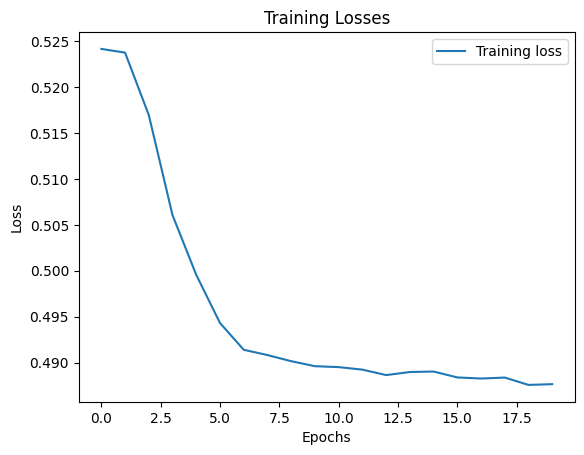

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [00:47<14:54, 47.08s/it]

-----------------


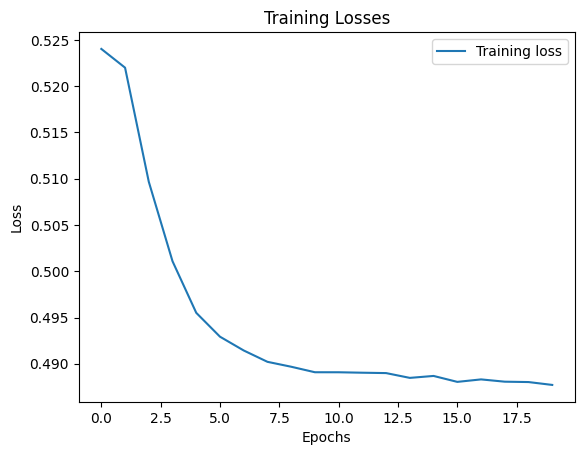

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [01:33<14:00, 46.68s/it]

-----------------


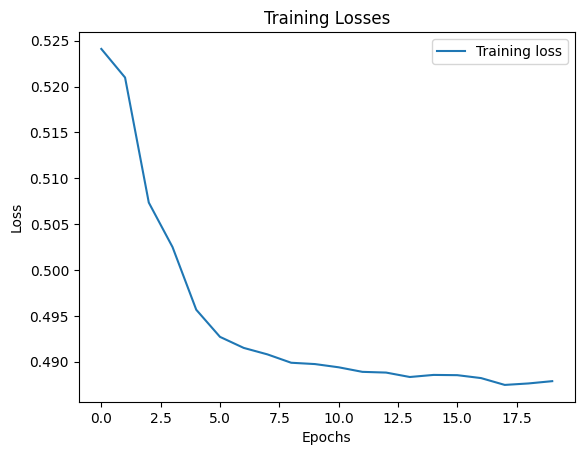

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [02:22<13:29, 47.63s/it]

-----------------


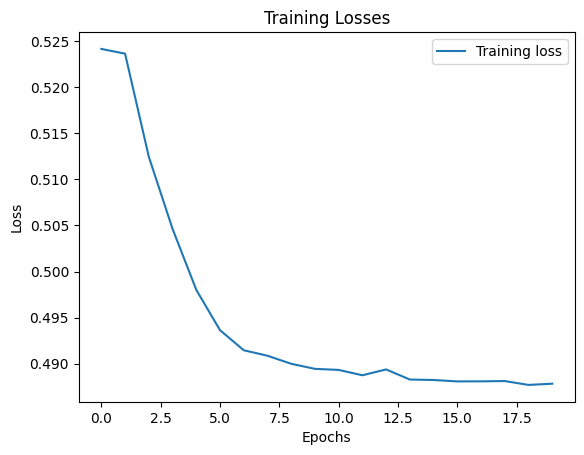

675/675 [==============================] - 1s 2ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [03:13<13:04, 49.03s/it]

-----------------


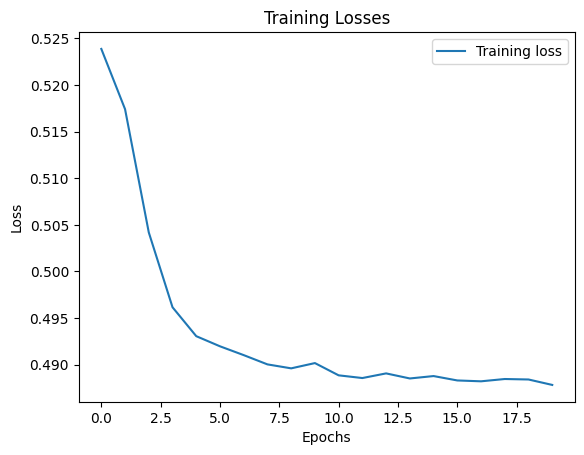

675/675 [==============================] - 1s 2ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [04:04<12:26, 49.77s/it]

-----------------


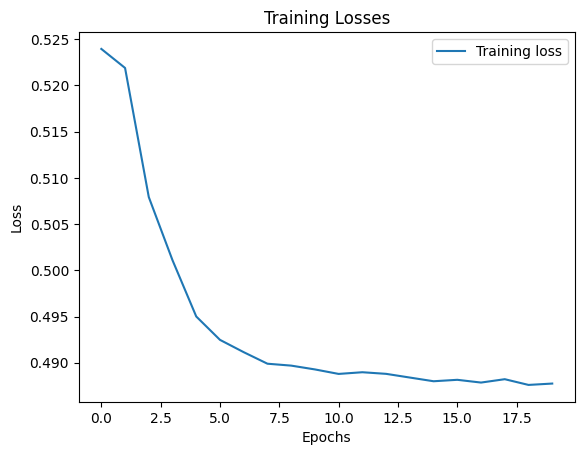

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [04:52<11:29, 49.24s/it]

-----------------


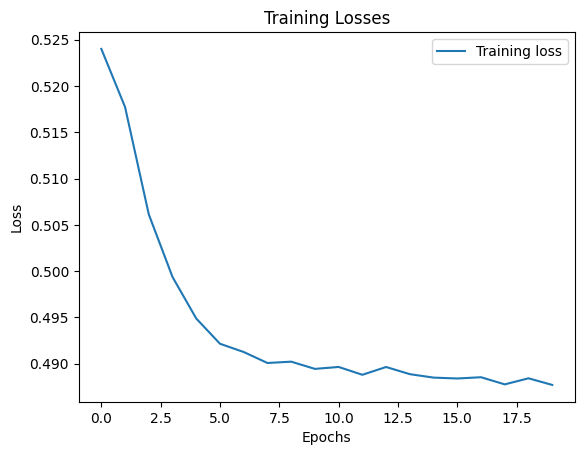

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [05:38<10:25, 48.09s/it]

-----------------


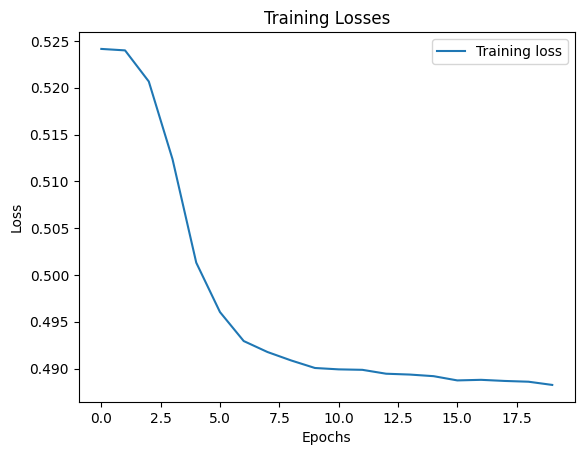

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [06:24<09:30, 47.53s/it]

-----------------


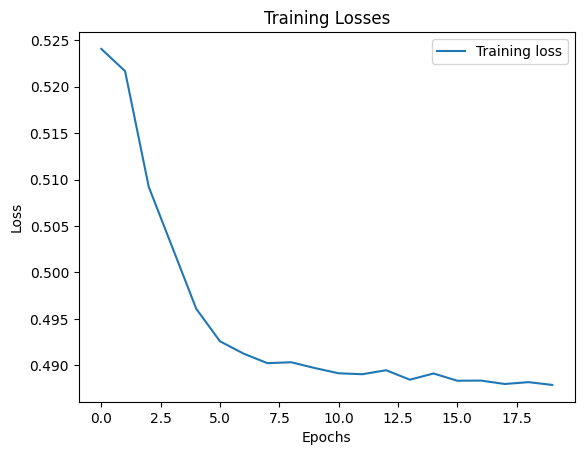

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [07:15<08:53, 48.46s/it]

-----------------


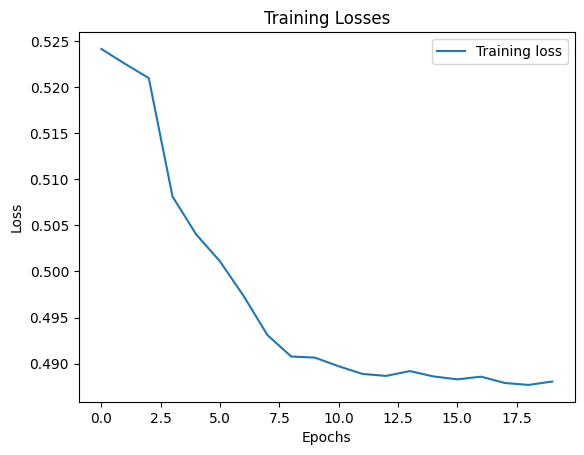

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [08:02<08:01, 48.19s/it]

-----------------


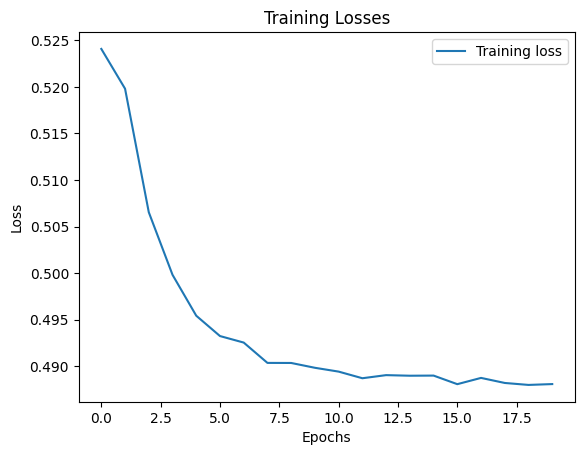

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [08:48<07:07, 47.52s/it]

-----------------


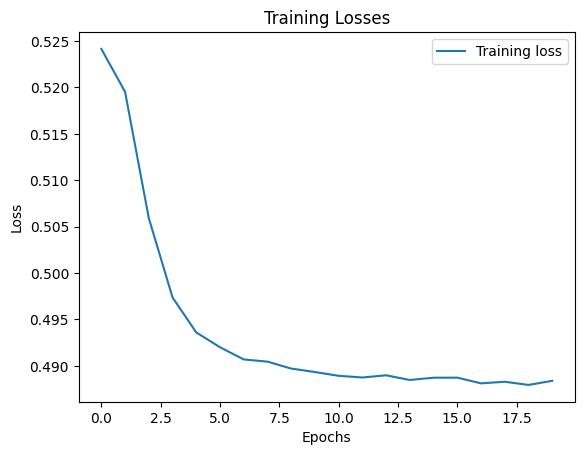

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [09:34<06:15, 46.91s/it]

-----------------


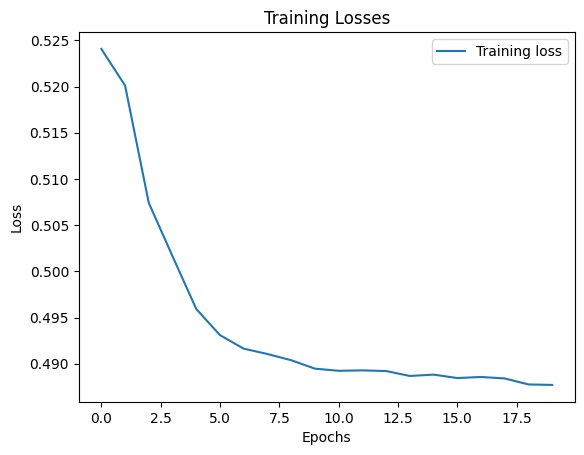

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [10:20<05:25, 46.55s/it]

-----------------


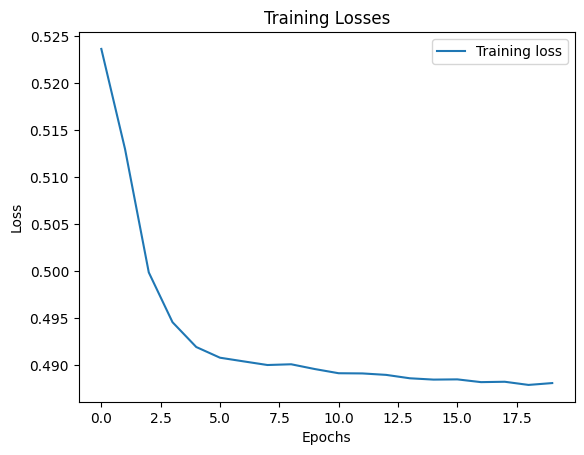

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [11:05<04:37, 46.22s/it]

-----------------


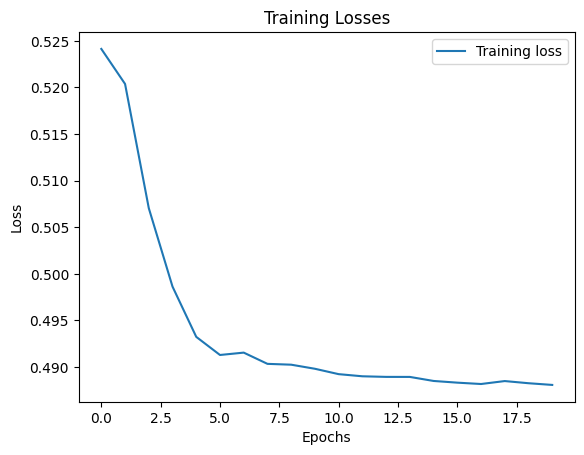

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [11:51<03:50, 46.02s/it]

-----------------


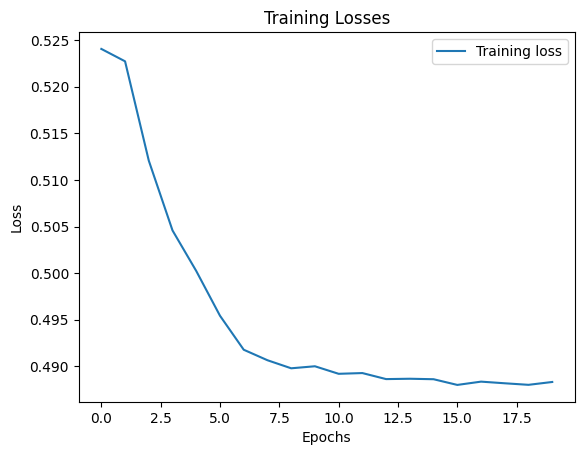

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [12:36<03:03, 45.90s/it]

-----------------


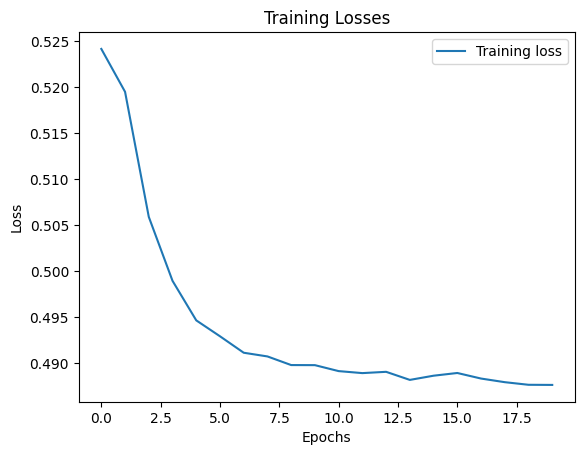

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [13:22<02:17, 45.87s/it]

-----------------


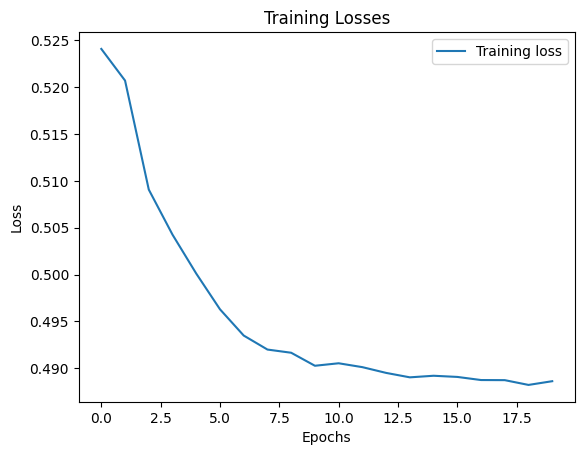

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [14:08<01:31, 45.83s/it]

-----------------


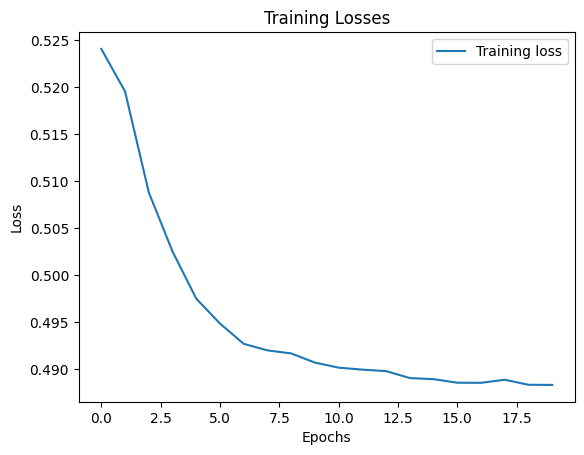

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [14:54<00:45, 45.81s/it]

-----------------


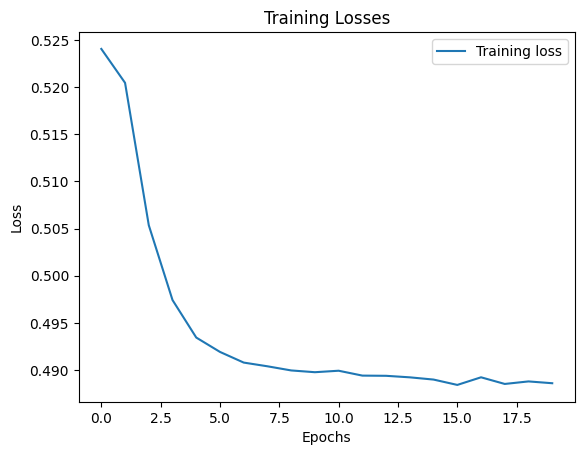

675/675 [==============================] - 1s 1ms/step


<ipython-input-75-0c157bc38ddd>:65: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [15:39<00:00, 46.99s/it]


In [ ]:
#CWoLa with T21 and relu

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21, )

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    print("-----------------")
    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    model_cwolaT21 = Sequential()
    model_cwolaT21.add(Dense(64, input_dim=N_inputs, activation='relu'))
    model_cwolaT21.add(Dense(64, activation='relu'))
    model_cwolaT21.add(Dense(64, activation='relu'))
    model_cwolaT21.add(Dense(1, activation='sigmoid'))
    model_cwolaT21.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


    hist_cwolaT21 = model_cwolaT21.fit(X_cwola_trainT21[:,1:], Y_cwola_trainT21, epochs=EPOCHS,
                                 batch_size=batch_size, verbose=0, sample_weight=W_cwola_trainT21)

    plt.plot(hist_cwolaT21.history['loss'], label='Training loss')
    plt.title('Training Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    # Evaluate the model
    scores_cwolaT21 = model_cwolaT21.predict(X_cwola_valT21[:,1:],batch_size=batch_size)
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores_cwolaT21)
    cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)

## CWoLa with T21, relu and Autoencoder 3 layers

  0%|          | 0/20 [00:00<?, ?it/s]

2322/2322 [==============================] - 6s 3ms/step


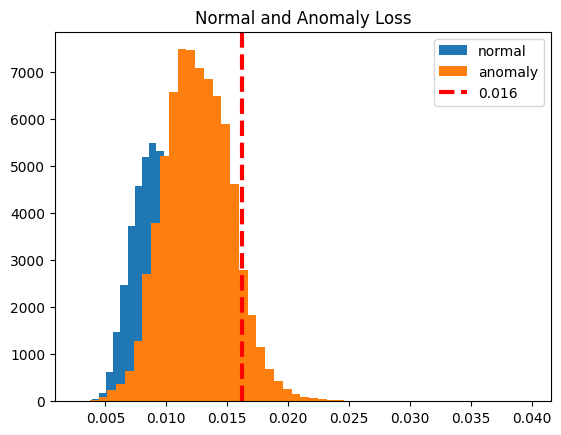

<ipython-input-42-c34a7330d774>:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [02:31<47:49, 151.05s/it]

Correctly predicted background E's: 58276 out of 60676 (96.04%)
Correctly predicted signal E's: 6460 out of 74299 (8.69%)
2322/2322 [==============================] - 6s 3ms/step


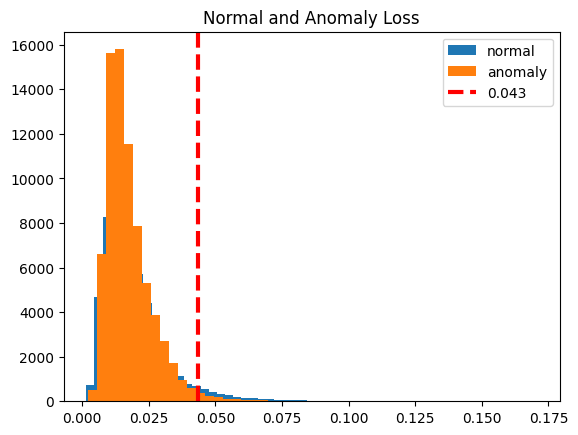

<ipython-input-42-c34a7330d774>:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [04:57<44:34, 148.57s/it]

Correctly predicted background E's: 57872 out of 60676 (95.38%)
Correctly predicted signal E's: 1100 out of 74299 (1.48%)
2322/2322 [==============================] - 6s 3ms/step


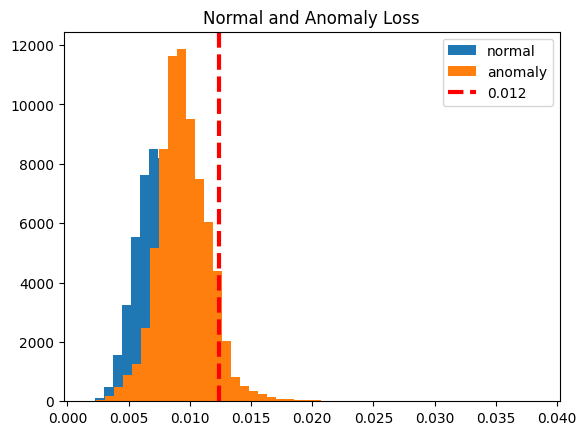

<ipython-input-42-c34a7330d774>:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [07:25<42:00, 148.28s/it]

Correctly predicted background E's: 58492 out of 60676 (96.40%)
Correctly predicted signal E's: 5642 out of 74299 (7.59%)
2322/2322 [==============================] - 6s 3ms/step


 15%|█▌        | 3/20 [09:26<53:28, 188.74s/it]


KeyboardInterrupt: ignored

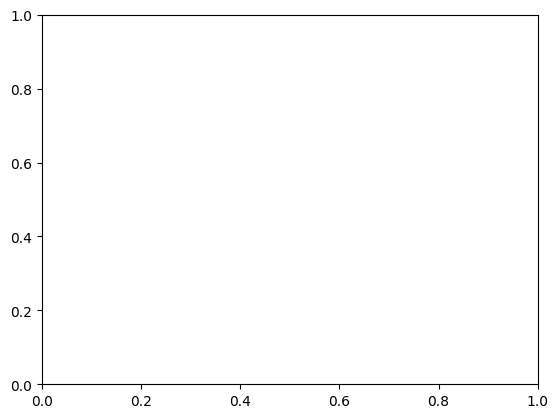

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    autoencoder = Sequential()
    autoencoder.add(Dense(512, input_dim=N_inputs, activation='relu'))
    autoencoder.add(Dense(256, activation='relu'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(64, activation='relu'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(16, activation='relu'))
    autoencoder.add(Dense(8, activation='relu'))
    autoencoder.add(Dense(16, activation='relu'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(64, activation='relu'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(256, activation='relu'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(N_inputs))
    autoencoder.compile(loss='mae', optimizer='adam')

    #autoencoder.summary()

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data

    hist_autoencoder = autoencoder.fit( background_train_data,
                                        background_train_data,
                                        epochs=EPOCHS,
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=0)

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    background_prediction = autoencoder.predict(background_validation_data, batch_size=batch_size)

    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data, batch_size=batch_size)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # Plot mae loss
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()

    # How well it predicts background events?
    background_predictions = tf.math.less(train_loss_background, threshold)
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    total_background = len(background_validation_data)
    percentage_back = (correct_background / total_background) * 100

    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # How well it predicts signal events?
    signal_predictions = tf.math.greater(train_loss_signal, threshold)
    result_signal_preds = tf.math.count_nonzero(signal_predictions)

    correct_signal = result_signal_preds.numpy()
    total_signal = len(signal_validation_data)
    percentage_signal = (correct_signal / total_signal) * 100

    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    true_labels = np.concatenate([np.zeros(len(background_prediction)), np.ones(len(signal_prediction))]);

    background_labels = [0 if background_prediction[i] < threshold else 1 for i in range(len(background_prediction))]
    # print(background_labels)
    signal_labels = [1 if signal_prediction[i] > threshold else 0 for i in range(len(signal_prediction))]
    # print(signal_labels)
    # print("Background errors: (RMSE) ", background_errors)
    # print("Signal errors: (RMSE) ", signal_errors)
    # # Create the labels array: 0 for background, 1 for signal
    # # Result: [0,0,0,0,0.....1,1,1,1,1] serves ass source of truth of the elements

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_prediction)), np.ones(len(signal_prediction))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([background_labels, signal_labels])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## CWoLa with T21 relu Autoencode 4 layers

  0%|          | 0/20 [00:00<?, ?it/s]

2322/2322 [==============================] - 7s 3ms/step


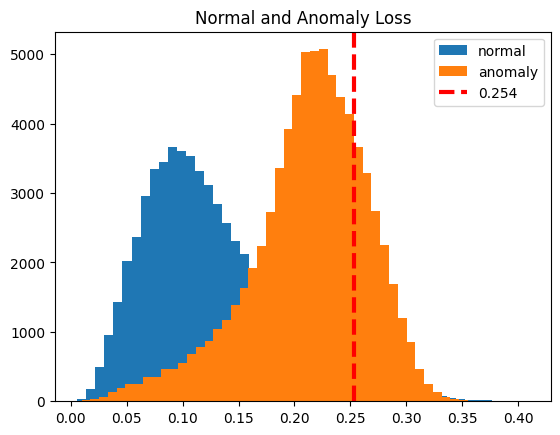

<ipython-input-43-843770305149>:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [03:24<1:04:38, 204.13s/it]

Correctly predicted background E's: 57835 out of 60676 (95.32%)
Correctly predicted signal E's: 16477 out of 74299 (22.18%)
2322/2322 [==============================] - 7s 3ms/step


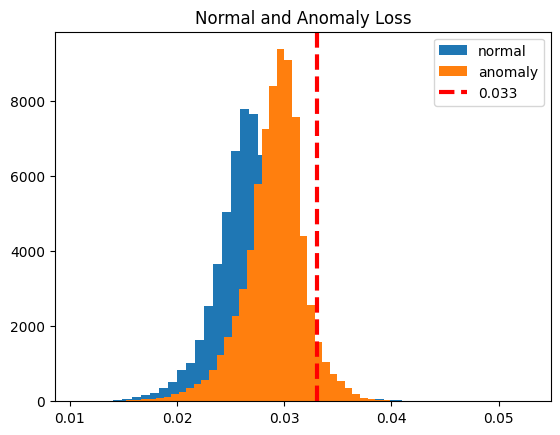

<ipython-input-43-843770305149>:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [06:46<1:00:52, 202.93s/it]

Correctly predicted background E's: 59000 out of 60676 (97.24%)
Correctly predicted signal E's: 3959 out of 74299 (5.33%)


 10%|█         | 2/20 [06:52<1:01:51, 206.17s/it]


KeyboardInterrupt: ignored

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    autoencoder = Sequential()
    autoencoder.add(Dense(512, input_dim=N_inputs, activation='relu'))
    autoencoder.add(Dense(256, activation='relu'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(64, activation='relu'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(16, activation='relu'))
    autoencoder.add(Dense(8, activation='relu'))
    autoencoder.add(Dense(16, activation='relu'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(64, activation='relu'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(256, activation='relu'))
    autoencoder.add(Dense(512, activation='sigmoid'))
    autoencoder.add(Dense(N_inputs))
    autoencoder.compile(loss='mae', optimizer='adam')

    #autoencoder.summary()

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data

    hist_autoencoder = autoencoder.fit( background_train_data,
                                        background_train_data,
                                        epochs=EPOCHS,
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=0)

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    background_prediction = autoencoder.predict(background_validation_data, batch_size=batch_size)

    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data, batch_size=batch_size)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # Plot mae loss
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()

    # How well it predicts background events?
    background_predictions = tf.math.less(train_loss_background, threshold)
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    total_background = len(background_validation_data)
    percentage_back = (correct_background / total_background) * 100

    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # How well it predicts signal events?
    signal_predictions = tf.math.greater(train_loss_signal, threshold)
    result_signal_preds = tf.math.count_nonzero(signal_predictions)

    correct_signal = result_signal_preds.numpy()
    total_signal = len(signal_validation_data)
    percentage_signal = (correct_signal / total_signal) * 100

    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    true_labels = np.concatenate([np.zeros(len(background_errors)), np.ones(len(signal_errors))]);

    background_labels = [0 if background_errors[i] < threshold else 1 for i in range(len(background_errors))]
    # print(background_labels)
    signal_labels = [1 if signal_errors[i] > threshold else 0 for i in range(len(signal_errors))]
    # print(signal_labels)
    # print("Background errors: (RMSE) ", background_errors)
    # print("Signal errors: (RMSE) ", signal_errors)
    # # Create the labels array: 0 for background, 1 for signal
    # # Result: [0,0,0,0,0.....1,1,1,1,1] serves ass source of truth of the elements

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_errors)), np.ones(len(signal_errors))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([background_labels, signal_labels])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Prepare ROC Curve for CWoLa with Autoencoders 3 layer

  0%|          | 0/20 [00:00<?, ?it/s]

2322/2322 [==============================] - 9s 4ms/step


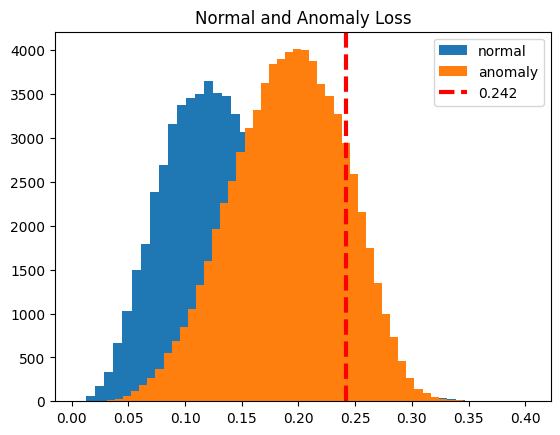

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [04:24<1:23:37, 264.06s/it]

Correctly predicted background E's: 58434 out of 60676 (96.30%)
Correctly predicted signal E's: 11812 out of 74299 (15.90%)
2322/2322 [==============================] - 9s 4ms/step


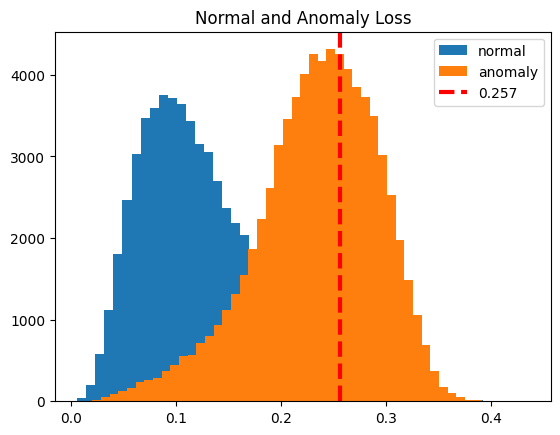

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [07:55<1:10:00, 233.37s/it]

Correctly predicted background E's: 57830 out of 60676 (95.31%)
Correctly predicted signal E's: 28271 out of 74299 (38.05%)
2322/2322 [==============================] - 9s 4ms/step


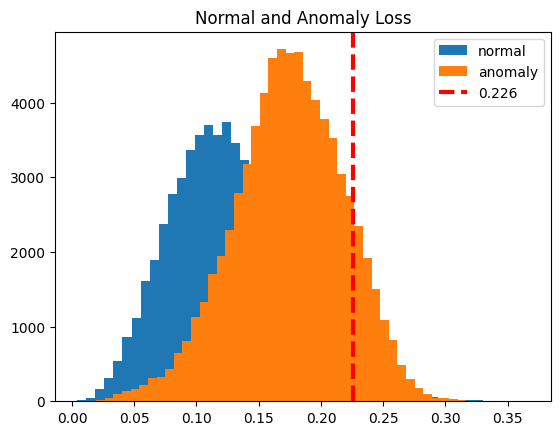

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [11:30<1:03:39, 224.70s/it]

Correctly predicted background E's: 58409 out of 60676 (96.26%)
Correctly predicted signal E's: 9223 out of 74299 (12.41%)
2322/2322 [==============================] - 9s 4ms/step


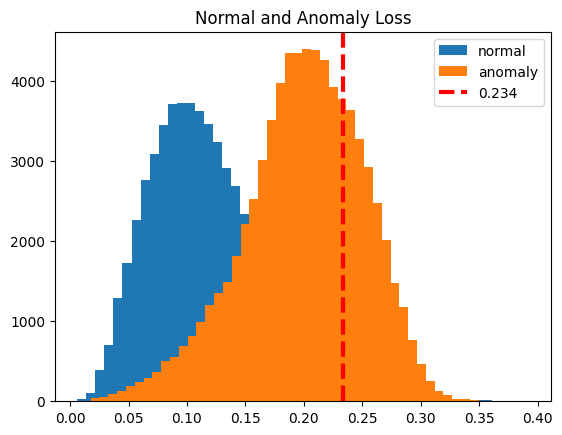

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [15:07<59:08, 221.76s/it]  

Correctly predicted background E's: 57897 out of 60676 (95.42%)
Correctly predicted signal E's: 20166 out of 74299 (27.14%)
2322/2322 [==============================] - 9s 4ms/step


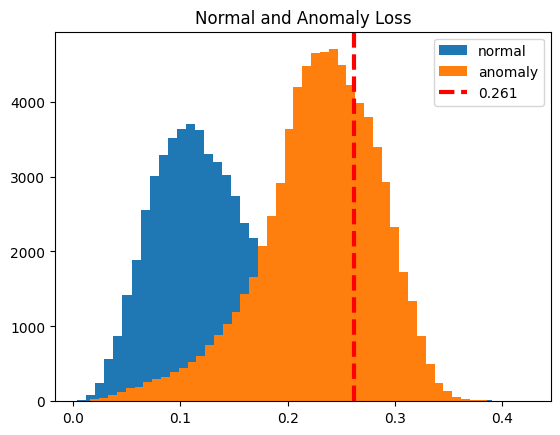

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [18:39<54:33, 218.21s/it]

Correctly predicted background E's: 57917 out of 60676 (95.45%)
Correctly predicted signal E's: 22107 out of 74299 (29.75%)
2322/2322 [==============================] - 9s 4ms/step


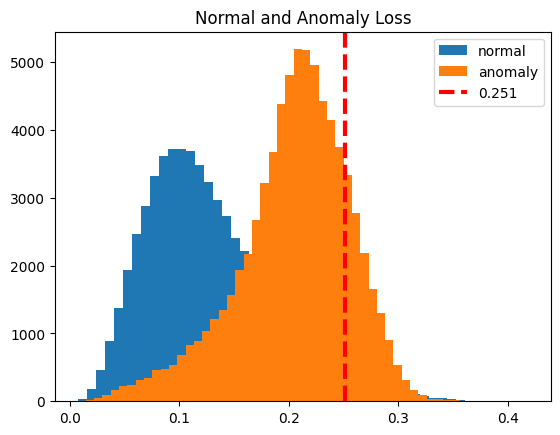

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [22:16<50:48, 217.72s/it]

Correctly predicted background E's: 57848 out of 60676 (95.34%)
Correctly predicted signal E's: 12779 out of 74299 (17.20%)
2322/2322 [==============================] - 10s 4ms/step


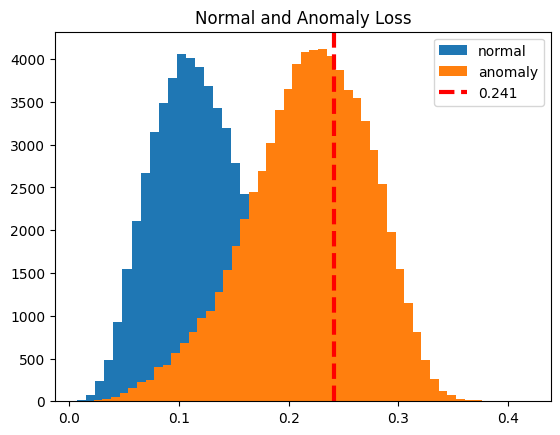

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [25:53<47:07, 217.49s/it]

Correctly predicted background E's: 57916 out of 60676 (95.45%)
Correctly predicted signal E's: 26934 out of 74299 (36.25%)
2322/2322 [==============================] - 10s 4ms/step


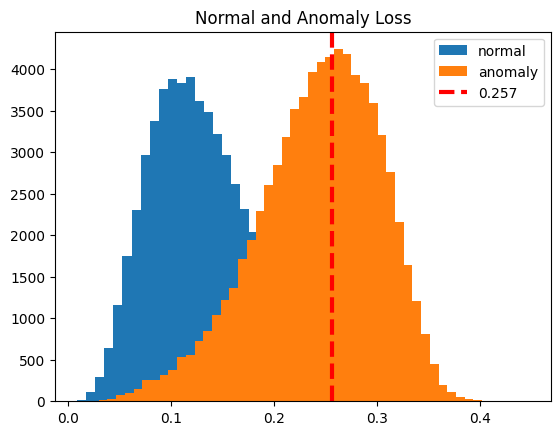

<ipython-input-44-459484dbb361>:147: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [29:47<44:34, 222.85s/it]

Correctly predicted background E's: 58019 out of 60676 (95.62%)
Correctly predicted signal E's: 33303 out of 74299 (44.82%)


 40%|████      | 8/20 [30:58<46:27, 232.30s/it]


KeyboardInterrupt: ignored

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    autoencoder = Sequential()
    autoencoder.add(Dense(512, input_dim=N_inputs, activation='relu'))
    autoencoder.add(Dense(256, activation='sigmoid'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(64, activation='sigmoid'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(16, activation='sigmoid'))
    autoencoder.add(Dense(8, activation='relu'))
    autoencoder.add(Dense(16, activation='sigmoid'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(64, activation='sigmoid'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(256, activation='sigmoid'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(1024, activation='sigmoid'))
    autoencoder.add(Dense(N_inputs))
    autoencoder.compile(loss='mae', optimizer='adam')

    #autoencoder.summary()

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data

    hist_autoencoder = autoencoder.fit( background_train_data,
                                        background_train_data,
                                        epochs=EPOCHS,
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=0)

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    background_prediction = autoencoder.predict(background_validation_data, batch_size=batch_size)

    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data, batch_size=batch_size)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # Plot mae loss
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()

    # How well it predicts background events?
    background_predictions = tf.math.less(train_loss_background, threshold)
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    total_background = len(background_validation_data)
    percentage_back = (correct_background / total_background) * 100

    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # How well it predicts signal events?
    signal_predictions = tf.math.greater(train_loss_signal, threshold)
    result_signal_preds = tf.math.count_nonzero(signal_predictions)

    correct_signal = result_signal_preds.numpy()
    total_signal = len(signal_validation_data)
    percentage_signal = (correct_signal / total_signal) * 100

    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    true_labels = np.concatenate([np.zeros(len(background_errors)), np.ones(len(signal_errors))]);

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_errors)), np.ones(len(signal_errors))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


  0%|          | 0/20 [00:00<?, ?it/s]

2322/2322 [==============================] - 13s 5ms/step


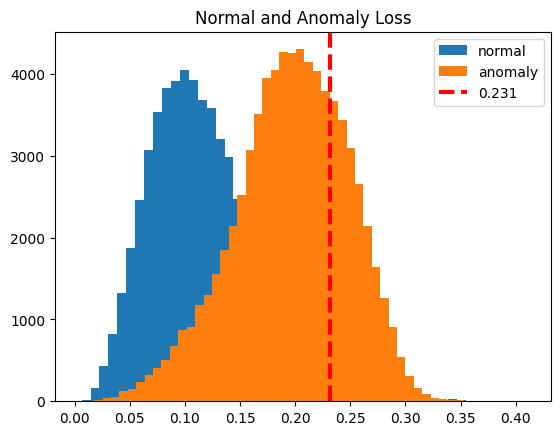

Correctly predicted background E's: 57969 out of 60676 (95.54%)
Correctly predicted signal E's: 20098 out of 74299 (27.05%)


<ipython-input-18-7b012a3b1a9f>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [50:20<15:56:34, 3020.75s/it]


KeyboardInterrupt: ignored

In [ ]:
# Last layer Sigmoid
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    autoencoder = Sequential()
    autoencoder.add(Dense(8192, input_dim=N_inputs, activation='relu'))
    autoencoder.add(Dense(4096, activation='sigmoid'))
    autoencoder.add(Dense(2048, activation='relu'))
    autoencoder.add(Dense(1024, activation='sigmoid'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(256, activation='sigmoid'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(64, activation='sigmoid'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(16, activation='sigmoid'))
    autoencoder.add(Dense(8, activation='relu'))
    autoencoder.add(Dense(16, activation='sigmoid'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(64, activation='sigmoid'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(256, activation='sigmoid'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(1024, activation='sigmoid'))
    autoencoder.add(Dense(2048, activation='relu'))
    autoencoder.add(Dense(4096, activation='sigmoid'))
    autoencoder.add(Dense(8192, activation='relu'))
    autoencoder.add(Dense(N_inputs))
    autoencoder.compile(loss='mae', optimizer='adam')

    #autoencoder.summary()

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data

    hist_autoencoder = autoencoder.fit( background_train_data,
                                        background_train_data,
                                        epochs=50,
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=0)

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    background_prediction = autoencoder.predict(background_validation_data, batch_size=batch_size)

    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data, batch_size=batch_size)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # Plot mae loss
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()

    # How well it predicts background events?
    background_predictions = tf.math.less(train_loss_background, threshold)
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    total_background = len(background_validation_data)
    percentage_back = (correct_background / total_background) * 100

    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # How well it predicts signal events?
    signal_predictions = tf.math.greater(train_loss_signal, threshold)
    result_signal_preds = tf.math.count_nonzero(signal_predictions)

    correct_signal = result_signal_preds.numpy()
    total_signal = len(signal_validation_data)
    percentage_signal = (correct_signal / total_signal) * 100

    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    true_labels = np.concatenate([np.zeros(total_background), np.ones(total_signal)]);

    background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # print(background_labels)
    signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]
    # print(signal_labels)
    # print("Background errors: (RMSE) ", background_errors)
    # print("Signal errors: (RMSE) ", signal_errors)
    # # Create the labels array: 0 for background, 1 for signal
    # # Result: [0,0,0,0,0.....1,1,1,1,1] serves ass source of truth of the elements

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_prediction)), np.ones(len(signal_prediction))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([background_labels, signal_labels])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## A lot of layers. 1/2 relu, 1/2 sigmoid MAE

---



In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    autoencoder = Sequential()
    autoencoder.add(Dense(8192, input_dim=N_inputs, activation='relu'))
    autoencoder.add(Dense(4096, activation='sigmoid'))
    autoencoder.add(Dense(2048, activation='relu'))
    autoencoder.add(Dense(1024, activation='sigmoid'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(256, activation='sigmoid'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(64, activation='sigmoid'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(16, activation='sigmoid'))
    autoencoder.add(Dense(8, activation='relu'))
    autoencoder.add(Dense(4, activation='sigmoid'))
    autoencoder.add(Dense(2, activation='relu'))
    autoencoder.add(Dense(4, activation='sigmoid'))
    autoencoder.add(Dense(8, activation='relu'))
    autoencoder.add(Dense(16, activation='sigmoid'))
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(Dense(64, activation='sigmoid'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(256, activation='sigmoid'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(1024, activation='sigmoid'))
    autoencoder.add(Dense(2048, activation='relu'))
    autoencoder.add(Dense(4096, activation='sigmoid'))
    autoencoder.add(Dense(8192, activation='relu'))
    autoencoder.add(Dense(N_inputs))

    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, mode="min")
    autoencoder.compile(loss='mae', optimizer='adam')

    #autoencoder.summary()

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data,
                                        background_train_data,
                                        epochs=50,
                                        validation_data=(background_validation_data, background_validation_data),
                                        callbacks=[early_stopping],
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=0)


    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data, batch_size=batch_size)

    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data, batch_size=batch_size)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    #reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    # train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # Plot mae loss
    # plt.hist(train_loss_background, bins=50, label='normal')
    # plt.hist(train_loss_signal, bins=50, label='anomaly')
    # plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    # plt.legend(loc='upper right')
    # plt.title("Normal and Anomaly Loss")
    # plt.show()

    total_background = len(background_validation_data)
    # How well it predicts background events?
    # background_predictions = tf.math.less(train_loss_background, threshold)
    # res_background_preds = tf.math.count_nonzero(background_predictions)
    # correct_background = res_background_preds.numpy()

    # percentage_back = (correct_background / total_background) * 100

    # print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # How well it predicts signal events?
    # signal_predictions = tf.math.greater(train_loss_signal, threshold)
    # result_signal_preds = tf.math.count_nonzero(signal_predictions)

    # correct_signal = result_signal_preds.numpy()
    # total_signal = len(signal_validation_data)
    # percentage_signal = (correct_signal / total_signal) * 100

    # print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    #true_labels = np.concatenate([np.zeros(total_background), np.ones(total_signal)]);

    background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # print(background_labels)
    signal_labels = [1 if train_loss_background[i] > threshold else 0 for i in range(total_background)]
    # print(signal_labels)
    # print("Background errors: (RMSE) ", background_errors)
    # print("Signal errors: (RMSE) ", signal_errors)
    # # Create the labels array: 0 for background, 1 for signal
    # # Result: [0,0,0,0,0.....1,1,1,1,1] serves ass source of truth of the elements

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_labels)), np.ones(len(signal_labels))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([background_labels, signal_labels])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


  0%|          | 0/20 [00:00<?, ?it/s]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [02:19<44:07, 139.36s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [04:28<39:58, 133.24s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [06:29<36:13, 127.85s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [08:55<35:56, 134.79s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [10:38<30:52, 123.48s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [13:28<32:31, 139.36s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [15:22<28:23, 131.06s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [17:40<26:36, 133.05s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [19:57<24:39, 134.46s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [21:41<20:50, 125.03s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [23:43<18:36, 124.07s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [25:52<16:44, 125.55s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [27:44<14:09, 121.39s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [30:00<12:35, 125.98s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [31:44<09:55, 119.17s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [33:28<07:38, 114.73s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [35:37<05:56, 118.92s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [37:47<04:04, 122.19s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [39:55<02:04, 124.12s/it]

372/372 [==============================] - 2s 4ms/step


<ipython-input-11-dd32b236f6fb>:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_th1 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [43:03<00:00, 129.20s/it]


## A lot of layers MAE with encoding untill 32 with 4 barchnormalization.

  0%|          | 0/20 [00:00<?, ?it/s]

2322/2322 [==============================] - 5s 2ms/step


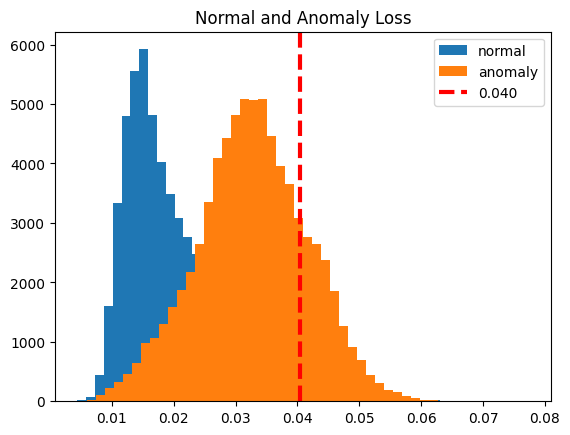

<ipython-input-16-048a3005bcd4>:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [05:15<1:39:55, 315.53s/it]


KeyboardInterrupt: ignored

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    # Building and Training the Model.
    # IVAN COMMENT. Instead of training a simple NN do an autoencoder trianing
    autoencoder = Sequential()
    autoencoder.add(Dense(8192, input_dim=N_inputs, activation='relu'))
    autoencoder.add(BatchNormalization())
    autoencoder.add(Dense(4096, activation='relu'))
    autoencoder.add(Dense(2048, activation='relu'))
    autoencoder.add(Dense(1024, activation='relu'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(256, activation='relu'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(64, activation='relu'))
    autoencoder.add(BatchNormalization())
    autoencoder.add(Dense(32, activation='relu'))
    autoencoder.add(BatchNormalization())
    autoencoder.add(Dense(64, activation='relu'))
    autoencoder.add(Dense(128, activation='relu'))
    autoencoder.add(Dense(256, activation='relu'))
    autoencoder.add(Dense(512, activation='relu'))
    autoencoder.add(Dense(1024, activation='relu'))
    autoencoder.add(Dense(2048, activation='relu'))
    autoencoder.add(Dense(4096, activation='relu'))
    autoencoder.add(BatchNormalization())
    autoencoder.add(Dense(8192, activation='sigmoid'))
    autoencoder.add(Dense(N_inputs))

    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, mode="min")
    autoencoder.compile(loss='mae', optimizer='adam')

    #autoencoder.summary()

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data,
                                        background_train_data,
                                        epochs=20,
                                        validation_data=(background_validation_data, background_validation_data),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=0)


    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data, batch_size=batch_size)

    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data, batch_size=batch_size)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # Plot mae loss
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()

    total_background = len(background_validation_data)
    # How well it predicts background events?
    # background_predictions = tf.math.less(train_loss_background, threshold)
    # res_background_preds = tf.math.count_nonzero(background_predictions)
    # correct_background = res_background_preds.numpy()

    # percentage_back = (correct_background / total_background) * 100

    # print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # How well it predicts signal events?
    # signal_predictions = tf.math.greater(train_loss_signal, threshold)
    # result_signal_preds = tf.math.count_nonzero(signal_predictions)

    # correct_signal = result_signal_preds.numpy()
    # total_signal = len(signal_validation_data)
    # percentage_signal = (correct_signal / total_signal) * 100

    # print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    #true_labels = np.concatenate([np.zeros(total_background), np.ones(total_signal)]);

    background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # print(background_labels)
    signal_labels = [1 if train_loss_background[i] > threshold else 0 for i in range(total_background)]
    # print(signal_labels)
    # print("Background errors: (RMSE) ", background_errors)
    # print("Signal errors: (RMSE) ", signal_errors)
    # # Create the labels array: 0 for background, 1 for signal
    # # Result: [0,0,0,0,0.....1,1,1,1,1] serves ass source of truth of the elements

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_labels)), np.ones(len(signal_labels))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([background_labels, signal_labels])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Split autoencoder and decoder to add callbacks

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/50
507/507 [==============================] - 27s 22ms/step - loss: 0.0196 - acc: 0.3863 - val_loss: 0.0356 - val_acc: 0.5848 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3647 - val_loss: 0.0437 - val_acc: 0.1272 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3588 - val_loss: 0.0358 - val_acc: 0.2090 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0175 - acc: 0.3546 - val_loss: 0.0416 - val_acc: 0.2090 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3632 - val_loss: 0.0440 - val_acc: 0.2090 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0174 - acc: 0.3588 - val_loss: 0.0365 - val_acc: 0.5848 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0160 - acc: 0.4194 - val_loss: 0.0407 - val_ac

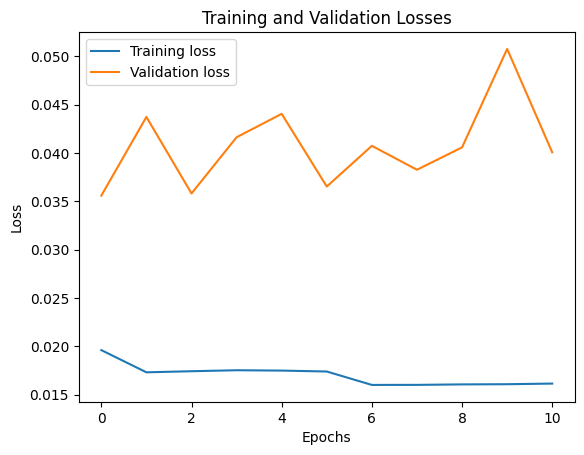

2322/2322 [==============================] - 6s 3ms/step


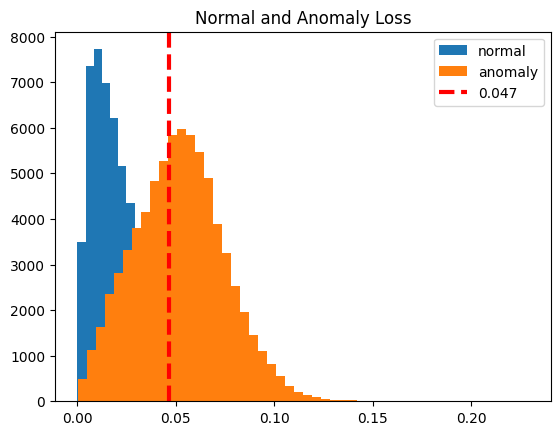

Correctly predicted background E's: 52557 out of 60676 (86.62%)
Correctly predicted signal E's: 43721 out of 74299 (58.84%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [05:22<1:42:14, 322.85s/it]

Epoch 1/50
507/507 [==============================] - 10s 11ms/step - loss: 0.0227 - acc: 0.4037 - val_loss: 0.0426 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0167 - acc: 0.3839 - val_loss: 0.0412 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0174 - acc: 0.3618 - val_loss: 0.0379 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0175 - acc: 0.3599 - val_loss: 0.0455 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3624 - val_loss: 0.0384 - val_acc: 0.5849 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3645 - val_loss: 0.0488 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0174 - acc: 0.3626 - val_loss: 0.0425 - val_ac

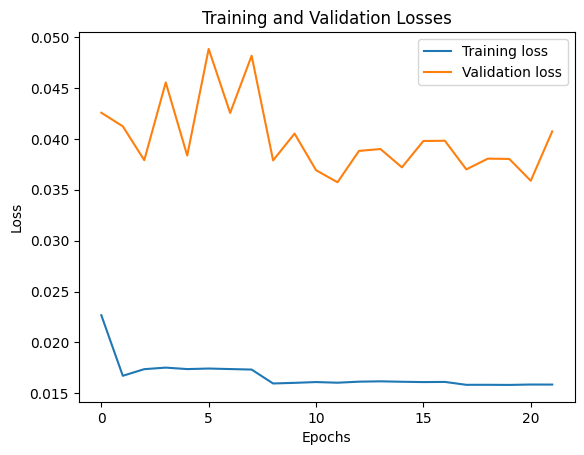

2322/2322 [==============================] - 7s 3ms/step


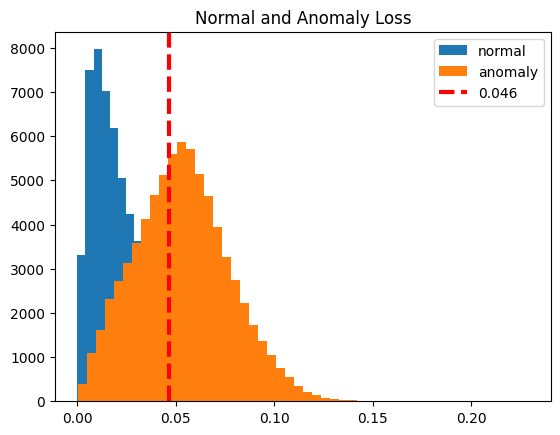

Correctly predicted background E's: 52479 out of 60676 (86.49%)
Correctly predicted signal E's: 45087 out of 74299 (60.68%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [10:41<1:36:03, 320.20s/it]

Epoch 1/50
507/507 [==============================] - 11s 13ms/step - loss: 0.0215 - acc: 0.3963 - val_loss: 0.0458 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0169 - acc: 0.3728 - val_loss: 0.0357 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3657 - val_loss: 0.0356 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0172 - acc: 0.3654 - val_loss: 0.0549 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3539 - val_loss: 0.0375 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0174 - acc: 0.3737 - val_loss: 0.0485 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0175 - acc: 0.3511 - val_loss: 0.0346 - val_ac

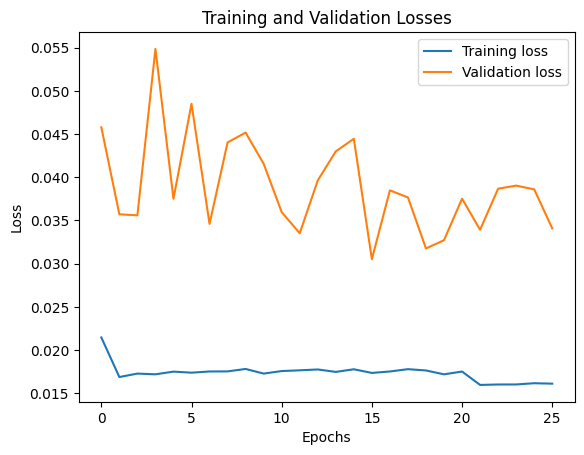

2322/2322 [==============================] - 6s 3ms/step


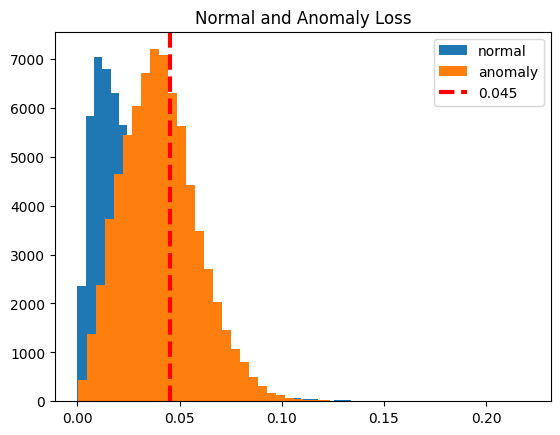

Correctly predicted background E's: 52142 out of 60676 (85.94%)
Correctly predicted signal E's: 27495 out of 74299 (37.01%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [16:58<1:38:06, 346.24s/it]

Epoch 1/50
507/507 [==============================] - 12s 15ms/step - loss: 0.0202 - acc: 0.3929 - val_loss: 0.0323 - val_acc: 0.5847 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0172 - acc: 0.3670 - val_loss: 0.0457 - val_acc: 0.2090 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0174 - acc: 0.3587 - val_loss: 0.0551 - val_acc: 0.2090 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0178 - acc: 0.3523 - val_loss: 0.0414 - val_acc: 0.2090 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0174 - acc: 0.3614 - val_loss: 0.0441 - val_acc: 0.2090 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0174 - acc: 0.3563 - val_loss: 0.0373 - val_acc: 0.5847 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0160 - acc: 0.4185 - val_loss: 0.0382 - val_ac

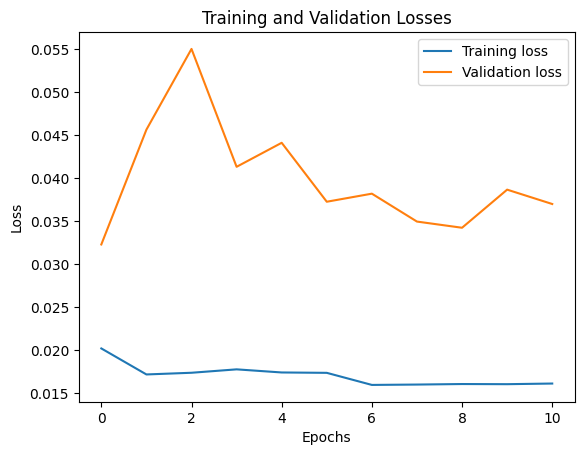

2322/2322 [==============================] - 6s 3ms/step


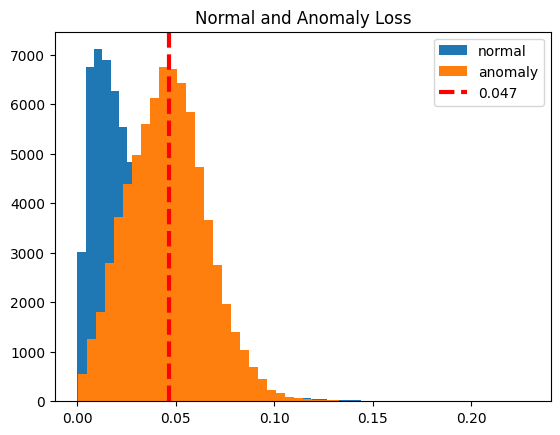

Correctly predicted background E's: 52487 out of 60676 (86.50%)
Correctly predicted signal E's: 35125 out of 74299 (47.28%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [21:04<1:21:47, 306.71s/it]

Epoch 1/50
507/507 [==============================] - 12s 11ms/step - loss: 0.0196 - acc: 0.3869 - val_loss: 0.0386 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0171 - acc: 0.3719 - val_loss: 0.0417 - val_acc: 0.1272 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0175 - acc: 0.3528 - val_loss: 0.0502 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3525 - val_loss: 0.0348 - val_acc: 0.5848 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0177 - acc: 0.3508 - val_loss: 0.0512 - val_acc: 0.1272 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3732 - val_loss: 0.0459 - val_acc: 0.1272 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0176 - acc: 0.3560 - val_loss: 0.0447 - val_ac

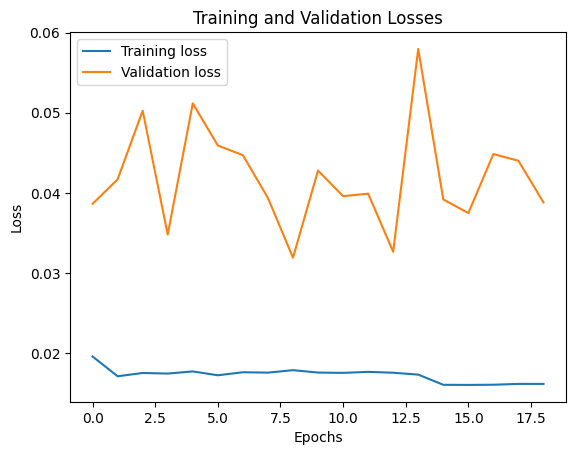

2322/2322 [==============================] - 5s 2ms/step


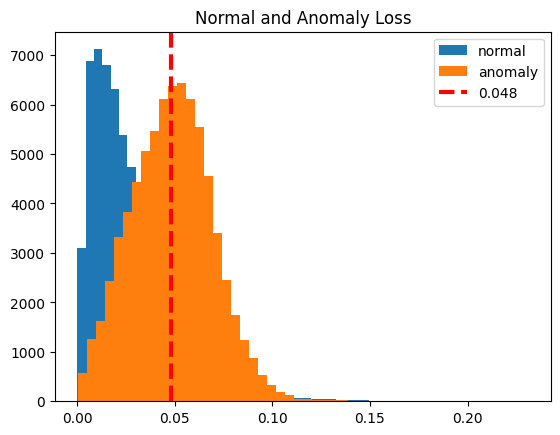

Correctly predicted background E's: 52520 out of 60676 (86.56%)
Correctly predicted signal E's: 38165 out of 74299 (51.37%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [25:58<1:15:34, 302.28s/it]

Epoch 1/50
507/507 [==============================] - 15s 16ms/step - loss: 0.0197 - acc: 0.3978 - val_loss: 0.0365 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0171 - acc: 0.3709 - val_loss: 0.0362 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 9s 17ms/step - loss: 0.0174 - acc: 0.3566 - val_loss: 0.0540 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0173 - acc: 0.3640 - val_loss: 0.0494 - val_acc: 0.1272 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0178 - acc: 0.3545 - val_loss: 0.0573 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0175 - acc: 0.3583 - val_loss: 0.0393 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3634 - val_loss: 0.0455 - val_ac

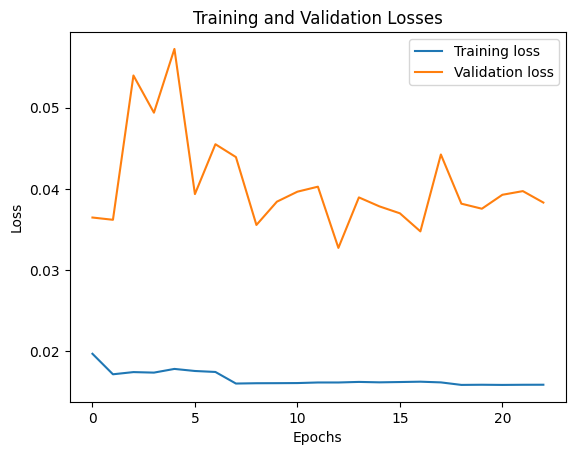

2322/2322 [==============================] - 6s 2ms/step


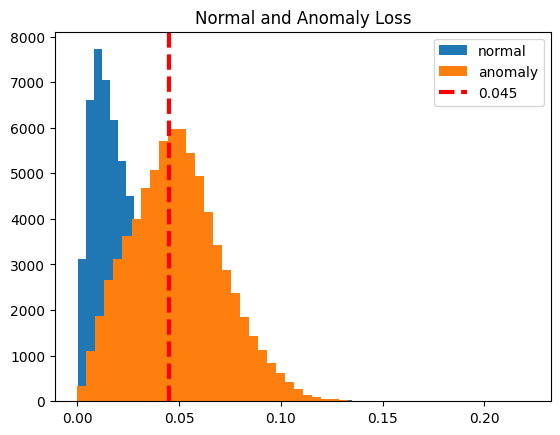

Correctly predicted background E's: 52452 out of 60676 (86.45%)
Correctly predicted signal E's: 40894 out of 74299 (55.04%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [32:12<1:16:12, 326.62s/it]

Epoch 1/50
507/507 [==============================] - 11s 14ms/step - loss: 0.0201 - acc: 0.3967 - val_loss: 0.0351 - val_acc: 0.2088 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0171 - acc: 0.3658 - val_loss: 0.0374 - val_acc: 0.2088 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0172 - acc: 0.3649 - val_loss: 0.0365 - val_acc: 0.2088 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0176 - acc: 0.3555 - val_loss: 0.0412 - val_acc: 0.2088 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0173 - acc: 0.3686 - val_loss: 0.0484 - val_acc: 0.2088 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0177 - acc: 0.3523 - val_loss: 0.0329 - val_acc: 0.5849 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0175 - acc: 0.3485 - val_loss: 0.0388 - val_ac

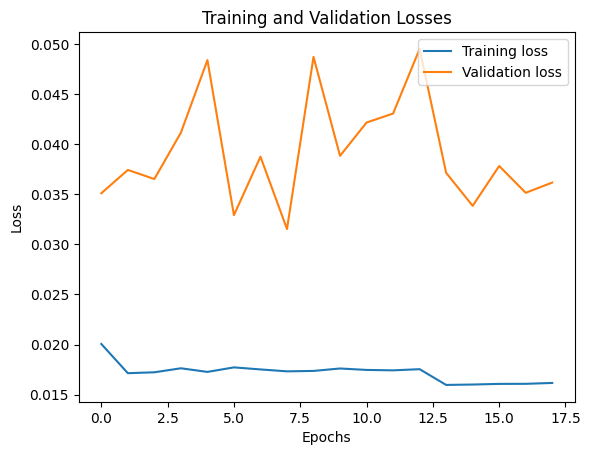

2322/2322 [==============================] - 5s 2ms/step


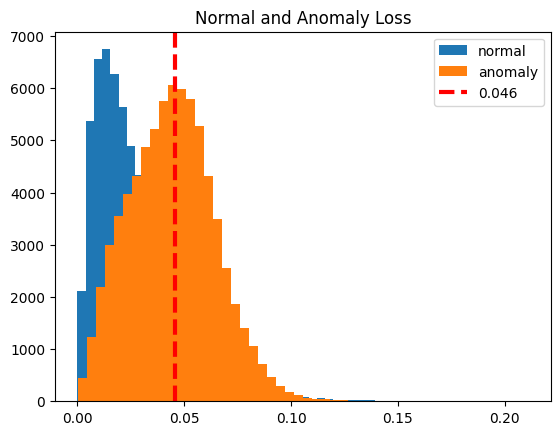

Correctly predicted background E's: 52392 out of 60676 (86.35%)
Correctly predicted signal E's: 35165 out of 74299 (47.33%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [37:04<1:08:19, 315.33s/it]

Epoch 1/50
507/507 [==============================] - 11s 12ms/step - loss: 0.0202 - acc: 0.3888 - val_loss: 0.0408 - val_acc: 0.1272 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0171 - acc: 0.3723 - val_loss: 0.0396 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0172 - acc: 0.3634 - val_loss: 0.0463 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3691 - val_loss: 0.0360 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0175 - acc: 0.3609 - val_loss: 0.0351 - val_acc: 0.5849 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0176 - acc: 0.3464 - val_loss: 0.0423 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0178 - acc: 0.3479 - val_loss: 0.0426 - val_ac

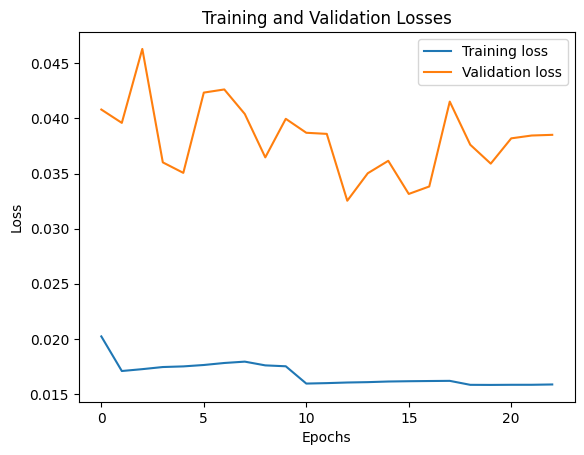

2322/2322 [==============================] - 5s 2ms/step


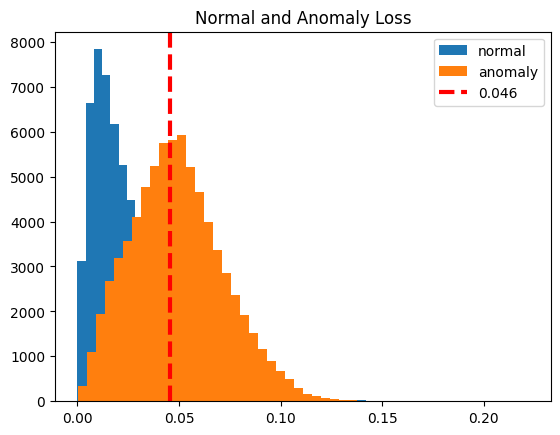

Correctly predicted background E's: 52403 out of 60676 (86.37%)
Correctly predicted signal E's: 40108 out of 74299 (53.98%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [42:33<1:03:54, 319.50s/it]

Epoch 1/50
507/507 [==============================] - 11s 14ms/step - loss: 0.0202 - acc: 0.3938 - val_loss: 0.0449 - val_acc: 0.2090 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0170 - acc: 0.3747 - val_loss: 0.0392 - val_acc: 0.2090 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0173 - acc: 0.3638 - val_loss: 0.0357 - val_acc: 0.5847 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0174 - acc: 0.3507 - val_loss: 0.0448 - val_acc: 0.2090 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3520 - val_loss: 0.0334 - val_acc: 0.2090 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0175 - acc: 0.3535 - val_loss: 0.0333 - val_acc: 0.2090 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0176 - acc: 0.3566 - val_loss: 0.0346 - val_ac

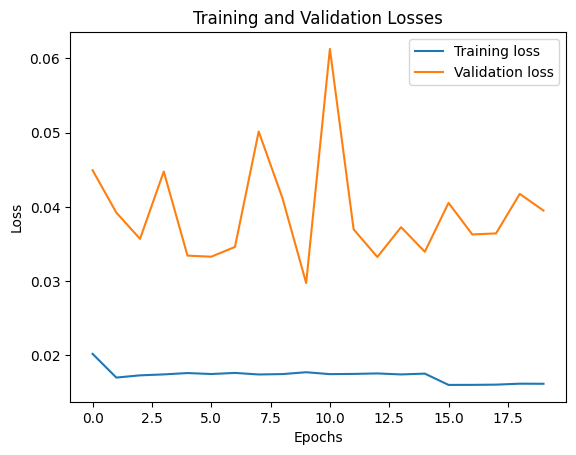

2322/2322 [==============================] - 7s 3ms/step


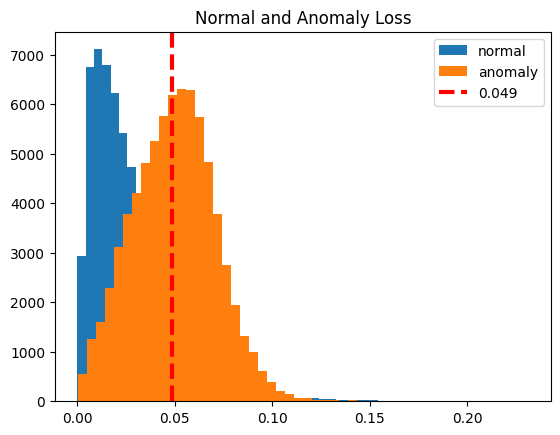

Correctly predicted background E's: 52554 out of 60676 (86.61%)
Correctly predicted signal E's: 38907 out of 74299 (52.37%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [47:46<58:14, 317.64s/it]  

Epoch 1/50
507/507 [==============================] - 12s 13ms/step - loss: 0.0201 - acc: 0.3873 - val_loss: 0.0433 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0171 - acc: 0.3645 - val_loss: 0.0359 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0172 - acc: 0.3639 - val_loss: 0.0407 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0175 - acc: 0.3556 - val_loss: 0.0384 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0176 - acc: 0.3617 - val_loss: 0.0391 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0174 - acc: 0.3589 - val_loss: 0.0689 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0175 - acc: 0.3592 - val_loss: 0.0393 - val_ac

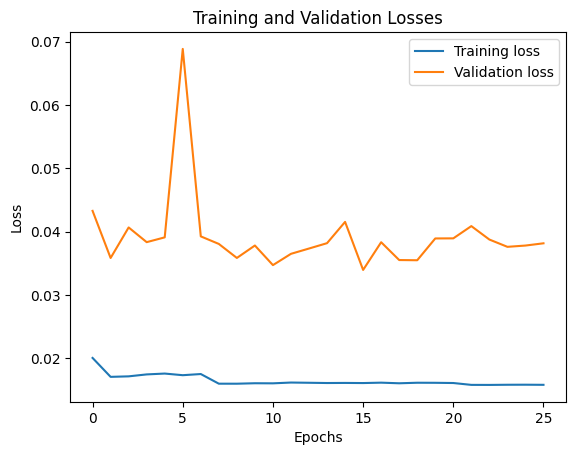

2322/2322 [==============================] - 6s 3ms/step


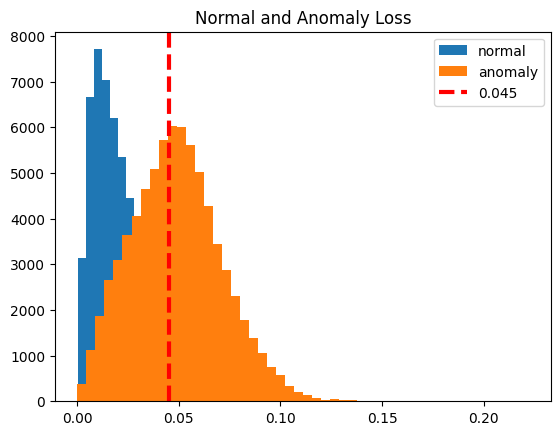

Correctly predicted background E's: 52492 out of 60676 (86.51%)
Correctly predicted signal E's: 40942 out of 74299 (55.10%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [54:10<56:20, 338.09s/it]

Epoch 1/50
507/507 [==============================] - 12s 12ms/step - loss: 0.0199 - acc: 0.3938 - val_loss: 0.0397 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0173 - acc: 0.3647 - val_loss: 0.0338 - val_acc: 0.0791 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0172 - acc: 0.3639 - val_loss: 0.0390 - val_acc: 0.0791 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3653 - val_loss: 0.0349 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0175 - acc: 0.3561 - val_loss: 0.0374 - val_acc: 0.0791 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0175 - acc: 0.3540 - val_loss: 0.0329 - val_acc: 0.5848 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0177 - acc: 0.3500 - val_loss: 0.0459 - val_ac

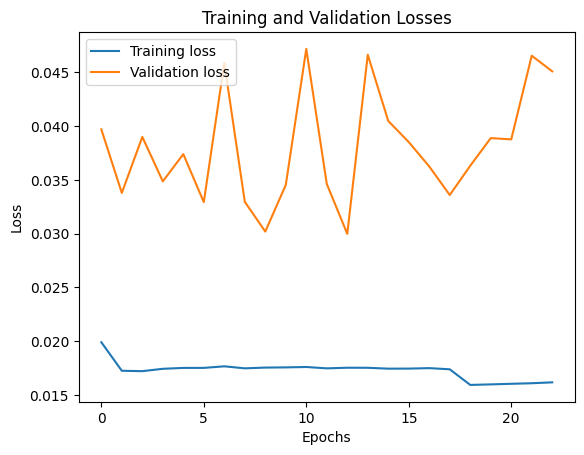

2322/2322 [==============================] - 6s 3ms/step


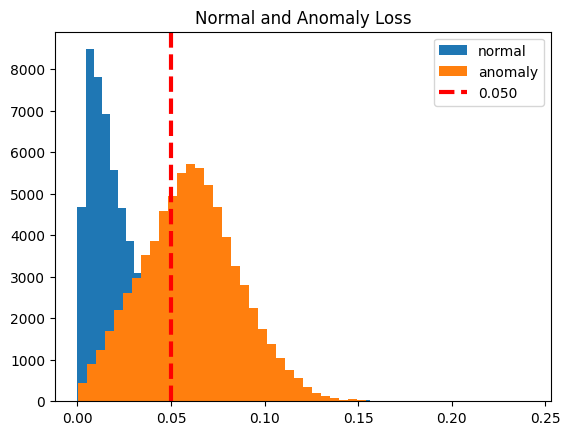

Correctly predicted background E's: 52376 out of 60676 (86.32%)
Correctly predicted signal E's: 48516 out of 74299 (65.30%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [1:00:28<52:31, 350.20s/it]

Epoch 1/50
507/507 [==============================] - 12s 15ms/step - loss: 0.0205 - acc: 0.3884 - val_loss: 0.0368 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0169 - acc: 0.3738 - val_loss: 0.0426 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0172 - acc: 0.3699 - val_loss: 0.0385 - val_acc: 0.0791 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0174 - acc: 0.3599 - val_loss: 0.0393 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3638 - val_loss: 0.0355 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0175 - acc: 0.3611 - val_loss: 0.0373 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0175 - acc: 0.3590 - val_loss: 0.0394 - val_ac

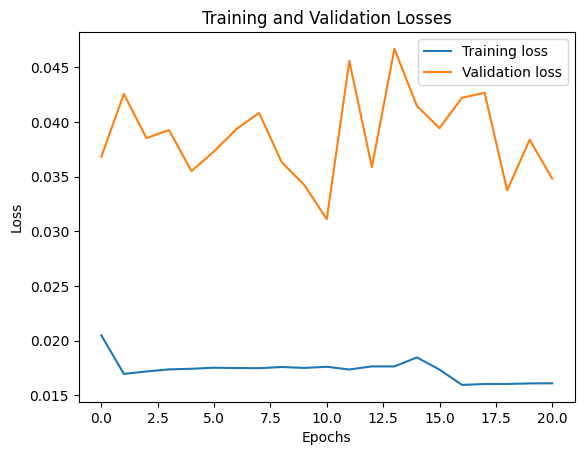

2322/2322 [==============================] - 7s 3ms/step


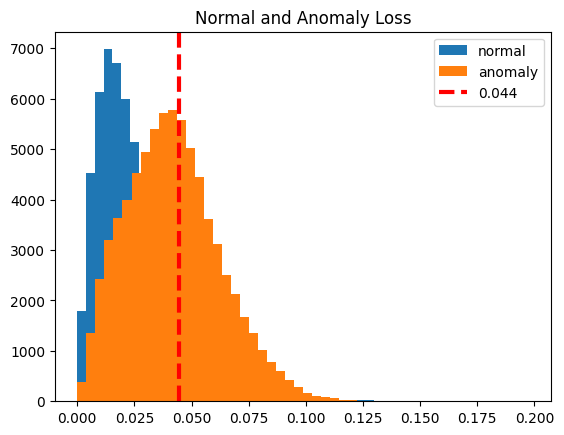

Correctly predicted background E's: 52221 out of 60676 (86.07%)
Correctly predicted signal E's: 31657 out of 74299 (42.61%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [1:06:43<47:41, 357.64s/it]

Epoch 1/50
507/507 [==============================] - 12s 14ms/step - loss: 0.0202 - acc: 0.3857 - val_loss: 0.0447 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 8s 16ms/step - loss: 0.0170 - acc: 0.3751 - val_loss: 0.0429 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0176 - acc: 0.3518 - val_loss: 0.0341 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0175 - acc: 0.3579 - val_loss: 0.0301 - val_acc: 0.5848 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0176 - acc: 0.3591 - val_loss: 0.0365 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0176 - acc: 0.3527 - val_loss: 0.0333 - val_acc: 0.5848 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0175 - acc: 0.3574 - val_loss: 0.0456 - val_ac

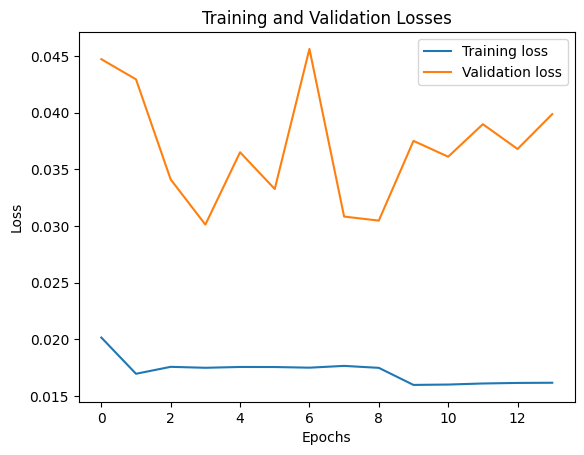

2322/2322 [==============================] - 8s 3ms/step


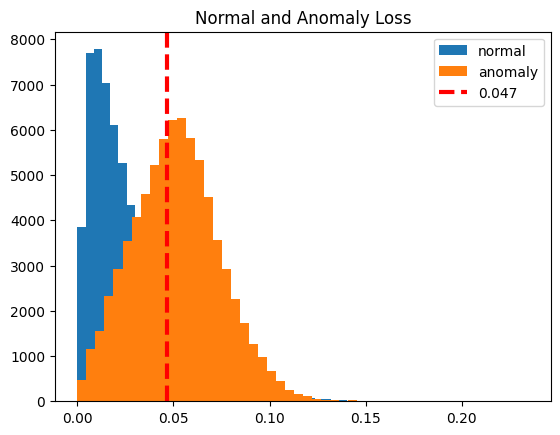

Correctly predicted background E's: 52594 out of 60676 (86.68%)
Correctly predicted signal E's: 43147 out of 74299 (58.07%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [1:11:22<38:57, 333.88s/it]

Epoch 1/50
507/507 [==============================] - 10s 12ms/step - loss: 0.0205 - acc: 0.3969 - val_loss: 0.0351 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0172 - acc: 0.3634 - val_loss: 0.0354 - val_acc: 0.5848 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0174 - acc: 0.3633 - val_loss: 0.0484 - val_acc: 0.1272 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0175 - acc: 0.3652 - val_loss: 0.0722 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0176 - acc: 0.3602 - val_loss: 0.0377 - val_acc: 0.0791 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0176 - acc: 0.3520 - val_loss: 0.0435 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0160 - acc: 0.4201 - val_loss: 0.0359 - val_ac

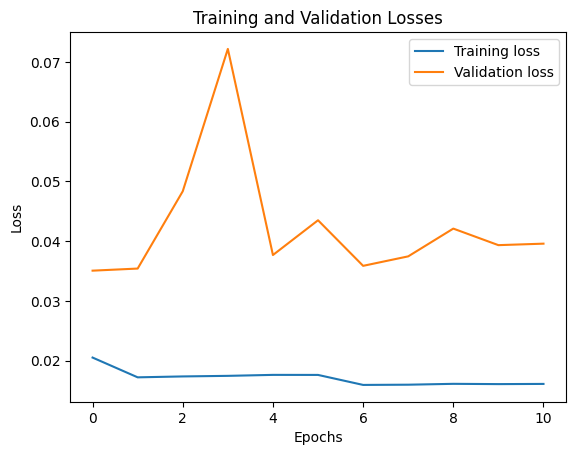

2322/2322 [==============================] - 7s 3ms/step


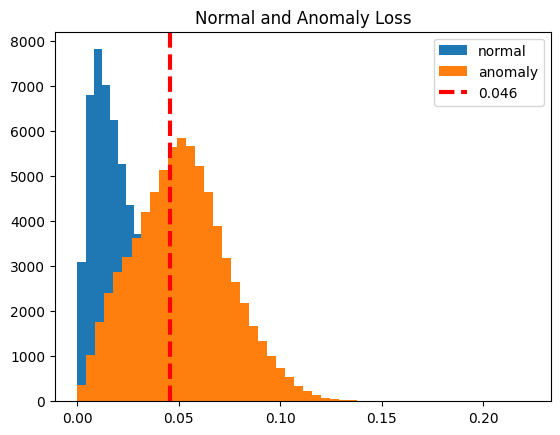

Correctly predicted background E's: 52493 out of 60676 (86.51%)
Correctly predicted signal E's: 43338 out of 74299 (58.33%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [1:15:38<31:02, 310.35s/it]

Epoch 1/50
507/507 [==============================] - 11s 12ms/step - loss: 0.0219 - acc: 0.3992 - val_loss: 0.0326 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0169 - acc: 0.3761 - val_loss: 0.0408 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0175 - acc: 0.3590 - val_loss: 0.0377 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0175 - acc: 0.3528 - val_loss: 0.0422 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0176 - acc: 0.3623 - val_loss: 0.0428 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0178 - acc: 0.3500 - val_loss: 0.0400 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0160 - acc: 0.4284 - val_loss: 0.0385 - val_ac

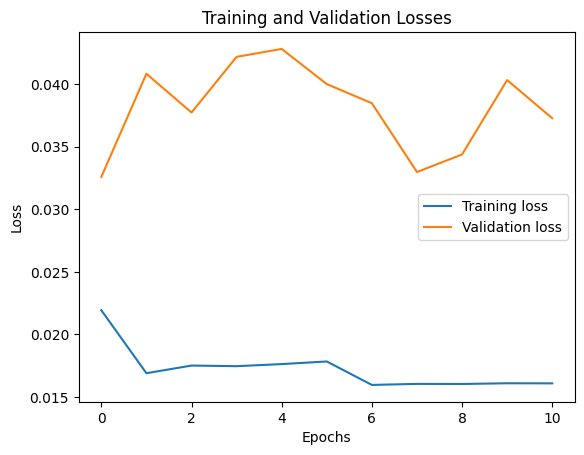

2322/2322 [==============================] - 6s 3ms/step


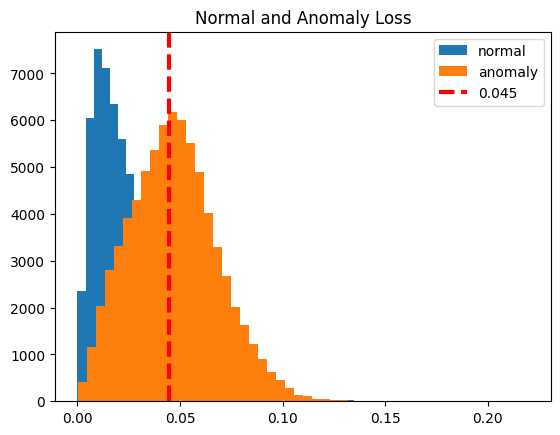

Correctly predicted background E's: 52458 out of 60676 (86.46%)
Correctly predicted signal E's: 39246 out of 74299 (52.82%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [1:19:49<24:23, 292.66s/it]

Epoch 1/50
507/507 [==============================] - 14s 18ms/step - loss: 0.0205 - acc: 0.3992 - val_loss: 0.0355 - val_acc: 0.5850 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0168 - acc: 0.3809 - val_loss: 0.0373 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 8s 16ms/step - loss: 0.0176 - acc: 0.3560 - val_loss: 0.0339 - val_acc: 0.5850 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0175 - acc: 0.3595 - val_loss: 0.0373 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 9s 17ms/step - loss: 0.0174 - acc: 0.3537 - val_loss: 0.0464 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0174 - acc: 0.3590 - val_loss: 0.0414 - val_acc: 0.5850 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0177 - acc: 0.3587 - val_loss: 0.0380 - val_ac

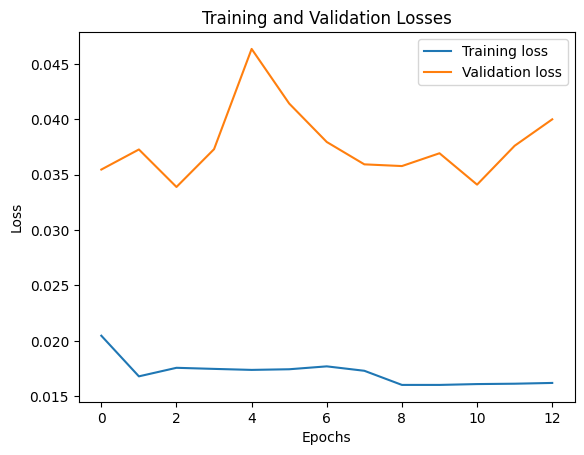

2322/2322 [==============================] - 6s 3ms/step


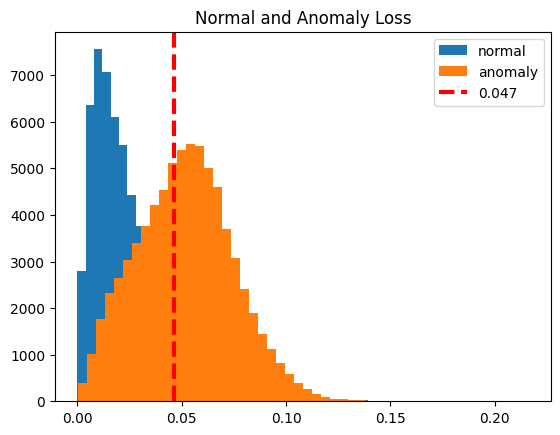

Correctly predicted background E's: 52469 out of 60676 (86.47%)
Correctly predicted signal E's: 43450 out of 74299 (58.48%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [1:25:08<20:01, 300.43s/it]

Epoch 1/50
507/507 [==============================] - 13s 15ms/step - loss: 0.0208 - acc: 0.3898 - val_loss: 0.0392 - val_acc: 0.5848 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0171 - acc: 0.3679 - val_loss: 0.0538 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0174 - acc: 0.3601 - val_loss: 0.0584 - val_acc: 0.1273 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0172 - acc: 0.3645 - val_loss: 0.0482 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0178 - acc: 0.3532 - val_loss: 0.0501 - val_acc: 0.1273 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 6s 13ms/step - loss: 0.0176 - acc: 0.3516 - val_loss: 0.0619 - val_acc: 0.1273 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 7s 13ms/step - loss: 0.0160 - acc: 0.4252 - val_loss: 0.0372 - val_ac

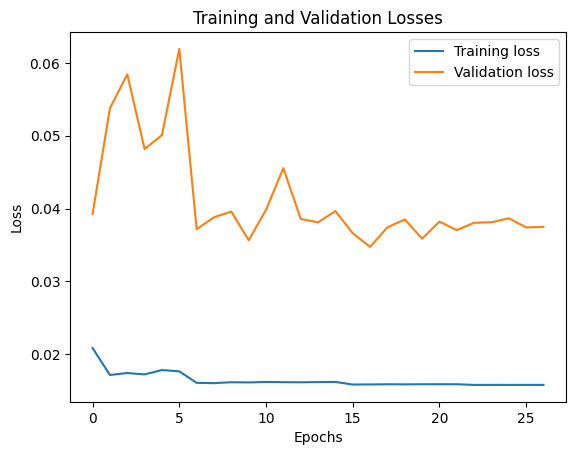

2322/2322 [==============================] - 7s 3ms/step


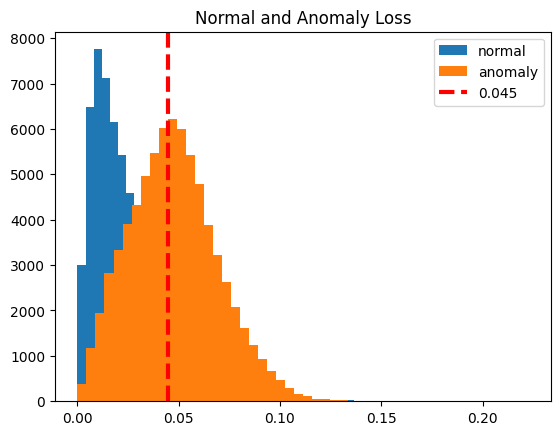

Correctly predicted background E's: 52463 out of 60676 (86.46%)
Correctly predicted signal E's: 39419 out of 74299 (53.05%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [1:31:30<16:14, 324.97s/it]

Epoch 1/50
507/507 [==============================] - 11s 13ms/step - loss: 0.0211 - acc: 0.3919 - val_loss: 0.0415 - val_acc: 0.2090 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0167 - acc: 0.3942 - val_loss: 0.0367 - val_acc: 0.5848 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0173 - acc: 0.3652 - val_loss: 0.0503 - val_acc: 0.2090 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0174 - acc: 0.3643 - val_loss: 0.0367 - val_acc: 0.5848 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 8s 16ms/step - loss: 0.0176 - acc: 0.3598 - val_loss: 0.0338 - val_acc: 0.2090 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0175 - acc: 0.3635 - val_loss: 0.0348 - val_acc: 0.0791 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 8s 16ms/step - loss: 0.0175 - acc: 0.3452 - val_loss: 0.0421 - val_ac

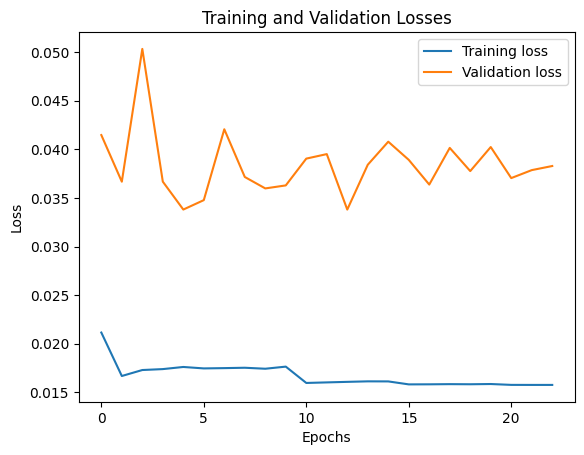

2322/2322 [==============================] - 6s 3ms/step


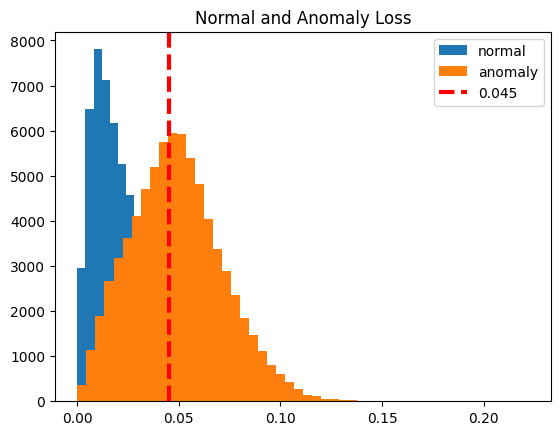

Correctly predicted background E's: 52433 out of 60676 (86.41%)
Correctly predicted signal E's: 40720 out of 74299 (54.81%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [1:37:13<11:00, 330.45s/it]

Epoch 1/50
507/507 [==============================] - 13s 16ms/step - loss: 0.0197 - acc: 0.3941 - val_loss: 0.0401 - val_acc: 0.2089 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0172 - acc: 0.3657 - val_loss: 0.0373 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0173 - acc: 0.3543 - val_loss: 0.0372 - val_acc: 0.2089 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0176 - acc: 0.3596 - val_loss: 0.0475 - val_acc: 0.1271 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0176 - acc: 0.3524 - val_loss: 0.0421 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 8s 16ms/step - loss: 0.0176 - acc: 0.3573 - val_loss: 0.0349 - val_acc: 0.2089 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 6s 12ms/step - loss: 0.0174 - acc: 0.3602 - val_loss: 0.0425 - val_ac

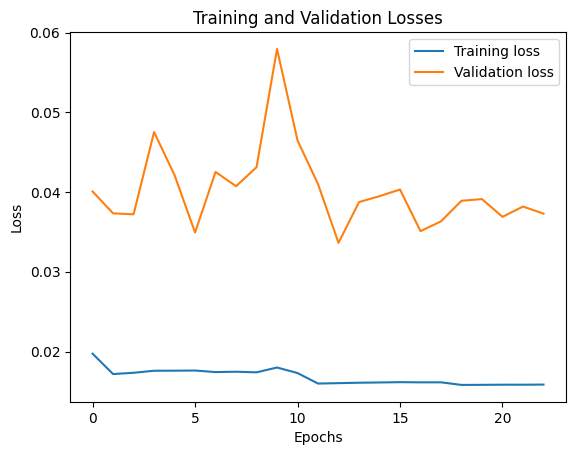

2322/2322 [==============================] - 6s 3ms/step


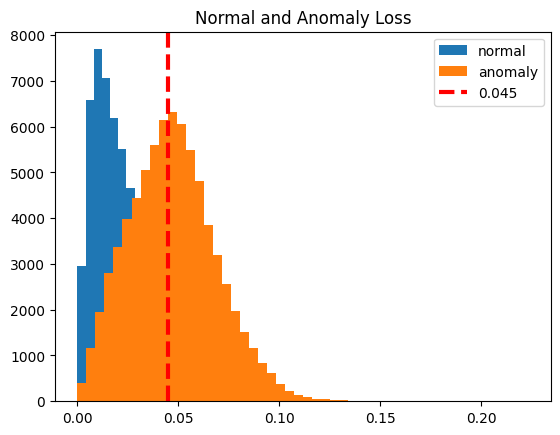

Correctly predicted background E's: 52483 out of 60676 (86.50%)
Correctly predicted signal E's: 39000 out of 74299 (52.49%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [1:43:34<05:45, 345.61s/it]

Epoch 1/50
507/507 [==============================] - 15s 16ms/step - loss: 0.0202 - acc: 0.3950 - val_loss: 0.0463 - val_acc: 0.1272 - lr: 0.0010
Epoch 2/50
507/507 [==============================] - 9s 18ms/step - loss: 0.0171 - acc: 0.3664 - val_loss: 0.0425 - val_acc: 0.2089 - lr: 0.0010
Epoch 3/50
507/507 [==============================] - 7s 14ms/step - loss: 0.0173 - acc: 0.3611 - val_loss: 0.0290 - val_acc: 0.5848 - lr: 0.0010
Epoch 4/50
507/507 [==============================] - 8s 15ms/step - loss: 0.0177 - acc: 0.3580 - val_loss: 0.0404 - val_acc: 0.2089 - lr: 0.0010
Epoch 5/50
507/507 [==============================] - 8s 16ms/step - loss: 0.0172 - acc: 0.3577 - val_loss: 0.0398 - val_acc: 0.2089 - lr: 0.0010
Epoch 6/50
507/507 [==============================] - 7s 15ms/step - loss: 0.0174 - acc: 0.3528 - val_loss: 0.0400 - val_acc: 0.1272 - lr: 0.0010
Epoch 7/50
507/507 [==============================] - 8s 17ms/step - loss: 0.0177 - acc: 0.3596 - val_loss: 0.0344 - val_ac

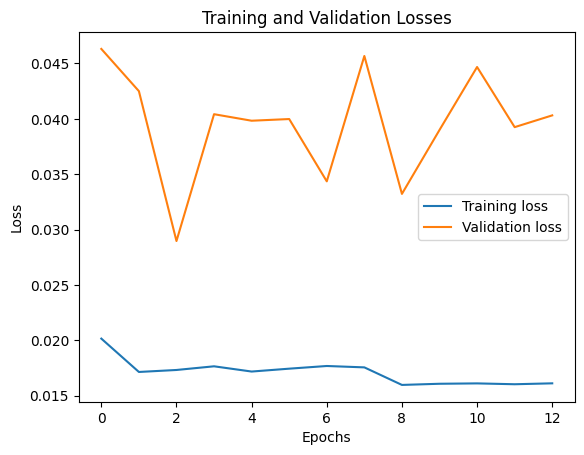

2322/2322 [==============================] - 7s 3ms/step


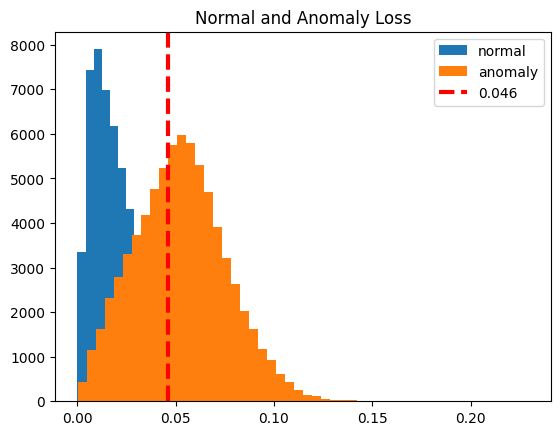

Correctly predicted background E's: 52528 out of 60676 (86.57%)
Correctly predicted signal E's: 44550 out of 74299 (59.96%)


<ipython-input-11-b1884c4c04a3>:175: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [1:48:57<00:00, 326.86s/it]


In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(2048, input_dim=N_inputs, activation="relu"),
                  Dense(1024, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="sigmoid"),
                  Dense(8, activation="relu"),

              ])
        self.decoder = Sequential([
                  Dense(16, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(1024, activation="relu"),
                  Dense(2048, activation="sigmoid"),
                  Dense(N_inputs)
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="min")
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=50,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2), early_stopping],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]

    # # Create the labels array: 0 for background, 1 for signal
    # # Result: [0,0,0,0,0.....1,1,1,1,1] serves ass source of truth of the elements

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])
    true_labels = np.concatenate([np.zeros(len(background_predictions)), np.ones(len(signal_predictions))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([background_predictions, signal_predictions])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_normalization = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Plotting the roc curve using MSE | WITH callback

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
507/507 [==============================] - 11s 12ms/step - loss: 0.0199 - acc: 0.3869 - val_loss: 0.0515 - val_acc: 0.2094 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 12ms/step - loss: 0.0172 - acc: 0.3606 - val_loss: 0.0424 - val_acc: 0.2094 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3644 - val_loss: 0.0405 - val_acc: 0.0790 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 12ms/step - loss: 0.0176 - acc: 0.3566 - val_loss: 0.0431 - val_acc: 0.2094 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 6s 12ms/step - loss: 0.0175 - acc: 0.3640 - val_loss: 0.0303 - val_acc: 0.5852 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 6s 12ms/step - loss: 0.0176 - acc: 0.3506 - val_loss: 0.0345 - val_acc: 0.2094 - lr: 0.0010
Epoch 7/20
507/507 [==============================] - 6s 12ms/step - loss: 0.0179 - acc: 0.3523 - val_loss: 0.0397 - val_ac

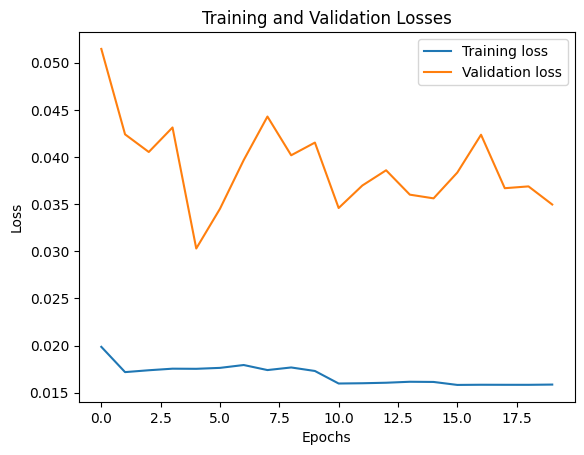

2322/2322 [==============================] - 5s 2ms/step


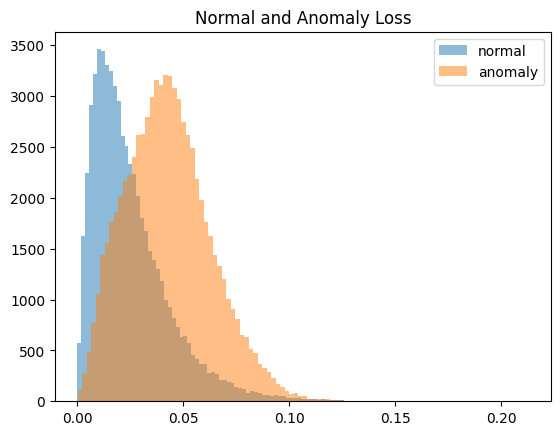

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [03:25<1:05:04, 205.50s/it]

Correctly predicted background E's: 52343 out of 60676 (86.27%)
Correctly predicted signal E's: 33619 out of 74299 (45.25%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0204 - acc: 0.3877 - val_loss: 0.0370 - val_acc: 0.2096 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0172 - acc: 0.3610 - val_loss: 0.0409 - val_acc: 0.2096 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3562 - val_loss: 0.0346 - val_acc: 0.0789 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3549 - val_loss: 0.0362 - val_acc: 0.2096 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3644 - val_loss: 0.0398 - val_acc: 0.2096 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3541 - val_loss: 0.0342 - val_acc: 0.2096 - lr: 0.0010

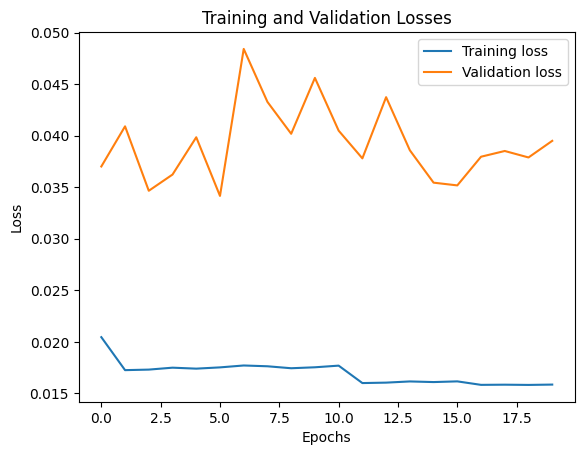

2322/2322 [==============================] - 5s 2ms/step


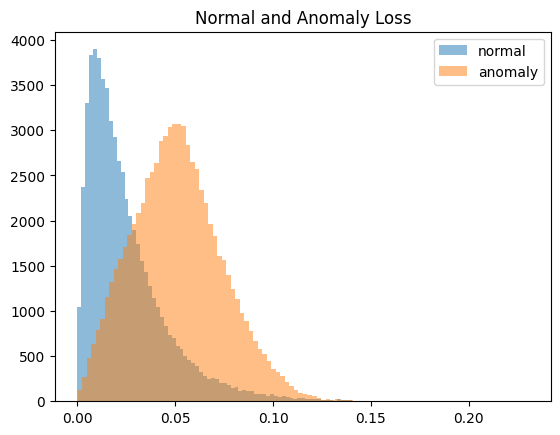

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [06:43<1:00:16, 200.92s/it]

Correctly predicted background E's: 52528 out of 60676 (86.57%)
Correctly predicted signal E's: 42619 out of 74299 (57.36%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0196 - acc: 0.3815 - val_loss: 0.0361 - val_acc: 0.2096 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3598 - val_loss: 0.0397 - val_acc: 0.5851 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3586 - val_loss: 0.0318 - val_acc: 0.5851 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3577 - val_loss: 0.0379 - val_acc: 0.2096 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0177 - acc: 0.3552 - val_loss: 0.0722 - val_acc: 0.2096 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3492 - val_loss: 0.0364 - val_acc: 0.2096 - lr: 0.0010

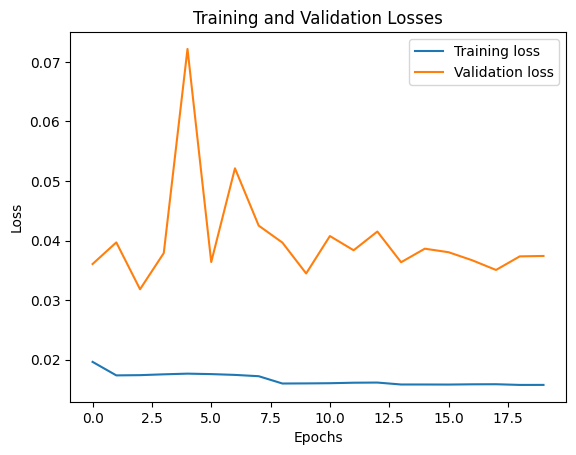

2322/2322 [==============================] - 5s 2ms/step


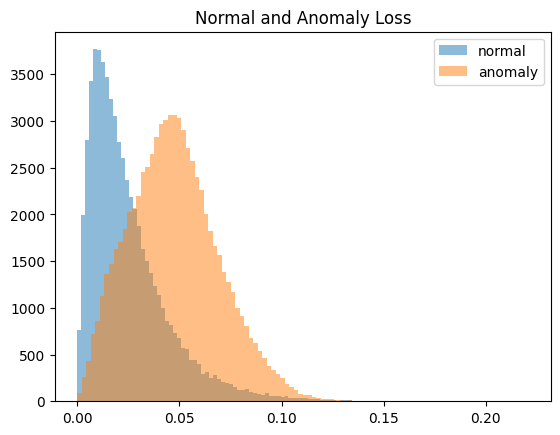

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [09:57<56:00, 197.70s/it]  

Correctly predicted background E's: 52435 out of 60676 (86.42%)
Correctly predicted signal E's: 39273 out of 74299 (52.86%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0189 - acc: 0.3840 - val_loss: 0.0460 - val_acc: 0.1264 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0173 - acc: 0.3632 - val_loss: 0.0315 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0177 - acc: 0.3480 - val_loss: 0.0315 - val_acc: 0.5852 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3617 - val_loss: 0.0500 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3579 - val_loss: 0.0339 - val_acc: 0.5852 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3573 - val_loss: 0.0315 - val_acc: 0.5852 - lr: 0.0010

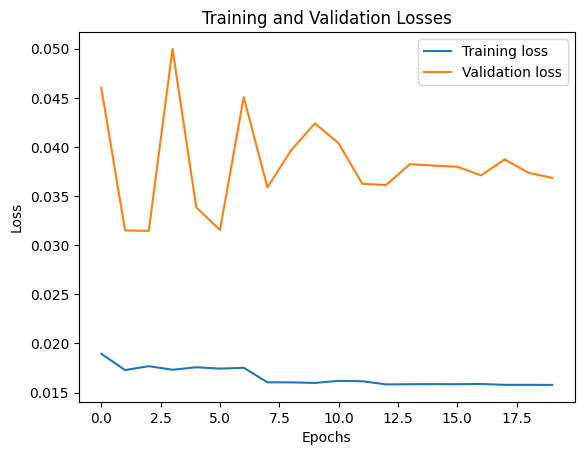

2322/2322 [==============================] - 5s 2ms/step


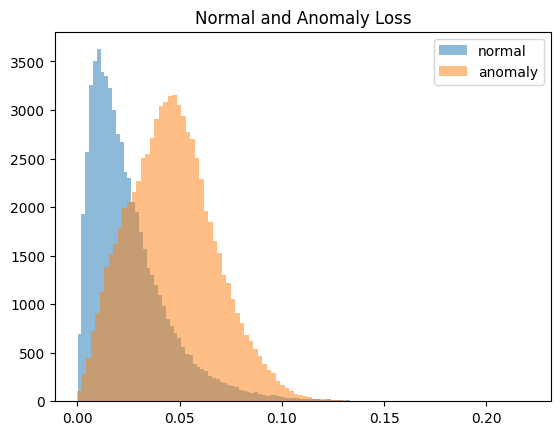

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [13:10<52:18, 196.15s/it]

Correctly predicted background E's: 52491 out of 60676 (86.51%)
Correctly predicted signal E's: 38493 out of 74299 (51.81%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0211 - acc: 0.3884 - val_loss: 0.0369 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0169 - acc: 0.3757 - val_loss: 0.0451 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3567 - val_loss: 0.0359 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3453 - val_loss: 0.0456 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3545 - val_loss: 0.0333 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3466 - val_loss: 0.0638 - val_acc: 0.2095 - lr: 0.0010

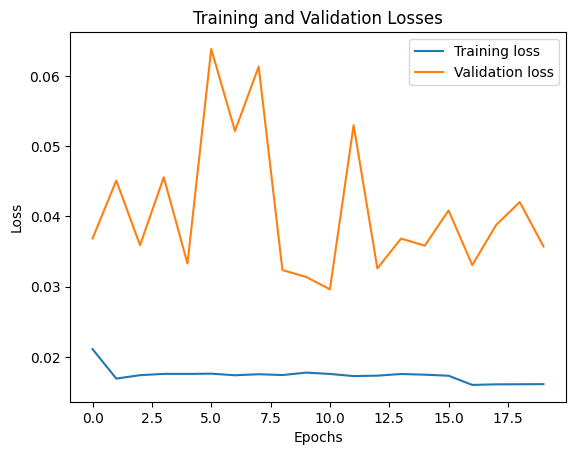

2322/2322 [==============================] - 5s 2ms/step


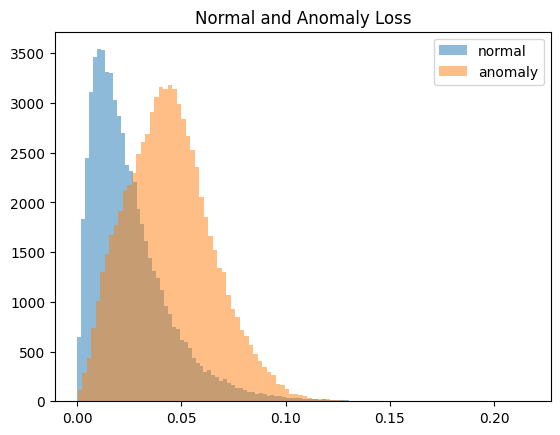

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [16:24<48:49, 195.27s/it]

Correctly predicted background E's: 52424 out of 60676 (86.40%)
Correctly predicted signal E's: 35537 out of 74299 (47.83%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0210 - acc: 0.3893 - val_loss: 0.0366 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0170 - acc: 0.3839 - val_loss: 0.0326 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3690 - val_loss: 0.0360 - val_acc: 0.5852 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3654 - val_loss: 0.0321 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3504 - val_loss: 0.0314 - val_acc: 0.5852 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0177 - acc: 0.3491 - val_loss: 0.0359 - val_acc: 0.5852 - lr: 0.0010

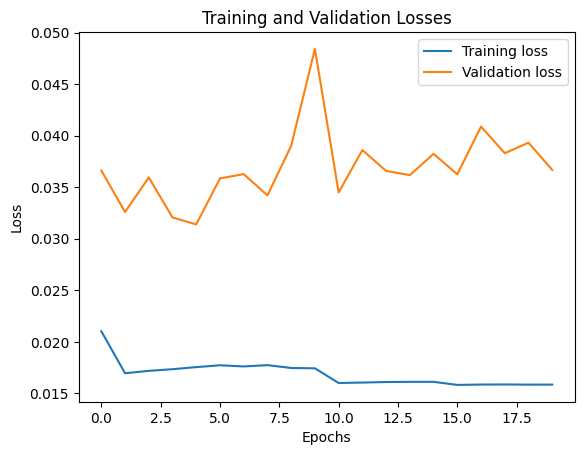

2322/2322 [==============================] - 5s 2ms/step


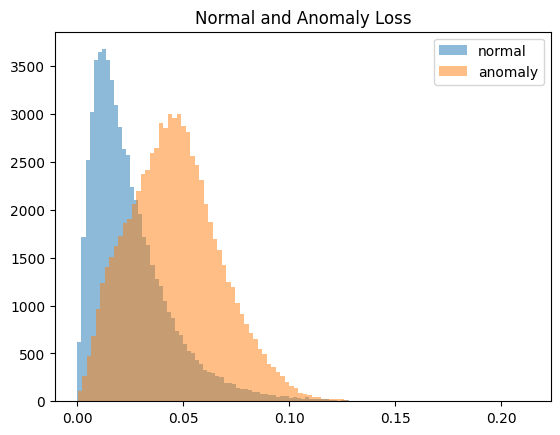

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [19:38<45:26, 194.76s/it]

Correctly predicted background E's: 52417 out of 60676 (86.39%)
Correctly predicted signal E's: 38327 out of 74299 (51.58%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0206 - acc: 0.3967 - val_loss: 0.0393 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0170 - acc: 0.3721 - val_loss: 0.0405 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3560 - val_loss: 0.0368 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3636 - val_loss: 0.0490 - val_acc: 0.1263 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3442 - val_loss: 0.0343 - val_acc: 0.5853 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3553 - val_loss: 0.0352 - val_acc: 0.2095 - lr: 0.0010

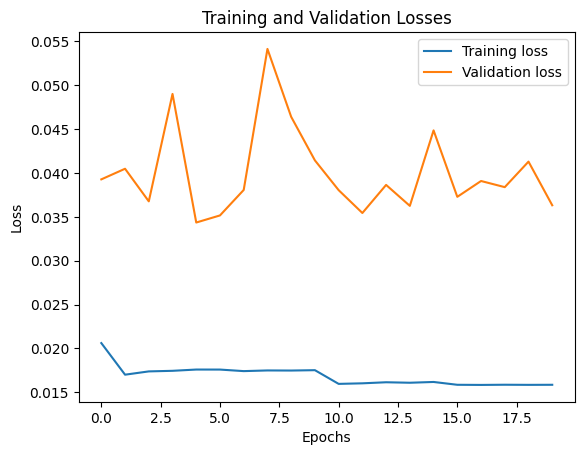

2322/2322 [==============================] - 5s 2ms/step


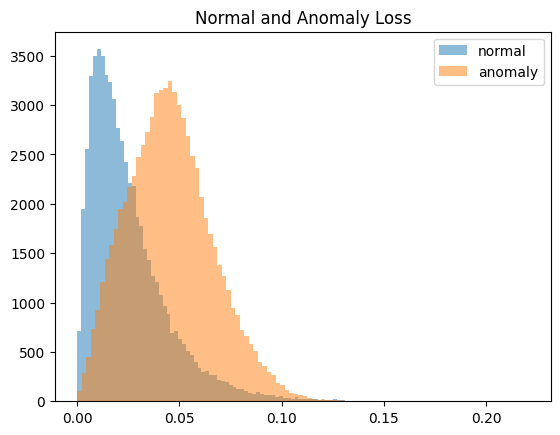

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [22:53<42:13, 194.87s/it]

Correctly predicted background E's: 52430 out of 60676 (86.41%)
Correctly predicted signal E's: 36728 out of 74299 (49.43%)
Epoch 1/20
507/507 [==============================] - 11s 12ms/step - loss: 0.0239 - acc: 0.3808 - val_loss: 0.0435 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0171 - acc: 0.3654 - val_loss: 0.0340 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0170 - acc: 0.3720 - val_loss: 0.0375 - val_acc: 0.5852 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0173 - acc: 0.3588 - val_loss: 0.0349 - val_acc: 0.5852 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3536 - val_loss: 0.0418 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3492 - val_loss: 0.0398 - val_acc: 0.2095 - lr: 0.0010

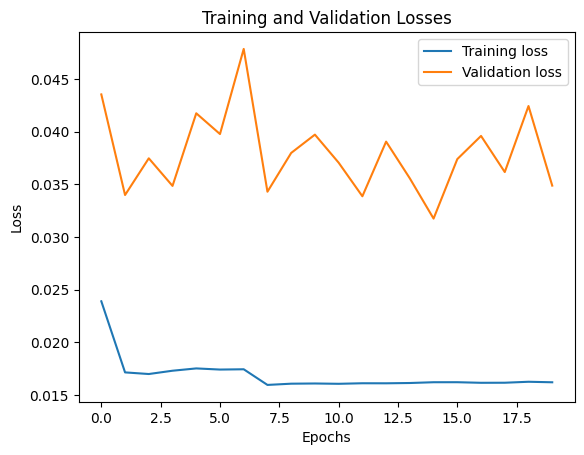

2322/2322 [==============================] - 5s 2ms/step


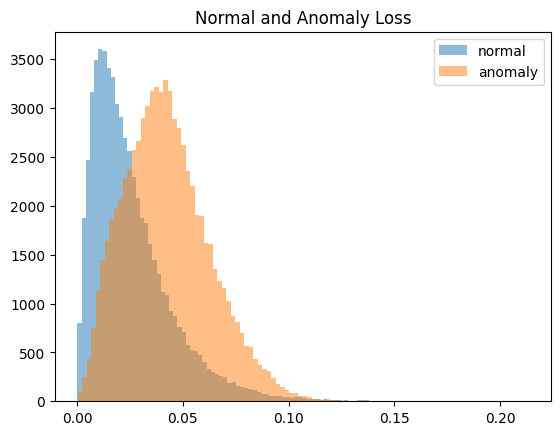

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [26:04<38:45, 193.76s/it]

Correctly predicted background E's: 52248 out of 60676 (86.11%)
Correctly predicted signal E's: 30817 out of 74299 (41.48%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0199 - acc: 0.3739 - val_loss: 0.0406 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0171 - acc: 0.3676 - val_loss: 0.0355 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3645 - val_loss: 0.0413 - val_acc: 0.1264 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3583 - val_loss: 0.0388 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3600 - val_loss: 0.0442 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3498 - val_loss: 0.0462 - val_acc: 0.2095 - lr: 0.0010

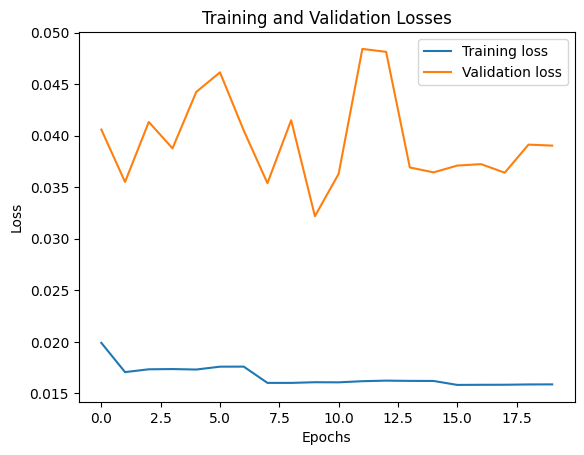

2322/2322 [==============================] - 5s 2ms/step


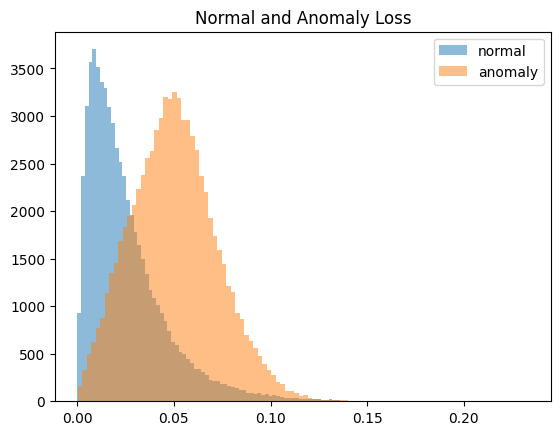

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [29:18<35:29, 193.61s/it]

Correctly predicted background E's: 52606 out of 60676 (86.70%)
Correctly predicted signal E's: 41608 out of 74299 (56.00%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0211 - acc: 0.3961 - val_loss: 0.0488 - val_acc: 0.1263 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0168 - acc: 0.3827 - val_loss: 0.0411 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3645 - val_loss: 0.0370 - val_acc: 0.5852 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0173 - acc: 0.3602 - val_loss: 0.0453 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0178 - acc: 0.3531 - val_loss: 0.0635 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3606 - val_loss: 0.0312 - val_acc: 0.5852 - lr: 0.0010

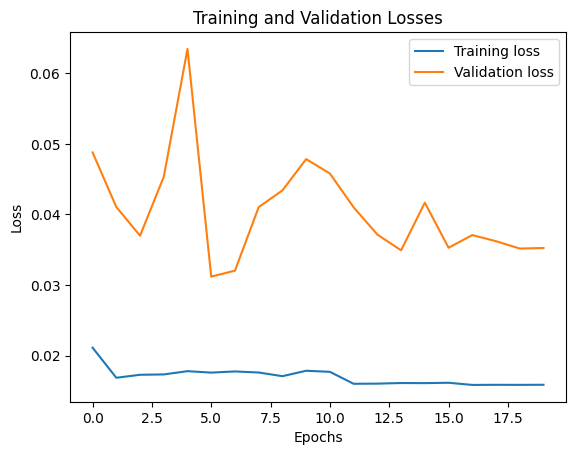

2322/2322 [==============================] - 5s 2ms/step


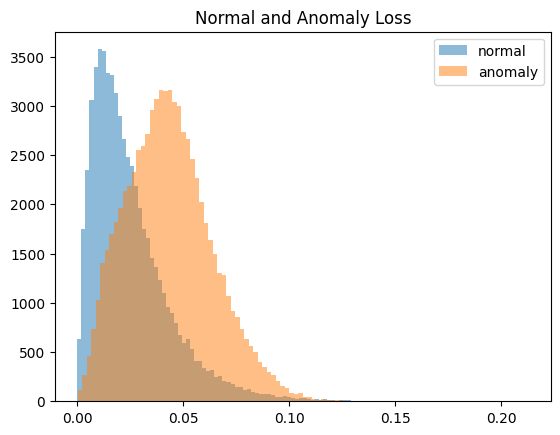

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [32:31<32:16, 193.65s/it]

Correctly predicted background E's: 52354 out of 60676 (86.28%)
Correctly predicted signal E's: 34199 out of 74299 (46.03%)
Epoch 1/20
507/507 [==============================] - 11s 12ms/step - loss: 0.0205 - acc: 0.3824 - val_loss: 0.0501 - val_acc: 0.1264 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3791 - val_loss: 0.0294 - val_acc: 0.5852 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3610 - val_loss: 0.0427 - val_acc: 0.2094 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3484 - val_loss: 0.0547 - val_acc: 0.1264 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3584 - val_loss: 0.0490 - val_acc: 0.0789 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0175 - acc: 0.3588 - val_loss: 0.0349 - val_acc: 0.5852 - lr: 0.0010

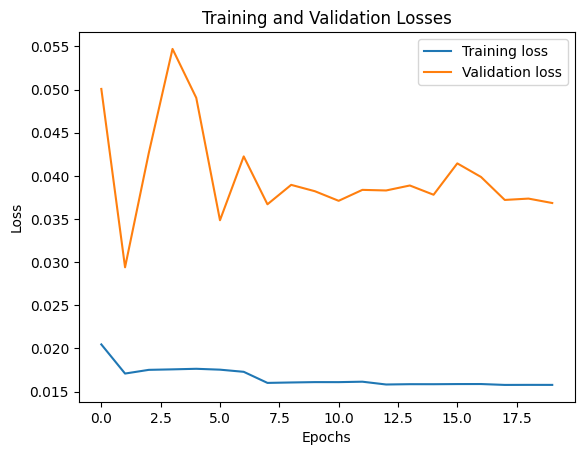

2322/2322 [==============================] - 5s 2ms/step


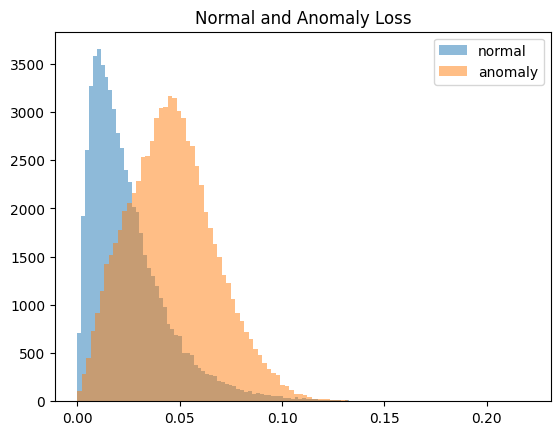

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [35:48<29:10, 194.45s/it]

Correctly predicted background E's: 52454 out of 60676 (86.45%)
Correctly predicted signal E's: 38490 out of 74299 (51.80%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0251 - acc: 0.3887 - val_loss: 0.0311 - val_acc: 0.5853 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3754 - val_loss: 0.0356 - val_acc: 0.5853 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0171 - acc: 0.3622 - val_loss: 0.0424 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3572 - val_loss: 0.0444 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3657 - val_loss: 0.0494 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3494 - val_loss: 0.0307 - val_acc: 0.5853 - lr: 0.0010

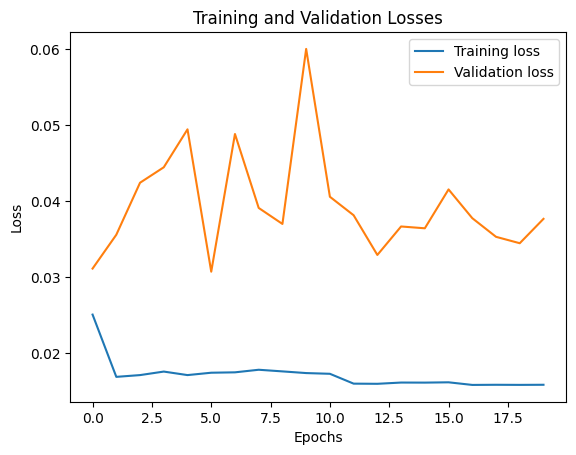

2322/2322 [==============================] - 5s 2ms/step


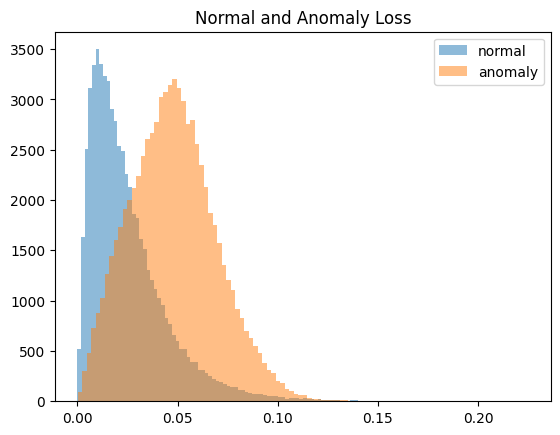

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [38:59<25:48, 193.52s/it]

Correctly predicted background E's: 52514 out of 60676 (86.55%)
Correctly predicted signal E's: 40107 out of 74299 (53.98%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0205 - acc: 0.3887 - val_loss: 0.0459 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3799 - val_loss: 0.0326 - val_acc: 0.0789 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3646 - val_loss: 0.0397 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0178 - acc: 0.3494 - val_loss: 0.0352 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3517 - val_loss: 0.0440 - val_acc: 0.1264 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3553 - val_loss: 0.0415 - val_acc: 0.2095 - lr: 0.0010

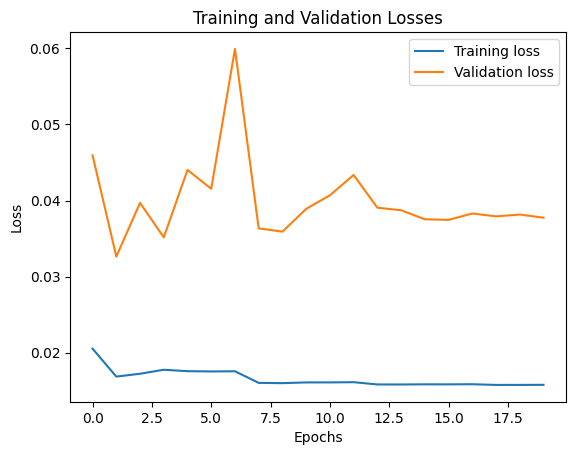

2322/2322 [==============================] - 5s 2ms/step


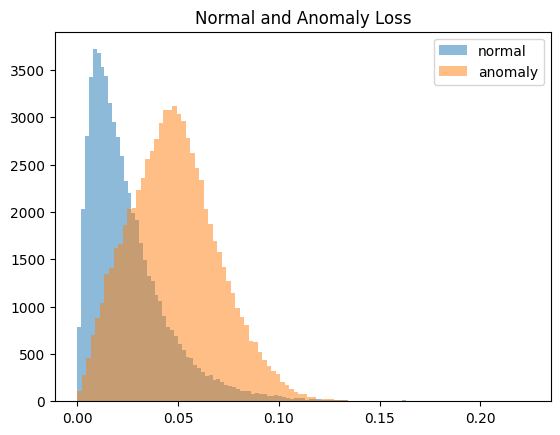

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [42:10<22:28, 192.62s/it]

Correctly predicted background E's: 52490 out of 60676 (86.51%)
Correctly predicted signal E's: 40227 out of 74299 (54.14%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0223 - acc: 0.3880 - val_loss: 0.0354 - val_acc: 0.0789 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3845 - val_loss: 0.0462 - val_acc: 0.1264 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3590 - val_loss: 0.0486 - val_acc: 0.1264 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3558 - val_loss: 0.0400 - val_acc: 0.0789 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3543 - val_loss: 0.0370 - val_acc: 0.5852 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3616 - val_loss: 0.0409 - val_acc: 0.0789 - lr: 0.0010

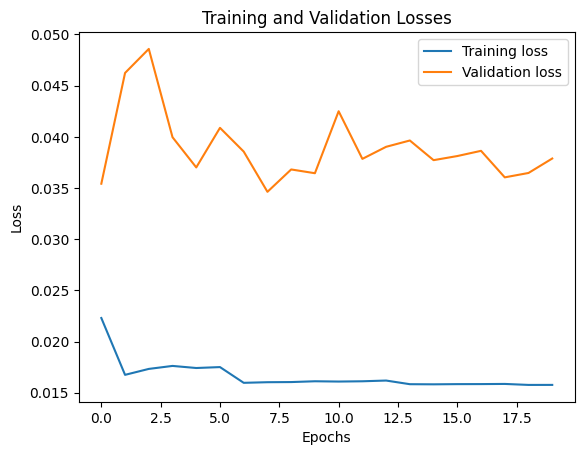

2322/2322 [==============================] - 5s 2ms/step


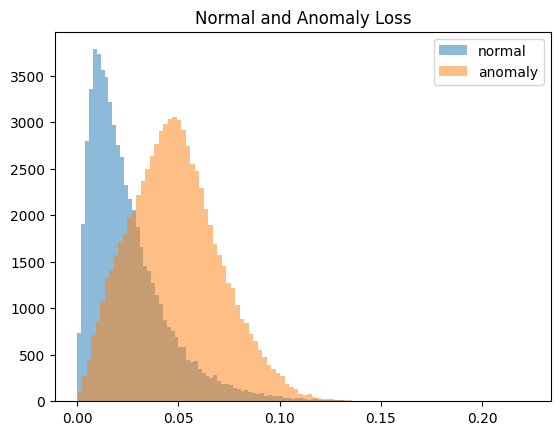

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [45:20<19:12, 192.11s/it]

Correctly predicted background E's: 52438 out of 60676 (86.42%)
Correctly predicted signal E's: 40401 out of 74299 (54.38%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0242 - acc: 0.4010 - val_loss: 0.0378 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0168 - acc: 0.3768 - val_loss: 0.0500 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3735 - val_loss: 0.0333 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0172 - acc: 0.3731 - val_loss: 0.0371 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0177 - acc: 0.3511 - val_loss: 0.0398 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0178 - acc: 0.3488 - val_loss: 0.0468 - val_acc: 0.2095 - lr: 0.0010

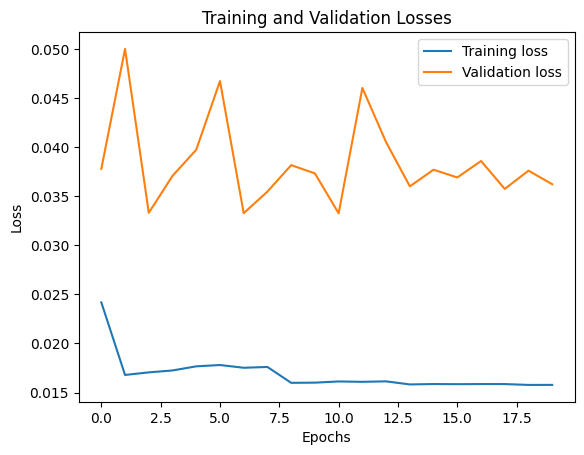

2322/2322 [==============================] - 5s 2ms/step


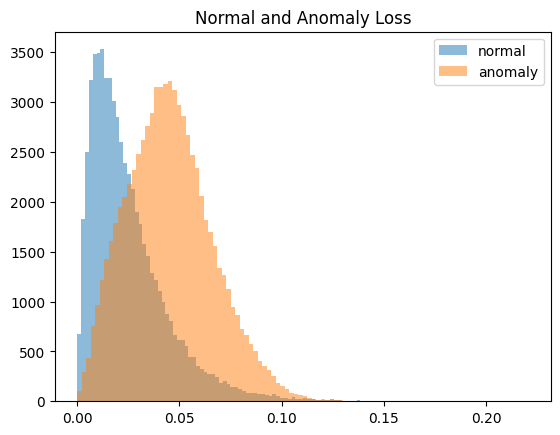

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [48:30<15:57, 191.42s/it]

Correctly predicted background E's: 52406 out of 60676 (86.37%)
Correctly predicted signal E's: 36613 out of 74299 (49.28%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0215 - acc: 0.3929 - val_loss: 0.0335 - val_acc: 0.2094 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0169 - acc: 0.3770 - val_loss: 0.0368 - val_acc: 0.5854 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3582 - val_loss: 0.0361 - val_acc: 0.5854 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3654 - val_loss: 0.0460 - val_acc: 0.2094 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3509 - val_loss: 0.0368 - val_acc: 0.5854 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3568 - val_loss: 0.0433 - val_acc: 0.2094 - lr: 0.0010

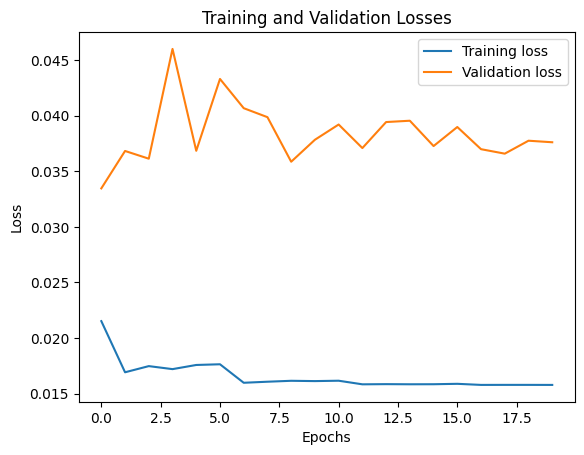

2322/2322 [==============================] - 5s 2ms/step


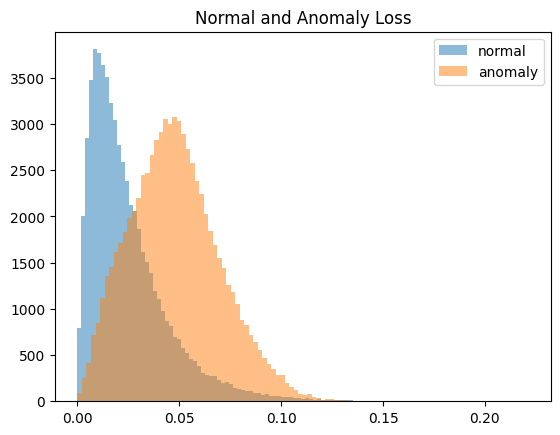

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [51:41<12:44, 191.22s/it]

Correctly predicted background E's: 52446 out of 60676 (86.44%)
Correctly predicted signal E's: 39511 out of 74299 (53.18%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0197 - acc: 0.3925 - val_loss: 0.0326 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0170 - acc: 0.3640 - val_loss: 0.0390 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3511 - val_loss: 0.0313 - val_acc: 0.5853 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3577 - val_loss: 0.0381 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0178 - acc: 0.3561 - val_loss: 0.0618 - val_acc: 0.1264 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3591 - val_loss: 0.0452 - val_acc: 0.2095 - lr: 0.0010

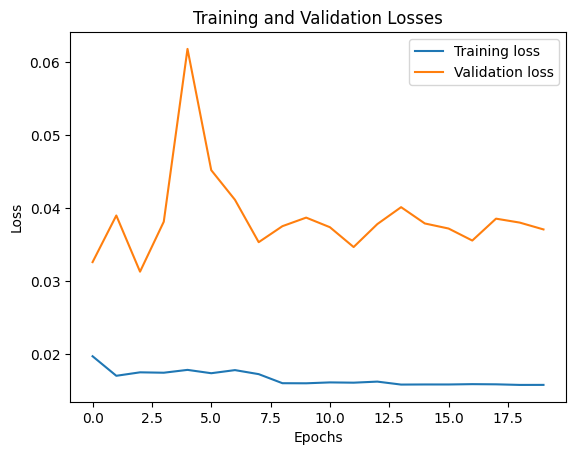

2322/2322 [==============================] - 5s 2ms/step


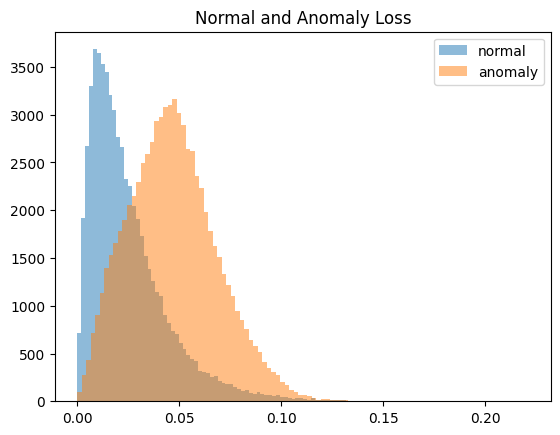

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [54:55<09:36, 192.08s/it]

Correctly predicted background E's: 52438 out of 60676 (86.42%)
Correctly predicted signal E's: 38738 out of 74299 (52.14%)
Epoch 1/20
507/507 [==============================] - 10s 11ms/step - loss: 0.0211 - acc: 0.3827 - val_loss: 0.0371 - val_acc: 0.2095 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0170 - acc: 0.3688 - val_loss: 0.0411 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0171 - acc: 0.3661 - val_loss: 0.0361 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3537 - val_loss: 0.0545 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3551 - val_loss: 0.0570 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3565 - val_loss: 0.0396 - val_acc: 0.2095 - lr: 0.0010

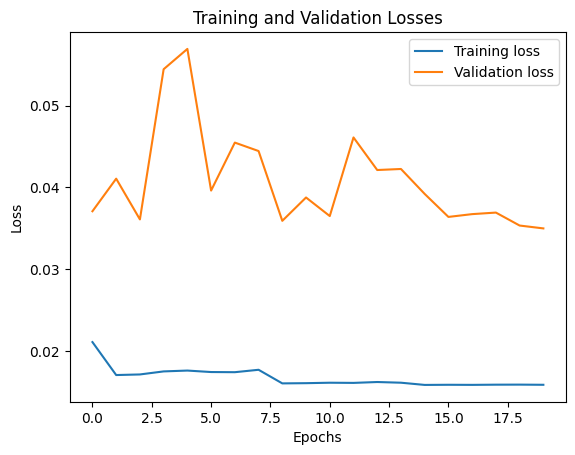

2322/2322 [==============================] - 5s 2ms/step


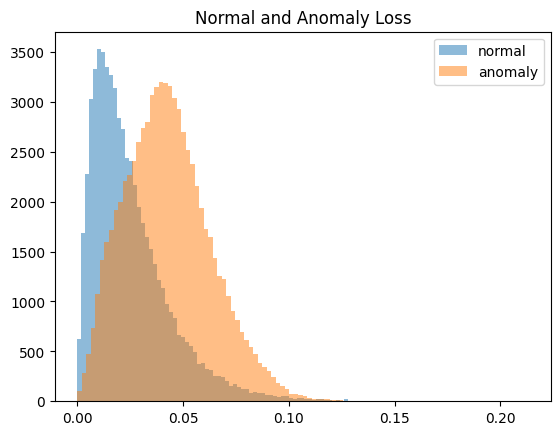

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [58:08<06:24, 192.46s/it]

Correctly predicted background E's: 52278 out of 60676 (86.16%)
Correctly predicted signal E's: 33207 out of 74299 (44.69%)
Epoch 1/20
507/507 [==============================] - 11s 12ms/step - loss: 0.0208 - acc: 0.3787 - val_loss: 0.0433 - val_acc: 0.5853 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0170 - acc: 0.3737 - val_loss: 0.0410 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3633 - val_loss: 0.0440 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3532 - val_loss: 0.0329 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3568 - val_loss: 0.0448 - val_acc: 0.2095 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3510 - val_loss: 0.0347 - val_acc: 0.5853 - lr: 0.0010

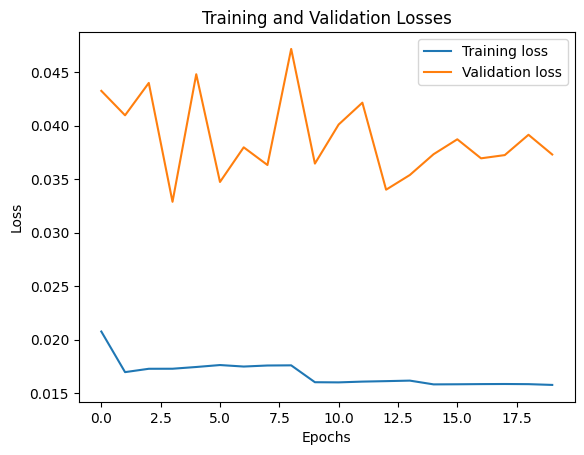

2322/2322 [==============================] - 5s 2ms/step


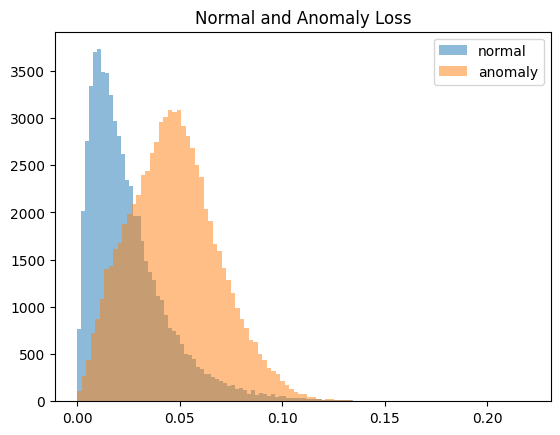

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [1:01:27<03:14, 194.26s/it]

Correctly predicted background E's: 52510 out of 60676 (86.54%)
Correctly predicted signal E's: 39505 out of 74299 (53.17%)
Epoch 1/20
507/507 [==============================] - 11s 11ms/step - loss: 0.0210 - acc: 0.3841 - val_loss: 0.0448 - val_acc: 0.1264 - lr: 0.0010
Epoch 2/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3636 - val_loss: 0.0378 - val_acc: 0.2095 - lr: 0.0010
Epoch 3/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0175 - acc: 0.3617 - val_loss: 0.0352 - val_acc: 0.2095 - lr: 0.0010
Epoch 4/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0174 - acc: 0.3585 - val_loss: 0.0349 - val_acc: 0.2095 - lr: 0.0010
Epoch 5/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3532 - val_loss: 0.0371 - val_acc: 0.5852 - lr: 0.0010
Epoch 6/20
507/507 [==============================] - 6s 11ms/step - loss: 0.0175 - acc: 0.3567 - val_loss: 0.0346 - val_acc: 0.5852 - lr: 0.0010

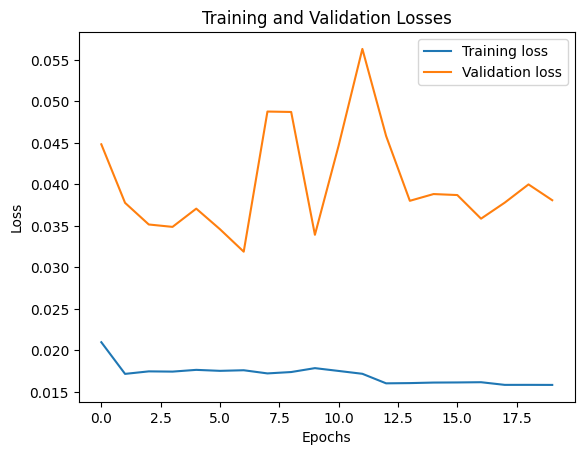

2322/2322 [==============================] - 5s 2ms/step


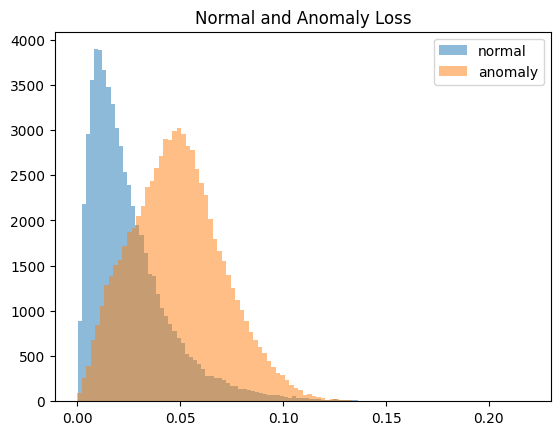

<ipython-input-13-ec1ec5a01b15>:174: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [1:04:44<00:00, 194.20s/it]

Correctly predicted background E's: 52507 out of 60676 (86.54%)
Correctly predicted signal E's: 40715 out of 74299 (54.80%)


In [13]:
#CWoLa with T21 relu
from tensorflow.keras.utils import plot_model
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(2048, input_dim=N_inputs, activation="relu"),
                  Dense(1024, activation="relu"),
                  Dense(512, activation="relu"),
                  Dense(256, activation="relu"),
                  Dense(128, activation="relu"),
                  Dense(64, activation="relu"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="relu"),
                  Dense(8, activation="relu"),
                  Dense(4, activation="relu"),
                  Dense(2, activation="relu"),


              ])
        self.decoder = Sequential([
                  Dense(4, activation="relu"),
                  Dense(16, activation="relu"),
                  Dense(32, activation="relu"),
                  Dense(64, activation="relu"),
                  Dense(128, activation="relu"),
                  Dense(256, activation="relu"),
                  Dense(512, activation="relu"),
                  Dense(1024, activation="relu"),
                  Dense(2048, activation="sigmoid"),
                  Dense(N_inputs)
              ])
      def save_encoder_diagram(self):
        plot_model(self.encoder, to_file='/content/drive/MyDrive/CWoLa_Autoencoders/autoencoders/sparse/DeepAEEncoder.png', show_shapes=True, show_layer_names=True)
        plot_model(self.decoder, to_file='/content/drive/MyDrive/CWoLa_Autoencoders/autoencoders/sparse/DeepAEDecoder.png', show_shapes=True, show_layer_names=True)

      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    plot_model(autoencoder.encoder, to_file='/content/drive/MyDrive/CWoLa_Autoencoders/autoencoders/sparse/5layer_architecture.png', show_shapes=True, show_layer_names=True)
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="max")
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:], X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    # Save model architecture diagram
    autoencoder.save_encoder_diagram()
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='normal')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='anomaly')
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


# MSE with Callback and alternating Sigmoid Relu

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
508/508 [==============================] - 11s 12ms/step - loss: 0.0248 - acc: 0.3778 - val_loss: 0.0415 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0167 - acc: 0.3791 - val_loss: 0.0359 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0171 - acc: 0.3600 - val_loss: 0.0479 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0173 - acc: 0.3630 - val_loss: 0.0434 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3574 - val_loss: 0.0382 - val_acc: 0.5867 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0175 - acc: 0.3575 - val_loss: 0.0336 - val_acc: 0.2065 - lr: 0.0010
Epoch 7/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3578 - val_loss: 0.0509 - val_ac

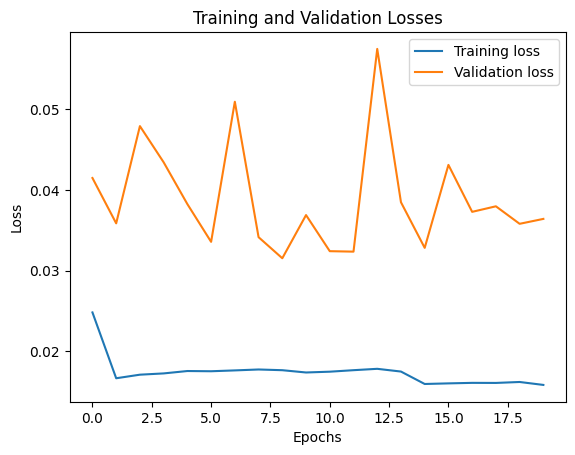

2322/2322 [==============================] - 5s 2ms/step


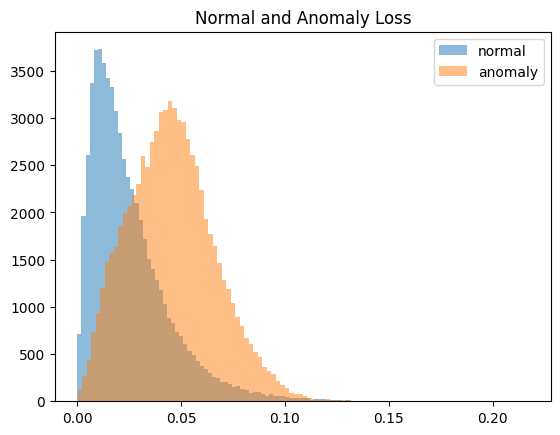

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [03:17<1:02:38, 197.80s/it]

Correctly predicted background E's: 52448 out of 60676 (86.44%)
Correctly predicted signal E's: 36656 out of 74299 (49.34%)
Epoch 1/20
508/508 [==============================] - 13s 16ms/step - loss: 0.0249 - acc: 0.3896 - val_loss: 0.0386 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0167 - acc: 0.3850 - val_loss: 0.0363 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3662 - val_loss: 0.0442 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3549 - val_loss: 0.0329 - val_acc: 0.0798 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3596 - val_loss: 0.0362 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3531 - val_loss: 0.0392 - val_acc: 0.0798 - lr: 0.0010

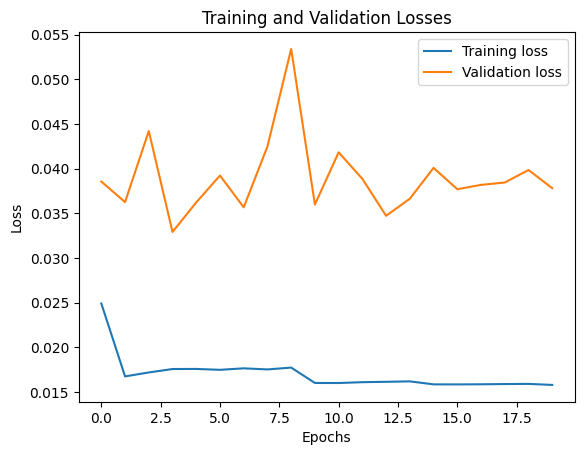

2322/2322 [==============================] - 5s 2ms/step


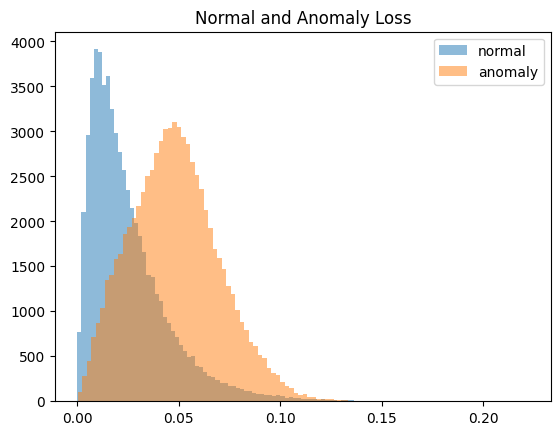

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [06:30<58:25, 194.74s/it]  

Correctly predicted background E's: 52492 out of 60676 (86.51%)
Correctly predicted signal E's: 39776 out of 74299 (53.54%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0253 - acc: 0.3981 - val_loss: 0.0363 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0167 - acc: 0.3768 - val_loss: 0.0372 - val_acc: 0.5868 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3718 - val_loss: 0.0365 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3639 - val_loss: 0.0352 - val_acc: 0.5868 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0179 - acc: 0.3461 - val_loss: 0.0442 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0172 - acc: 0.3563 - val_loss: 0.0298 - val_acc: 0.5868 - lr: 0.0010

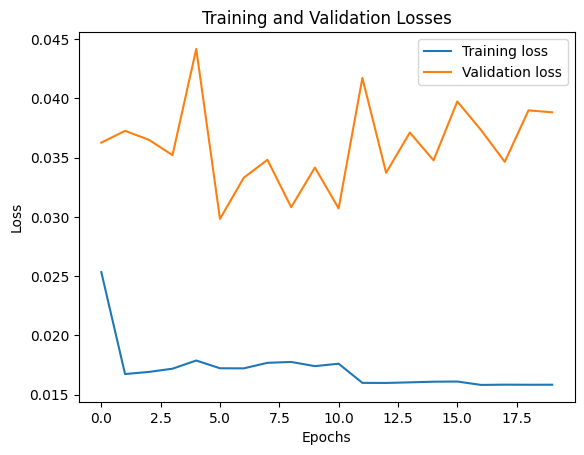

2322/2322 [==============================] - 5s 2ms/step


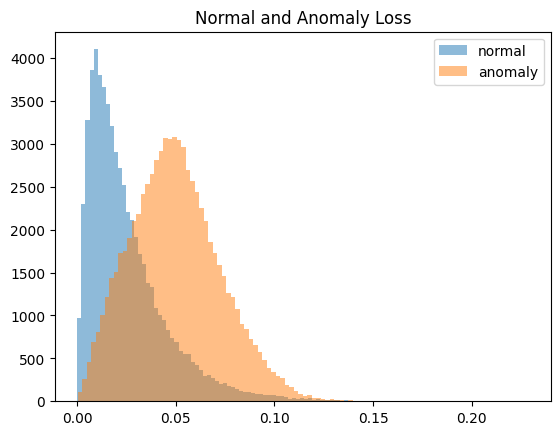

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [09:41<54:43, 193.16s/it]

Correctly predicted background E's: 52424 out of 60676 (86.40%)
Correctly predicted signal E's: 40583 out of 74299 (54.62%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0227 - acc: 0.3952 - val_loss: 0.0387 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3858 - val_loss: 0.0482 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3709 - val_loss: 0.0436 - val_acc: 0.1270 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3612 - val_loss: 0.0388 - val_acc: 0.1270 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3607 - val_loss: 0.0361 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0179 - acc: 0.3405 - val_loss: 0.0331 - val_acc: 0.2064 - lr: 0.0010

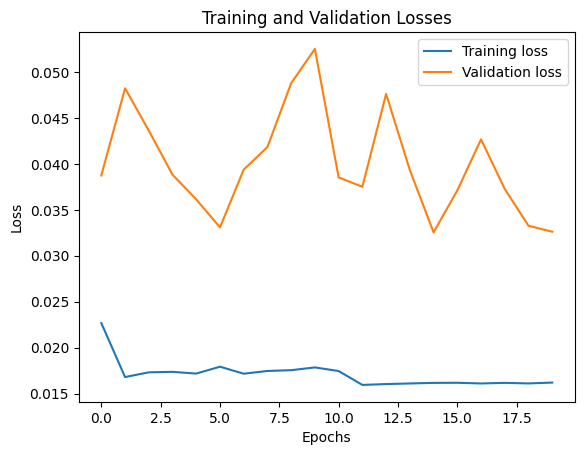

2322/2322 [==============================] - 5s 2ms/step


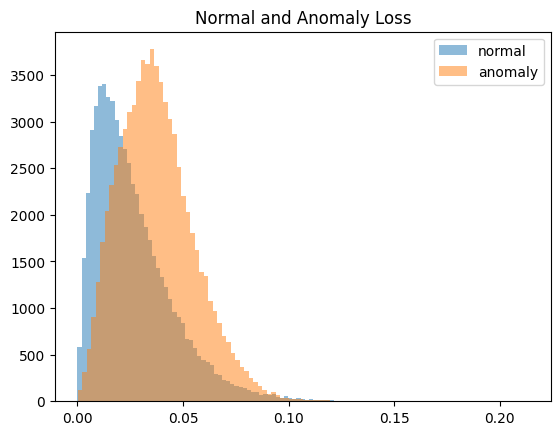

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [12:54<51:26, 192.89s/it]

Correctly predicted background E's: 51904 out of 60676 (85.54%)
Correctly predicted signal E's: 21923 out of 74299 (29.51%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0239 - acc: 0.3938 - val_loss: 0.0472 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3836 - val_loss: 0.0472 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3647 - val_loss: 0.0449 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3573 - val_loss: 0.0361 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3566 - val_loss: 0.0364 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3510 - val_loss: 0.0473 - val_acc: 0.2065 - lr: 0.0010

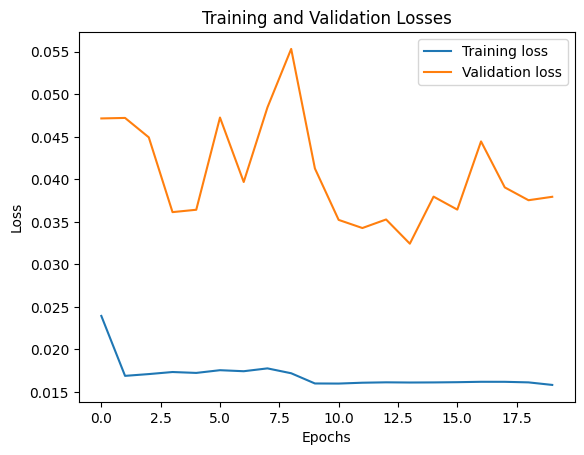

2322/2322 [==============================] - 5s 2ms/step


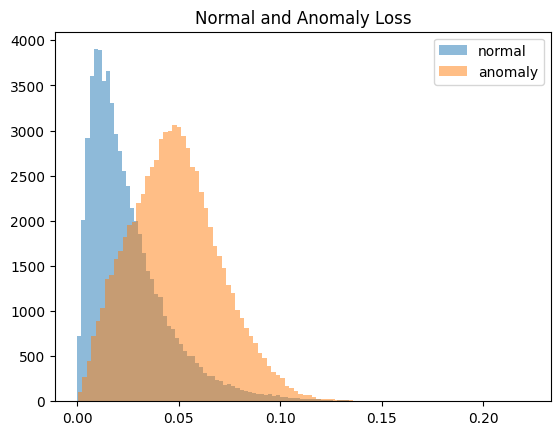

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [16:05<48:04, 192.28s/it]

Correctly predicted background E's: 52472 out of 60676 (86.48%)
Correctly predicted signal E's: 40135 out of 74299 (54.02%)
Epoch 1/20
508/508 [==============================] - 11s 12ms/step - loss: 0.0263 - acc: 0.4003 - val_loss: 0.0393 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0167 - acc: 0.3888 - val_loss: 0.0390 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0171 - acc: 0.3670 - val_loss: 0.0397 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 12ms/step - loss: 0.0175 - acc: 0.3633 - val_loss: 0.0409 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3633 - val_loss: 0.0357 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 6s 12ms/step - loss: 0.0177 - acc: 0.3484 - val_loss: 0.0536 - val_acc: 0.2065 - lr: 0.0010

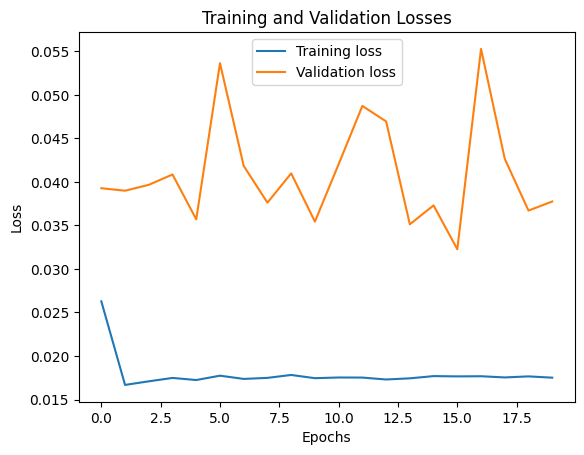

2322/2322 [==============================] - 5s 2ms/step


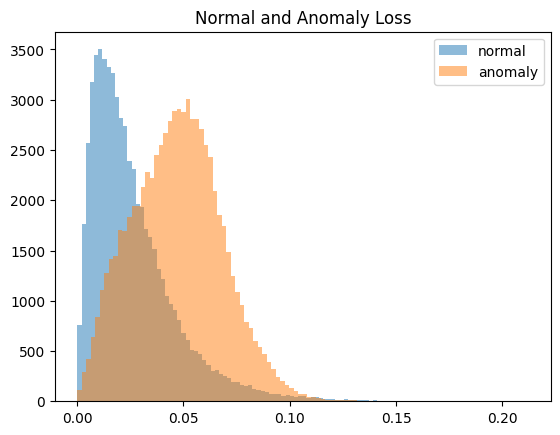

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [19:19<45:02, 193.00s/it]

Correctly predicted background E's: 52552 out of 60676 (86.61%)
Correctly predicted signal E's: 37674 out of 74299 (50.71%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0234 - acc: 0.4045 - val_loss: 0.0474 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3720 - val_loss: 0.0478 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3674 - val_loss: 0.0393 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3643 - val_loss: 0.0343 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3589 - val_loss: 0.0361 - val_acc: 0.5868 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0177 - acc: 0.3565 - val_loss: 0.0339 - val_acc: 0.2065 - lr: 0.0010

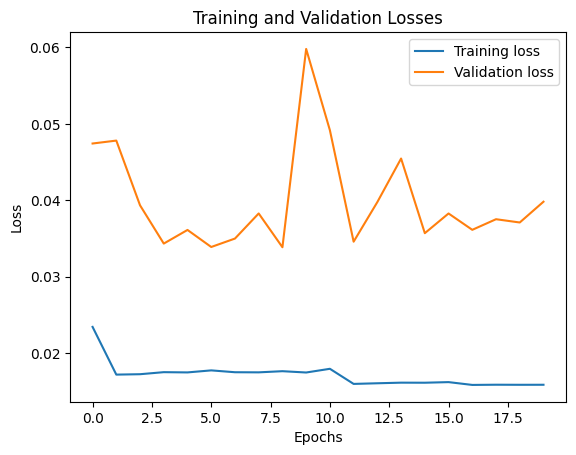

2322/2322 [==============================] - 5s 2ms/step


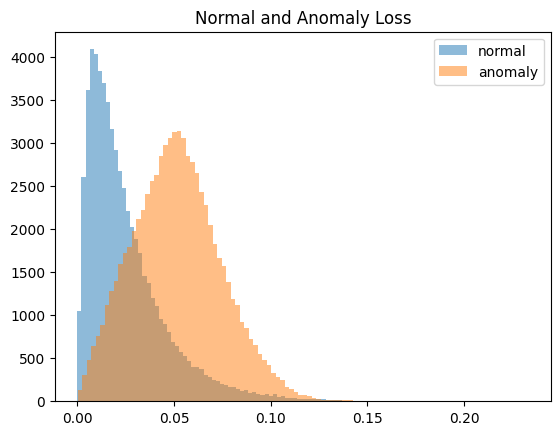

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [22:32<41:46, 192.81s/it]

Correctly predicted background E's: 52567 out of 60676 (86.64%)
Correctly predicted signal E's: 42802 out of 74299 (57.61%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0232 - acc: 0.4007 - val_loss: 0.0381 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3866 - val_loss: 0.0475 - val_acc: 0.1270 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3676 - val_loss: 0.0481 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0177 - acc: 0.3469 - val_loss: 0.0531 - val_acc: 0.1270 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3497 - val_loss: 0.0404 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3547 - val_loss: 0.0393 - val_acc: 0.2065 - lr: 0.0010

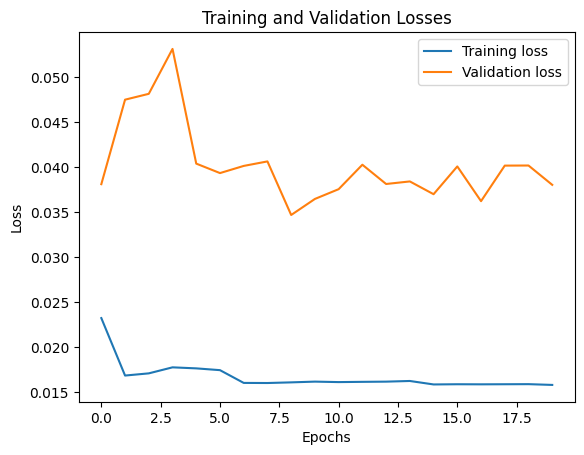

2322/2322 [==============================] - 5s 2ms/step


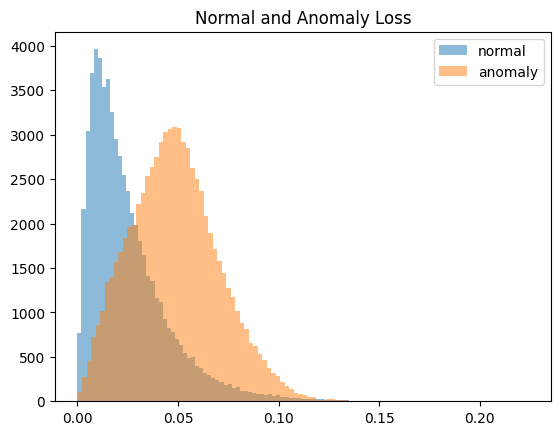

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [25:43<38:27, 192.31s/it]

Correctly predicted background E's: 52474 out of 60676 (86.48%)
Correctly predicted signal E's: 40027 out of 74299 (53.87%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0269 - acc: 0.4048 - val_loss: 0.0372 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3904 - val_loss: 0.0325 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3711 - val_loss: 0.0389 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3575 - val_loss: 0.0324 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3592 - val_loss: 0.0401 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0177 - acc: 0.3559 - val_loss: 0.0313 - val_acc: 0.5868 - lr: 0.0010

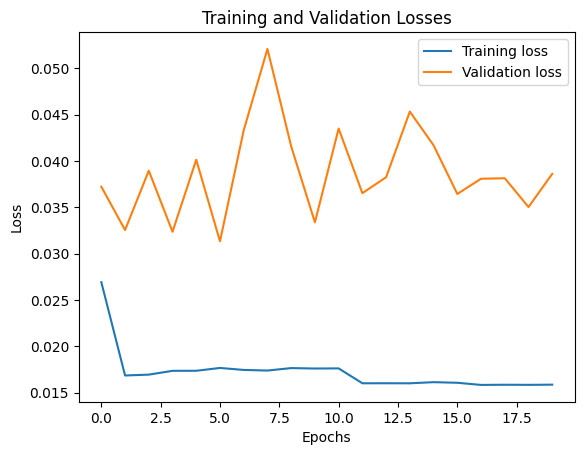

2322/2322 [==============================] - 5s 2ms/step


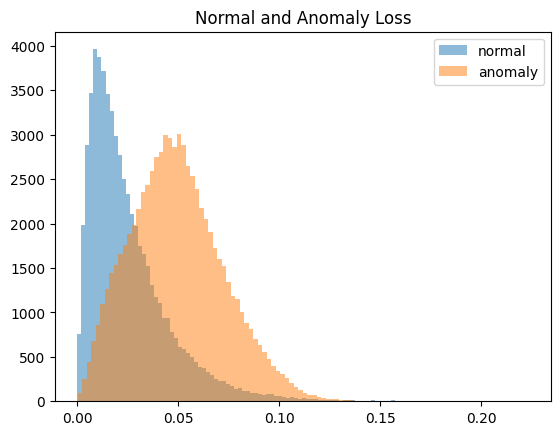

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [28:53<35:07, 191.62s/it]

Correctly predicted background E's: 52376 out of 60676 (86.32%)
Correctly predicted signal E's: 40112 out of 74299 (53.99%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0231 - acc: 0.3952 - val_loss: 0.0347 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0169 - acc: 0.3852 - val_loss: 0.0438 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3588 - val_loss: 0.0410 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0175 - acc: 0.3572 - val_loss: 0.0303 - val_acc: 0.5868 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3542 - val_loss: 0.0468 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3597 - val_loss: 0.0468 - val_acc: 0.2064 - lr: 0.0010

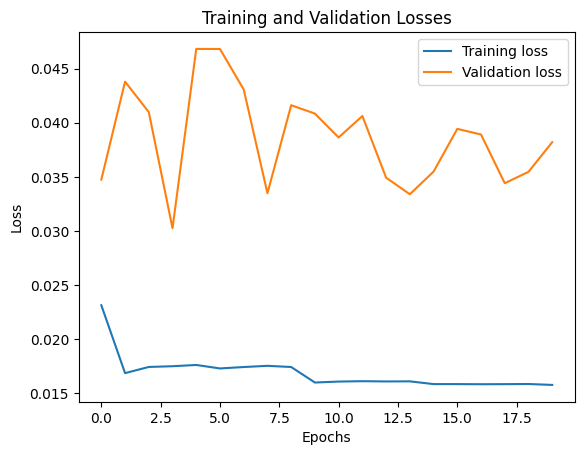

2322/2322 [==============================] - 5s 2ms/step


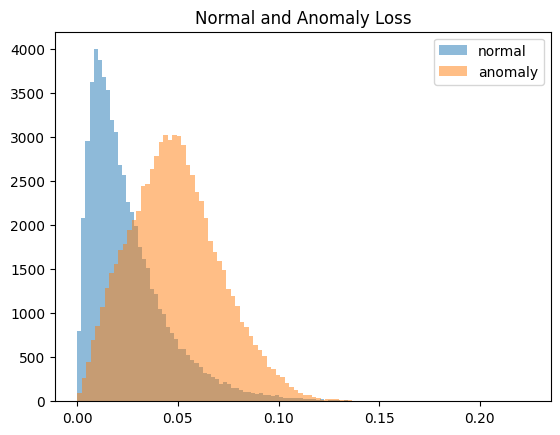

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [32:07<32:03, 192.38s/it]

Correctly predicted background E's: 52406 out of 60676 (86.37%)
Correctly predicted signal E's: 39908 out of 74299 (53.71%)
Epoch 1/20
508/508 [==============================] - 11s 13ms/step - loss: 0.0251 - acc: 0.3997 - val_loss: 0.0436 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0168 - acc: 0.3785 - val_loss: 0.0435 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 6s 12ms/step - loss: 0.0172 - acc: 0.3679 - val_loss: 0.0427 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3591 - val_loss: 0.0433 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3610 - val_loss: 0.0447 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 6s 12ms/step - loss: 0.0175 - acc: 0.3536 - val_loss: 0.0463 - val_acc: 0.2064 - lr: 0.0010

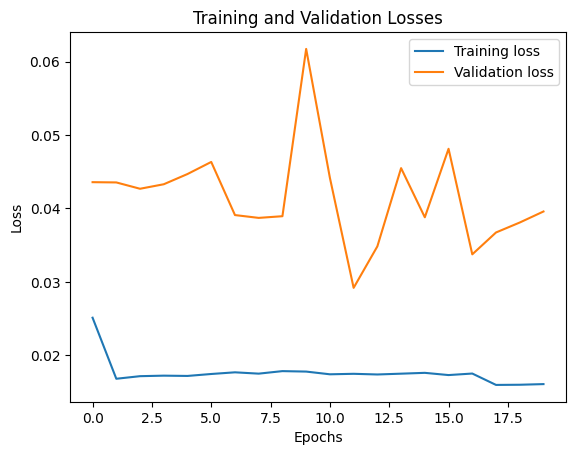

2322/2322 [==============================] - 5s 2ms/step


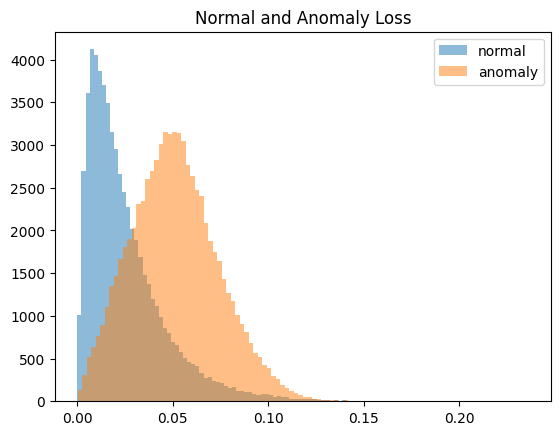

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [35:22<28:57, 193.05s/it]

Correctly predicted background E's: 52469 out of 60676 (86.47%)
Correctly predicted signal E's: 42005 out of 74299 (56.54%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0286 - acc: 0.3893 - val_loss: 0.0336 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0167 - acc: 0.3836 - val_loss: 0.0391 - val_acc: 0.5869 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0170 - acc: 0.3731 - val_loss: 0.0392 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3640 - val_loss: 0.0464 - val_acc: 0.1270 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3683 - val_loss: 0.0524 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3546 - val_loss: 0.0327 - val_acc: 0.2064 - lr: 0.0010

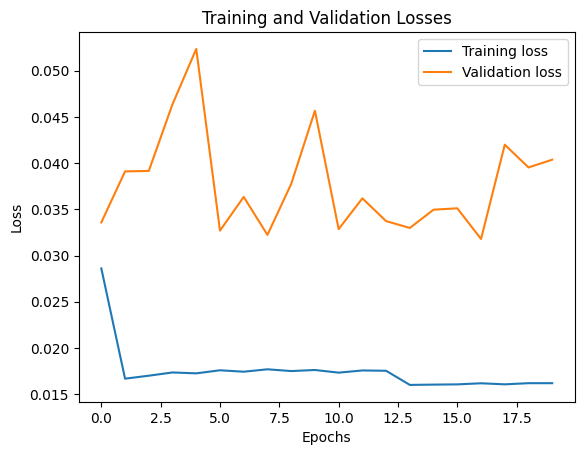

2322/2322 [==============================] - 5s 2ms/step


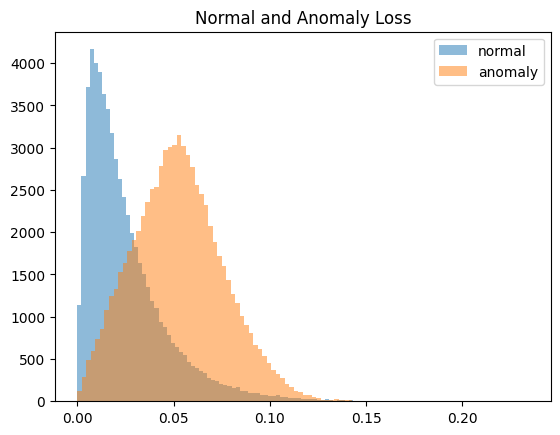

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [38:31<25:36, 192.05s/it]

Correctly predicted background E's: 52522 out of 60676 (86.56%)
Correctly predicted signal E's: 43492 out of 74299 (58.54%)
Epoch 1/20
508/508 [==============================] - 13s 11ms/step - loss: 0.0257 - acc: 0.3994 - val_loss: 0.0451 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0165 - acc: 0.3891 - val_loss: 0.0413 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0172 - acc: 0.3624 - val_loss: 0.0391 - val_acc: 0.5867 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0171 - acc: 0.3718 - val_loss: 0.0419 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3560 - val_loss: 0.0428 - val_acc: 0.1270 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0176 - acc: 0.3542 - val_loss: 0.0470 - val_acc: 0.2065 - lr: 0.0010

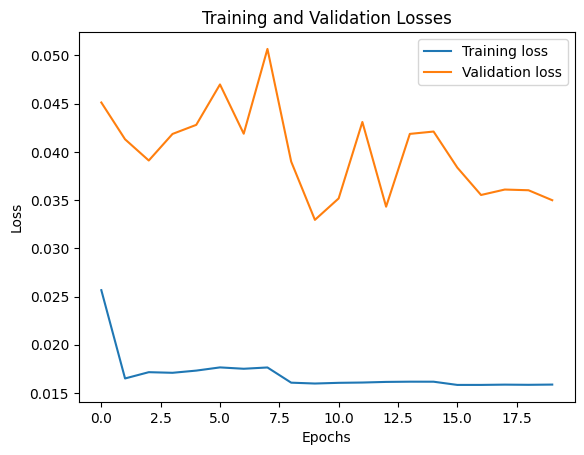

2322/2322 [==============================] - 5s 2ms/step


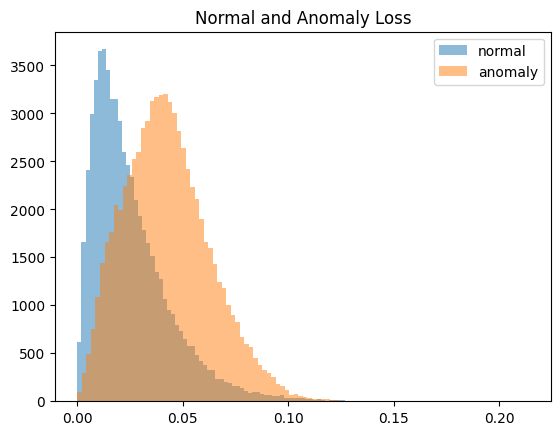

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [41:43<22:23, 191.88s/it]

Correctly predicted background E's: 52153 out of 60676 (85.95%)
Correctly predicted signal E's: 31846 out of 74299 (42.86%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0236 - acc: 0.4025 - val_loss: 0.0393 - val_acc: 0.0798 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3782 - val_loss: 0.0332 - val_acc: 0.5867 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3628 - val_loss: 0.0463 - val_acc: 0.1270 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0173 - acc: 0.3620 - val_loss: 0.0317 - val_acc: 0.5867 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3558 - val_loss: 0.0503 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3502 - val_loss: 0.0382 - val_acc: 0.2065 - lr: 0.0010

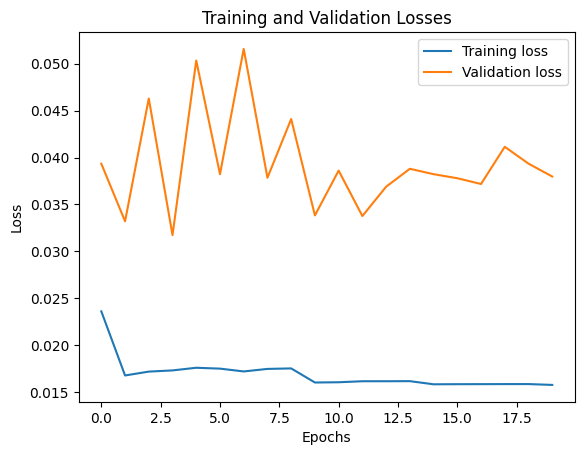

2322/2322 [==============================] - 5s 2ms/step


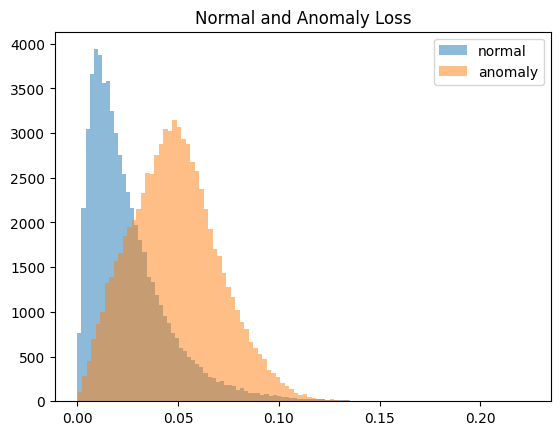

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [44:53<19:08, 191.40s/it]

Correctly predicted background E's: 52502 out of 60676 (86.53%)
Correctly predicted signal E's: 40118 out of 74299 (54.00%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0293 - acc: 0.4023 - val_loss: 0.0357 - val_acc: 0.5869 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0167 - acc: 0.3781 - val_loss: 0.0402 - val_acc: 0.1269 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3791 - val_loss: 0.0479 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0171 - acc: 0.3711 - val_loss: 0.0458 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0176 - acc: 0.3477 - val_loss: 0.0377 - val_acc: 0.5869 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3637 - val_loss: 0.0343 - val_acc: 0.2064 - lr: 0.0010

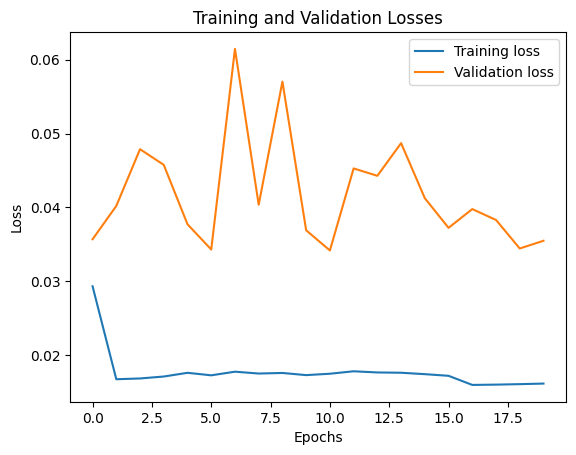

2322/2322 [==============================] - 5s 2ms/step


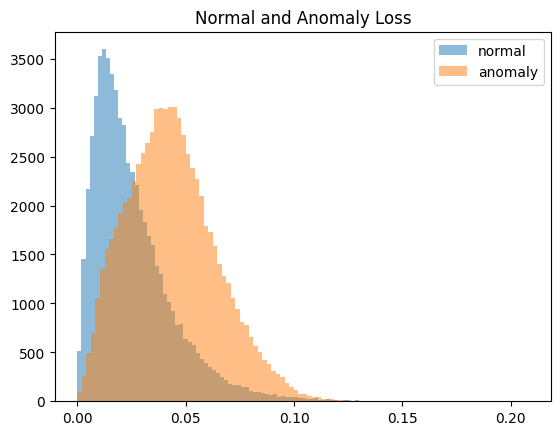

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [48:03<15:54, 190.87s/it]

Correctly predicted background E's: 52245 out of 60676 (86.10%)
Correctly predicted signal E's: 33712 out of 74299 (45.37%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0266 - acc: 0.3938 - val_loss: 0.0418 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0168 - acc: 0.3771 - val_loss: 0.0350 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0170 - acc: 0.3734 - val_loss: 0.0301 - val_acc: 0.5866 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0172 - acc: 0.3669 - val_loss: 0.0412 - val_acc: 0.5866 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 7s 13ms/step - loss: 0.0172 - acc: 0.3625 - val_loss: 0.0432 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3575 - val_loss: 0.0480 - val_acc: 0.2065 - lr: 0.0010

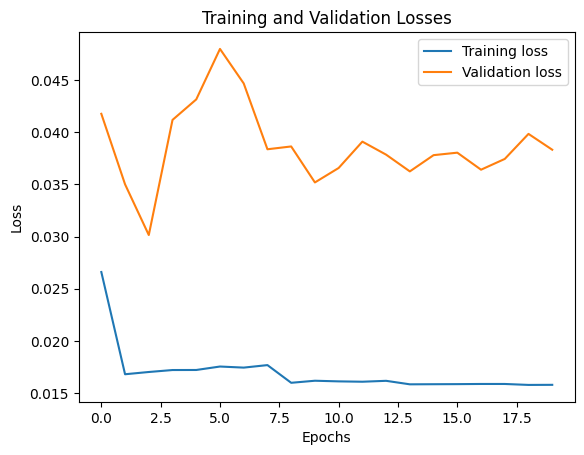

2322/2322 [==============================] - 5s 2ms/step


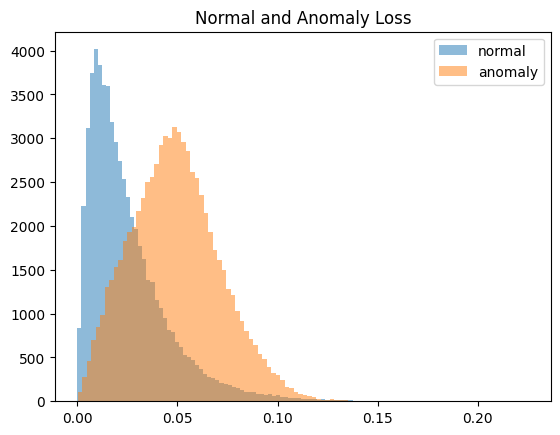

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [51:13<12:42, 190.72s/it]

Correctly predicted background E's: 52479 out of 60676 (86.49%)
Correctly predicted signal E's: 40580 out of 74299 (54.62%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0256 - acc: 0.4026 - val_loss: 0.0354 - val_acc: 0.0797 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0167 - acc: 0.3874 - val_loss: 0.0396 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3691 - val_loss: 0.0631 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0172 - acc: 0.3694 - val_loss: 0.0414 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0176 - acc: 0.3491 - val_loss: 0.0478 - val_acc: 0.1271 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3585 - val_loss: 0.0775 - val_acc: 0.2064 - lr: 0.0010

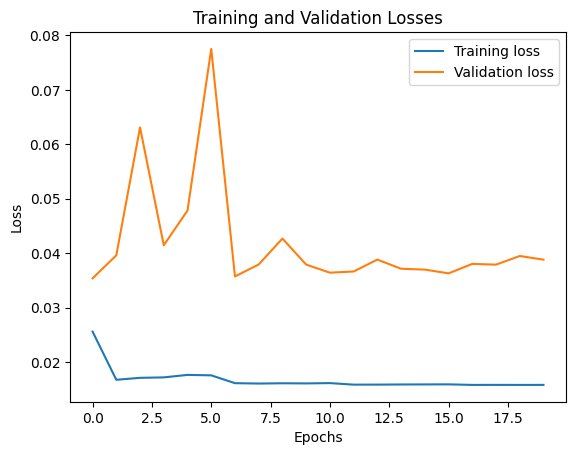

2322/2322 [==============================] - 5s 2ms/step


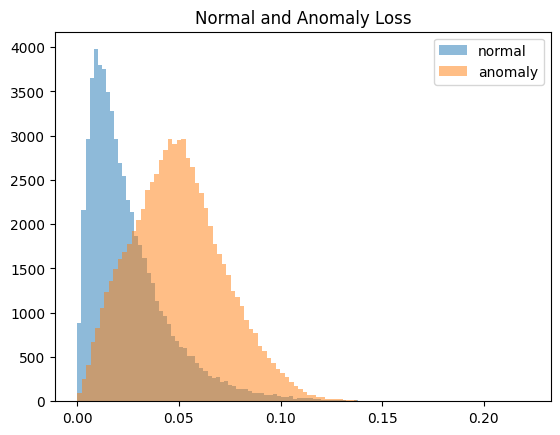

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [54:21<09:29, 189.84s/it]

Correctly predicted background E's: 52459 out of 60676 (86.46%)
Correctly predicted signal E's: 40955 out of 74299 (55.12%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0239 - acc: 0.3992 - val_loss: 0.0392 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3752 - val_loss: 0.0312 - val_acc: 0.5868 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3700 - val_loss: 0.0304 - val_acc: 0.5868 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3547 - val_loss: 0.0418 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3615 - val_loss: 0.0387 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0179 - acc: 0.3533 - val_loss: 0.0442 - val_acc: 0.2064 - lr: 0.0010

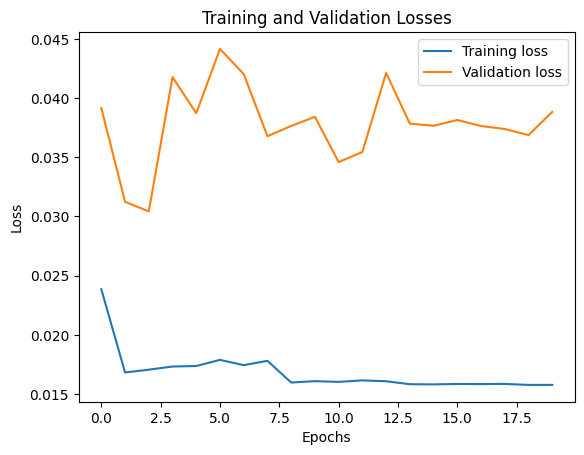

2322/2322 [==============================] - 5s 2ms/step


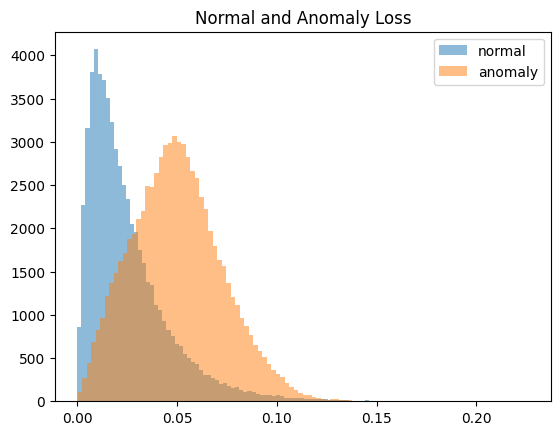

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [57:31<06:19, 189.82s/it]

Correctly predicted background E's: 52486 out of 60676 (86.50%)
Correctly predicted signal E's: 41518 out of 74299 (55.88%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0234 - acc: 0.4086 - val_loss: 0.0307 - val_acc: 0.5868 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0168 - acc: 0.3828 - val_loss: 0.0395 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0174 - acc: 0.3501 - val_loss: 0.0383 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3655 - val_loss: 0.0356 - val_acc: 0.5868 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3593 - val_loss: 0.0483 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0174 - acc: 0.3603 - val_loss: 0.0370 - val_acc: 0.0798 - lr: 0.0010

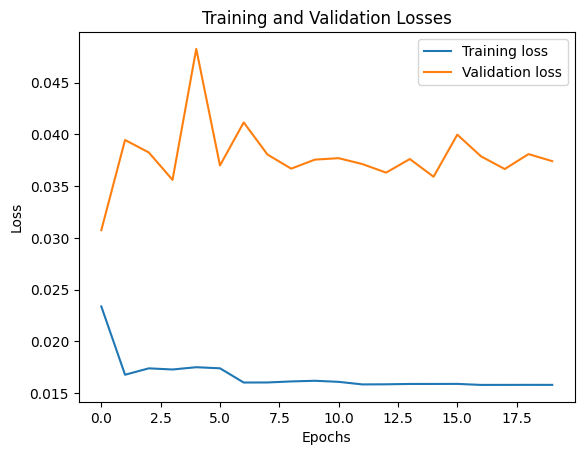

2322/2322 [==============================] - 5s 2ms/step


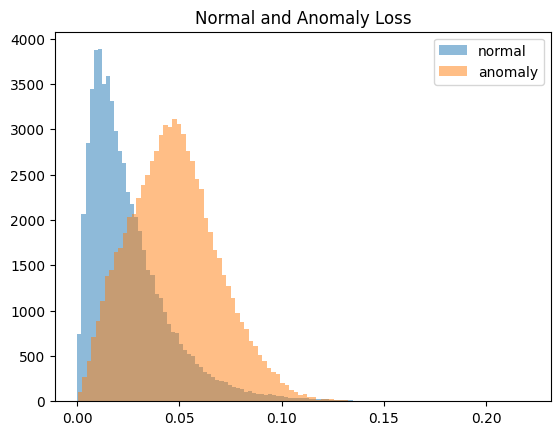

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [1:00:39<03:09, 189.18s/it]

Correctly predicted background E's: 52459 out of 60676 (86.46%)
Correctly predicted signal E's: 38932 out of 74299 (52.40%)
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0262 - acc: 0.3993 - val_loss: 0.0386 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0167 - acc: 0.3905 - val_loss: 0.0435 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3716 - val_loss: 0.0393 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0171 - acc: 0.3711 - val_loss: 0.0321 - val_acc: 0.5867 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0173 - acc: 0.3652 - val_loss: 0.0411 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0175 - acc: 0.3575 - val_loss: 0.0411 - val_acc: 0.2065 - lr: 0.0010

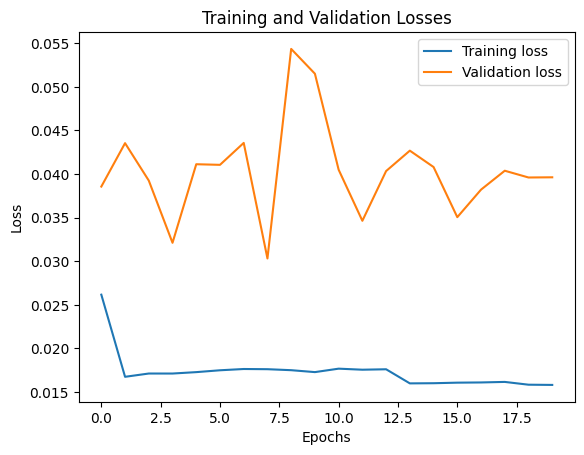

2322/2322 [==============================] - 5s 2ms/step


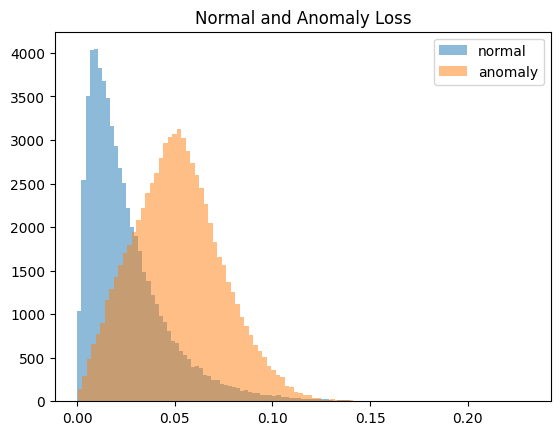

<ipython-input-67-eb308b9e4026>:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [1:03:46<00:00, 191.31s/it]

Correctly predicted background E's: 52546 out of 60676 (86.60%)
Correctly predicted signal E's: 42637 out of 74299 (57.39%)


In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(2048, input_dim=N_inputs, activation="relu"),
                  Dense(1024, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="sigmoid"),
                  Dense(8, activation="relu"),
                  Dense(4, activation="sigmoid"),
                  Dense(2, activation="relu"),


              ])
        self.decoder = Sequential([
                  Dense(4, activation="sigmoid"),
                  Dense(16, activation="relu"),
                  Dense(32, activation="sigmoid"),
                  Dense(64, activation="relu"),
                  Dense(128, activation="sigmoid"),
                  Dense(256, activation="relu"),
                  Dense(512, activation="sigmoid"),
                  Dense(1024, activation="relu"),
                  Dense(2048, activation="sigmoid"),
                  Dense(N_inputs)
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="max")
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='normal')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='anomaly')
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_unregular_sig_relu = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


### Use smaller multipliplier for the standard deviation threshold

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
508/508 [==============================] - 3s 5ms/step - loss: 0.0167 - acc: 0.3953 - val_loss: 0.0341 - val_acc: 0.5210 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 5ms/step - loss: 0.0142 - acc: 0.5318 - val_loss: 0.0336 - val_acc: 0.5764 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 5ms/step - loss: 0.0134 - acc: 0.5451 - val_loss: 0.0322 - val_acc: 0.6313 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0129 - acc: 0.5562 - val_loss: 0.0303 - val_acc: 0.6699 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0124 - acc: 0.5666 - val_loss: 0.0278 - val_acc: 0.7052 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0120 - acc: 0.5798 - val_loss: 0.0244 - val_acc: 0.7435 - lr: 0.0010
Epoch 7/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0114 - acc: 0.5955 - val_loss: 0.0210 - val_acc: 0.771

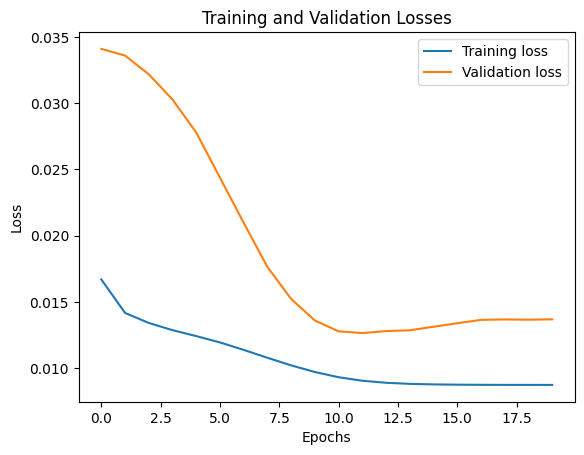

2322/2322 [==============================] - 3s 1ms/step


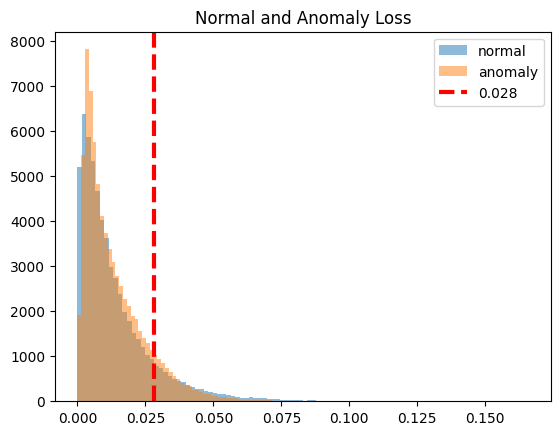

<ipython-input-16-49fbc00b67d7>:157: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [01:59<37:50, 119.49s/it]

Correctly predicted background E's: 53019 out of 60676 (87.38%)
Correctly predicted signal E's: 8385 out of 74299 (11.29%)
Epoch 1/20
508/508 [==============================] - 3s 5ms/step - loss: 0.0161 - acc: 0.3801 - val_loss: 0.0375 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 2s 4ms/step - loss: 0.0145 - acc: 0.4373 - val_loss: 0.0337 - val_acc: 0.2318 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 2s 4ms/step - loss: 0.0116 - acc: 0.5767 - val_loss: 0.0258 - val_acc: 0.3353 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0097 - acc: 0.6199 - val_loss: 0.0224 - val_acc: 0.6509 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0093 - acc: 0.5990 - val_loss: 0.0202 - val_acc: 0.7265 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0091 - acc: 0.5891 - val_loss: 0.0189 - val_acc: 0.7437 - lr: 0.0010
Epoch 7

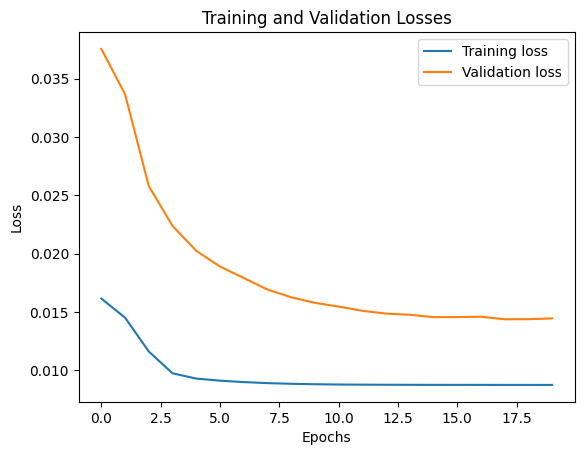

2322/2322 [==============================] - 3s 1ms/step


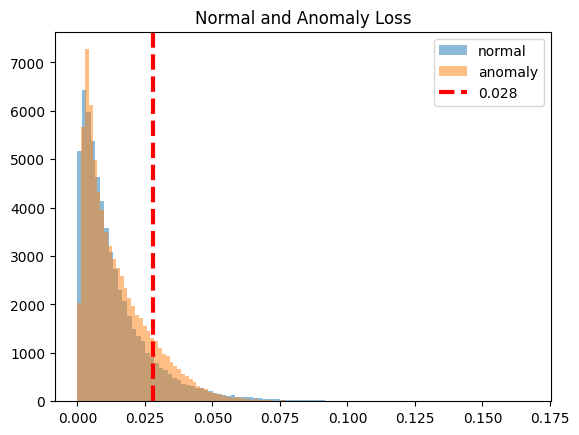

<ipython-input-16-49fbc00b67d7>:157: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [03:56<35:24, 118.00s/it]

Correctly predicted background E's: 53128 out of 60676 (87.56%)
Correctly predicted signal E's: 11056 out of 74299 (14.88%)
Epoch 1/20
508/508 [==============================] - 3s 5ms/step - loss: 0.0133 - acc: 0.5245 - val_loss: 0.0250 - val_acc: 0.7506 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 2s 4ms/step - loss: 0.0104 - acc: 0.5744 - val_loss: 0.0188 - val_acc: 0.7540 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 2s 4ms/step - loss: 0.0094 - acc: 0.5632 - val_loss: 0.0163 - val_acc: 0.7484 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 2s 4ms/step - loss: 0.0090 - acc: 0.5575 - val_loss: 0.0152 - val_acc: 0.7445 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0089 - acc: 0.5552 - val_loss: 0.0147 - val_acc: 0.7421 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 2s 5ms/step - loss: 0.0088 - acc: 0.5552 - val_loss: 0.0145 - val_acc: 0.7419 - lr: 0.0010
Epoch 

 10%|█         | 2/20 [04:27<40:06, 133.71s/it]


KeyboardInterrupt: ignored

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(1, activation="relu"),

              ])
        self.decoder = Sequential([
                  Dense(N_inputs, activation="sigmoid")
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="max")
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='normal')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    ####### TESTING true_labels = np.concatenate([np.zeros(len(background_predictions)), np.ones(len(signal_predictions))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Get graphs without threshold

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/35
1264/1264 [==============================] - 17s 10ms/step - loss: 0.0198 - acc: 0.3506 - val_loss: 0.0349 - val_acc: 0.2080 - lr: 0.0010
Epoch 2/35
1264/1264 [==============================] - 12s 10ms/step - loss: 0.0187 - acc: 0.3350 - val_loss: 0.0364 - val_acc: 0.0794 - lr: 0.0010
Epoch 3/35
1264/1264 [==============================] - 12s 10ms/step - loss: 0.0187 - acc: 0.3422 - val_loss: 0.0294 - val_acc: 0.5857 - lr: 0.0010
Epoch 4/35
1264/1264 [==============================] - 12s 10ms/step - loss: 0.0186 - acc: 0.3335 - val_loss: 0.0421 - val_acc: 0.2080 - lr: 0.0010
Epoch 5/35
1264/1264 [==============================] - 12s 10ms/step - loss: 0.0187 - acc: 0.3356 - val_loss: 0.0453 - val_acc: 0.2080 - lr: 0.0010
Epoch 6/35
1264/1264 [==============================] - 12s 10ms/step - loss: 0.0189 - acc: 0.3325 - val_loss: 0.0305 - val_acc: 0.5857 - lr: 0.0010
Epoch 7/35
1264/1264 [==============================] - 12s 10ms/step - loss: 0.0186 - acc: 0.3406 - val_l

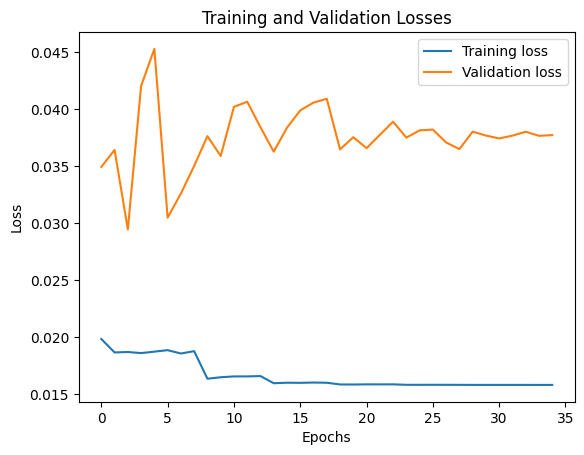

2322/2322 [==============================] - 5s 2ms/step
Manual Threshold:  0.03497615824481498
2322/2322 [==============================] - 4s 2ms/step


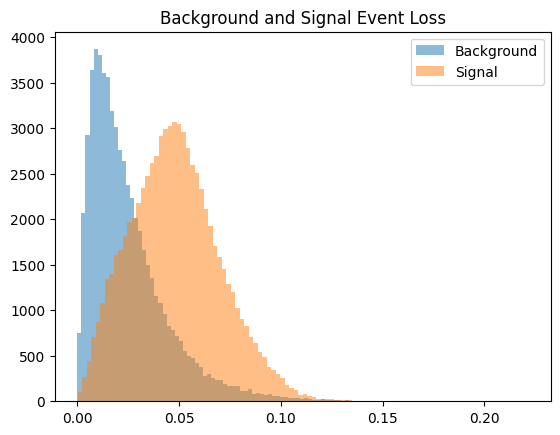

<ipython-input-11-f1d133489172>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [08:19<2:38:13, 499.67s/it]

Correctly predicted background E's: 46807 out of 60676 (77.14%)
Correctly predicted signal E's: 52653 out of 74299 (70.87%)
Thresholds:  [2 1 0]
Epoch 1/35
1264/1264 [==============================] - 16s 9ms/step - loss: 0.0203 - acc: 0.3514 - val_loss: 0.0424 - val_acc: 0.2080 - lr: 0.0010
Epoch 2/35
1264/1264 [==============================] - 11s 9ms/step - loss: 0.0186 - acc: 0.3404 - val_loss: 0.0414 - val_acc: 0.2080 - lr: 0.0010
Epoch 3/35
1264/1264 [==============================] - 11s 9ms/step - loss: 0.0190 - acc: 0.3331 - val_loss: 0.0367 - val_acc: 0.0793 - lr: 0.0010
Epoch 4/35
1264/1264 [==============================] - 11s 9ms/step - loss: 0.0189 - acc: 0.3383 - val_loss: 0.0296 - val_acc: 0.5858 - lr: 0.0010
Epoch 5/35
1264/1264 [==============================] - 11s 9ms/step - loss: 0.0186 - acc: 0.3328 - val_loss: 0.0301 - val_acc: 0.5858 - lr: 0.0010
Epoch 6/35
1264/1264 [==============================] - 11s 9ms/step - loss: 0.0191 - acc: 0.3357 - val_loss: 0.034

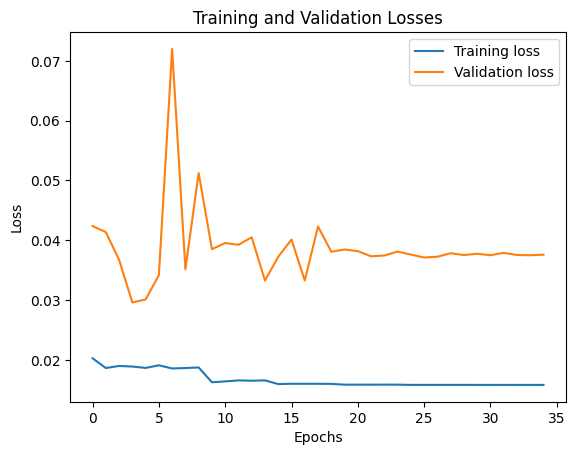

2322/2322 [==============================] - 5s 2ms/step
Manual Threshold:  0.03494839911468263
2322/2322 [==============================] - 5s 2ms/step


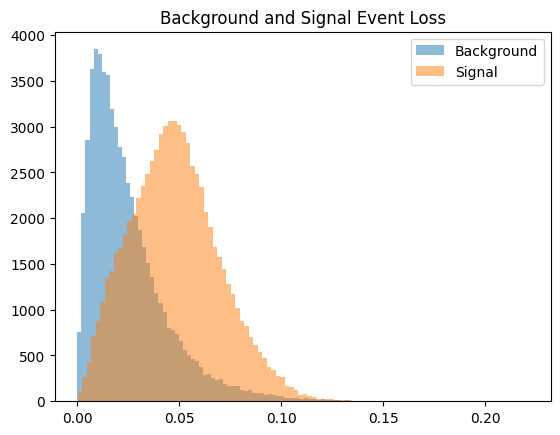

<ipython-input-11-f1d133489172>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [16:05<2:23:55, 479.75s/it]

Correctly predicted background E's: 46754 out of 60676 (77.06%)
Correctly predicted signal E's: 52428 out of 74299 (70.56%)
Thresholds:  [2 1 0]
Epoch 1/35
1265/1265 [==============================] - 16s 9ms/step - loss: 0.0195 - acc: 0.3508 - val_loss: 0.0634 - val_acc: 0.5858 - lr: 0.0010
Epoch 2/35
1265/1265 [==============================] - 11s 9ms/step - loss: 0.0188 - acc: 0.3357 - val_loss: 0.0993 - val_acc: 0.5858 - lr: 0.0010
Epoch 3/35
1265/1265 [==============================] - 12s 9ms/step - loss: 0.0186 - acc: 0.3416 - val_loss: 0.0761 - val_acc: 0.2079 - lr: 0.0010
Epoch 4/35
1265/1265 [==============================] - 11s 9ms/step - loss: 0.0186 - acc: 0.3373 - val_loss: 0.0442 - val_acc: 0.5858 - lr: 0.0010
Epoch 5/35
1265/1265 [==============================] - 11s 9ms/step - loss: 0.0189 - acc: 0.3332 - val_loss: 0.4345 - val_acc: 0.5858 - lr: 0.0010
Epoch 6/35
1265/1265 [==============================] - 11s 9ms/step - loss: 0.0195 - acc: 0.3468 - val_loss: 0.073

 10%|█         | 2/20 [17:35<2:38:15, 527.51s/it]


KeyboardInterrupt: ignored

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(2048, input_dim=N_inputs, activation="relu"),
                  Dense(1024, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="sigmoid"),
                  Dense(8, activation="relu"),

              ])
        self.decoder = Sequential([
                  Dense(16, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(1024, activation="relu"),
                  Dense(2048, activation="sigmoid"),
                  Dense(N_inputs)
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="max")
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=35,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=80,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    k = 0.5
    threshold = np.mean(train_loss_background) + k * np.std(train_loss_background)

    print ("Manual Threshold: ", threshold)
    # threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='Background')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='Signal')
    plt.legend(loc='upper right')
    plt.title("Background and Signal Event Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    ####### TESTING true_labels = np.concatenate([np.zeros(len(background_predictions)), np.ones(len(signal_predictions))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([signal_predictions, background_predictions])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, threasholds = roc_curve(Y_cwola_valT21, scores)
    print("Thresholds: ", threasholds)
    cwola_rocsT21_autoencoder_MSE_unregular = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Plotting the roc curve using MSE | Without earlystopping

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
508/508 [==============================] - 7s 8ms/step - loss: 0.0196 - acc: 0.4209 - val_loss: 0.0363 - val_acc: 0.2065
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0381 - val_acc: 0.2065
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0379 - val_acc: 0.2065
Epoch 4/20
508/508 [==============================] - 4s 7ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0391 - val_acc: 0.2065
Epoch 5/20
508/508 [==============================] - 4s 7ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0383 - val_acc: 0.2065
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0159 - acc: 0.4295 - val_loss: 0.0356 - val_acc: 0.2065
Epoch 7/20
508/508 [==============================] - 4s 7ms/step - loss: 0.0158 - acc: 0.4294 - val_loss: 0.0386 - val_acc: 0.2065
Epoch 8/20
508/508 [==============================] - 4s 8ms/step - loss: 0.

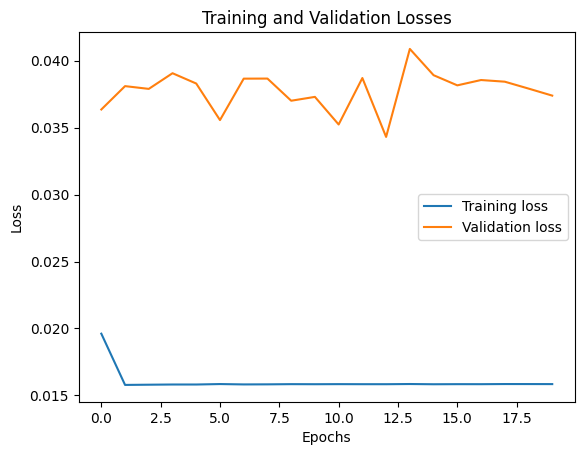

1897/1897 [==============================] - 3s 2ms/step


  0%|          | 0/20 [01:28<?, ?it/s]


KeyboardInterrupt: ignored

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(16, activation="relu"),
                  Dense(8, activation="relu"),
                  Dense(4, activation="relu"),
                  Dense(2, activation="relu"),
              ])
        self.decoder = Sequential([
                  Dense(4, activation="relu"),
                  Dense(8, activation="relu"),
                  Dense(16, activation="sigmoid"),
                  Dense(N_inputs)
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='Background')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='Signal')
    plt.legend(loc='upper right')
    plt.title("Background and Signal Event Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_nocallback = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Plotting the roc curve using MAE | Relu and final Sigmoid

  0%|          | 0/20 [00:00<?, ?it/s]

-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 11s 11ms/step - loss: 0.0852 - acc: 0.3843 - val_loss: 0.1733 - val_acc: 0.1270 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0823 - acc: 0.3716 - val_loss: 0.1508 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0817 - acc: 0.3796 - val_loss: 0.1566 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0809 - acc: 0.3866 - val_loss: 0.1580 - val_acc: 0.0798 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 6s 12ms/step - loss: 0.0820 - acc: 0.3759 - val_loss: 0.1525 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0816 - acc: 0.3753 - val_loss: 0.1911 - val_acc: 0.2065 - lr: 0.0010
Epoch 7/20
508/508 [==============================] - 6s 11ms/step - loss: 0.08

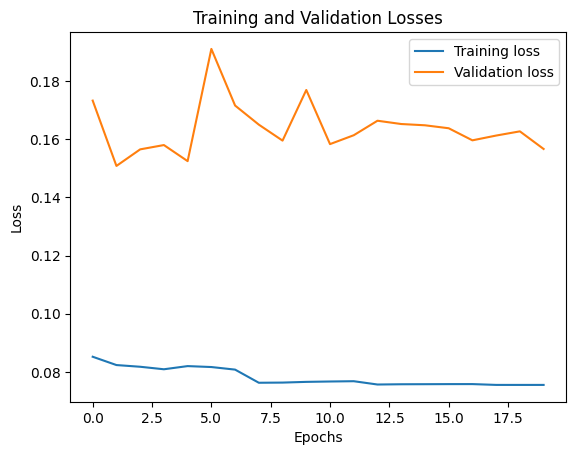

2322/2322 [==============================] - 5s 2ms/step


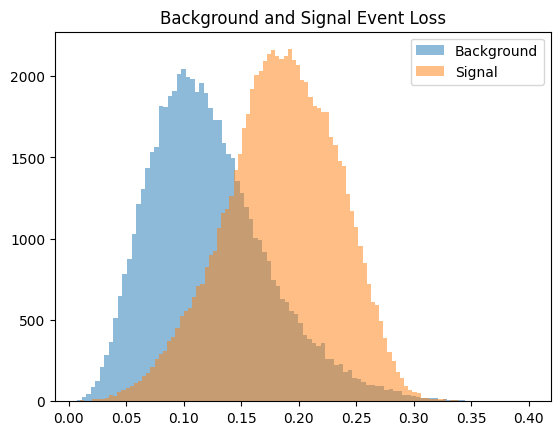

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [03:18<1:02:51, 198.50s/it]

Correctly predicted background E's: 51362 out of 60676 (84.65%)
Correctly predicted signal E's: 44596 out of 74299 (60.02%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0859 - acc: 0.3874 - val_loss: 0.1538 - val_acc: 0.5867 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3799 - val_loss: 0.1803 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0824 - acc: 0.3737 - val_loss: 0.1511 - val_acc: 0.5867 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0815 - acc: 0.3790 - val_loss: 0.1614 - val_acc: 0.1271 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0813 - acc: 0.3828 - val_loss: 0.1666 - val_acc: 0.0798 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3786 - val

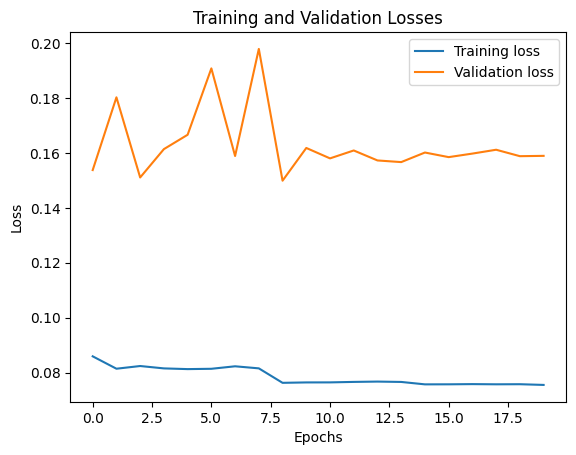

2322/2322 [==============================] - 5s 2ms/step


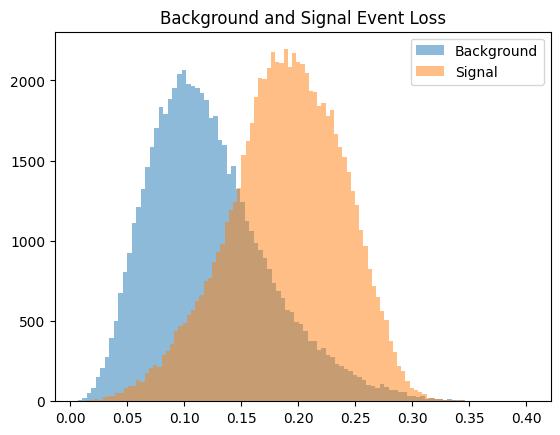

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [06:23<57:14, 190.82s/it]  

Correctly predicted background E's: 51343 out of 60676 (84.62%)
Correctly predicted signal E's: 46810 out of 74299 (63.00%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0836 - acc: 0.3780 - val_loss: 0.1596 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0824 - acc: 0.3741 - val_loss: 0.1794 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0815 - acc: 0.3818 - val_loss: 0.1552 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0812 - acc: 0.3774 - val_loss: 0.1966 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0809 - acc: 0.3831 - val_loss: 0.1475 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0825 - acc: 0.3762 - val

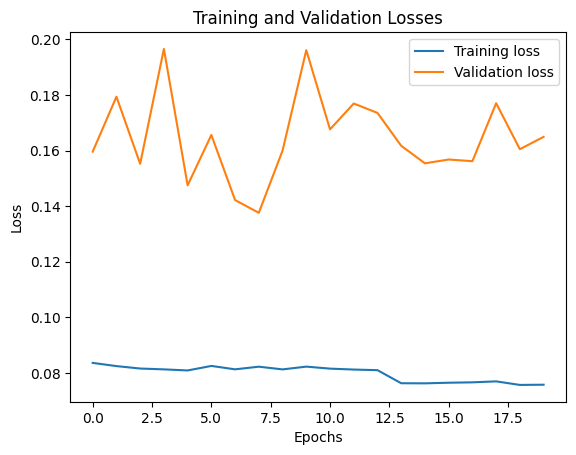

2322/2322 [==============================] - 5s 2ms/step


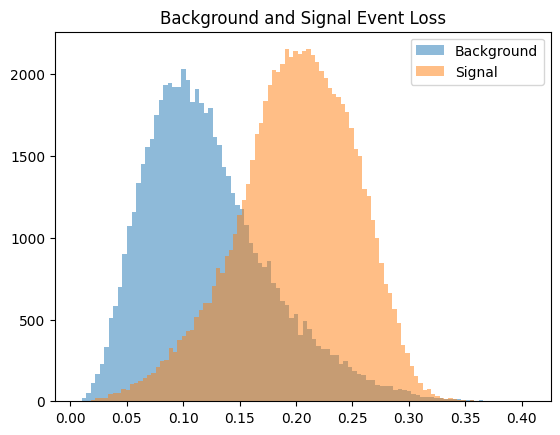

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [09:31<53:37, 189.27s/it]

Correctly predicted background E's: 51221 out of 60676 (84.42%)
Correctly predicted signal E's: 51070 out of 74299 (68.74%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0844 - acc: 0.3766 - val_loss: 0.1495 - val_acc: 0.5869 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3695 - val_loss: 0.1775 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0829 - acc: 0.3647 - val_loss: 0.1416 - val_acc: 0.5869 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0809 - acc: 0.3734 - val_loss: 0.2080 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0819 - acc: 0.3778 - val_loss: 0.1827 - val_acc: 0.0798 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3797 - val

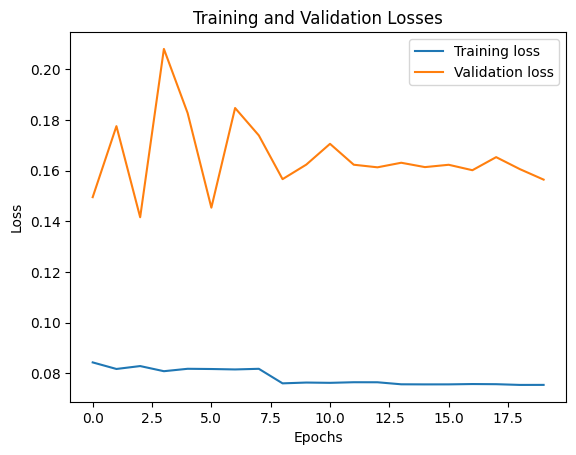

2322/2322 [==============================] - 5s 2ms/step


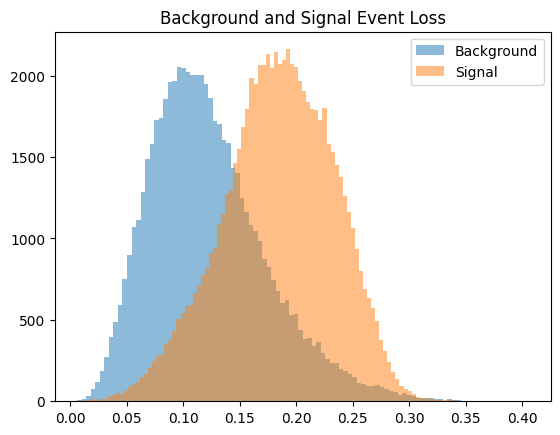

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [12:37<50:10, 188.14s/it]

Correctly predicted background E's: 51391 out of 60676 (84.70%)
Correctly predicted signal E's: 44251 out of 74299 (59.56%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0881 - acc: 0.3828 - val_loss: 0.1717 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0818 - acc: 0.3741 - val_loss: 0.1861 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0816 - acc: 0.3813 - val_loss: 0.1694 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3720 - val_loss: 0.2003 - val_acc: 0.1270 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0821 - acc: 0.3745 - val_loss: 0.1637 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0808 - acc: 0.3824 - val

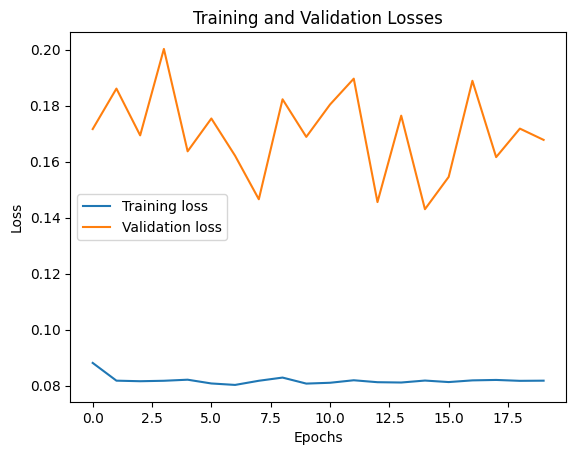

2322/2322 [==============================] - 5s 2ms/step


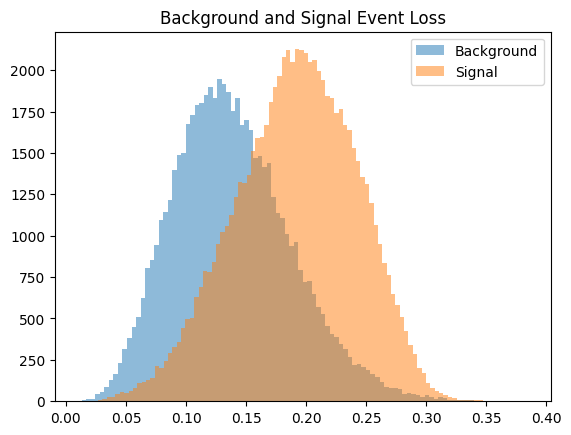

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [15:45<46:58, 187.91s/it]

Correctly predicted background E's: 51035 out of 60676 (84.11%)
Correctly predicted signal E's: 40674 out of 74299 (54.74%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0851 - acc: 0.3802 - val_loss: 0.1855 - val_acc: 0.1270 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0815 - acc: 0.3795 - val_loss: 0.1420 - val_acc: 0.5867 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0810 - acc: 0.3825 - val_loss: 0.1580 - val_acc: 0.1270 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0816 - acc: 0.3795 - val_loss: 0.1505 - val_acc: 0.5867 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0822 - acc: 0.3732 - val_loss: 0.1691 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3804 - val

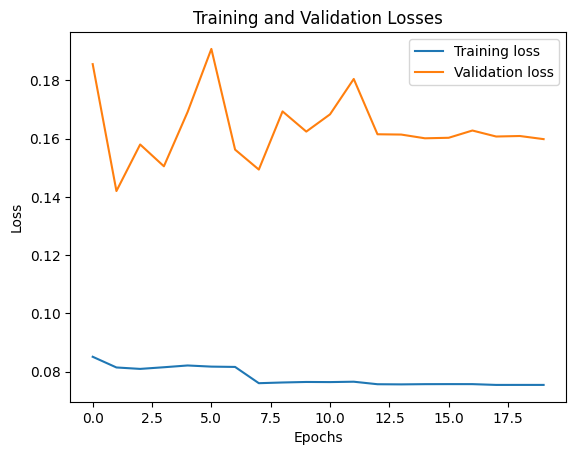

2322/2322 [==============================] - 5s 2ms/step


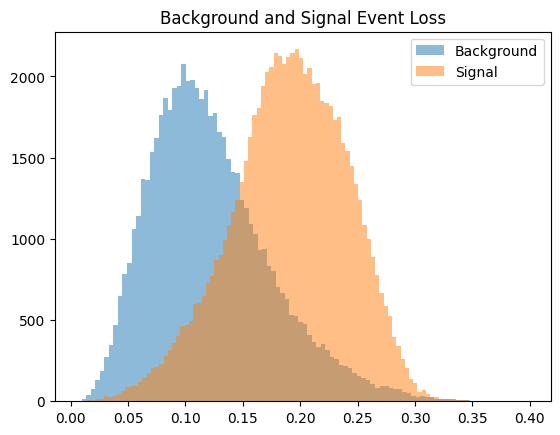

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [18:52<43:45, 187.55s/it]

Correctly predicted background E's: 51315 out of 60676 (84.57%)
Correctly predicted signal E's: 47393 out of 74299 (63.79%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0857 - acc: 0.3817 - val_loss: 0.1653 - val_acc: 0.1270 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0820 - acc: 0.3718 - val_loss: 0.1704 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0803 - acc: 0.3894 - val_loss: 0.1755 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0817 - acc: 0.3795 - val_loss: 0.1795 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0817 - acc: 0.3791 - val_loss: 0.1686 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0809 - acc: 0.3857 - val

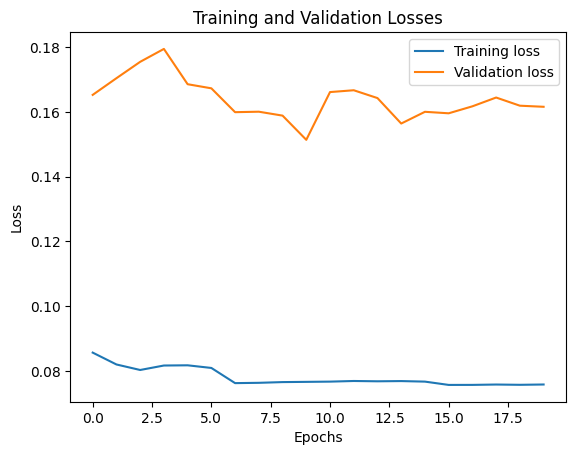

2322/2322 [==============================] - 5s 2ms/step


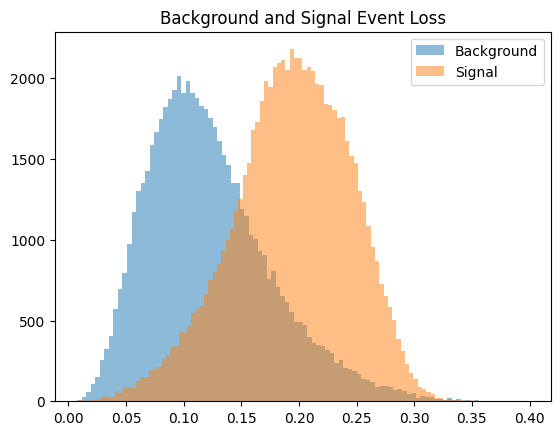

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [22:00<40:43, 187.97s/it]

Correctly predicted background E's: 51244 out of 60676 (84.46%)
Correctly predicted signal E's: 48606 out of 74299 (65.42%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0846 - acc: 0.3818 - val_loss: 0.1701 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0806 - acc: 0.3859 - val_loss: 0.1709 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0820 - acc: 0.3804 - val_loss: 0.1865 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0843 - acc: 0.3544 - val_loss: 0.1939 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0811 - acc: 0.3887 - val_loss: 0.1496 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0815 - acc: 0.3850 - val

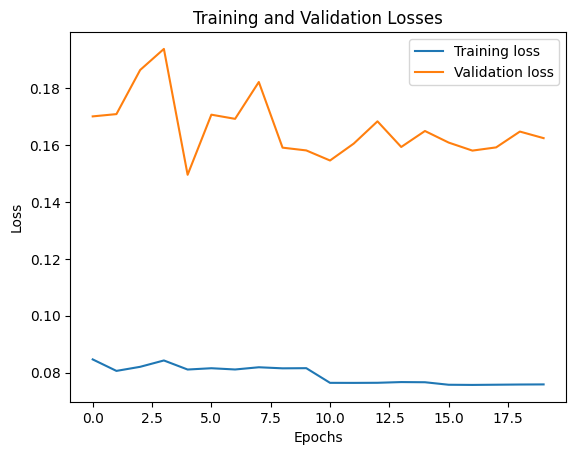

2322/2322 [==============================] - 5s 2ms/step


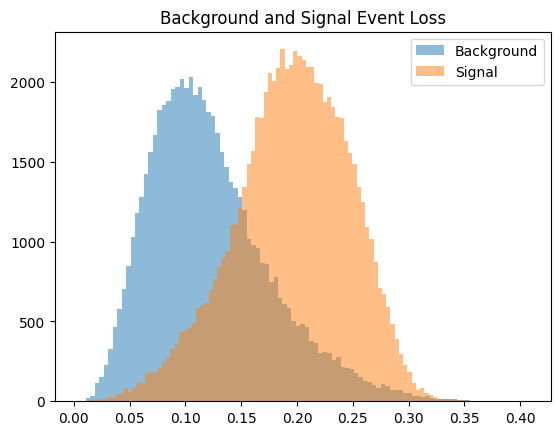

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [25:10<37:40, 188.34s/it]

Correctly predicted background E's: 51266 out of 60676 (84.49%)
Correctly predicted signal E's: 49333 out of 74299 (66.40%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 11s 11ms/step - loss: 0.0836 - acc: 0.3900 - val_loss: 0.1643 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0809 - acc: 0.3753 - val_loss: 0.1964 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0817 - acc: 0.3833 - val_loss: 0.1539 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0808 - acc: 0.3860 - val_loss: 0.1614 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0817 - acc: 0.3830 - val_loss: 0.1676 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0826 - acc: 0.3685 - val

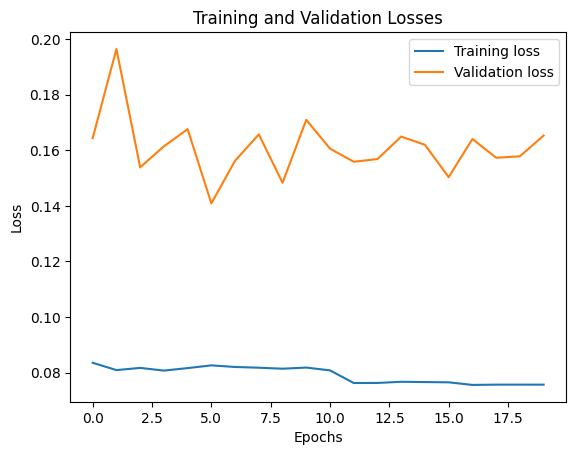

2322/2322 [==============================] - 5s 2ms/step


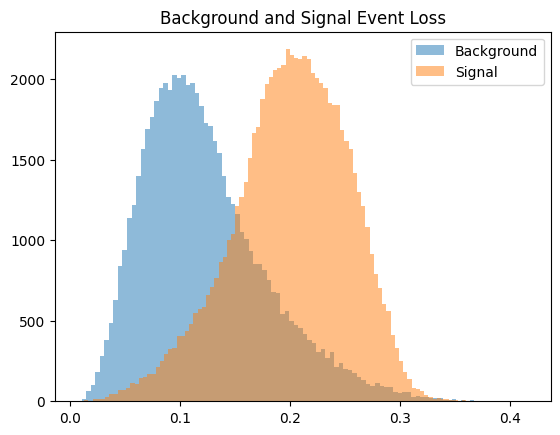

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [28:18<34:33, 188.46s/it]

Correctly predicted background E's: 51226 out of 60676 (84.43%)
Correctly predicted signal E's: 51041 out of 74299 (68.70%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0860 - acc: 0.3866 - val_loss: 0.1913 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0816 - acc: 0.3788 - val_loss: 0.1596 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0813 - acc: 0.3731 - val_loss: 0.1685 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0804 - acc: 0.3904 - val_loss: 0.1461 - val_acc: 0.5868 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 6s 12ms/step - loss: 0.0817 - acc: 0.3824 - val_loss: 0.1698 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 6s 11ms/step - loss: 0.0816 - acc: 0.3737 - val

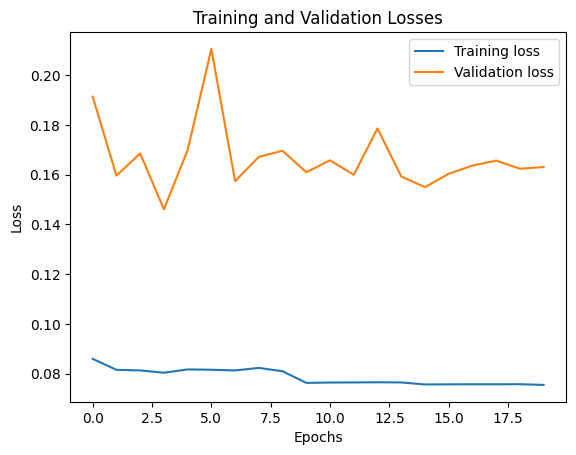

2322/2322 [==============================] - 5s 2ms/step


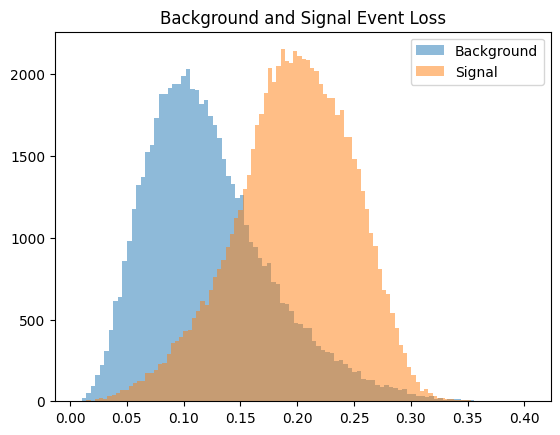

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [31:28<31:29, 188.92s/it]

Correctly predicted background E's: 51281 out of 60676 (84.52%)
Correctly predicted signal E's: 49842 out of 74299 (67.08%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 12s 11ms/step - loss: 0.0849 - acc: 0.3791 - val_loss: 0.1469 - val_acc: 0.5869 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0811 - acc: 0.3811 - val_loss: 0.1473 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0805 - acc: 0.3912 - val_loss: 0.1732 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0826 - acc: 0.3733 - val_loss: 0.1767 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3778 - val_loss: 0.1633 - val_acc: 0.1270 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0822 - acc: 0.3787 - val

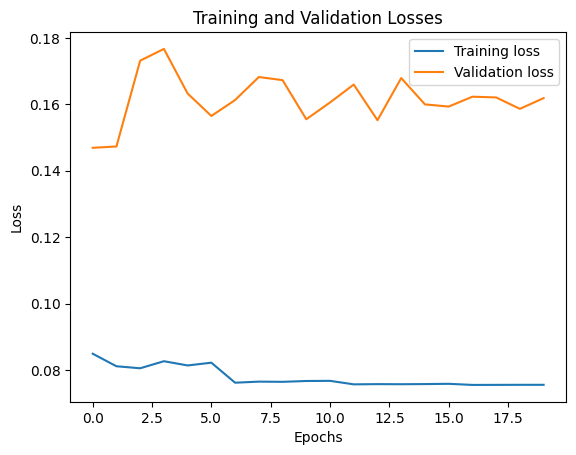

2322/2322 [==============================] - 5s 2ms/step


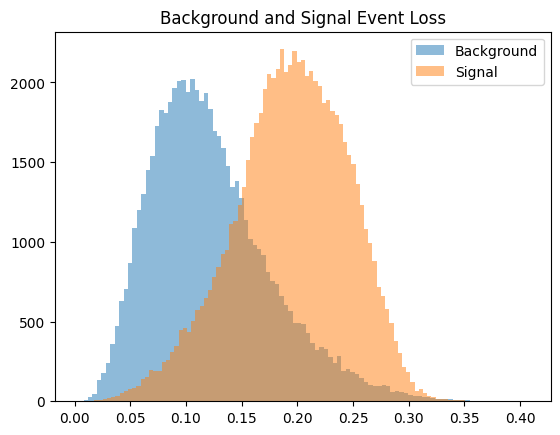

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [34:36<28:16, 188.51s/it]

Correctly predicted background E's: 51288 out of 60676 (84.53%)
Correctly predicted signal E's: 48745 out of 74299 (65.61%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0847 - acc: 0.3849 - val_loss: 0.1551 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0812 - acc: 0.3805 - val_loss: 0.1719 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3792 - val_loss: 0.1845 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0822 - acc: 0.3757 - val_loss: 0.1735 - val_acc: 0.1270 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0816 - acc: 0.3796 - val_loss: 0.1846 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0816 - acc: 0.3767 - val

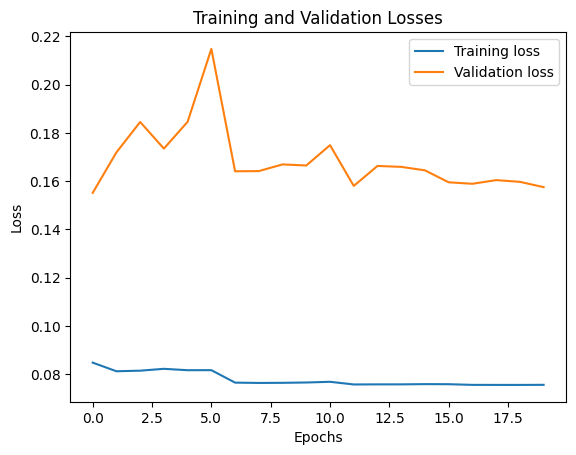

2322/2322 [==============================] - 5s 2ms/step


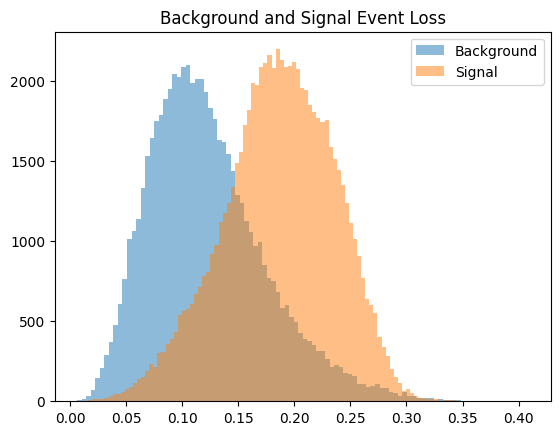

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [37:42<25:01, 187.74s/it]

Correctly predicted background E's: 51416 out of 60676 (84.74%)
Correctly predicted signal E's: 45213 out of 74299 (60.85%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0850 - acc: 0.3882 - val_loss: 0.1788 - val_acc: 0.1270 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0813 - acc: 0.3799 - val_loss: 0.1568 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0810 - acc: 0.3788 - val_loss: 0.1764 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0826 - acc: 0.3723 - val_loss: 0.1523 - val_acc: 0.5867 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3715 - val_loss: 0.1750 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3694 - val

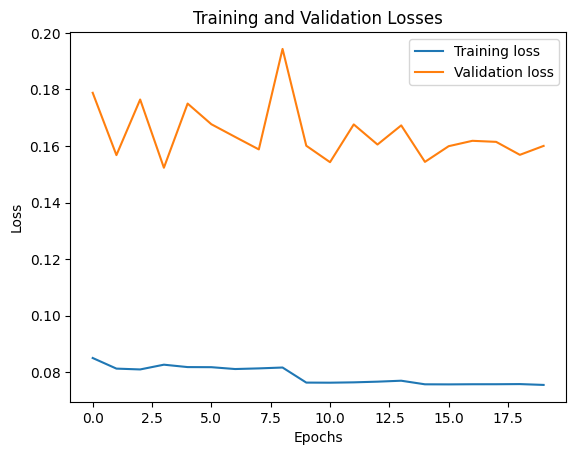

2322/2322 [==============================] - 5s 2ms/step


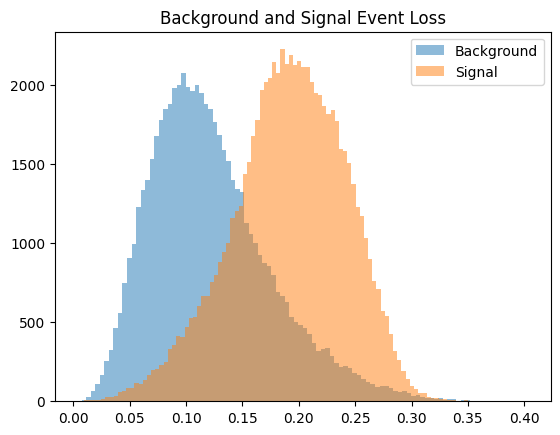

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [40:48<21:51, 187.37s/it]

Correctly predicted background E's: 51309 out of 60676 (84.56%)
Correctly predicted signal E's: 47819 out of 74299 (64.36%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0862 - acc: 0.3792 - val_loss: 0.1535 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0802 - acc: 0.3924 - val_loss: 0.1758 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0820 - acc: 0.3733 - val_loss: 0.1587 - val_acc: 0.0798 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3737 - val_loss: 0.1534 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3792 - val_loss: 0.1800 - val_acc: 0.1270 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0815 - acc: 0.3838 - val

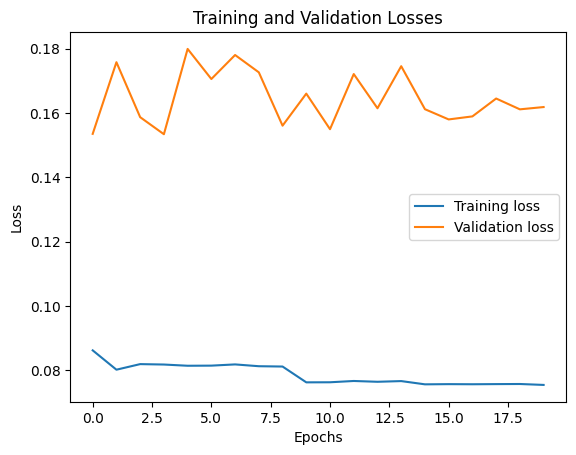

2322/2322 [==============================] - 6s 2ms/step


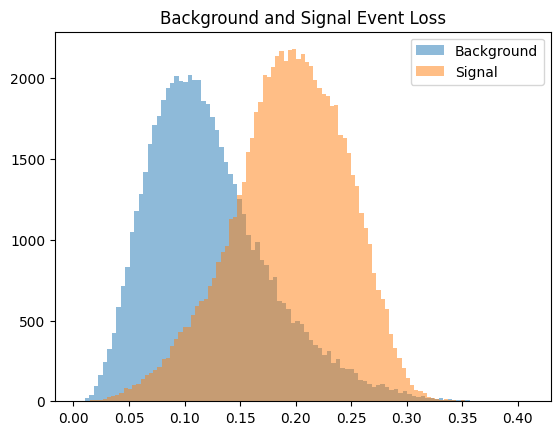

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [43:56<18:45, 187.60s/it]

Correctly predicted background E's: 51286 out of 60676 (84.52%)
Correctly predicted signal E's: 48937 out of 74299 (65.86%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0851 - acc: 0.3815 - val_loss: 0.1704 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0819 - acc: 0.3685 - val_loss: 0.1569 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3870 - val_loss: 0.1631 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0809 - acc: 0.3894 - val_loss: 0.1468 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3739 - val_loss: 0.1475 - val_acc: 0.5869 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0832 - acc: 0.3596 - val

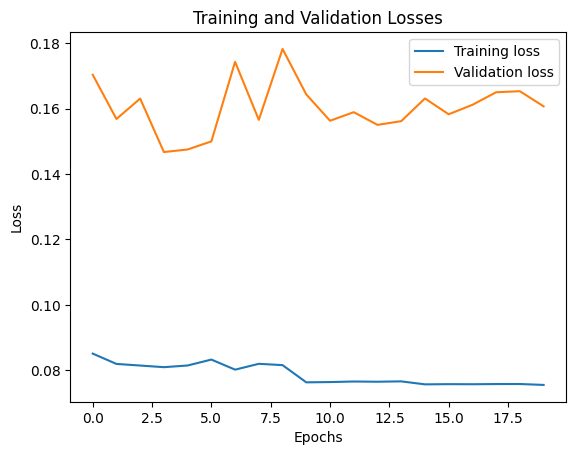

2322/2322 [==============================] - 5s 2ms/step


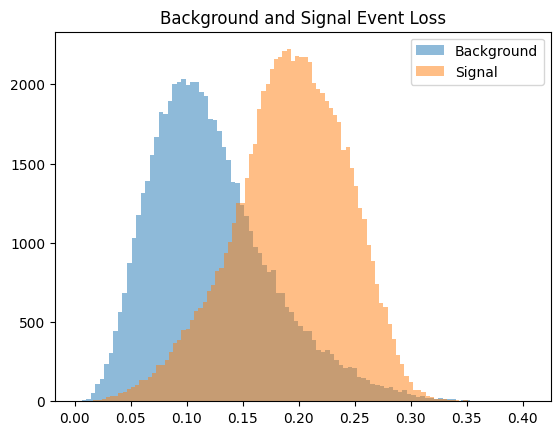

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [47:04<15:37, 187.52s/it]

Correctly predicted background E's: 51270 out of 60676 (84.50%)
Correctly predicted signal E's: 48365 out of 74299 (65.10%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0841 - acc: 0.3820 - val_loss: 0.1719 - val_acc: 0.0798 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0815 - acc: 0.3842 - val_loss: 0.1668 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0821 - acc: 0.3750 - val_loss: 0.1713 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0812 - acc: 0.3847 - val_loss: 0.1763 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3875 - val_loss: 0.1560 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0812 - acc: 0.3821 - val

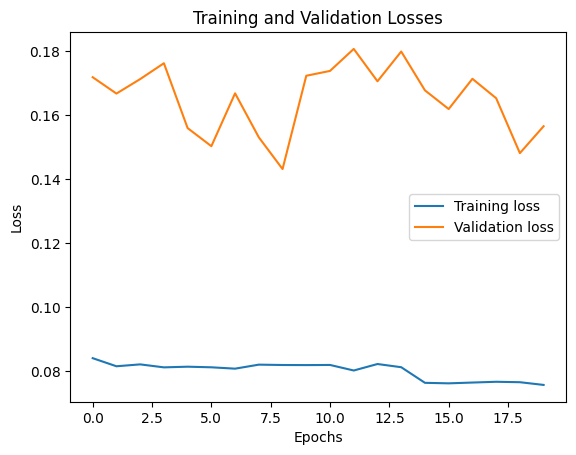

2322/2322 [==============================] - 5s 2ms/step


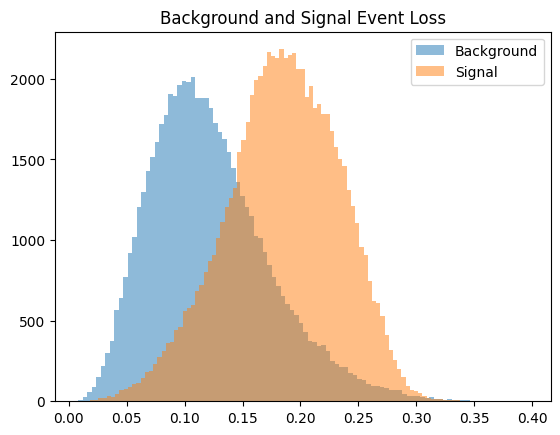

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [50:10<12:28, 187.10s/it]

Correctly predicted background E's: 51346 out of 60676 (84.62%)
Correctly predicted signal E's: 44471 out of 74299 (59.85%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0858 - acc: 0.3726 - val_loss: 0.1824 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0817 - acc: 0.3889 - val_loss: 0.1968 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0805 - acc: 0.3855 - val_loss: 0.1945 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0818 - acc: 0.3824 - val_loss: 0.1717 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0826 - acc: 0.3728 - val_loss: 0.1419 - val_acc: 0.5868 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0813 - acc: 0.3796 - val

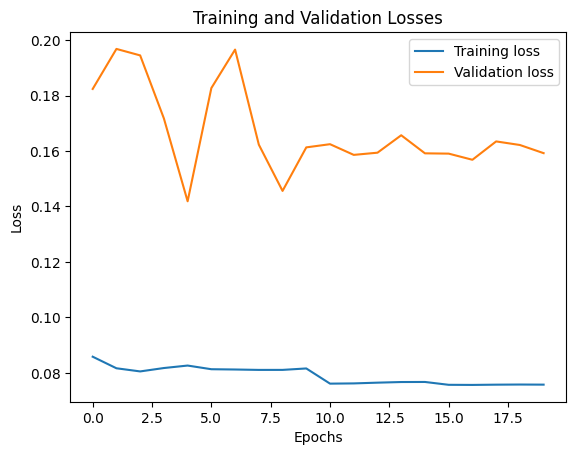

2322/2322 [==============================] - 5s 2ms/step


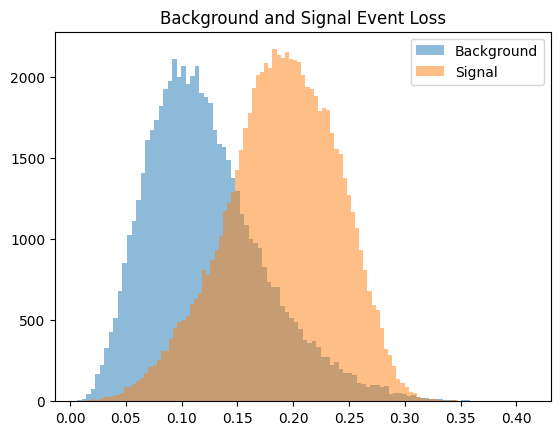

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [53:18<09:22, 187.38s/it]

Correctly predicted background E's: 51371 out of 60676 (84.66%)
Correctly predicted signal E's: 46684 out of 74299 (62.83%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0857 - acc: 0.3899 - val_loss: 0.1601 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0824 - acc: 0.3723 - val_loss: 0.1722 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0824 - acc: 0.3797 - val_loss: 0.1793 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0808 - acc: 0.3889 - val_loss: 0.2095 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0822 - acc: 0.3793 - val_loss: 0.1914 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0811 - acc: 0.3871 - val

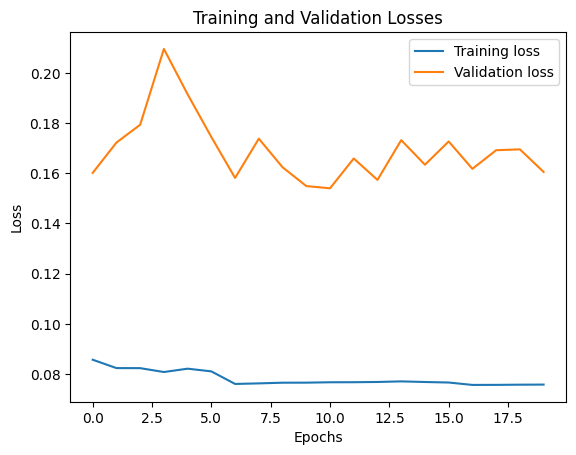

2322/2322 [==============================] - 5s 2ms/step


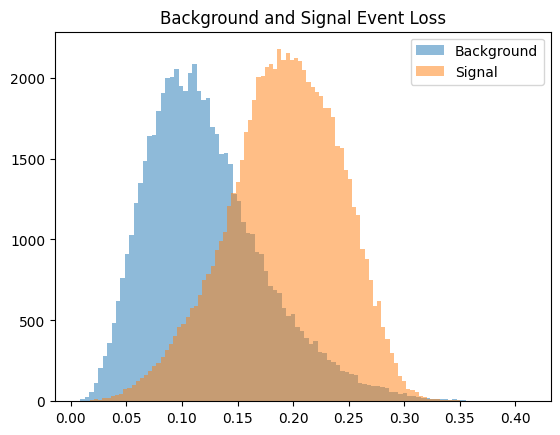

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [56:26<06:14, 187.45s/it]

Correctly predicted background E's: 51354 out of 60676 (84.64%)
Correctly predicted signal E's: 47595 out of 74299 (64.06%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0833 - acc: 0.3882 - val_loss: 0.2062 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 11ms/step - loss: 0.0821 - acc: 0.3787 - val_loss: 0.1607 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0811 - acc: 0.3900 - val_loss: 0.1753 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0806 - acc: 0.3887 - val_loss: 0.1632 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0831 - acc: 0.3680 - val_loss: 0.1470 - val_acc: 0.5868 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0811 - acc: 0.3841 - val

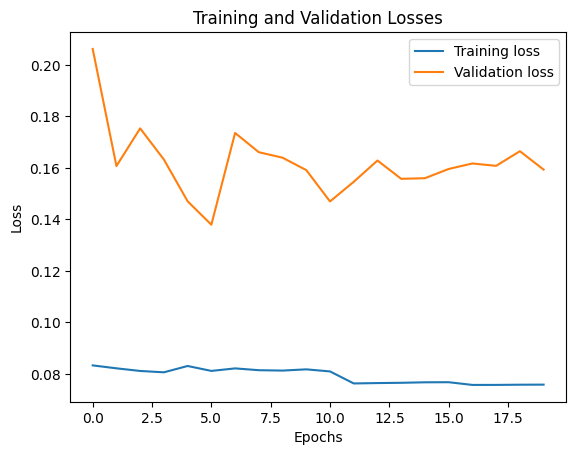

2322/2322 [==============================] - 5s 2ms/step


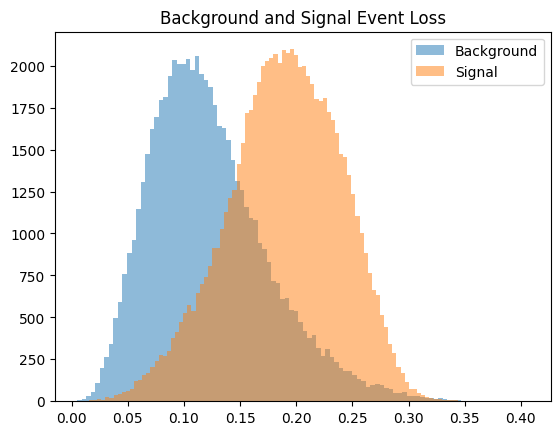

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [59:34<03:07, 187.85s/it]

Correctly predicted background E's: 51363 out of 60676 (84.65%)
Correctly predicted signal E's: 46393 out of 74299 (62.44%)
-------------------- 4 --------------------
Epoch 1/20
508/508 [==============================] - 10s 11ms/step - loss: 0.0843 - acc: 0.3824 - val_loss: 0.1483 - val_acc: 0.5867 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0810 - acc: 0.3898 - val_loss: 0.1631 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0812 - acc: 0.3828 - val_loss: 0.2241 - val_acc: 0.1270 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0817 - acc: 0.3824 - val_loss: 0.2019 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0814 - acc: 0.3814 - val_loss: 0.1718 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0811 - acc: 0.3760 - val

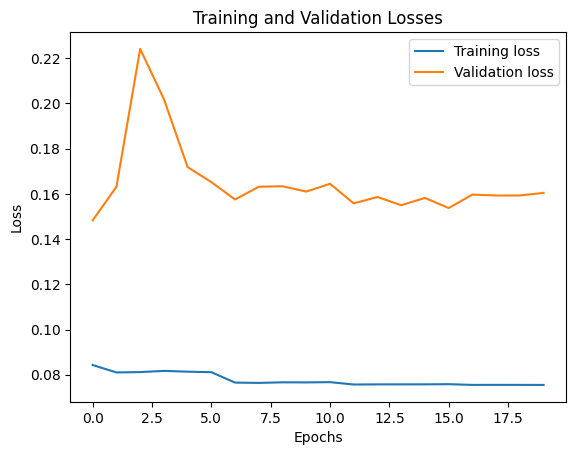

2322/2322 [==============================] - 5s 2ms/step


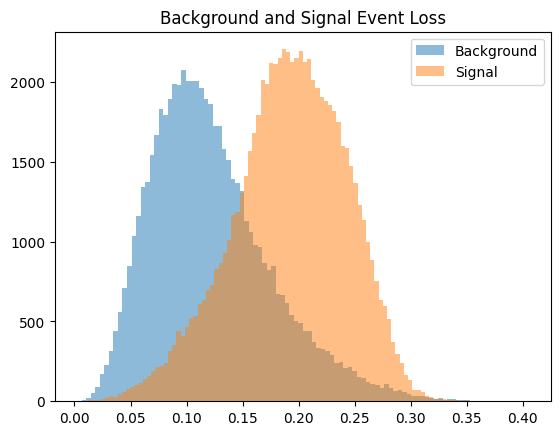

<ipython-input-43-031076224031>:177: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [1:02:41<00:00, 188.06s/it]

Correctly predicted background E's: 51294 out of 60676 (84.54%)
Correctly predicted signal E's: 48096 out of 74299 (64.73%)


In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    print("--------------------", N_inputs, "--------------------")

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(128, activation="relu"),
                  Dense(64, activation="relu"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="relu"),
                  Dense(8, activation="relu"),
                  Dense(4, activation="relu"),
                  Dense(2, activation="relu"),

              ])
        self.decoder = Sequential([
                  Dense(4, activation="relu"),
                  Dense(8, activation="relu"),
                  Dense(16, activation="relu"),
                  Dense(32, activation="relu"),
                  Dense(64, activation="relu"),
                  Dense(128, activation="relu"),
                  Dense(N_inputs, activation="sigmoid")
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="min")
    autoencoder.compile(optimizer='adam', loss="mae", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=10,
                                        shuffle=True,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2), early_stopping],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=50, label='normal')
    plt.hist(train_loss_signal, bins=50, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    ####### TESTING true_labels = np.concatenate([np.zeros(len(background_predictions)), np.ones(len(signal_predictions))])

    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MAE = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


## Plotting the roc curve using the BINARY thresholds' prediction.



In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1, l2

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SR_background_dataT21)),
                                    np.ones(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    print("--------------------", N_inputs, "--------------------")

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(2048, input_dim=N_inputs, activation="relu"),
                  Dense(1024, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="sigmoid"),
                  Dense(8, activation="relu"),

              ])
        self.decoder = Sequential([
                  Dense(16, activation="sigmoid"),
                  Dense(32, activation="relu"),
                  Dense(64, activation="sigmoid"),
                  Dense(128, activation="relu"),
                  Dense(256, activation="sigmoid"),
                  Dense(512, activation="relu"),
                  Dense(1024, activation="relu"),
                  Dense(2048, activation="sigmoid"),
                  Dense(N_inputs)
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, mode="min")
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    signal_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]


    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=10,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=50,
                                        sample_weight = background_weights,
                                        callbacks=[early_stopping],
                                        verbose=1)

    encoder_out = autoencoder.encoder(background_validation_data).numpy() #8 unit representation of data
    decoder_out = autoencoder.decoder(encoder_out).numpy()

    encoder_out_a = autoencoder.encoder(signal_validation_data).numpy() #8 unit representation of data
    decoder_out_a = autoencoder.decoder(encoder_out_a).numpy()

    plt.plot(background_validation_data[0], 'b')
    plt.plot(decoder_out[0], 'r')
    plt.title("Model performance on Normal data")
    plt.show()

    plt.plot(signal_validation_data[0], 'b')
    plt.plot(decoder_out_a[0], 'r')
    plt.title("Model performance on Anomaly Data")
    plt.show()

    # ------------ LOSS AND VAL_LOSS PLOTTING ------------
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.
    background_prediction = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(background_prediction, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(signal_prediction, signal_validation_data)

    # # ---------------------- RECONSTRUCTION LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=50, alpha=0.5, label='normal')
    plt.hist(train_loss_signal, bins=50, alpha=0.5, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    true_labels = np.concatenate([np.ones(len(signal_predictions)), np.zeros(len(background_predictions))])
    print(f"Signal Predictions: {signal_predictions}")
    print(f"Background Predictions: {background_predictions}")
    print(f"True Labels: {true_labels}")
    # # -----------------------------------------------------------------------------
    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([signal_predictions, background_predictions])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_binary = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


  0%|          | 0/20 [00:00<?, ?it/s]

-------------------- 4 --------------------
Epoch 1/10
3233/3233 [==============================] - 35s 9ms/step - loss: 0.0244 - acc: 0.3341 - val_loss: 0.0399 - val_acc: 0.2089
Epoch 2/10
1788/3233 [===============>..............] - ETA: 10s - loss: 0.0234 - acc: 0.3325

  0%|          | 0/20 [00:47<?, ?it/s]


KeyboardInterrupt: ignored

## CWOLA-AE MSE and Regularization on the latent layer

### 1 layer

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0127 - acc: 0.4742 - val_loss: 0.0233 - val_acc: 0.7199 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0101 - acc: 0.5205 - val_loss: 0.0178 - val_acc: 0.7298 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0094 - acc: 0.5332 - val_loss: 0.0159 - val_acc: 0.7353 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 9ms/step - loss: 0.0092 - acc: 0.5437 - val_loss: 0.0151 - val_acc: 0.7389 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0090 - acc: 0.5495 - val_loss: 0.0147 - val_acc: 0.7395 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0089 - acc: 0.5559 - val_loss: 0.0137 - val_acc: 0.7434 - lr: 0.0010
Epoch 7/20
508/508 [==============================] - 4s 9ms/step - loss: 0.0087 - acc: 0.5602 - val_loss: 0.0145 - val_acc: 0.742

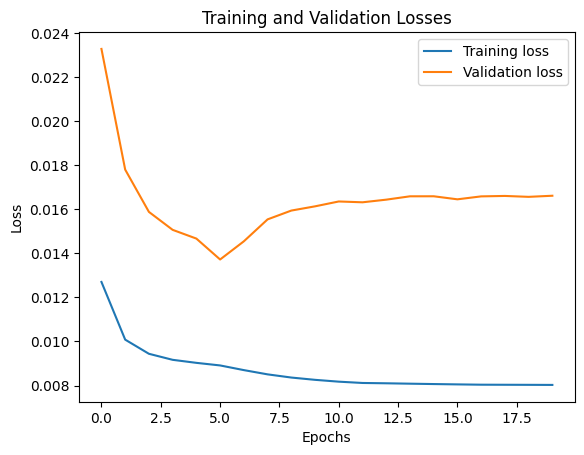

2322/2322 [==============================] - 4s 2ms/step


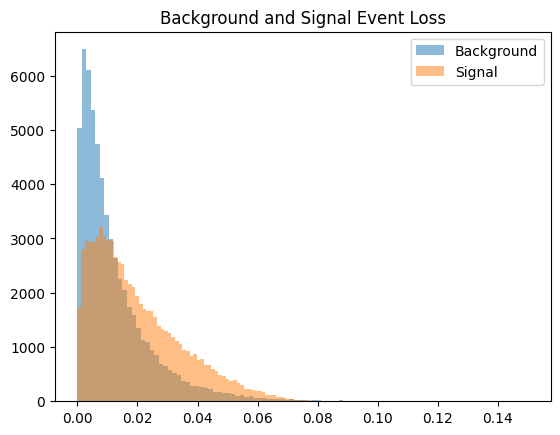

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [02:53<54:56, 173.52s/it]

Correctly predicted background E's: 52898 out of 60676 (87.18%)
Correctly predicted signal E's: 22730 out of 74299 (30.59%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0128 - acc: 0.5015 - val_loss: 0.0138 - val_acc: 0.8288 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0062 - acc: 0.7958 - val_loss: 0.0074 - val_acc: 0.8585 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0046 - acc: 0.7929 - val_loss: 0.0066 - val_acc: 0.8437 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0042 - acc: 0.7926 - val_loss: 0.0063 - val_acc: 0.8376 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0039 - acc: 0.8012 - val_loss: 0.0063 - val_acc: 0.8451 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0038 - acc: 0.8095 - val_loss: 0.0062 - val_acc: 0.8478 - lr: 0.0010
Epoch 

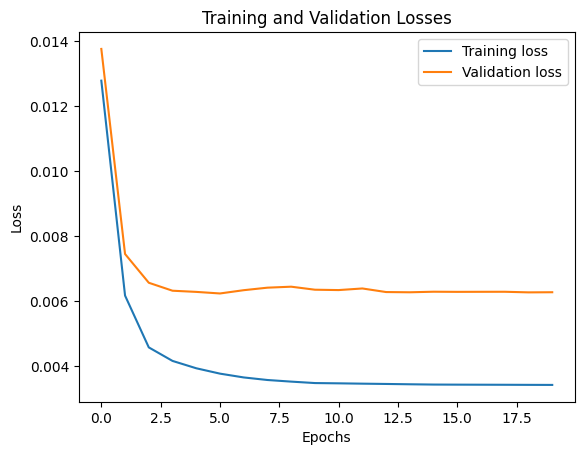

2322/2322 [==============================] - 4s 2ms/step


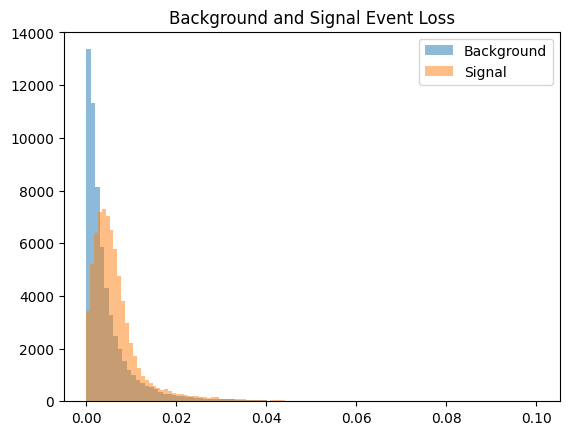

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [05:38<50:32, 168.45s/it]

Correctly predicted background E's: 54750 out of 60676 (90.23%)
Correctly predicted signal E's: 9665 out of 74299 (13.01%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0160 - acc: 0.4284 - val_loss: 0.0374 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0375 - val_acc: 0.2064 - lr: 0.0010
Epoch 7

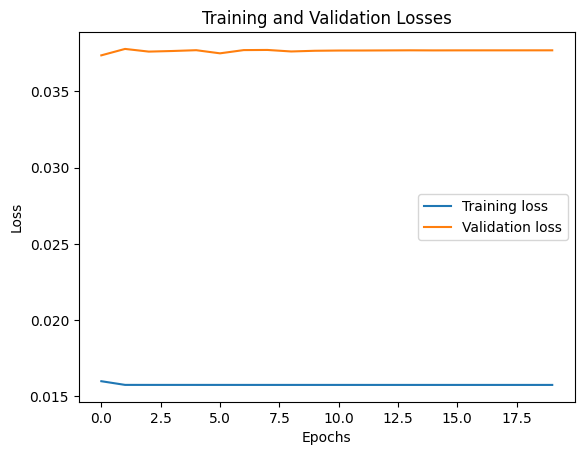

2322/2322 [==============================] - 4s 2ms/step


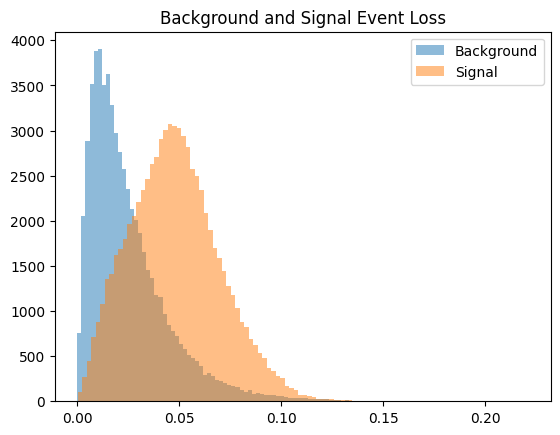

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [08:20<46:54, 165.56s/it]

Correctly predicted background E's: 52466 out of 60676 (86.47%)
Correctly predicted signal E's: 39470 out of 74299 (53.12%)
Epoch 1/20
508/508 [==============================] - 7s 8ms/step - loss: 0.0132 - acc: 0.5137 - val_loss: 0.0229 - val_acc: 0.7407 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0100 - acc: 0.5522 - val_loss: 0.0169 - val_acc: 0.7612 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0092 - acc: 0.6186 - val_loss: 0.0151 - val_acc: 0.7811 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.6521 - val_loss: 0.0145 - val_acc: 0.7862 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0087 - acc: 0.6683 - val_loss: 0.0140 - val_acc: 0.8001 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0086 - acc: 0.6841 - val_loss: 0.0138 - val_acc: 0.8110 - lr: 0.0010
Epoch 

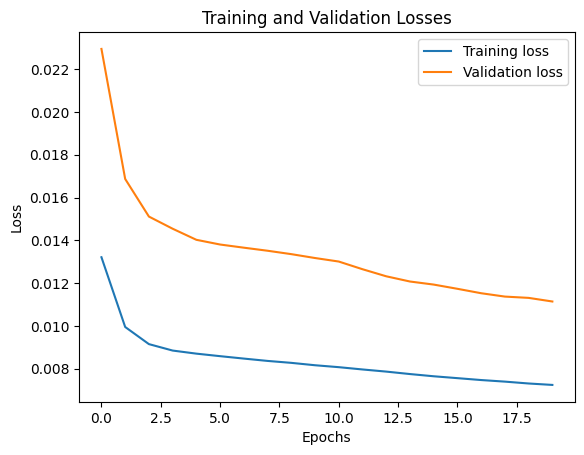

2322/2322 [==============================] - 4s 2ms/step


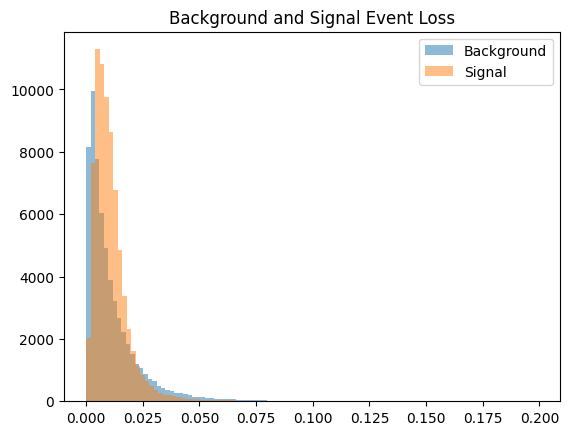

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [11:01<43:40, 163.77s/it]

Correctly predicted background E's: 53800 out of 60676 (88.67%)
Correctly predicted signal E's: 4003 out of 74299 (5.39%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0126 - acc: 0.5062 - val_loss: 0.0221 - val_acc: 0.7365 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0099 - acc: 0.5416 - val_loss: 0.0176 - val_acc: 0.7361 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 9ms/step - loss: 0.0093 - acc: 0.5439 - val_loss: 0.0158 - val_acc: 0.7384 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0091 - acc: 0.5516 - val_loss: 0.0150 - val_acc: 0.7403 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0090 - acc: 0.5539 - val_loss: 0.0147 - val_acc: 0.7410 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.5566 - val_loss: 0.0145 - val_acc: 0.7418 - lr: 0.0010
Epoch 7/

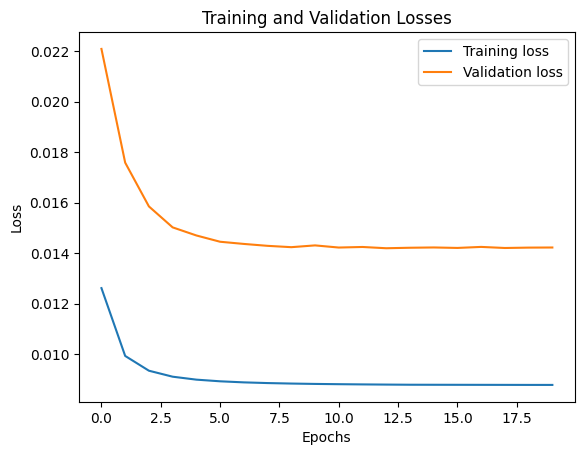

2322/2322 [==============================] - 4s 2ms/step


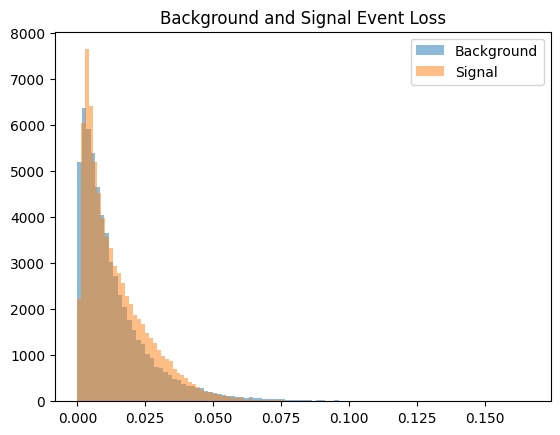

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [13:46<41:01, 164.12s/it]

Correctly predicted background E's: 53096 out of 60676 (87.51%)
Correctly predicted signal E's: 10238 out of 74299 (13.78%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0135 - acc: 0.5120 - val_loss: 0.0273 - val_acc: 0.3011 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0099 - acc: 0.5930 - val_loss: 0.0199 - val_acc: 0.7312 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 9ms/step - loss: 0.0092 - acc: 0.5819 - val_loss: 0.0172 - val_acc: 0.7466 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0090 - acc: 0.5754 - val_loss: 0.0162 - val_acc: 0.7433 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.5712 - val_loss: 0.0157 - val_acc: 0.7433 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.5696 - val_loss: 0.0154 - val_acc: 0.7400 - lr: 0.0010
Epoch 

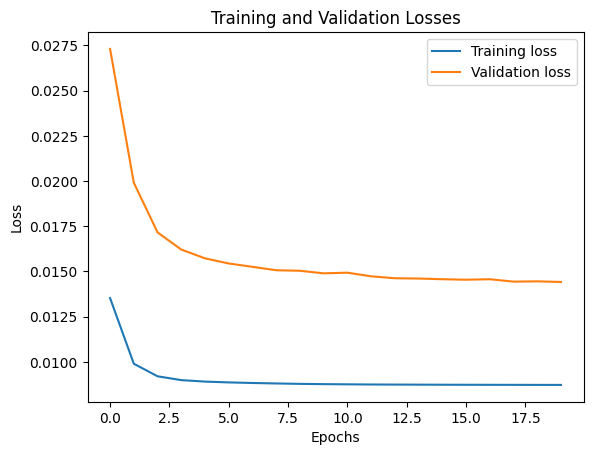

2322/2322 [==============================] - 4s 2ms/step


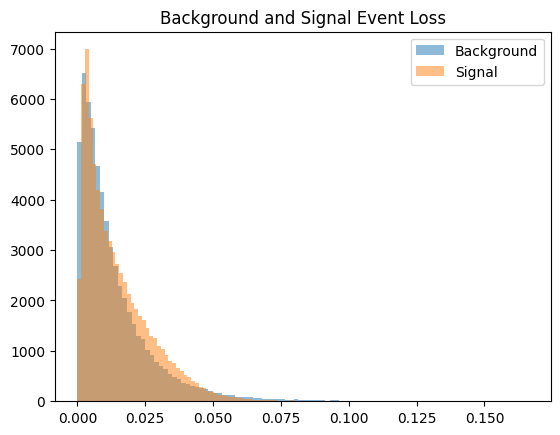

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [16:27<38:04, 163.17s/it]

Correctly predicted background E's: 53140 out of 60676 (87.58%)
Correctly predicted signal E's: 11091 out of 74299 (14.93%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0159 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 

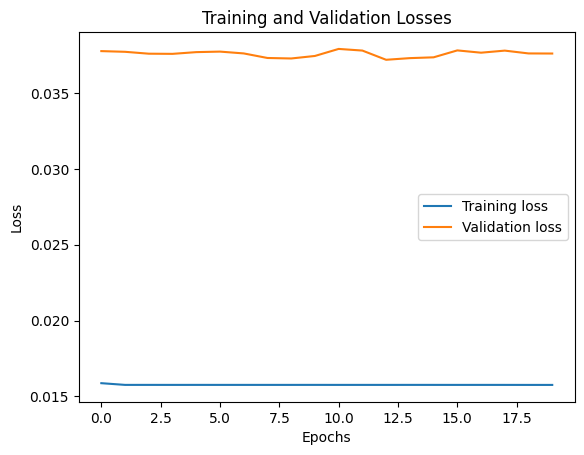

2322/2322 [==============================] - 4s 2ms/step


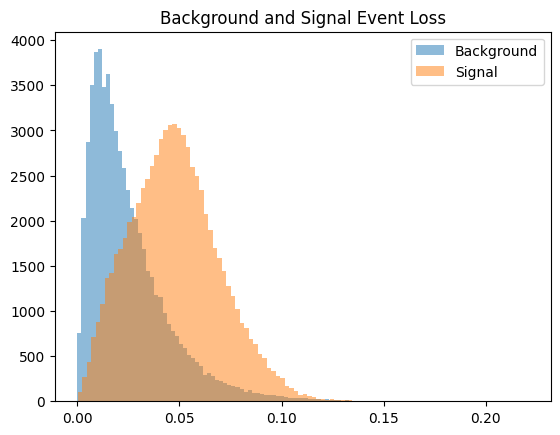

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [19:08<35:09, 162.30s/it]

Correctly predicted background E's: 52455 out of 60676 (86.45%)
Correctly predicted signal E's: 39351 out of 74299 (52.96%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0160 - acc: 0.4290 - val_loss: 0.0373 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0375 - val_acc: 0.2065 - lr: 0.0010
Epoch 

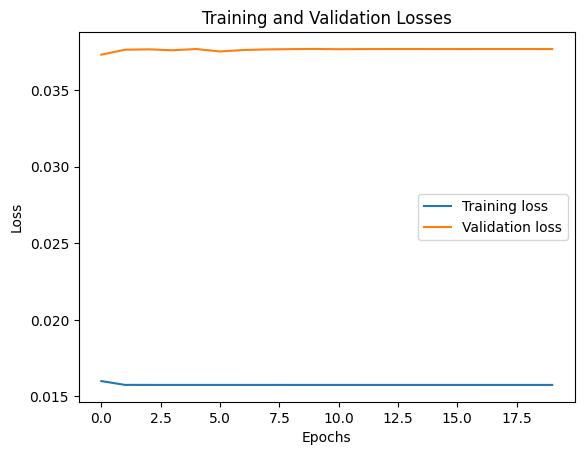

2322/2322 [==============================] - 4s 2ms/step


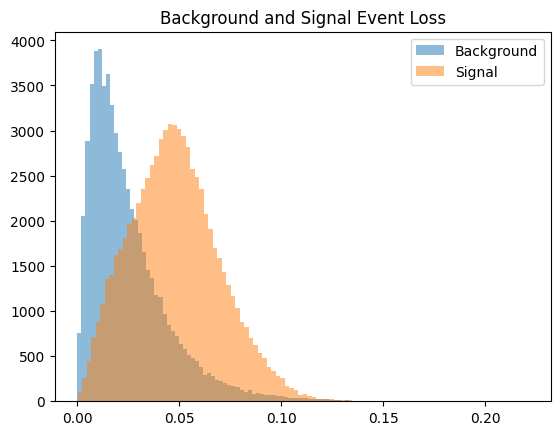

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [21:48<32:19, 161.63s/it]

Correctly predicted background E's: 52465 out of 60676 (86.47%)
Correctly predicted signal E's: 39474 out of 74299 (53.13%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0129 - acc: 0.5005 - val_loss: 0.0175 - val_acc: 0.7544 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0095 - acc: 0.5750 - val_loss: 0.0163 - val_acc: 0.7487 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0091 - acc: 0.5735 - val_loss: 0.0152 - val_acc: 0.7465 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0090 - acc: 0.5694 - val_loss: 0.0151 - val_acc: 0.7455 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.5679 - val_loss: 0.0148 - val_acc: 0.7442 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.5664 - val_loss: 0.0148 - val_acc: 0.7441 - lr: 0.0010
Epoch 

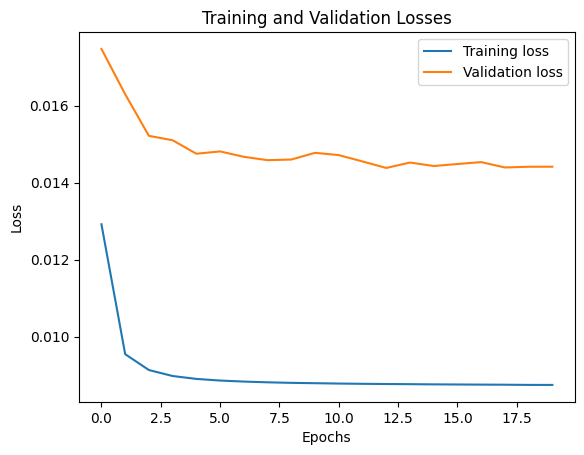

2322/2322 [==============================] - 4s 2ms/step


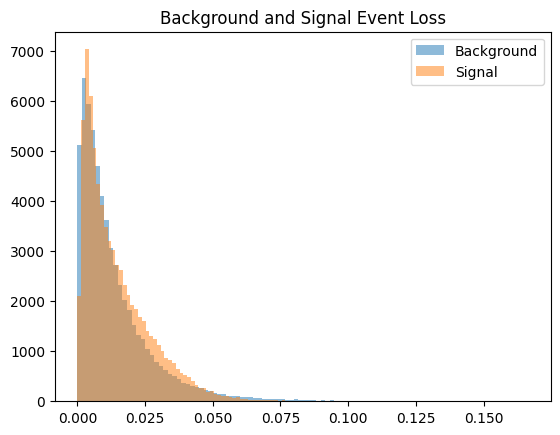

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [24:30<29:40, 161.84s/it]

Correctly predicted background E's: 53162 out of 60676 (87.62%)
Correctly predicted signal E's: 10851 out of 74299 (14.60%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0110 - acc: 0.5202 - val_loss: 0.0152 - val_acc: 0.7357 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0085 - acc: 0.5495 - val_loss: 0.0159 - val_acc: 0.7387 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0082 - acc: 0.5509 - val_loss: 0.0162 - val_acc: 0.7418 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0081 - acc: 0.5463 - val_loss: 0.0169 - val_acc: 0.7352 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0080 - acc: 0.5374 - val_loss: 0.0166 - val_acc: 0.7202 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0079 - acc: 0.5285 - val_loss: 0.0165 - val_acc: 0.7147 - lr: 0.0010
Epoch 

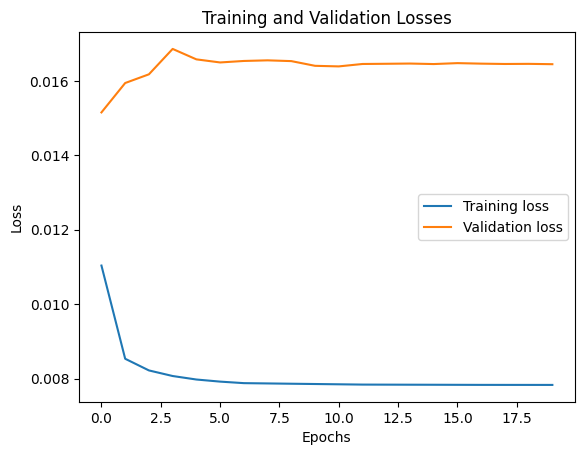

2322/2322 [==============================] - 4s 2ms/step


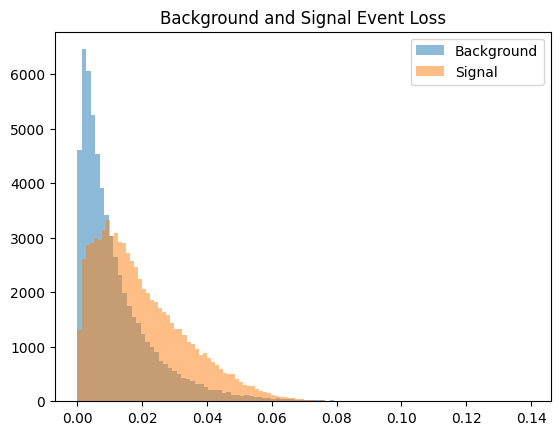

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [27:11<26:55, 161.50s/it]

Correctly predicted background E's: 52797 out of 60676 (87.01%)
Correctly predicted signal E's: 23373 out of 74299 (31.46%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0119 - acc: 0.5635 - val_loss: 0.0099 - val_acc: 0.8056 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0055 - acc: 0.7250 - val_loss: 0.0070 - val_acc: 0.8368 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0046 - acc: 0.7600 - val_loss: 0.0066 - val_acc: 0.8382 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0044 - acc: 0.7701 - val_loss: 0.0066 - val_acc: 0.8374 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0042 - acc: 0.7749 - val_loss: 0.0064 - val_acc: 0.8389 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0042 - acc: 0.7765 - val_loss: 0.0063 - val_acc: 0.8414 - lr: 0.0010
Epoch 

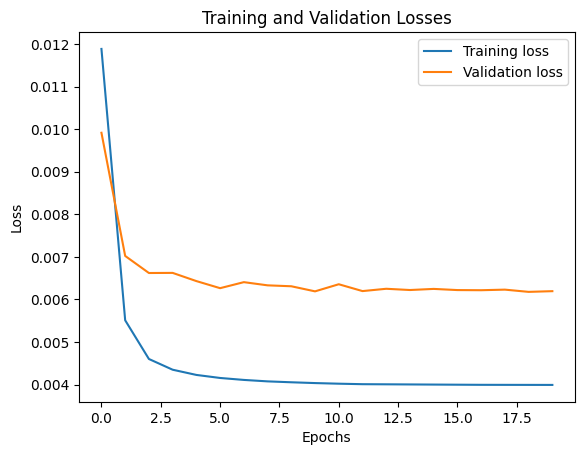

2322/2322 [==============================] - 4s 2ms/step


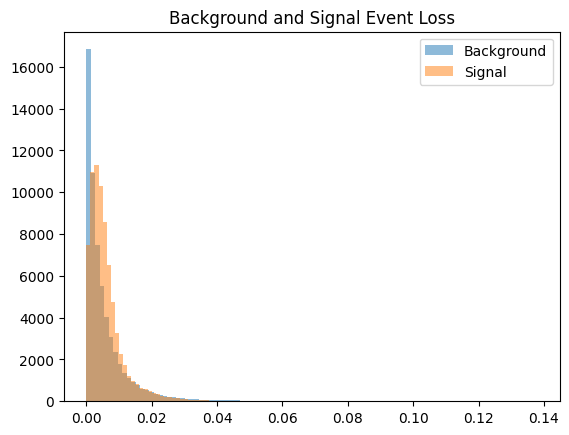

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [29:52<24:11, 161.30s/it]

Correctly predicted background E's: 54652 out of 60676 (90.07%)
Correctly predicted signal E's: 5632 out of 74299 (7.58%)
Epoch 1/20
508/508 [==============================] - 7s 8ms/step - loss: 0.0160 - acc: 0.4289 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0375 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 9ms/step - loss: 0.0158 - acc: 0.4298 - val_loss: 0.0379 - val_acc: 0.2064 - lr: 0.0010
Epoch 7/

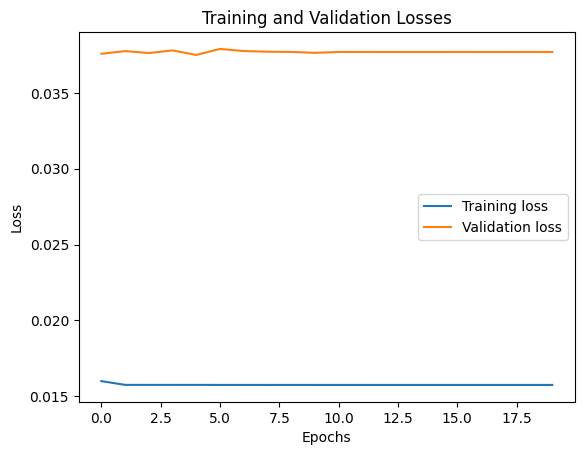

2322/2322 [==============================] - 4s 2ms/step


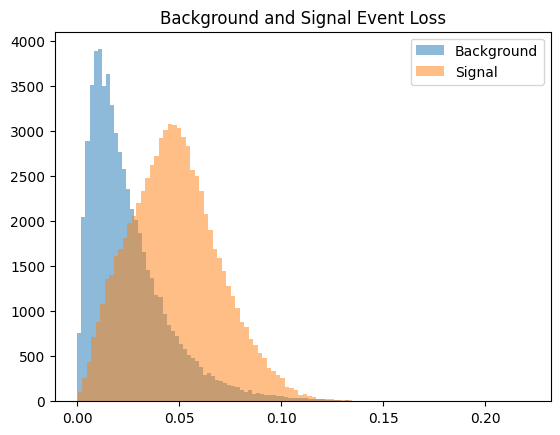

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [32:34<21:33, 161.64s/it]

Correctly predicted background E's: 52464 out of 60676 (86.47%)
Correctly predicted signal E's: 39464 out of 74299 (53.12%)
Epoch 1/20
508/508 [==============================] - 7s 8ms/step - loss: 0.0160 - acc: 0.4294 - val_loss: 0.0373 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0374 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0374 - val_acc: 0.2065 - lr: 0.0010
Epoch 

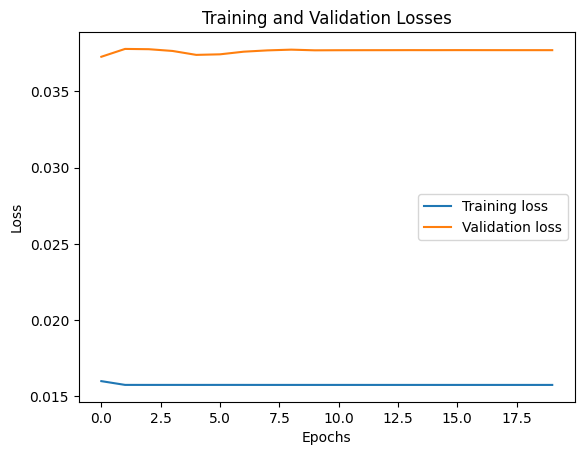

2322/2322 [==============================] - 4s 2ms/step


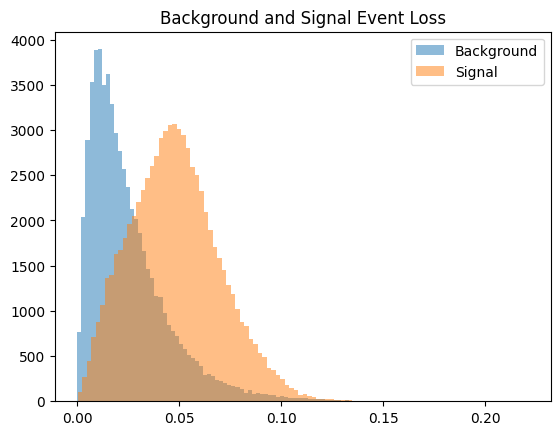

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [35:14<18:47, 161.09s/it]

Correctly predicted background E's: 52462 out of 60676 (86.46%)
Correctly predicted signal E's: 39517 out of 74299 (53.19%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0115 - acc: 0.4992 - val_loss: 0.0170 - val_acc: 0.7150 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0087 - acc: 0.5044 - val_loss: 0.0160 - val_acc: 0.7009 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0081 - acc: 0.4839 - val_loss: 0.0165 - val_acc: 0.7122 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0077 - acc: 0.5034 - val_loss: 0.0165 - val_acc: 0.7131 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0074 - acc: 0.5192 - val_loss: 0.0153 - val_acc: 0.7459 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0050 - acc: 0.7277 - val_loss: 0.0078 - val_acc: 0.8002 - lr: 0.0010
Epoch 

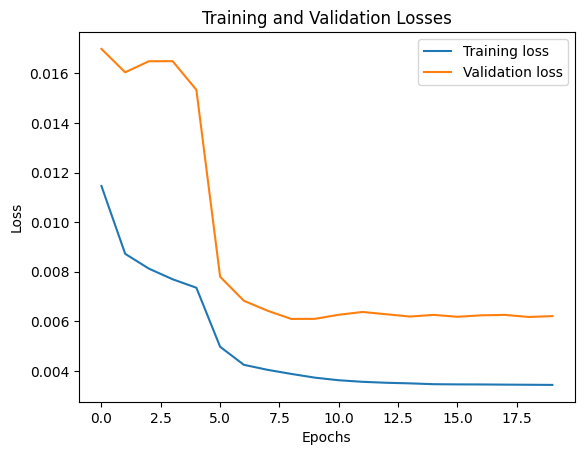

2322/2322 [==============================] - 4s 2ms/step


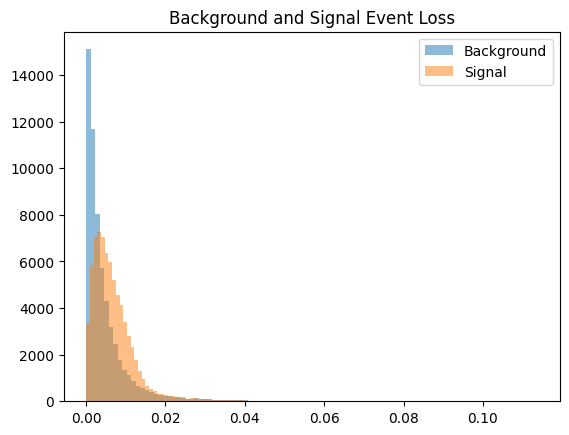

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [37:54<16:05, 160.90s/it]

Correctly predicted background E's: 54865 out of 60676 (90.42%)
Correctly predicted signal E's: 10619 out of 74299 (14.29%)
Epoch 1/20
508/508 [==============================] - 7s 8ms/step - loss: 0.0160 - acc: 0.4202 - val_loss: 0.0375 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0380 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0374 - val_acc: 0.2064 - lr: 0.0010
Epoch 

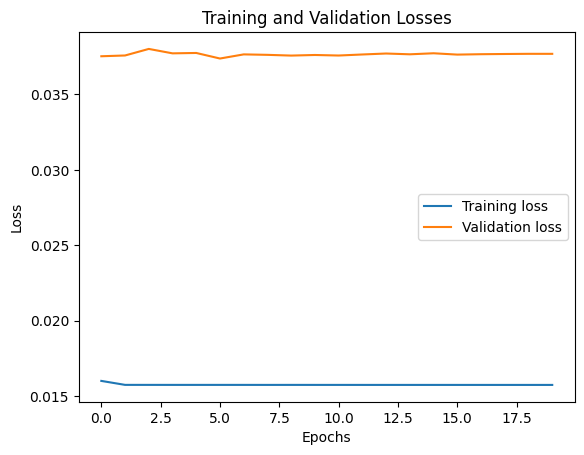

2322/2322 [==============================] - 4s 2ms/step


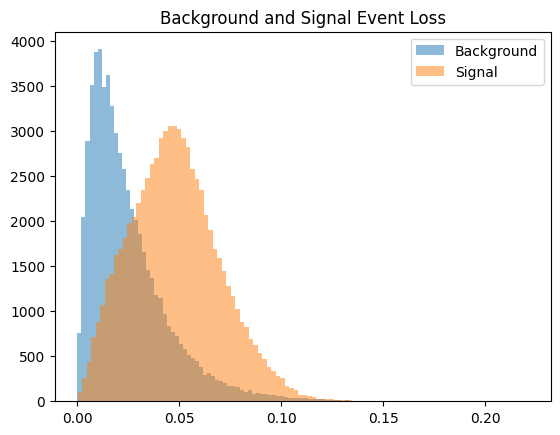

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [40:34<13:22, 160.55s/it]

Correctly predicted background E's: 52463 out of 60676 (86.46%)
Correctly predicted signal E's: 39453 out of 74299 (53.10%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0160 - acc: 0.4299 - val_loss: 0.0374 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 

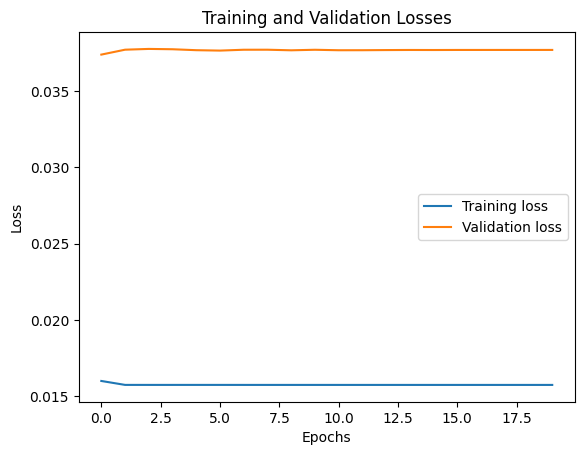

2322/2322 [==============================] - 4s 2ms/step


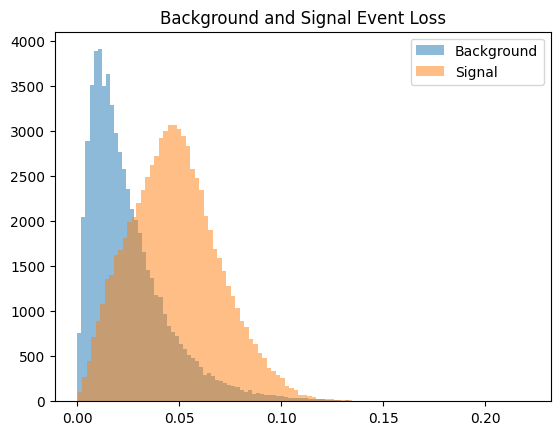

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [43:17<10:44, 161.19s/it]

Correctly predicted background E's: 52463 out of 60676 (86.46%)
Correctly predicted signal E's: 39442 out of 74299 (53.09%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0160 - acc: 0.4288 - val_loss: 0.0374 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0379 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 

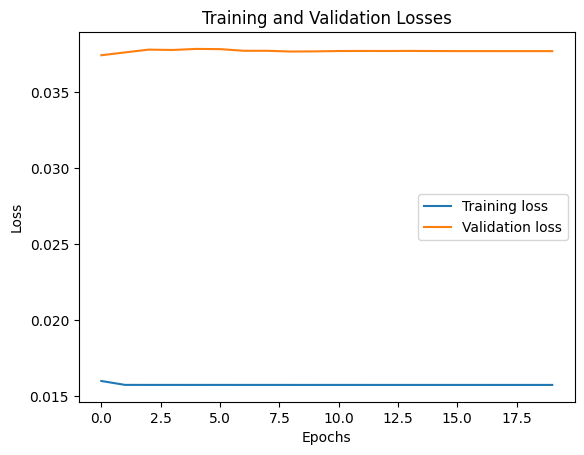

2322/2322 [==============================] - 4s 2ms/step


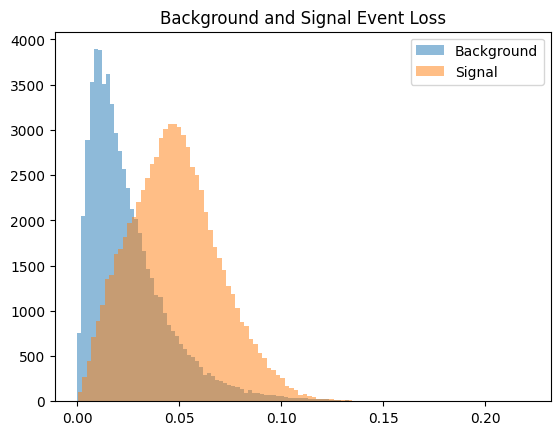

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [45:57<08:02, 160.86s/it]

Correctly predicted background E's: 52463 out of 60676 (86.46%)
Correctly predicted signal E's: 39510 out of 74299 (53.18%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0160 - acc: 0.4294 - val_loss: 0.0375 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0379 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0375 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0375 - val_acc: 0.2064 - lr: 0.0010
Epoch 

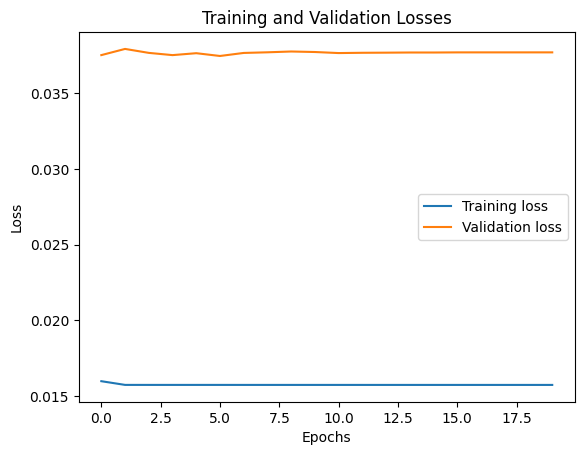

2322/2322 [==============================] - 4s 2ms/step


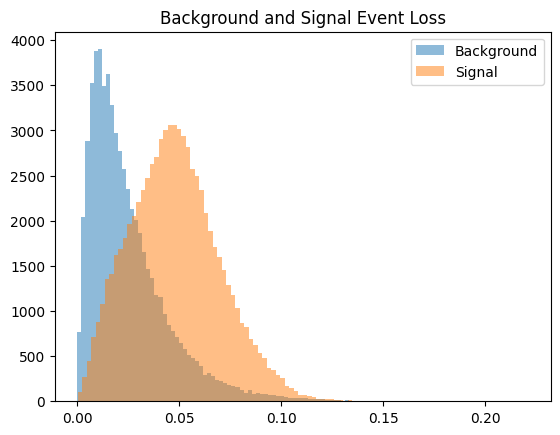

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [48:37<05:20, 160.49s/it]

Correctly predicted background E's: 52463 out of 60676 (86.46%)
Correctly predicted signal E's: 39481 out of 74299 (53.14%)
Epoch 1/20
508/508 [==============================] - 7s 8ms/step - loss: 0.0160 - acc: 0.4293 - val_loss: 0.0372 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 

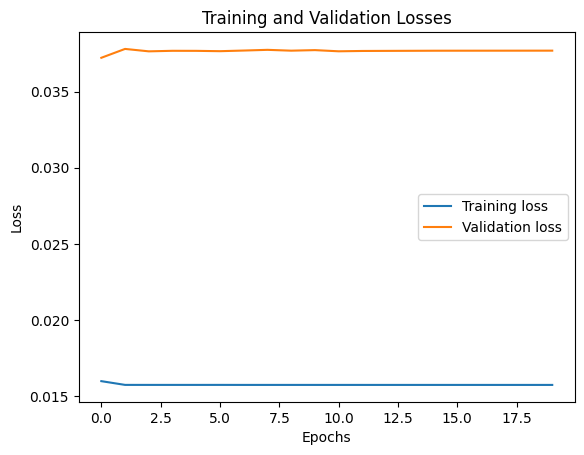

2322/2322 [==============================] - 4s 2ms/step


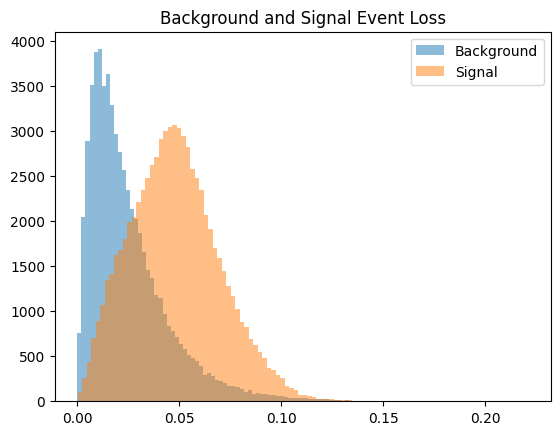

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [51:16<02:40, 160.29s/it]

Correctly predicted background E's: 52460 out of 60676 (86.46%)
Correctly predicted signal E's: 39453 out of 74299 (53.10%)
Epoch 1/20
508/508 [==============================] - 7s 9ms/step - loss: 0.0143 - acc: 0.4449 - val_loss: 0.0294 - val_acc: 0.3053 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0103 - acc: 0.6126 - val_loss: 0.0216 - val_acc: 0.7256 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0093 - acc: 0.5960 - val_loss: 0.0182 - val_acc: 0.7466 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0090 - acc: 0.5844 - val_loss: 0.0165 - val_acc: 0.7446 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0089 - acc: 0.5776 - val_loss: 0.0156 - val_acc: 0.7427 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 4s 8ms/step - loss: 0.0088 - acc: 0.5747 - val_loss: 0.0154 - val_acc: 0.7422 - lr: 0.0010
Epoch 

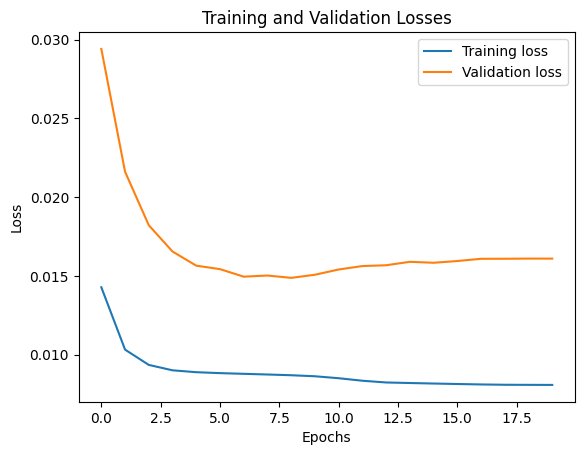

2322/2322 [==============================] - 4s 2ms/step


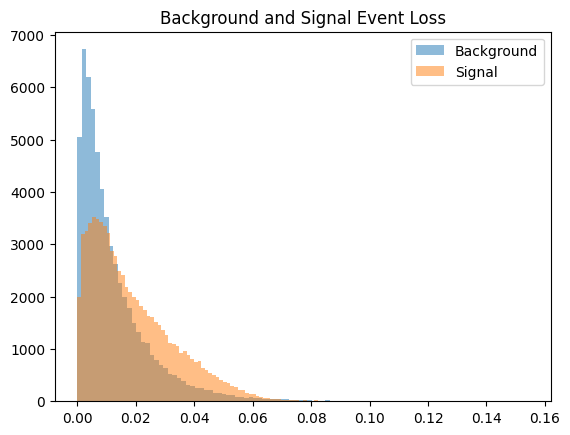

<ipython-input-98-304b0de19d45>:156: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [54:00<00:00, 162.02s/it]

Correctly predicted background E's: 53079 out of 60676 (87.48%)
Correctly predicted signal E's: 20777 out of 74299 (27.96%)


In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(N_inputs, activation="relu"),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-3)),



              ])
        self.decoder = Sequential([
                  Dense(N_inputs, activation="sigmoid"),
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='Background')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='Signal')
    plt.legend(loc='upper right')
    plt.title("Background and Signal Event Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)

### 5-layer

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0136 - acc: 0.5078 - val_loss: 0.0251 - val_acc: 0.7517 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.6830 - val_loss: 0.0134 - val_acc: 0.8622 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0060 - acc: 0.7887 - val_loss: 0.0093 - val_acc: 0.8510 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0054 - acc: 0.7810 - val_loss: 0.0083 - val_acc: 0.8443 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0051 - acc: 0.7779 - val_loss: 0.0077 - val_acc: 0.8428 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0049 - acc: 0.7773 - val_loss: 0.0073 - val_acc: 0.8434 - lr: 0.0010
Epoch 7/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0047 - acc: 0.7773 - val_loss: 0.0072 - val_acc: 0.841

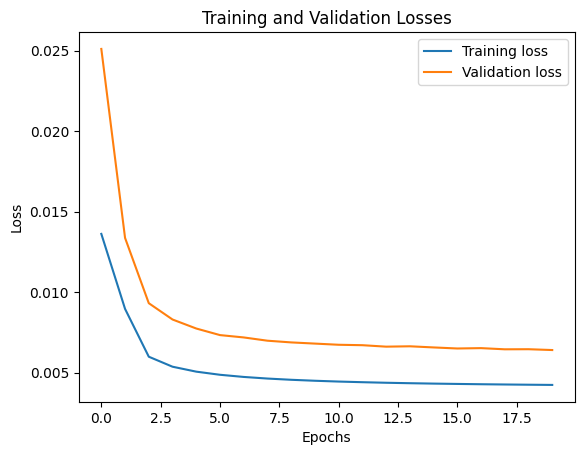

2322/2322 [==============================] - 4s 2ms/step


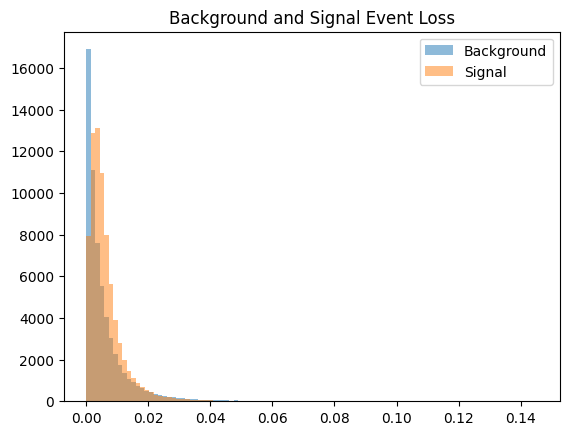

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [02:15<42:58, 135.72s/it]

Correctly predicted background E's: 54567 out of 60676 (89.93%)
Correctly predicted signal E's: 5843 out of 74299 (7.86%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0145 - acc: 0.4532 - val_loss: 0.0251 - val_acc: 0.7519 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.6479 - val_loss: 0.0153 - val_acc: 0.8293 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0063 - acc: 0.7175 - val_loss: 0.0109 - val_acc: 0.8308 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0055 - acc: 0.7363 - val_loss: 0.0093 - val_acc: 0.8357 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0052 - acc: 0.7534 - val_loss: 0.0083 - val_acc: 0.8411 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0042 - acc: 0.8136 - val_loss: 0.0051 - val_acc: 0.9320 - lr: 0.0010
Epoch 7/

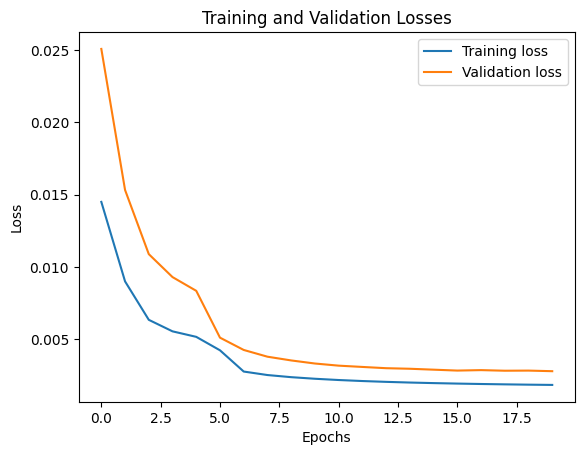

2322/2322 [==============================] - 3s 1ms/step


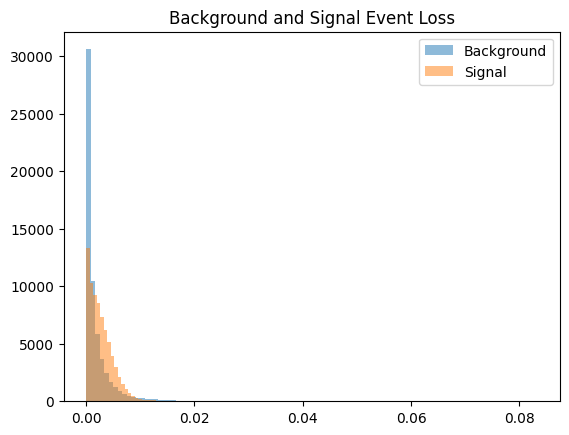

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [04:30<40:37, 135.41s/it]

Correctly predicted background E's: 56453 out of 60676 (93.04%)
Correctly predicted signal E's: 5641 out of 74299 (7.59%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0149 - acc: 0.4846 - val_loss: 0.0213 - val_acc: 0.7454 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0072 - acc: 0.7502 - val_loss: 0.0076 - val_acc: 0.8643 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0049 - acc: 0.7955 - val_loss: 0.0070 - val_acc: 0.8329 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0045 - acc: 0.7898 - val_loss: 0.0068 - val_acc: 0.8182 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0044 - acc: 0.7818 - val_loss: 0.0067 - val_acc: 0.8176 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0043 - acc: 0.7786 - val_loss: 0.0066 - val_acc: 0.8176 - lr: 0.0010
Epoch 7/

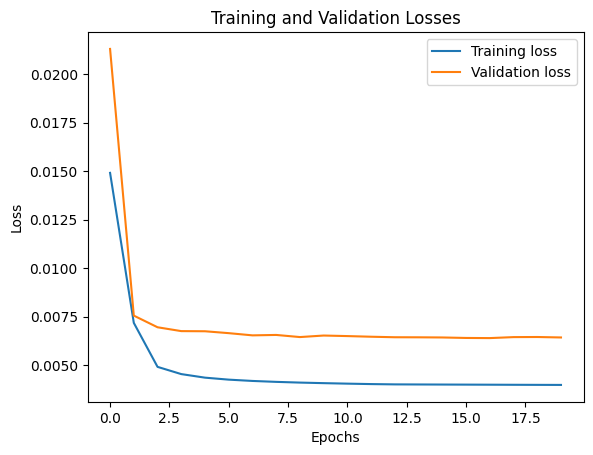

2322/2322 [==============================] - 3s 1ms/step


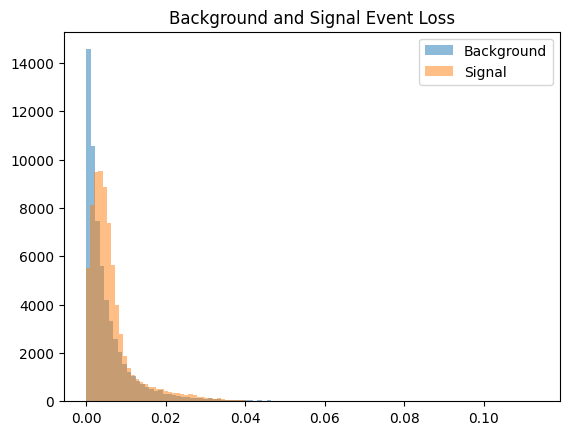

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [06:46<38:20, 135.31s/it]

Correctly predicted background E's: 54541 out of 60676 (89.89%)
Correctly predicted signal E's: 7956 out of 74299 (10.71%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0156 - acc: 0.4365 - val_loss: 0.0304 - val_acc: 0.6626 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0117 - acc: 0.5599 - val_loss: 0.0217 - val_acc: 0.7415 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0105 - acc: 0.5720 - val_loss: 0.0149 - val_acc: 0.7466 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0096 - acc: 0.5441 - val_loss: 0.0130 - val_acc: 0.7296 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0092 - acc: 0.5432 - val_loss: 0.0134 - val_acc: 0.7400 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0091 - acc: 0.5528 - val_loss: 0.0142 - val_acc: 0.7433 - lr: 0.0010
Epoch 7

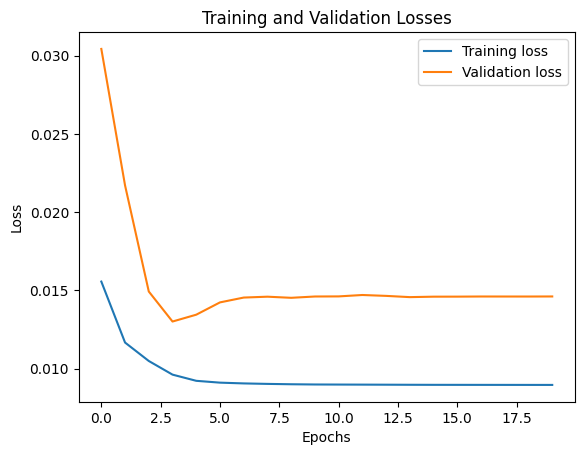

2322/2322 [==============================] - 3s 1ms/step


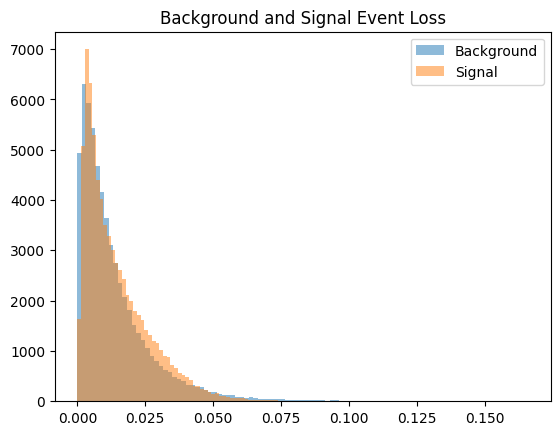

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [09:01<36:06, 135.41s/it]

Correctly predicted background E's: 53123 out of 60676 (87.55%)
Correctly predicted signal E's: 10508 out of 74299 (14.14%)
Epoch 1/20
508/508 [==============================] - 5s 7ms/step - loss: 0.0122 - acc: 0.5029 - val_loss: 0.0183 - val_acc: 0.7283 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0097 - acc: 0.5281 - val_loss: 0.0152 - val_acc: 0.7367 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0093 - acc: 0.5477 - val_loss: 0.0148 - val_acc: 0.7405 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0092 - acc: 0.5537 - val_loss: 0.0147 - val_acc: 0.7421 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0092 - acc: 0.5561 - val_loss: 0.0147 - val_acc: 0.7425 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0091 - acc: 0.5578 - val_loss: 0.0146 - val_acc: 0.7426 - lr: 0.0010
Epoch 

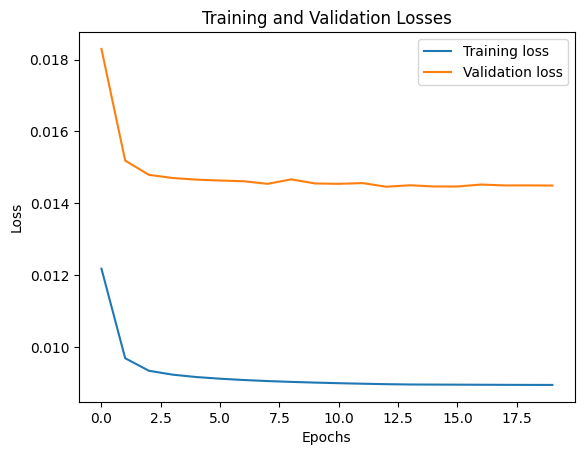

2322/2322 [==============================] - 3s 1ms/step


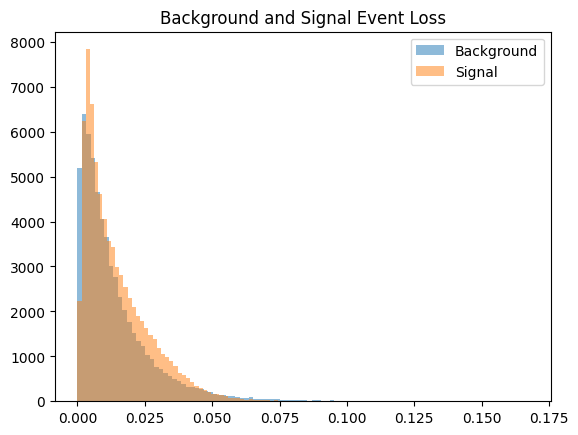

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [11:18<33:59, 135.94s/it]

Correctly predicted background E's: 53101 out of 60676 (87.52%)
Correctly predicted signal E's: 10684 out of 74299 (14.38%)
Epoch 1/20
508/508 [==============================] - 5s 7ms/step - loss: 0.0134 - acc: 0.5564 - val_loss: 0.0243 - val_acc: 0.7528 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0102 - acc: 0.5687 - val_loss: 0.0196 - val_acc: 0.7454 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0097 - acc: 0.5631 - val_loss: 0.0175 - val_acc: 0.7433 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0094 - acc: 0.5609 - val_loss: 0.0163 - val_acc: 0.7430 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0093 - acc: 0.5594 - val_loss: 0.0158 - val_acc: 0.7423 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0092 - acc: 0.5590 - val_loss: 0.0154 - val_acc: 0.7424 - lr: 0.0010
Epoch 

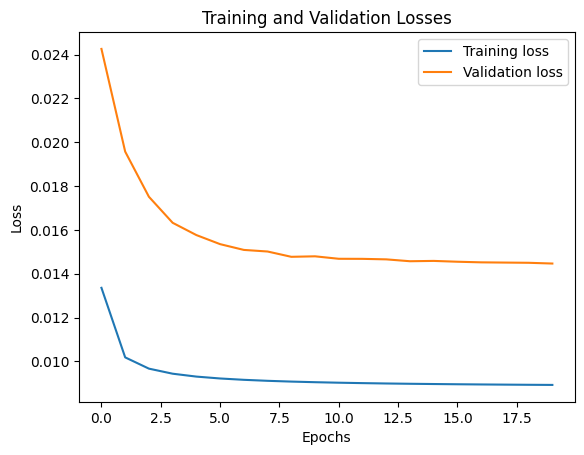

2322/2322 [==============================] - 3s 1ms/step


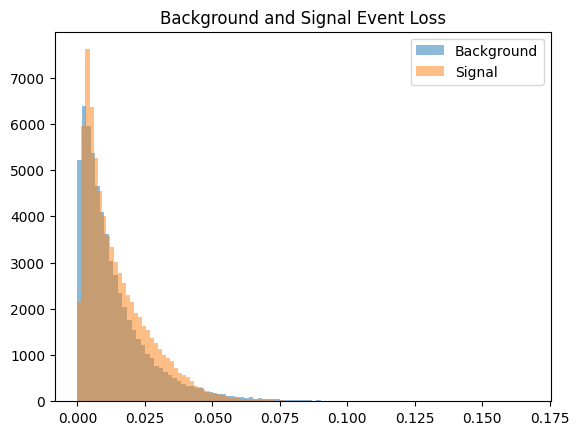

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [13:33<31:38, 135.64s/it]

Correctly predicted background E's: 53109 out of 60676 (87.53%)
Correctly predicted signal E's: 10680 out of 74299 (14.37%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0138 - acc: 0.4638 - val_loss: 0.0333 - val_acc: 0.2600 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0083 - acc: 0.6509 - val_loss: 0.0095 - val_acc: 0.8166 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0054 - acc: 0.7320 - val_loss: 0.0073 - val_acc: 0.8352 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0048 - acc: 0.7534 - val_loss: 0.0069 - val_acc: 0.8358 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0047 - acc: 0.7606 - val_loss: 0.0068 - val_acc: 0.8373 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0045 - acc: 0.7635 - val_loss: 0.0068 - val_acc: 0.8362 - lr: 0.0010
Epoch 

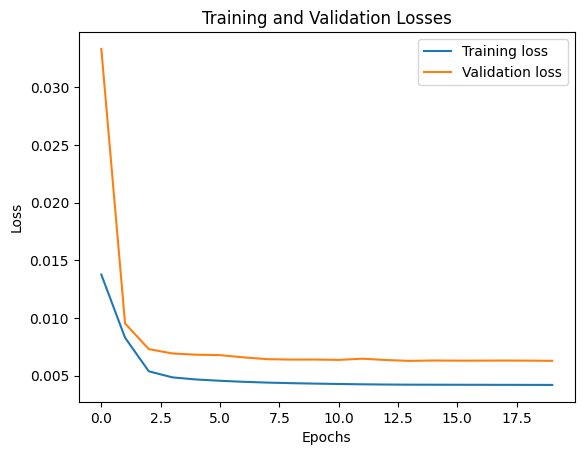

2322/2322 [==============================] - 3s 1ms/step


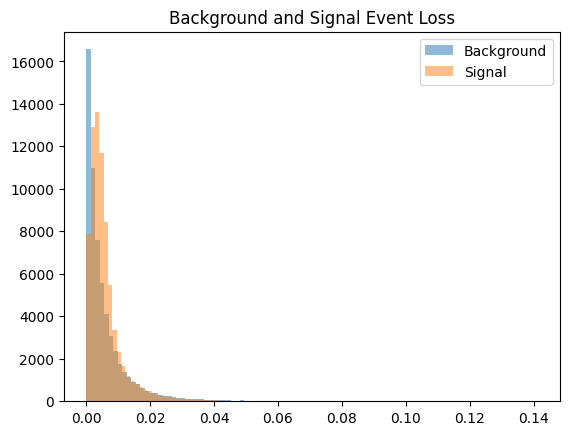

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [15:49<29:24, 135.71s/it]

Correctly predicted background E's: 54555 out of 60676 (89.91%)
Correctly predicted signal E's: 5356 out of 74299 (7.21%)
Epoch 1/20
508/508 [==============================] - 6s 6ms/step - loss: 0.0126 - acc: 0.5351 - val_loss: 0.0165 - val_acc: 0.7577 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0093 - acc: 0.5834 - val_loss: 0.0153 - val_acc: 0.7543 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.5847 - val_loss: 0.0155 - val_acc: 0.7557 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0089 - acc: 0.5914 - val_loss: 0.0155 - val_acc: 0.7598 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0087 - acc: 0.6041 - val_loss: 0.0156 - val_acc: 0.7676 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0078 - acc: 0.6133 - val_loss: 0.0134 - val_acc: 0.7703 - lr: 0.0010
Epoch 7/

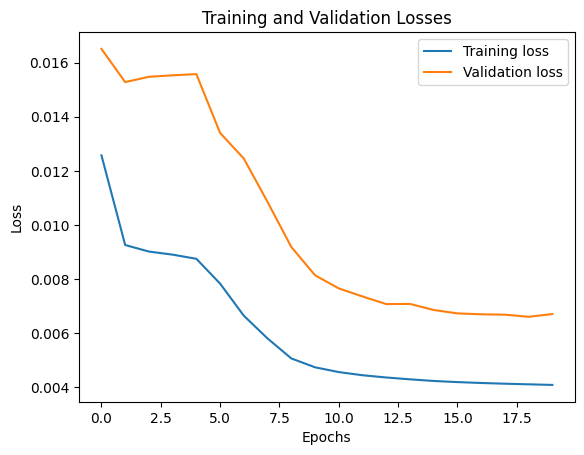

2322/2322 [==============================] - 3s 1ms/step


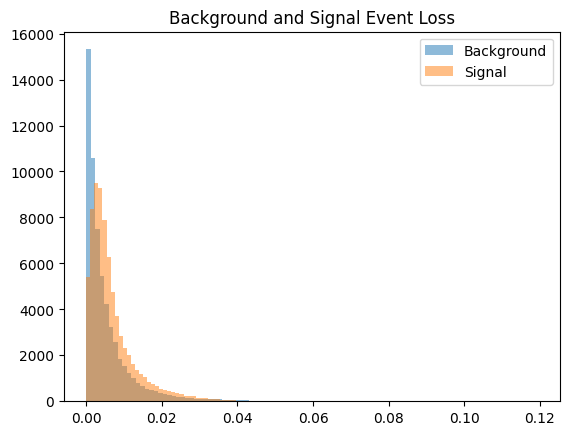

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [18:04<27:05, 135.45s/it]

Correctly predicted background E's: 54658 out of 60676 (90.08%)
Correctly predicted signal E's: 9694 out of 74299 (13.05%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0131 - acc: 0.5113 - val_loss: 0.0291 - val_acc: 0.3088 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0105 - acc: 0.6037 - val_loss: 0.0222 - val_acc: 0.7102 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0097 - acc: 0.5834 - val_loss: 0.0185 - val_acc: 0.7479 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0094 - acc: 0.5762 - val_loss: 0.0166 - val_acc: 0.7486 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0092 - acc: 0.5703 - val_loss: 0.0160 - val_acc: 0.7470 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0092 - acc: 0.5677 - val_loss: 0.0157 - val_acc: 0.7467 - lr: 0.0010
Epoch 7

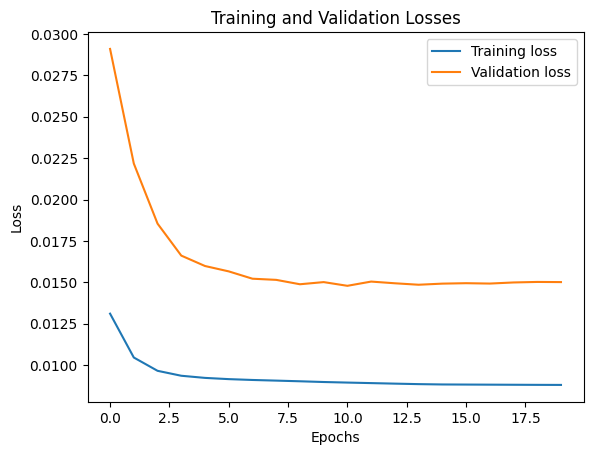

2322/2322 [==============================] - 3s 1ms/step


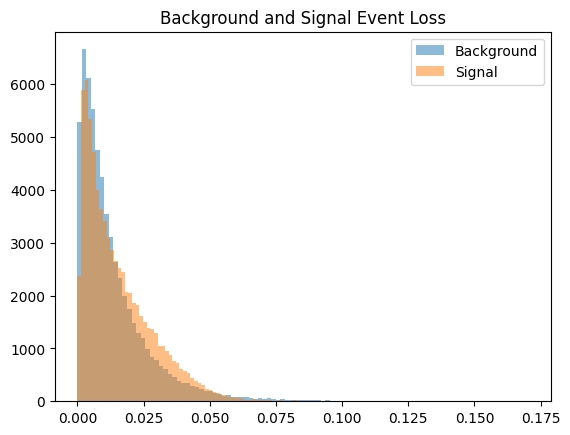

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [20:17<24:42, 134.76s/it]

Correctly predicted background E's: 53143 out of 60676 (87.58%)
Correctly predicted signal E's: 12855 out of 74299 (17.30%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0128 - acc: 0.5132 - val_loss: 0.0237 - val_acc: 0.6597 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0097 - acc: 0.5937 - val_loss: 0.0186 - val_acc: 0.7775 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0077 - acc: 0.6894 - val_loss: 0.0142 - val_acc: 0.8342 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0068 - acc: 0.7620 - val_loss: 0.0104 - val_acc: 0.8859 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0056 - acc: 0.8242 - val_loss: 0.0071 - val_acc: 0.8695 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0048 - acc: 0.7825 - val_loss: 0.0070 - val_acc: 0.8461 - lr: 0.0010
Epoch 

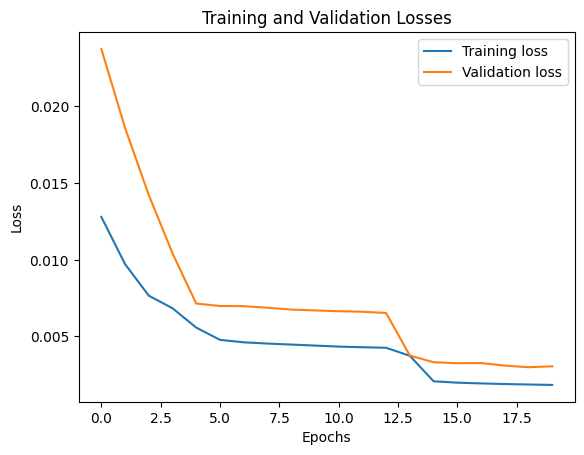

2322/2322 [==============================] - 3s 1ms/step


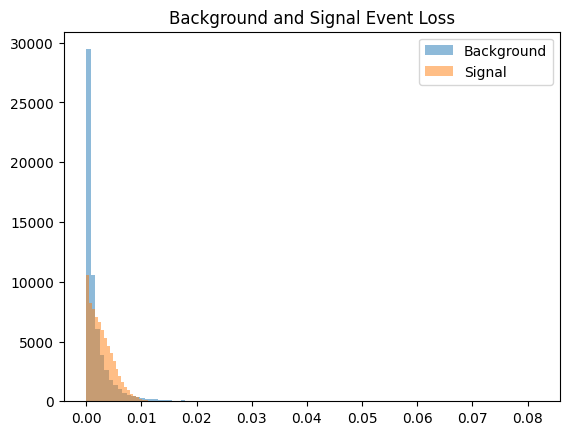

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [22:33<22:31, 135.15s/it]

Correctly predicted background E's: 56218 out of 60676 (92.65%)
Correctly predicted signal E's: 7340 out of 74299 (9.88%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0128 - acc: 0.5232 - val_loss: 0.0230 - val_acc: 0.7417 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0099 - acc: 0.5457 - val_loss: 0.0185 - val_acc: 0.7403 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0094 - acc: 0.5520 - val_loss: 0.0165 - val_acc: 0.7427 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0091 - acc: 0.5610 - val_loss: 0.0156 - val_acc: 0.7432 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.5674 - val_loss: 0.0151 - val_acc: 0.7442 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0089 - acc: 0.5691 - val_loss: 0.0149 - val_acc: 0.7464 - lr: 0.0010
Epoch 7/

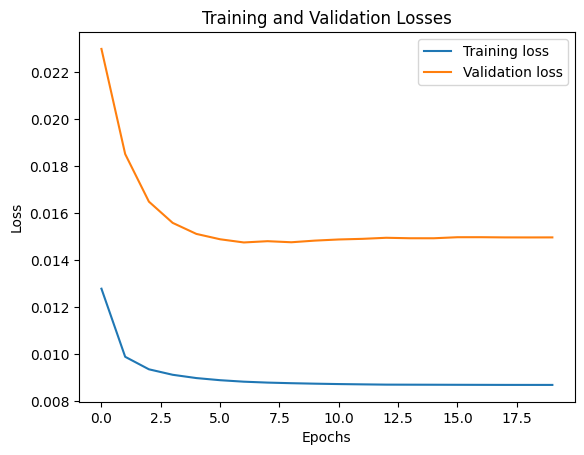

2322/2322 [==============================] - 3s 1ms/step


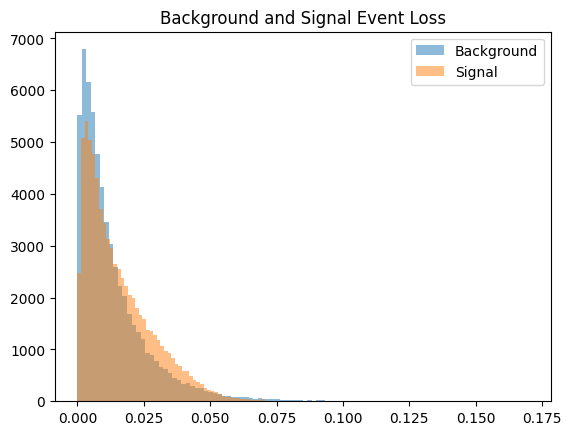

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [24:47<20:12, 134.68s/it]

Correctly predicted background E's: 53067 out of 60676 (87.46%)
Correctly predicted signal E's: 13350 out of 74299 (17.97%)
Epoch 1/20
508/508 [==============================] - 5s 7ms/step - loss: 0.0132 - acc: 0.4654 - val_loss: 0.0193 - val_acc: 0.7225 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0080 - acc: 0.6626 - val_loss: 0.0106 - val_acc: 0.8316 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0056 - acc: 0.7742 - val_loss: 0.0083 - val_acc: 0.8417 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0050 - acc: 0.7811 - val_loss: 0.0075 - val_acc: 0.8419 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 7ms/step - loss: 0.0048 - acc: 0.7773 - val_loss: 0.0071 - val_acc: 0.8412 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 7ms/step - loss: 0.0046 - acc: 0.7764 - val_loss: 0.0069 - val_acc: 0.8415 - lr: 0.0010
Epoch 

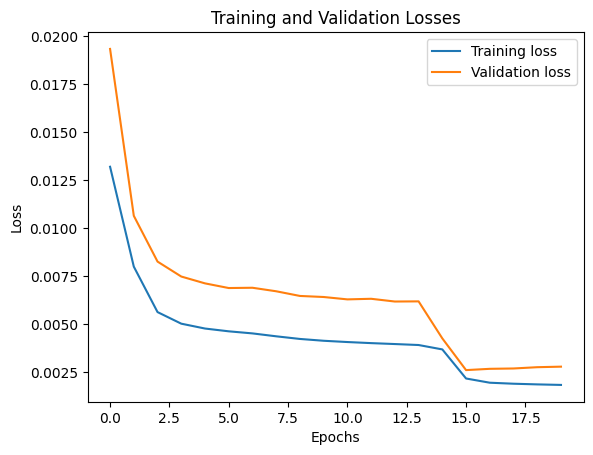

2322/2322 [==============================] - 4s 2ms/step


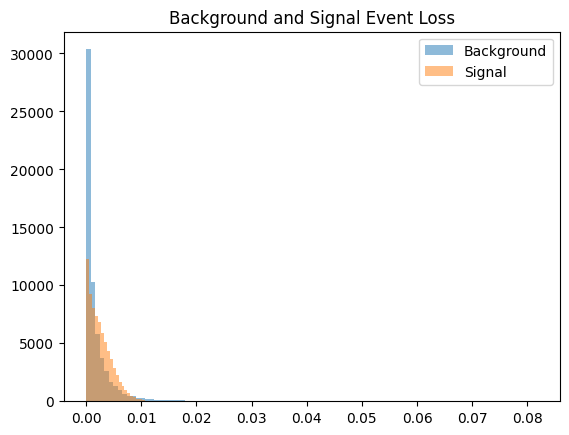

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [27:09<18:17, 137.14s/it]

Correctly predicted background E's: 56201 out of 60676 (92.62%)
Correctly predicted signal E's: 5760 out of 74299 (7.75%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0127 - acc: 0.5103 - val_loss: 0.0230 - val_acc: 0.6888 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0100 - acc: 0.6130 - val_loss: 0.0183 - val_acc: 0.7510 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0094 - acc: 0.5861 - val_loss: 0.0164 - val_acc: 0.7474 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 7ms/step - loss: 0.0092 - acc: 0.5782 - val_loss: 0.0156 - val_acc: 0.7439 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.5853 - val_loss: 0.0145 - val_acc: 0.7593 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0066 - acc: 0.7611 - val_loss: 0.0072 - val_acc: 0.8868 - lr: 0.0010
Epoch 7/

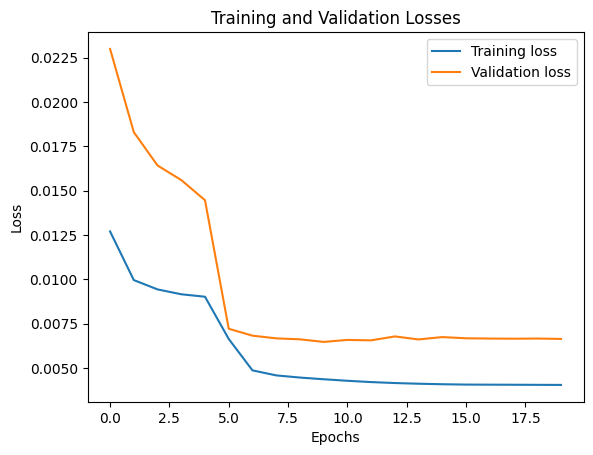

2322/2322 [==============================] - 3s 1ms/step


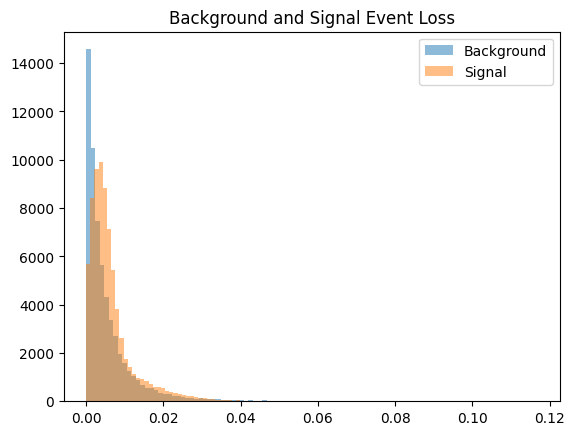

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [29:24<15:54, 136.30s/it]

Correctly predicted background E's: 54607 out of 60676 (90.00%)
Correctly predicted signal E's: 8323 out of 74299 (11.20%)
Epoch 1/20
508/508 [==============================] - 6s 6ms/step - loss: 0.0132 - acc: 0.4475 - val_loss: 0.0210 - val_acc: 0.7167 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0066 - acc: 0.6733 - val_loss: 0.0088 - val_acc: 0.8261 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0050 - acc: 0.7525 - val_loss: 0.0072 - val_acc: 0.8308 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0047 - acc: 0.7633 - val_loss: 0.0068 - val_acc: 0.8324 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0045 - acc: 0.7685 - val_loss: 0.0067 - val_acc: 0.8315 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0043 - acc: 0.7764 - val_loss: 0.0064 - val_acc: 0.8536 - lr: 0.0010
Epoch 7

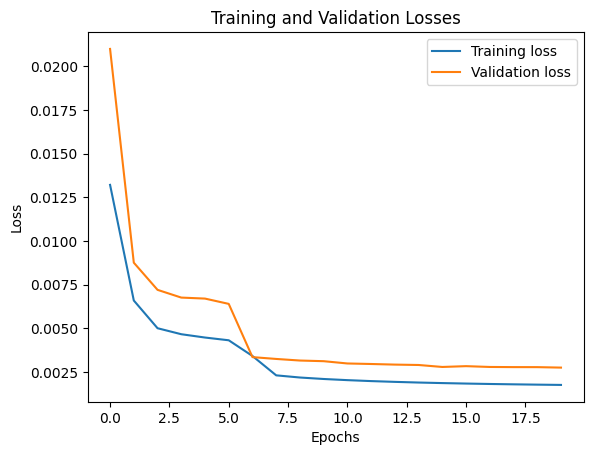

2322/2322 [==============================] - 3s 1ms/step


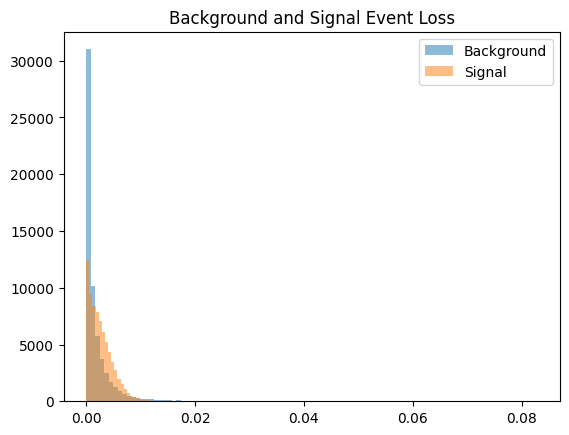

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [31:38<13:34, 135.74s/it]

Correctly predicted background E's: 56353 out of 60676 (92.88%)
Correctly predicted signal E's: 6083 out of 74299 (8.19%)
Epoch 1/20
508/508 [==============================] - 5s 7ms/step - loss: 0.0122 - acc: 0.5194 - val_loss: 0.0208 - val_acc: 0.7911 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0068 - acc: 0.6907 - val_loss: 0.0136 - val_acc: 0.7845 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0058 - acc: 0.7150 - val_loss: 0.0097 - val_acc: 0.8119 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0053 - acc: 0.7461 - val_loss: 0.0084 - val_acc: 0.8222 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0050 - acc: 0.7602 - val_loss: 0.0079 - val_acc: 0.8307 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0048 - acc: 0.7664 - val_loss: 0.0075 - val_acc: 0.8336 - lr: 0.0010
Epoch 7/

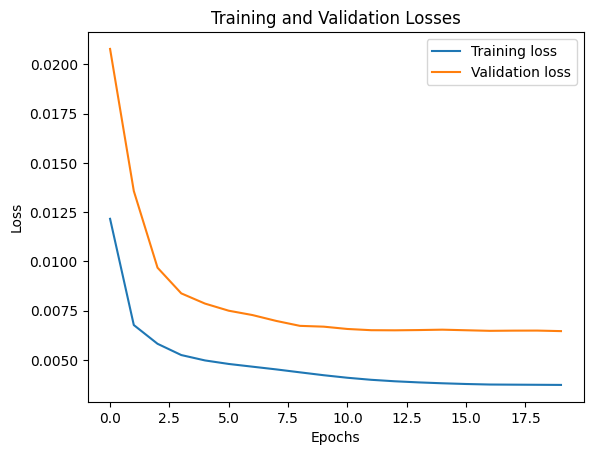

2322/2322 [==============================] - 3s 1ms/step


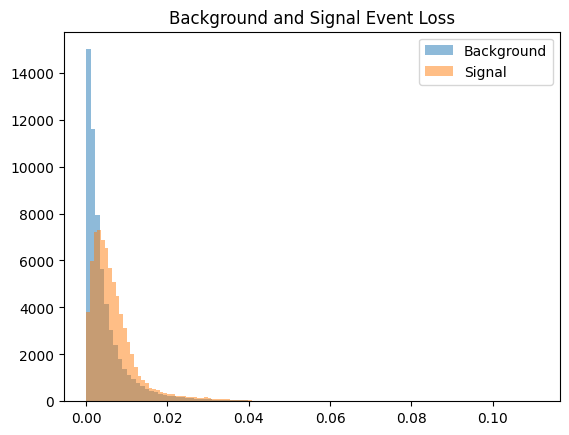

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [33:52<11:15, 135.02s/it]

Correctly predicted background E's: 54683 out of 60676 (90.12%)
Correctly predicted signal E's: 9985 out of 74299 (13.44%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0108 - acc: 0.6756 - val_loss: 0.0107 - val_acc: 0.8783 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0062 - acc: 0.8151 - val_loss: 0.0083 - val_acc: 0.8763 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0052 - acc: 0.8035 - val_loss: 0.0076 - val_acc: 0.8547 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0049 - acc: 0.7876 - val_loss: 0.0073 - val_acc: 0.8449 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0047 - acc: 0.7814 - val_loss: 0.0070 - val_acc: 0.8475 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0046 - acc: 0.7828 - val_loss: 0.0069 - val_acc: 0.8446 - lr: 0.0010
Epoch 7

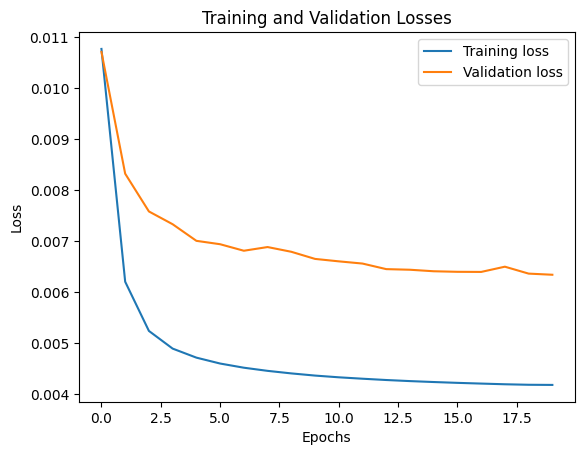

2322/2322 [==============================] - 3s 1ms/step


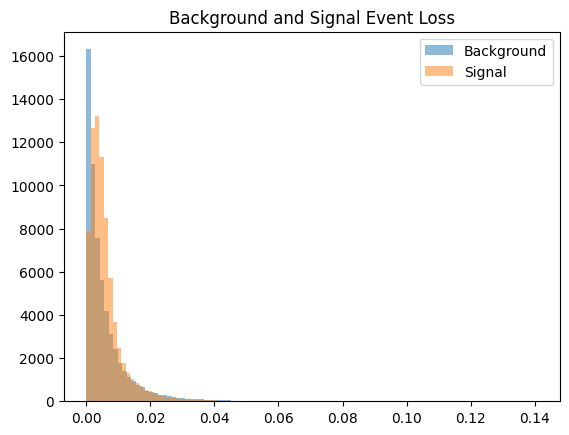

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [36:04<08:56, 134.24s/it]

Correctly predicted background E's: 54493 out of 60676 (89.81%)
Correctly predicted signal E's: 5548 out of 74299 (7.47%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0160 - acc: 0.4235 - val_loss: 0.0373 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4300 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 7/

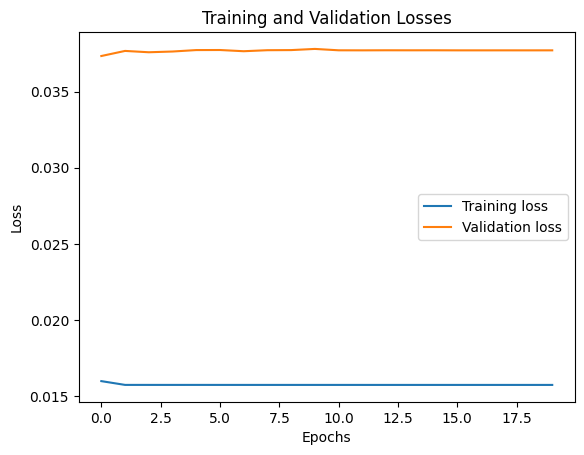

2322/2322 [==============================] - 3s 1ms/step


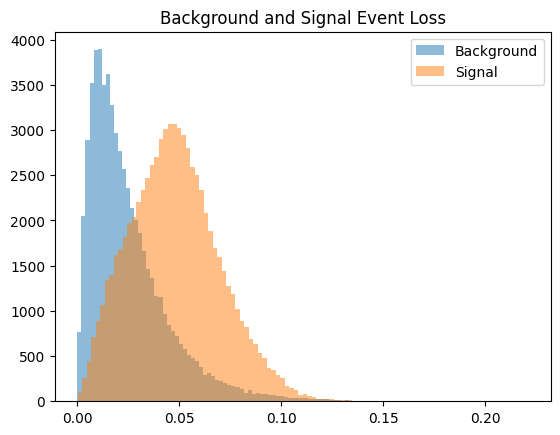

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [38:18<06:42, 134.09s/it]

Correctly predicted background E's: 52462 out of 60676 (86.46%)
Correctly predicted signal E's: 39503 out of 74299 (53.17%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0146 - acc: 0.4689 - val_loss: 0.0181 - val_acc: 0.7199 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0100 - acc: 0.5368 - val_loss: 0.0152 - val_acc: 0.7453 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0093 - acc: 0.5712 - val_loss: 0.0148 - val_acc: 0.7478 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 7ms/step - loss: 0.0091 - acc: 0.5752 - val_loss: 0.0146 - val_acc: 0.7484 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 7ms/step - loss: 0.0090 - acc: 0.5681 - val_loss: 0.0147 - val_acc: 0.7416 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.5649 - val_loss: 0.0147 - val_acc: 0.7410 - lr: 0.0010
Epoch 

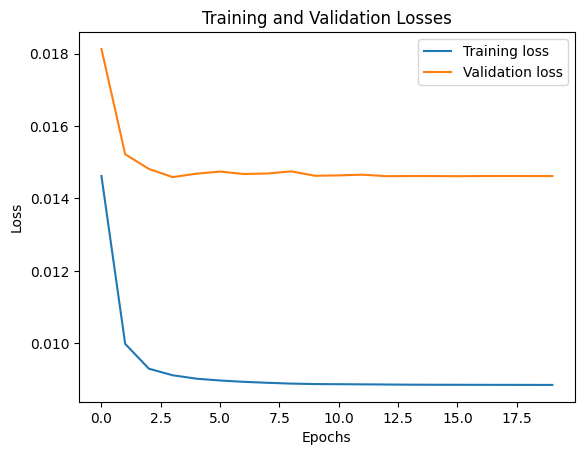

2322/2322 [==============================] - 4s 2ms/step


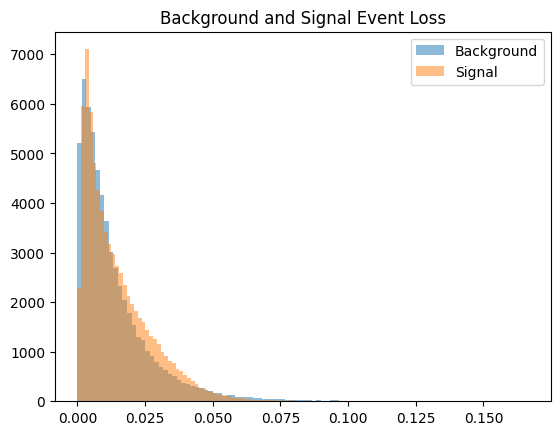

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [40:41<04:33, 136.90s/it]

Correctly predicted background E's: 53139 out of 60676 (87.58%)
Correctly predicted signal E's: 11042 out of 74299 (14.86%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0160 - acc: 0.4244 - val_loss: 0.0372 - val_acc: 0.2064 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2064 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2064 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0379 - val_acc: 0.2064 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2064 - lr: 0.0010
Epoch 

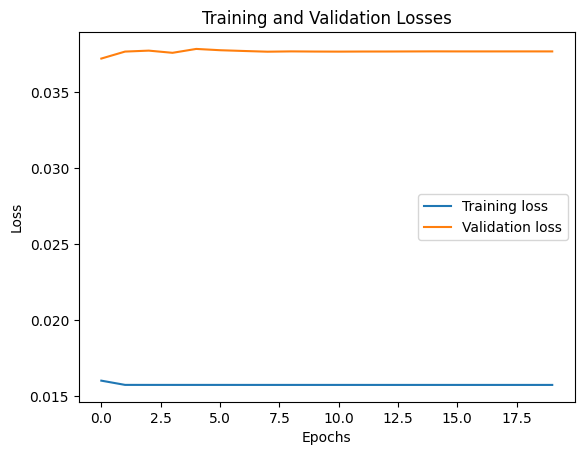

2322/2322 [==============================] - 3s 1ms/step


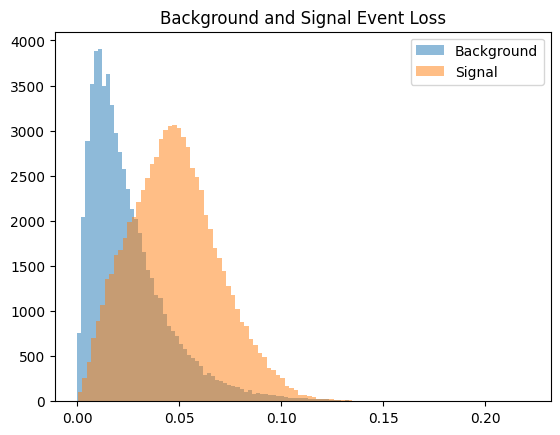

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [42:55<02:15, 135.81s/it]

Correctly predicted background E's: 52465 out of 60676 (86.47%)
Correctly predicted signal E's: 39467 out of 74299 (53.12%)
Epoch 1/20
508/508 [==============================] - 5s 6ms/step - loss: 0.0147 - acc: 0.4571 - val_loss: 0.0218 - val_acc: 0.7188 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0100 - acc: 0.5578 - val_loss: 0.0173 - val_acc: 0.7594 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0093 - acc: 0.5855 - val_loss: 0.0168 - val_acc: 0.7523 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0091 - acc: 0.5827 - val_loss: 0.0165 - val_acc: 0.7506 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0090 - acc: 0.5811 - val_loss: 0.0164 - val_acc: 0.7503 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 3s 6ms/step - loss: 0.0089 - acc: 0.5811 - val_loss: 0.0161 - val_acc: 0.7495 - lr: 0.0010
Epoch 

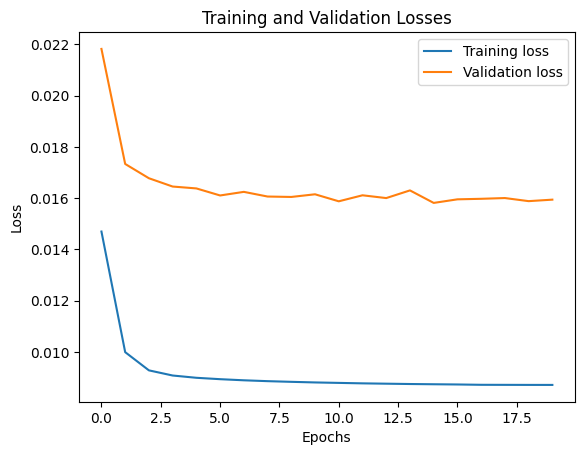

2322/2322 [==============================] - 3s 1ms/step


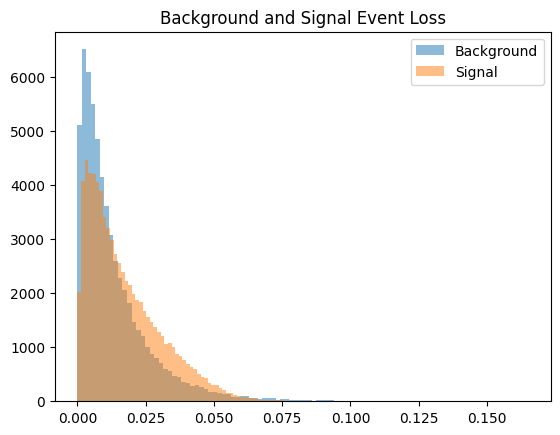

<ipython-input-37-cf14b43ff9b0>:154: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [45:08<00:00, 135.44s/it]

Correctly predicted background E's: 53090 out of 60676 (87.50%)
Correctly predicted signal E's: 15951 out of 74299 (21.47%)


In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(N_inputs, activation="relu"),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-4)),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-3)),



              ])
        self.decoder = Sequential([
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-4)),
                  Dense(N_inputs, activation="sigmoid"),
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])


    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    plot_model(autoencoder, to_file='/content/drive/MyDrive/CWoLa_Autoencoders/autoencoders/sparse/5layer_architecture.png', show_shapes=True, show_layer_names=True)

    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='Background')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='Signal')
    plt.legend(loc='upper right')
    plt.title("Background and Signal Event Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_5_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)

### 9-layer

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(N_inputs, activation="relu"),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-6)),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-5)),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-4)),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-3)),



              ])
        self.decoder = Sequential([
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-4)),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-5)),
                  Dense(N_inputs, activation="relu", activity_regularizer = l1(1e-6)),
                  Dense(N_inputs, activation="sigmoid"),
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Assign and compile the model
    autoencoder = AutoEncoder()
    autoencoder.compile(optimizer='adam', loss="mse", metrics=['acc'])

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data
    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]

    hist_autoencoder = autoencoder.fit( background_train_data, background_train_data,
                                        epochs=20,
                                        validation_data=(X_cwola_valT21[:, 1:],X_cwola_valT21[:, 1:]),
                                        batch_size=batch_size,
                                        sample_weight = background_weights,
                                        callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience = 5, factor = 0.2)],
                                        verbose=1)
    plt.plot(hist_autoencoder.history['loss'], label='Training loss')
    plt.plot(hist_autoencoder.history['val_loss'], label='Validation loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.

    background_prediction = autoencoder.predict(background_validation_data)
    reconstruction_background = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(reconstruction_background, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)
    reconstruction_signal = autoencoder.predict(signal_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(reconstruction_signal, signal_validation_data)

    # # ---------------------- MSSE LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=100, alpha= 0.5, label='Background')
    plt.hist(train_loss_signal, bins=100, alpha= 0.5, label='Signal')
    plt.legend(loc='upper right')
    plt.title("Background and Signal Event Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([train_loss_signal, train_loss_background])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores)
    cwola_rocsT21_autoencoder_MSE_9_layer = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20
508/508 [==============================] - 8s 10ms/step - loss: 0.0160 - acc: 0.4292 - val_loss: 0.0373 - val_acc: 0.2065 - lr: 0.0010
Epoch 2/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0378 - val_acc: 0.2065 - lr: 0.0010
Epoch 3/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0375 - val_acc: 0.2065 - lr: 0.0010
Epoch 4/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 5/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0.2065 - lr: 0.0010
Epoch 6/20
508/508 [==============================] - 5s 9ms/step - loss: 0.0158 - acc: 0.4299 - val_loss: 0.0376 - val_acc: 0.2065 - lr: 0.0010
Epoch 7/20
508/508 [==============================] - 5s 10ms/step - loss: 0.0157 - acc: 0.4299 - val_loss: 0.0377 - val_acc: 0

  0%|          | 0/20 [00:46<?, ?it/s]


KeyboardInterrupt: ignored

In [ ]:
from numba import cuda

device = cuda.get_current_device()
device.reset()

## Adversarial Training

  0%|          | 0/20 [00:00<?, ?it/s]

-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.700897, acc.: 0.00%] [G loss: 0.132798, mse: 0.132237]
7/7 [==============================] - 0s 4ms/step
1 [D loss: 0.694739, acc.: 42.50%] [G loss: 0.134693, mse: 0.134135]
7/7 [==============================] - 0s 5ms/step
2 [D loss: 0.692433, acc.: 50.00%] [G loss: 0.129312, mse: 0.128747]
7/7 [==============================] - 0s 5ms/step
3 [D loss: 0.690772, acc.: 49.75%] [G loss: 0.133350, mse: 0.132789]
7/7 [==============================] - 0s 4ms/step
4 [D loss: 0.689305, acc.: 49.75%] [G loss: 0.135214, mse: 0.134654]
7/7 [==============================] - 0s 5ms/step
5 [D loss: 0.688962, acc.: 49.00%] [G loss: 0.129531, mse: 0.128964]
7/7 [==============================] - 0s 4ms/step
6 [D loss: 0.687856, acc.: 48.50%] [G loss: 0.127906, mse: 0.127337]
7/7 [==============================] - 0s 5ms/step
7 [D loss: 0.686416, acc.: 48.25%] [G loss: 0.132427, mse: 0.13186

  5%|▌         | 1/20 [00:13<04:24, 13.93s/it]

19 [D loss: 0.670509, acc.: 98.25%] [G loss: 0.126171, mse: 0.125587]
-------------------- 4 --------------------
7/7 [==============================] - 0s 6ms/step
0 [D loss: 0.703915, acc.: 50.00%] [G loss: 0.137034, mse: 0.136461]
7/7 [==============================] - 0s 5ms/step
1 [D loss: 0.697355, acc.: 50.00%] [G loss: 0.132646, mse: 0.132069]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.695339, acc.: 50.25%] [G loss: 0.134128, mse: 0.133553]
7/7 [==============================] - 0s 4ms/step
3 [D loss: 0.693931, acc.: 50.75%] [G loss: 0.140028, mse: 0.139458]
7/7 [==============================] - 0s 4ms/step
4 [D loss: 0.692787, acc.: 51.50%] [G loss: 0.130028, mse: 0.129448]
7/7 [==============================] - 0s 4ms/step
5 [D loss: 0.691416, acc.: 56.00%] [G loss: 0.135644, mse: 0.135069]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.690471, acc.: 58.50%] [G loss: 0.127859, mse: 0.127276]
7/7 [==============================] - 0s 4ms/

 10%|█         | 2/20 [00:31<04:49, 16.11s/it]

19 [D loss: 0.672702, acc.: 90.75%] [G loss: 0.130117, mse: 0.129527]
-------------------- 4 --------------------
7/7 [==============================] - 0s 4ms/step
0 [D loss: 0.700198, acc.: 50.00%] [G loss: 0.128167, mse: 0.127617]
7/7 [==============================] - 0s 4ms/step
1 [D loss: 0.693819, acc.: 50.00%] [G loss: 0.131279, mse: 0.130731]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.691685, acc.: 50.00%] [G loss: 0.133658, mse: 0.133111]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.689723, acc.: 50.00%] [G loss: 0.136819, mse: 0.136273]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.688065, acc.: 50.00%] [G loss: 0.143371, mse: 0.142830]
7/7 [==============================] - 0s 3ms/step
5 [D loss: 0.687256, acc.: 50.00%] [G loss: 0.132189, mse: 0.131635]
7/7 [==============================] - 0s 4ms/step
6 [D loss: 0.686140, acc.: 50.00%] [G loss: 0.132425, mse: 0.131870]
7/7 [==============================] - 0s 3ms/

 15%|█▌        | 3/20 [00:42<03:54, 13.80s/it]

19 [D loss: 0.667569, acc.: 49.75%] [G loss: 0.127611, mse: 0.127038]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.703131, acc.: 0.00%] [G loss: 0.132166, mse: 0.131602]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.696994, acc.: 13.00%] [G loss: 0.131931, mse: 0.131368]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.695427, acc.: 17.50%] [G loss: 0.134018, mse: 0.133455]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.694063, acc.: 20.50%] [G loss: 0.132551, mse: 0.131986]
7/7 [==============================] - 0s 4ms/step
4 [D loss: 0.693401, acc.: 19.25%] [G loss: 0.131922, mse: 0.131356]
7/7 [==============================] - 0s 3ms/step
5 [D loss: 0.692733, acc.: 24.00%] [G loss: 0.134313, mse: 0.133748]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.691624, acc.: 76.75%] [G loss: 0.132156, mse: 0.131589]
7/7 [==============================] - 0s 4ms/s

 20%|██        | 4/20 [00:52<03:17, 12.33s/it]

19 [D loss: 0.681364, acc.: 92.25%] [G loss: 0.126782, mse: 0.126200]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.701753, acc.: 50.00%] [G loss: 0.136045, mse: 0.135511]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.695050, acc.: 50.00%] [G loss: 0.134672, mse: 0.134136]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.692812, acc.: 50.00%] [G loss: 0.137354, mse: 0.136818]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.691985, acc.: 50.00%] [G loss: 0.136945, mse: 0.136407]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.690005, acc.: 50.00%] [G loss: 0.129879, mse: 0.129331]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.689150, acc.: 50.00%] [G loss: 0.131602, mse: 0.131055]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.688260, acc.: 50.00%] [G loss: 0.127435, mse: 0.126881]
7/7 [==============================] - 0s 2ms/

 25%|██▌       | 5/20 [00:58<02:30, 10.01s/it]

19 [D loss: 0.670321, acc.: 50.00%] [G loss: 0.124786, mse: 0.124212]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.704357, acc.: 50.00%] [G loss: 0.135326, mse: 0.134752]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.696444, acc.: 50.00%] [G loss: 0.131619, mse: 0.131041]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.692893, acc.: 50.00%] [G loss: 0.136663, mse: 0.136087]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.691231, acc.: 54.00%] [G loss: 0.131762, mse: 0.131180]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.689878, acc.: 58.75%] [G loss: 0.130213, mse: 0.129628]
7/7 [==============================] - 0s 4ms/step
5 [D loss: 0.689104, acc.: 61.00%] [G loss: 0.125344, mse: 0.124753]
7/7 [==============================] - 0s 4ms/step
6 [D loss: 0.686772, acc.: 69.00%] [G loss: 0.134721, mse: 0.134139]
7/7 [==============================] - 0s 3ms/

 30%|███       | 6/20 [01:05<02:05,  8.96s/it]

19 [D loss: 0.670118, acc.: 90.00%] [G loss: 0.129442, mse: 0.128841]
-------------------- 4 --------------------
7/7 [==============================] - 0s 4ms/step
0 [D loss: 0.701518, acc.: 49.75%] [G loss: 0.139505, mse: 0.138978]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.694723, acc.: 50.00%] [G loss: 0.133838, mse: 0.133304]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.692219, acc.: 50.00%] [G loss: 0.131594, mse: 0.131055]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.691389, acc.: 50.00%] [G loss: 0.128403, mse: 0.127859]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.689568, acc.: 50.00%] [G loss: 0.133076, mse: 0.132535]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.688601, acc.: 50.00%] [G loss: 0.134213, mse: 0.133671]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.687192, acc.: 50.00%] [G loss: 0.128653, mse: 0.128103]
7/7 [==============================] - 0s 2ms/

 35%|███▌      | 7/20 [01:12<01:48,  8.34s/it]

19 [D loss: 0.670761, acc.: 50.00%] [G loss: 0.127987, mse: 0.127419]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.701418, acc.: 50.00%] [G loss: 0.133270, mse: 0.132736]
7/7 [==============================] - 0s 2ms/step
1 [D loss: 0.693996, acc.: 50.00%] [G loss: 0.134693, mse: 0.134159]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.691648, acc.: 50.00%] [G loss: 0.129557, mse: 0.129016]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.690530, acc.: 50.00%] [G loss: 0.128332, mse: 0.127788]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.688946, acc.: 50.00%] [G loss: 0.130626, mse: 0.130084]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.688117, acc.: 50.00%] [G loss: 0.128403, mse: 0.127857]
7/7 [==============================] - 0s 2ms/step
6 [D loss: 0.687009, acc.: 50.00%] [G loss: 0.131129, mse: 0.130584]
7/7 [==============================] - 0s 3ms/

 40%|████      | 8/20 [01:18<01:31,  7.62s/it]

19 [D loss: 0.671539, acc.: 50.00%] [G loss: 0.123276, mse: 0.122708]
-------------------- 4 --------------------
7/7 [==============================] - 0s 4ms/step
0 [D loss: 0.701728, acc.: 50.00%] [G loss: 0.134393, mse: 0.133819]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.695995, acc.: 51.50%] [G loss: 0.131687, mse: 0.131111]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.694032, acc.: 53.75%] [G loss: 0.134645, mse: 0.134071]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.692816, acc.: 55.50%] [G loss: 0.127377, mse: 0.126796]
7/7 [==============================] - 0s 4ms/step
4 [D loss: 0.691351, acc.: 58.25%] [G loss: 0.134441, mse: 0.133865]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.689585, acc.: 63.50%] [G loss: 0.139195, mse: 0.138624]
7/7 [==============================] - 0s 2ms/step
6 [D loss: 0.688494, acc.: 67.75%] [G loss: 0.130718, mse: 0.130138]
7/7 [==============================] - 0s 2ms/

 45%|████▌     | 9/20 [01:26<01:24,  7.71s/it]

19 [D loss: 0.670534, acc.: 93.25%] [G loss: 0.126682, mse: 0.126089]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.700741, acc.: 10.00%] [G loss: 0.133975, mse: 0.133418]
7/7 [==============================] - 0s 2ms/step
1 [D loss: 0.693477, acc.: 48.75%] [G loss: 0.129078, mse: 0.128513]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.691351, acc.: 48.75%] [G loss: 0.129840, mse: 0.129273]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.689245, acc.: 46.50%] [G loss: 0.140863, mse: 0.140306]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.688452, acc.: 47.00%] [G loss: 0.138716, mse: 0.138155]
7/7 [==============================] - 0s 4ms/step
5 [D loss: 0.687389, acc.: 94.50%] [G loss: 0.136027, mse: 0.135461]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.686492, acc.: 93.25%] [G loss: 0.127965, mse: 0.127389]
7/7 [==============================] - 0s 3ms/

 50%|█████     | 10/20 [02:53<05:20, 32.08s/it]

19 [D loss: 0.671795, acc.: 95.00%] [G loss: 0.128013, mse: 0.127423]
-------------------- 4 --------------------
7/7 [==============================] - 0s 4ms/step
0 [D loss: 0.702024, acc.: 0.00%] [G loss: 0.135965, mse: 0.135410]
7/7 [==============================] - 0s 2ms/step
1 [D loss: 0.695248, acc.: 41.75%] [G loss: 0.133347, mse: 0.132790]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.693622, acc.: 49.50%] [G loss: 0.127096, mse: 0.126531]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.691705, acc.: 50.00%] [G loss: 0.132837, mse: 0.132277]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.690029, acc.: 50.00%] [G loss: 0.132128, mse: 0.131567]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.689499, acc.: 50.00%] [G loss: 0.133492, mse: 0.132931]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.688394, acc.: 50.00%] [G loss: 0.129416, mse: 0.128850]
7/7 [==============================] - 0s 2ms/s

 55%|█████▌    | 11/20 [03:00<03:40, 24.51s/it]

19 [D loss: 0.675458, acc.: 99.50%] [G loss: 0.118947, mse: 0.118360]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.704399, acc.: 50.00%] [G loss: 0.132516, mse: 0.132008]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.696512, acc.: 50.00%] [G loss: 0.140845, mse: 0.140343]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.694490, acc.: 50.00%] [G loss: 0.128009, mse: 0.127492]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.692763, acc.: 50.00%] [G loss: 0.136187, mse: 0.135675]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.691781, acc.: 50.00%] [G loss: 0.138218, mse: 0.137706]
7/7 [==============================] - 0s 3ms/step
5 [D loss: 0.691227, acc.: 50.00%] [G loss: 0.133958, mse: 0.133441]
7/7 [==============================] - 0s 2ms/step
6 [D loss: 0.690216, acc.: 50.00%] [G loss: 0.133538, mse: 0.133017]
7/7 [==============================] - 0s 2ms/

 60%|██████    | 12/20 [03:06<02:30, 18.86s/it]

19 [D loss: 0.674869, acc.: 50.00%] [G loss: 0.127321, mse: 0.126771]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.704085, acc.: 50.00%] [G loss: 0.131773, mse: 0.131250]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.695934, acc.: 50.00%] [G loss: 0.130344, mse: 0.129818]
7/7 [==============================] - 0s 4ms/step
2 [D loss: 0.692958, acc.: 50.00%] [G loss: 0.134347, mse: 0.133823]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.692000, acc.: 50.00%] [G loss: 0.130002, mse: 0.129471]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.690552, acc.: 50.00%] [G loss: 0.126777, mse: 0.126239]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.689633, acc.: 50.00%] [G loss: 0.128253, mse: 0.127714]
7/7 [==============================] - 0s 2ms/step
6 [D loss: 0.687726, acc.: 50.00%] [G loss: 0.131773, mse: 0.131236]
7/7 [==============================] - 0s 2ms/

 65%|██████▌   | 13/20 [03:14<01:49, 15.66s/it]

19 [D loss: 0.671056, acc.: 50.00%] [G loss: 0.123899, mse: 0.123331]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.702647, acc.: 49.75%] [G loss: 0.137540, mse: 0.137007]
7/7 [==============================] - 0s 2ms/step
1 [D loss: 0.696037, acc.: 50.00%] [G loss: 0.134521, mse: 0.133984]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.693898, acc.: 50.00%] [G loss: 0.129238, mse: 0.128693]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.692257, acc.: 50.00%] [G loss: 0.139062, mse: 0.138525]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.691315, acc.: 50.00%] [G loss: 0.133589, mse: 0.133045]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.690220, acc.: 50.00%] [G loss: 0.132430, mse: 0.131883]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.689098, acc.: 50.00%] [G loss: 0.135453, mse: 0.134907]
7/7 [==============================] - 0s 2ms/

 70%|███████   | 14/20 [03:20<01:16, 12.72s/it]

19 [D loss: 0.675265, acc.: 50.00%] [G loss: 0.133379, mse: 0.132815]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.701884, acc.: 50.00%] [G loss: 0.136281, mse: 0.135751]
7/7 [==============================] - 0s 4ms/step
1 [D loss: 0.695264, acc.: 50.00%] [G loss: 0.134080, mse: 0.133547]
7/7 [==============================] - 0s 4ms/step
2 [D loss: 0.692442, acc.: 50.00%] [G loss: 0.132388, mse: 0.131852]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.691892, acc.: 50.00%] [G loss: 0.131583, mse: 0.131045]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.689955, acc.: 50.00%] [G loss: 0.129200, mse: 0.128658]
7/7 [==============================] - 0s 3ms/step
5 [D loss: 0.689128, acc.: 50.00%] [G loss: 0.131356, mse: 0.130816]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.688019, acc.: 50.00%] [G loss: 0.128810, mse: 0.128265]
7/7 [==============================] - 0s 3ms/

 75%|███████▌  | 15/20 [03:28<00:56, 11.25s/it]

19 [D loss: 0.670918, acc.: 50.00%] [G loss: 0.128210, mse: 0.127649]
-------------------- 4 --------------------
7/7 [==============================] - 0s 2ms/step
0 [D loss: 0.699306, acc.: 50.00%] [G loss: 0.136435, mse: 0.135896]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.693862, acc.: 50.00%] [G loss: 0.133566, mse: 0.133023]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.691646, acc.: 50.00%] [G loss: 0.135643, mse: 0.135101]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.690275, acc.: 50.00%] [G loss: 0.132370, mse: 0.131823]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.689512, acc.: 50.00%] [G loss: 0.134905, mse: 0.134359]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.688323, acc.: 50.00%] [G loss: 0.132332, mse: 0.131783]
7/7 [==============================] - 0s 2ms/step
6 [D loss: 0.687395, acc.: 50.00%] [G loss: 0.127258, mse: 0.126703]
7/7 [==============================] - 0s 3ms/

 80%|████████  | 16/20 [03:34<00:38,  9.74s/it]

19 [D loss: 0.669669, acc.: 50.00%] [G loss: 0.129521, mse: 0.128956]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.703167, acc.: 30.75%] [G loss: 0.138528, mse: 0.137987]
7/7 [==============================] - 0s 2ms/step
1 [D loss: 0.696351, acc.: 50.00%] [G loss: 0.131627, mse: 0.131078]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.694459, acc.: 50.00%] [G loss: 0.128797, mse: 0.128244]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.693144, acc.: 50.00%] [G loss: 0.130234, mse: 0.129681]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.692251, acc.: 50.00%] [G loss: 0.131528, mse: 0.130975]
7/7 [==============================] - 0s 5ms/step
5 [D loss: 0.691234, acc.: 50.00%] [G loss: 0.128123, mse: 0.127566]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.690108, acc.: 50.00%] [G loss: 0.129551, mse: 0.128994]
7/7 [==============================] - 0s 3ms/

 85%|████████▌ | 17/20 [03:41<00:26,  8.80s/it]

19 [D loss: 0.675538, acc.: 50.00%] [G loss: 0.134946, mse: 0.134384]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.701781, acc.: 32.75%] [G loss: 0.139555, mse: 0.139012]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.694944, acc.: 50.00%] [G loss: 0.132136, mse: 0.131585]
7/7 [==============================] - 0s 2ms/step
2 [D loss: 0.693090, acc.: 50.00%] [G loss: 0.133924, mse: 0.133373]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.690915, acc.: 50.00%] [G loss: 0.135984, mse: 0.135433]
7/7 [==============================] - 0s 3ms/step
4 [D loss: 0.689504, acc.: 50.00%] [G loss: 0.137035, mse: 0.136484]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.688174, acc.: 50.00%] [G loss: 0.133695, mse: 0.133140]
7/7 [==============================] - 0s 2ms/step
6 [D loss: 0.687097, acc.: 50.00%] [G loss: 0.130999, mse: 0.130439]
7/7 [==============================] - 0s 2ms/

 90%|█████████ | 18/20 [03:48<00:16,  8.36s/it]

19 [D loss: 0.668128, acc.: 98.50%] [G loss: 0.134121, mse: 0.133546]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.701787, acc.: 13.25%] [G loss: 0.132168, mse: 0.131614]
7/7 [==============================] - 0s 3ms/step
1 [D loss: 0.695285, acc.: 48.75%] [G loss: 0.136479, mse: 0.135928]
7/7 [==============================] - 0s 3ms/step
2 [D loss: 0.692988, acc.: 50.00%] [G loss: 0.134431, mse: 0.133877]
7/7 [==============================] - 0s 2ms/step
3 [D loss: 0.691097, acc.: 50.00%] [G loss: 0.127910, mse: 0.127348]
7/7 [==============================] - 0s 2ms/step
4 [D loss: 0.689862, acc.: 50.00%] [G loss: 0.132796, mse: 0.132238]
7/7 [==============================] - 0s 2ms/step
5 [D loss: 0.688296, acc.: 50.00%] [G loss: 0.137208, mse: 0.136654]
7/7 [==============================] - 0s 3ms/step
6 [D loss: 0.687301, acc.: 50.00%] [G loss: 0.138917, mse: 0.138364]
7/7 [==============================] - 0s 3ms/

 95%|█████████▌| 19/20 [03:54<00:07,  7.63s/it]

19 [D loss: 0.669789, acc.: 98.25%] [G loss: 0.128599, mse: 0.128019]
-------------------- 4 --------------------
7/7 [==============================] - 0s 3ms/step
0 [D loss: 0.701265, acc.: 50.00%] [G loss: 0.139016, mse: 0.138492]
7/7 [==============================] - 0s 4ms/step
1 [D loss: 0.695019, acc.: 50.00%] [G loss: 0.130121, mse: 0.129587]
7/7 [==============================] - 0s 4ms/step
2 [D loss: 0.692726, acc.: 50.00%] [G loss: 0.131102, mse: 0.130566]
7/7 [==============================] - 0s 3ms/step
3 [D loss: 0.691549, acc.: 50.00%] [G loss: 0.128819, mse: 0.128279]
7/7 [==============================] - 0s 5ms/step
4 [D loss: 0.690408, acc.: 50.00%] [G loss: 0.140843, mse: 0.140313]
7/7 [==============================] - 0s 3ms/step
5 [D loss: 0.689911, acc.: 50.00%] [G loss: 0.128868, mse: 0.128325]
7/7 [==============================] - 0s 4ms/step
6 [D loss: 0.689024, acc.: 50.00%] [G loss: 0.127453, mse: 0.126906]
7/7 [==============================] - 0s 3ms/

100%|██████████| 20/20 [04:02<00:00, 12.13s/it]

19 [D loss: 0.675717, acc.: 50.00%] [G loss: 0.124523, mse: 0.123959]


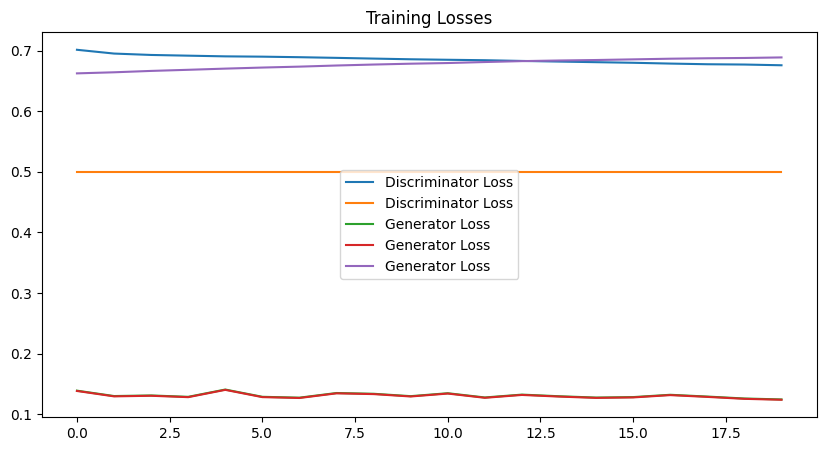

2322/2322 [==============================] - 4s 2ms/step


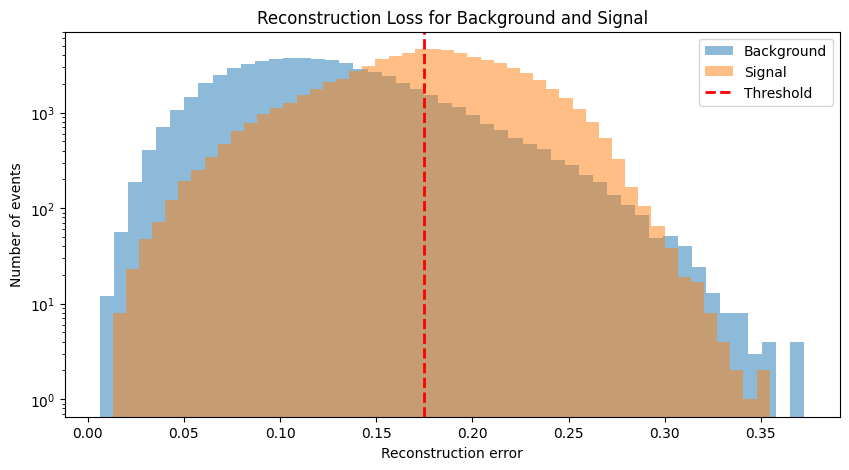

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPooling1D, Conv1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    print("--------------------", N_inputs, "--------------------")


    # Define the discriminator model
    def build_discriminator(input_shape):
        model = Sequential([
            Dense(512, activation="relu", input_dim=input_shape),
            Dense(256, activation="relu"),
            Dense(128, activation="relu"),
            Dense(1, activation="sigmoid")
        ])
        model.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
        return model

    class AutoEncoder(Model):
      def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
                  Dense(128, activation="relu"),
                  Dense(64, activation="relu"),
                  Dense(32, activation="relu"),
                  Dense(16, activation="relu"),


              ])
        self.decoder = Sequential([
                  Dense(32, activation="relu"),
                  Dense(64, activation="relu"),
                  Dense(128, activation="relu"),
                  Dense(N_inputs, activation="sigmoid")
              ])
      def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # Define the combined model of autoencoder and discriminator
    def build_combined(autoencoder, discriminator, input_shape):
        discriminator.trainable = False  # For the combined model, we only train the autoencoder
        input_data = Input(shape=(input_shape,))
        reconstructed_data = autoencoder(input_data)
        validity = discriminator(reconstructed_data)
        combined = Model(input_data, [reconstructed_data, validity])
        combined.compile(loss=['mae', 'binary_crossentropy'], loss_weights=[0.999, 0.001], optimizer=Adam(0.0002, 0.5))
        return combined

    # Main training loop
    discriminator = build_discriminator(N_inputs)
    autoencoder = AutoEncoder()
    combined = build_combined(autoencoder, discriminator, N_inputs)

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    signal_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]

    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data

    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))
    d_losses = []
    g_losses = []

    for epoch in range(20):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        # Select a random batch of data
        idx = np.random.randint(0, background_train_data.shape[0], batch_size)
        data = background_train_data[idx]

        # Generate a batch of new data
        gen_data = autoencoder.predict(data)

        # Train the discriminator
        d_loss_real = discriminator.train_on_batch(data, valid)
        d_loss_fake = discriminator.train_on_batch(gen_data, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d_losses.append(d_loss)

        # ---------------------
        #  Train Autoencoder
        # ---------------------

        # Train the autoencoder (to improve reconstruction and to fool the discriminator)
        g_loss = combined.train_on_batch(data, [data, valid])
        g_losses.append(g_loss)

        # Plot the progress
        print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f, mse: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss[0], g_loss[1]))


# Plot discriminator and generator losses
plt.figure(figsize=(10,5))
plt.plot(d_losses, label="Discriminator Loss")
plt.plot(g_losses, label="Generator Loss")
plt.title("Training Losses")
plt.legend()
plt.show()


# After training, evaluate model performance on validation data
background_prediction = autoencoder.predict(background_validation_data)
reconstruction_background = autoencoder.predict(background_validation_data)

# Compute the mean of absolute difference between labels and predictions for background
train_loss_background = tf.keras.losses.mae(reconstruction_background, background_validation_data)
threshold = np.mean(train_loss_background) + np.std(train_loss_background)

# Predict on signal data, the MSE should be larger in comparison with background data
signal_prediction = autoencoder.predict(signal_validation_data)
reconstruction_signal = autoencoder.predict(signal_validation_data)

# Compute the mean of absolute difference between labels and predictions for signal
train_loss_signal = tf.keras.losses.mae(reconstruction_signal, signal_validation_data)

# Plot reconstruction loss distribution for background and signal
plt.figure(figsize=(10,5))
plt.hist(train_loss_background.numpy(), bins=50, alpha=0.5, label='Background')
plt.hist(train_loss_signal.numpy(), bins=50, alpha=0.5, label='Signal')
plt.axvline(threshold, color='r', linestyle='dashed', linewidth=2, label='Threshold')
plt.title("Reconstruction Loss for Background and Signal")
plt.xlabel("Reconstruction error")
plt.ylabel("Number of events")
plt.yscale('log')  # Use logarithmic scale for better visualization if needed
plt.legend()
plt.show()


## Adversarial Autoencoder

  0%|          | 0/20 [00:00<?, ?it/s]

Se han truncado las últimas 5000 líneas del flujo de salida.
5/5 [==============================] - 0s 2ms/step
Epoch 44/50 - Autoencoder Loss: 0.001236749580129981, Adversary Loss: 2.448366165161133
5/5 [==============================] - 0s 2ms/step
Epoch 45/50 - Autoencoder Loss: 0.0009737858199514449, Adversary Loss: 2.447923183441162
5/5 [==============================] - 0s 2ms/step
Epoch 46/50 - Autoencoder Loss: 0.0008657443104311824, Adversary Loss: 2.4479751586914062
5/5 [==============================] - 0s 2ms/step
Epoch 47/50 - Autoencoder Loss: 0.0011660438030958176, Adversary Loss: 2.4478940963745117
5/5 [==============================] - 0s 2ms/step
Epoch 48/50 - Autoencoder Loss: 0.001082151080481708, Adversary Loss: 2.447934627532959
5/5 [==============================] - 0s 2ms/step
Epoch 49/50 - Autoencoder Loss: 0.001624604221433401, Adversary Loss: 2.4483304023742676
5/5 [==============================] - 0s 2ms/step
Epoch 50/50 - Autoencoder Loss: 0.00092674820916

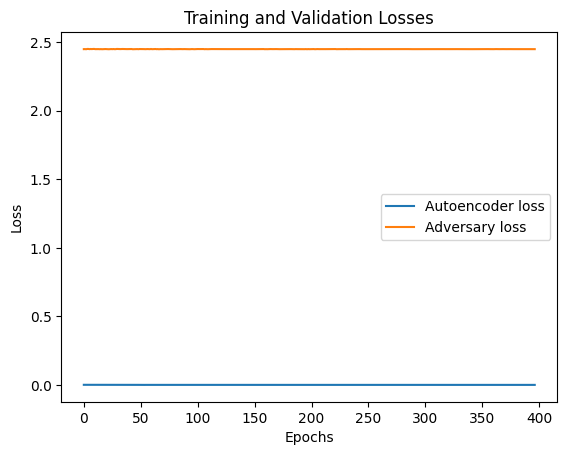

2322/2322 [==============================] - 4s 2ms/step


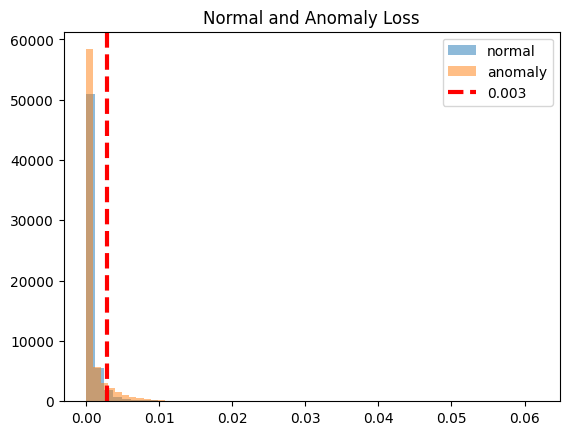

<ipython-input-14-6a964c870512>:233: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_autoencoder_binary = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [46:15<14:38:54, 2775.53s/it]

Se han truncado las últimas 5000 líneas del flujo de salida.
4/4 [==============================] - 0s 2ms/step
Epoch 9/50 - Autoencoder Loss: 0.0013995361514389515, Adversary Loss: 2.454428195953369
4/4 [==============================] - 0s 2ms/step
Epoch 10/50 - Autoencoder Loss: 0.0012266255216673017, Adversary Loss: 2.451768398284912
4/4 [==============================] - 0s 2ms/step
Epoch 11/50 - Autoencoder Loss: 0.0008833367028273642, Adversary Loss: 2.4474854469299316
4/4 [==============================] - 0s 2ms/step
Epoch 12/50 - Autoencoder Loss: 0.0012135067954659462, Adversary Loss: 2.4509034156799316
4/4 [==============================] - 0s 2ms/step
Epoch 13/50 - Autoencoder Loss: 0.00111867836676538, Adversary Loss: 2.4513967037200928
4/4 [==============================] - 0s 2ms/step
Epoch 14/50 - Autoencoder Loss: 0.0022051376290619373, Adversary Loss: 2.4536795616149902
4/4 [==============================] - 0s 2ms/step
Epoch 15/50 - Autoencoder Loss: 0.0017367048421

In [ ]:
#CWoLa with T21 relu threshold 0.5e-6
from sklearn import metrics
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import MeanSquaredError

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.datasets import mnist
import numpy as np

# Initialize DF to store false positive and true positive rates.
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

# Iterate over range of signal injection events
for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    # Concatenate injected signal background data from SR and SB regions.
    # Labels 1 for signal, 0 for background.
    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21)

    # Filter training data based on the mass
    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 0][:, 1:]))
    #print(len(X_cwola_trainT21[Y_cwola_trainT21 == 1][:, 1:]))
    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    #----------------------------------------------------------------

    background_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]
    signal_train_data = X_cwola_trainT21[Y_cwola_trainT21 == 0][:,1:]

    background_weights = W_cwola_trainT21[Y_cwola_trainT21 == 0]  # Extract weights corresponding to background data

    background_validation_data = X_cwola_valT21[Y_cwola_valT21 == 0][:, 1:]
    signal_validation_data = X_cwola_valT21[Y_cwola_valT21 == 1][:, 1:]

    # Define the architecture of the Adversarial Autoencoder
    def build_adversarial_autoencoder(input_dim, latent_dim):
        # Encoder
        input_layer = Input(shape=(input_dim,))

        # Encoder network
        encoder_layer = Dense(128, activation='relu')(input_layer)
        encoder_layer = Dense(64, activation='relu')(encoder_layer)
        encoder_layer = Dense(32, activation='relu')(encoder_layer)
        encoder_layer = Dense(16, activation='relu')(encoder_layer)
        latent_layer = Dense(latent_dim, activation='relu')(encoder_layer)

        # Create the encoder model
        encoder = Model(input_layer, latent_layer)

        # Decoder network
        decoder_layer = Dense(16, activation='relu')(latent_layer)
        decoder_layer = Dense(32, activation='relu')(decoder_layer)
        decoder_layer = Dense(64, activation='relu')(decoder_layer)
        decoder_layer = Dense(128, activation='relu')(decoder_layer)
        output_layer = Dense(input_dim, activation='sigmoid')(decoder_layer)

        # Build and compile the autoencoder
        autoencoder = Model(input_layer, output_layer)
        autoencoder.compile(optimizer = 'adam', loss = 'mean_squared_error')

        # Build and compile the adversary
        adversary_model = Model(input_layer, latent_layer)
        adversary_model.compile(optimizer = 'adam', loss='binary_crossentropy')

        return autoencoder, adversary_model, encoder

    # Load and preprocess MNIST dataset
    # (input_train, _), (input_test, _) = mnist.load_data()
    # input_train = input_train.astype('float32') / 255.0
    # input_test = input_test.astype('float32') / 255.0
    # input_train = input_train.reshape((len(input_train), np.prod(input_train.shape[1:])))
    # input_test = input_test.reshape((len(input_test), np.prod(input_test.shape[1:])))

    # Define AAE parameters
    latent_dim = 4

    # Build and compile the AAE
    autoencoder, adversary, encoder = build_adversarial_autoencoder(N_inputs, latent_dim)


    # Initialize lists for storing history
    autoencoder_loss_history = []
    adversary_loss_history = []

    # Training Loop
    epochs = 50
    batch_size = 256

    for epoch in range(epochs):
        epoch_autoencoder_loss = []
        epoch_adversary_loss = []

        # Shuffle the data
        np.random.shuffle(background_train_data)
        np.random.shuffle(signal_train_data)

        # Batch training
        for i in range(0, len(background_train_data), batch_size):
            # Get the batch data
            batch_background = background_train_data[i:i + batch_size]
            batch_signal = signal_train_data[i:i + batch_size]

            # Train the autoencoder on background data
            autoencoder_loss = autoencoder.train_on_batch(batch_background, batch_background)
            epoch_autoencoder_loss.append(autoencoder_loss)

            # Generate encoded representations (latent space)
            latent_background = encoder.predict(batch_background)
            latent_signal = encoder.predict(batch_signal)

            # Prepare labels for adversary training (0 for background, 1 for signal)
            adversary_labels = np.concatenate([np.zeros(len(latent_background)), np.ones(len(latent_signal))])
            adversary_data = np.concatenate([latent_background, latent_signal])

            # Train the adversary
            adversary_loss = adversary.train_on_batch(adversary_data, adversary_labels)
            epoch_adversary_loss.append(adversary_loss)

        # Store the average loss of the epoch
        autoencoder_loss_history.append(np.mean(epoch_autoencoder_loss))
        adversary_loss_history.append(np.mean(epoch_adversary_loss))
        # Print epoch information
        print(f"Epoch {epoch + 1}/{epochs} - Autoencoder Loss: {autoencoder_loss}, Adversary Loss: {adversary_loss}")

    # ------------ LOSS AND VAL_LOSS PLOTTING ------------
    plt.plot(epoch_autoencoder_loss, label='Autoencoder loss')
    plt.plot(epoch_adversary_loss, label='Adversary loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # After training the autoencoder, use it to reconstruct the validation sets

    # -------------- BACKGROUND --------------
    # Predict on background data, the MSE should be within certain acceptable limits.
    background_prediction = autoencoder.predict(background_validation_data)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_background = tf.keras.losses.mse(background_prediction, background_validation_data)

    # -------------- SIGNAL --------------
    # Predict on signal data, the MSE should be larger in comparison with background data.
    signal_prediction = autoencoder.predict(signal_validation_data)

    threshold = np.mean(train_loss_background) + np.std(train_loss_background)
    # threshold = np.mean(train_loss_background) + 2*np.std(train_loss_background)

    # Compute the mean of absolute difference between labels and predictions.
    train_loss_signal = tf.keras.losses.mse(signal_prediction, signal_validation_data)

    # # ---------------------- RECONSTRUCTION LOSS PLOTTING ----------------------
    plt.hist(train_loss_background, bins=50, alpha=0.5, label='normal')
    plt.hist(train_loss_signal, bins=50, alpha=0.5, label='anomaly')
    plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
    plt.legend(loc='upper right')
    plt.title("Normal and Anomaly Loss")
    plt.show()
    # # --------------------------------------------------------------
    # # --------------------------------------------------------------

    total_background = len(background_validation_data)
    background_predictions = tf.math.less(train_loss_background, threshold)

    # # ------------------ How well it predicts BACKGROUND events? ---------------------
    res_background_preds = tf.math.count_nonzero(background_predictions)
    correct_background = res_background_preds.numpy()
    percentage_back = (correct_background / total_background) * 100
    print(f"Correctly predicted background E's: {correct_background} out of {total_background} ({percentage_back:.2f}%)")

    # --------------------------------------------------------------
    # --------------------------------------------------------------

    total_signal = len(signal_validation_data)
    signal_predictions = tf.math.greater(train_loss_signal, threshold)


    # # ------------------ How well it predicts SIGNAL events? ---------------------
    result_signal_preds = tf.math.count_nonzero(signal_predictions)
    correct_signal = result_signal_preds.numpy()
    percentage_signal = (correct_signal / total_signal) * 100
    print(f"Correctly predicted signal E's: {correct_signal} out of {total_signal} ({percentage_signal:.2f}%)")

    # # ------------- PROF SOLUTION TO DETERMINE LABEL EFFECIVENESS -----------------
    # background_labels = [0 if train_loss_background[i] < threshold else 1 for i in range(total_background)]
    # signal_labels = [1 if train_loss_signal[i] > threshold else 0 for i in range(total_signal)]

    # #Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    true_labels = np.concatenate([np.ones(len(signal_predictions)), np.zeros(len(background_predictions))])
    print(f"Signal Predictions: {signal_predictions}")
    print(f"Background Predictions: {background_predictions}")
    print(f"True Labels: {true_labels}")
    # # -----------------------------------------------------------------------------
    # # Concatenate the MSEs to create the scores array (collection of predicted probabilitiess of being positive)
    # # To be evaluated upon during the roc plotting
    scores = np.concatenate([signal_predictions, background_predictions])

    # # Evaluate the model
    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(true_labels, scores)
    cwola_rocsT21_autoencoder_binary = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)


# CWoLa T_32

## data preparation CWoLa T_32

making it machine-learnable, setting params for ML methods, setting signal significance

In [ ]:
SR_low = 3.3
SR_high = 3.7
test_size = 0.5
EPOCHS=20
batch_size = 200

def sr_crit(d):
    return (d[:,0] < SR_high) & (d[:,0] >= SR_low)

bg_srsbT32, bg2_srsbT32, sig_srsbT32 = sr_crit(dataset_bgT32), sr_crit(dataset_bg2T32), sr_crit(dataset_sigT32)

SR_background_dataT32 = dataset_bgT32[bg_srsbT32]
SB_background_dataT32 = dataset_bgT32[~bg_srsbT32]

SR_background_simT32 = dataset_bg2T32[bg2_srsbT32]
SB_background_simT32 = dataset_bg2T32[~bg2_srsbT32]

SR_signalT32 = dataset_sigT32[sig_srsbT32]
SB_signalT32 = dataset_sigT32[~sig_srsbT32]

N_inputs = len(SR_background_dataT32.T) - 1


((SR_background_dataT32, SR_background_data_fortestT32),
 (SR_background_simT32, SR_background_sim_fortestT32),
 (SB_background_dataT32, SB_background_data_fortestT32),
 (SB_background_simT32, SB_background_sim_fortestT32),
 ) = [train_test_split(arr, test_size=test_size) for arr in [
    SR_background_dataT32, SR_background_simT32,
    SB_background_dataT32, SB_background_simT32,
]]

mn,mx = np.percentile(np.concatenate([SB_background_dataT32, SB_background_simT32, SR_background_dataT32,
                                      SR_background_simT32]), [1,99], axis=0)

def norm_func(d):
    return (d - mn)/(mx - mn)

Nsig = 1000
Nsig_SB = int(np.round(len(SB_signalT32)*Nsig/len(SR_signalT32)))

fmt = '{:>20}:  {}'
print(fmt.format('# signal events', Nsig))
print(fmt.format('signal significance', len(SR_signalT32[0:Nsig])/len(SR_background_dataT32)**0.5))
print(fmt.format('s/b ratio', len(SR_signalT32[0:Nsig])/len(SR_background_dataT32)))

n_injectionsT32 = 20
SR_signals_to_injectT32 = [None] * n_injectionsT32
SB_signals_to_injectT32 = [None] * n_injectionsT32
signals_to_testT32 = [None] * n_injectionsT32

for i in range(n_injectionsT32):
    idx = np.isin(range(len(SR_signalT32)), np.random.choice(SR_signalT32.shape[0], size=Nsig, replace=False))
    SR_signals_to_injectT32[i] = SR_signalT32[idx, :]
    signals_to_testT32[i] = SR_signalT32[~idx, :]

    idx = np.isin(range(len(SB_signalT32)), np.random.choice(SB_signalT32.shape[0], size=Nsig_SB, replace=False))
    SB_signals_to_injectT32[i] = SB_signalT32[idx, :]

     # signal events:  1000
 signal significance:  4.059677443835412
           s/b ratio:  0.016480980947986026


## CWoLa T_32

With relu activation

In [ ]:
#CWoLa with T32 and relu
cwola_rocsT32 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

for i in tqdm.tqdm(range(n_injectionsT32)):

    SR_signal_to_injectT32 = SR_signals_to_injectT32[i]
    SB_signal_to_injectT32 = SB_signals_to_injectT32[i]

    signal_to_testT32 = signals_to_testT32[i]

    X_cwola_trainT32 = np.concatenate([SR_signal_to_injectT32, SR_background_dataT32, SB_signal_to_injectT32, SB_background_dataT32])
    Y_cwola_trainT32 = np.concatenate([np.ones(len(SR_signal_to_injectT32)), np.ones(len(SR_background_dataT32)),
                                    np.zeros(len(SB_signal_to_injectT32)), np.zeros(len(SB_background_dataT32))])

    X_cwola_trainT32, Y_cwola_trainT32 = shuffle(X_cwola_trainT32, Y_cwola_trainT32, )

    sbmjjT32 = X_cwola_trainT32[:,0]
    sb_critT32 = ((sbmjjT32 > SR_low - SB_width)&(sbmjjT32 <= SR_high + SB_width))

    X_cwola_trainT32 = X_cwola_trainT32[sb_critT32]
    Y_cwola_trainT32 = Y_cwola_trainT32[sb_critT32]

    w_lowT32 = 0.5*(len(SR_signal_to_injectT32) + len(SR_background_dataT32))/((X_cwola_trainT32[:,0] <= SR_low).sum())
    w_highT32 = 0.5*(len(SR_signal_to_injectT32) + len(SR_background_dataT32))/((X_cwola_trainT32[:,0] >= SR_high).sum())

    W_cwola_trainT32 = np.ones_like(Y_cwola_trainT32)
    W_cwola_trainT32[(Y_cwola_trainT32 == 0) & (X_cwola_trainT32[:,0] <= SR_low)] = w_lowT32
    W_cwola_trainT32[(Y_cwola_trainT32 == 0) & (X_cwola_trainT32[:,0] >= SR_high)] = w_highT32

    X_cwola_valT32 = np.concatenate([signal_to_testT32,SR_background_data_fortestT32])
    Y_cwola_valT32 = np.concatenate([np.ones(len(signal_to_testT32)),np.zeros(len(SR_background_data_fortestT32))])

    K.clear_session()
    model_cwolaT32 = Sequential()
    model_cwolaT32.add(Dense(64, input_dim=N_inputs, activation='relu'))
    model_cwolaT32.add(Dense(64, activation='relu'))
    model_cwolaT32.add(Dense(64, activation='relu'))
    model_cwolaT32.add(Dense(1, activation='sigmoid'))
    model_cwolaT32.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    hist_cwolaT32 = model_cwolaT32.fit(X_cwola_trainT32[:,1:], Y_cwola_trainT32, epochs=EPOCHS,
                                 batch_size=batch_size, verbose=0, sample_weight=W_cwola_trainT32)

    scores_cwolaT32 = model_cwolaT32.predict(X_cwola_valT32[:,1:],batch_size=batch_size)

    fpr_cwolaT32, tpr_cwolaT32, _ = roc_curve(Y_cwola_valT32, scores_cwolaT32)
    cwola_rocsT32 = cwola_rocsT32.append({'fpr': fpr_cwolaT32, 'tpr': tpr_cwolaT32}, ignore_index=True)

  0%|          | 0/20 [00:42<?, ?it/s]


KeyboardInterrupt: ignored

# Fully Supervised

In [ ]:
#First, let's do fully supervised

Nsig_each = int(len(SR_signalT21)/2)

SR_sig_draw = np.random.permutation(SR_signalT21)
X_sup_train = np.concatenate([SR_sig_draw[:Nsig_each,1:],SR_background_dataT21[:,1:]])
Y_sup_train = np.concatenate([np.ones(len(SR_sig_draw[:Nsig_each,1:])),np.zeros(len(SR_background_dataT21))])

X_sup_val = np.concatenate([SR_sig_draw[Nsig_each:,1:],SR_background_data_fortestT21[:,1:]])
Y_sup_val = np.concatenate([np.ones(len(SR_sig_draw[Nsig_each:,1:])),np.zeros(len(SR_background_data_fortestT21))])

model_sup = Sequential()
model_sup.add(Dense(64, input_dim=N_inputs, activation='relu'))
model_sup.add(Dense(64, activation='relu'))
model_sup.add(Dense(64, activation='relu'))
model_sup.add(Dense(1, activation='sigmoid'))
model_sup.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

hist_sup = model_sup.fit(X_sup_train, Y_sup_train, epochs=EPOCHS, batch_size=batch_size, verbose=1)

scores_sup = model_sup.predict(X_sup_val,batch_size=batch_size,verbose=0)
fpr_sup, tpr_sup, _ = roc_curve(Y_sup_val, scores_sup)

Epoch 1/20
492/492 [==============================] - 3s 3ms/step - loss: 0.3745 - accuracy: 0.8382
Epoch 2/20
492/492 [==============================] - 2s 3ms/step - loss: 0.3147 - accuracy: 0.8736
Epoch 3/20
492/492 [==============================] - 2s 3ms/step - loss: 0.3010 - accuracy: 0.8812
Epoch 4/20
492/492 [==============================] - 2s 3ms/step - loss: 0.2946 - accuracy: 0.8846
Epoch 5/20
492/492 [==============================] - 2s 3ms/step - loss: 0.2867 - accuracy: 0.8880
Epoch 6/20
492/492 [==============================] - 2s 3ms/step - loss: 0.2764 - accuracy: 0.8927
Epoch 7/20
492/492 [==============================] - 1s 3ms/step - loss: 0.2655 - accuracy: 0.8968
Epoch 8/20
492/492 [==============================] - 1s 3ms/step - loss: 0.2541 - accuracy: 0.9021
Epoch 9/20
492/492 [==============================] - 1s 3ms/step - loss: 0.2468 - accuracy: 0.9048
Epoch 10/20
492/492 [==============================] - 1s 3ms/step - loss: 0.2424 - accuracy: 0.9073

# Autoencoder

In [ ]:
dataset_bg_inSR = dataset_bgT21[sr_crit(dataset_bgT21)]
dataset_sig_inSR = dataset_sigT21[sr_crit(dataset_sigT21)]
ae_rocs = pd.DataFrame(columns=['fpr', 'tpr'])

for i in tqdm.tqdm(range(n_injectionsT21)):

    X_ae_train = dataset_bg_inSR[0:int(0.5*len(dataset_bg_inSR)),1:]
    X_ae_val = np.concatenate([dataset_bg_inSR[int(0.5*len(dataset_bg_inSR)):, 1:],
                               dataset_sig_inSR[:, 1:]])
    Y_ae_val = np.concatenate([np.zeros(len(dataset_bg_inSR[int(0.5*len(dataset_bg_inSR)):, 1:])),
                               np.ones(len(dataset_sig_inSR[:, 1:]))])

    model_ae = Sequential()
    model_ae.add(Dense(64, input_dim=4, activation='relu'))
    #model_ae.add(Dense(64, activation='relu'))
    model_ae.add(Dense(2, activation='relu'))
    model_ae.add(Dense(64, activation='relu'))
    #model_ae.add(Dense(64, activation='relu'))
    model_ae.add(Dense(4, activation='linear'))
    model_ae.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
    hist_ae = model_ae.fit(X_ae_train, X_ae_train, epochs=EPOCHS,
                           batch_size=batch_size, verbose=0)

    ae_save_folder = 'models/autoencoder/'
    if not os.path.exists(ae_save_folder):
        os.makedirs(ae_save_folder)
    model_ae.save('models/autoencoder/model_%i'%i)

    scores_ae = model_ae.predict(X_ae_val,batch_size=batch_size,verbose=0)
    mses_ae = np.linalg.norm(scores_ae-X_ae_val,axis=1)

    if (False):
        plt.hist(mses_ae[Y_sup_train==0],bins=np.linspace(0,1,20),alpha=0.5,label="Background",density=True)
        plt.hist(mses_ae[Y_sup_train==1],bins=np.linspace(0,1,20),alpha=0.5,label="Signal",density=True)
        plt.xlabel("MSE")
        plt.legend(frameon=False)

    fpr_ae, tpr_ae, _ = roc_curve(Y_ae_val, mses_ae)
    ae_rocs = ae_rocs.append({'fpr': fpr_ae, 'tpr': tpr_ae}, ignore_index=True)

  0%|          | 0/20 [00:00<?, ?it/s]<ipython-input-68-d5122d5a37e7>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ae_rocs = ae_rocs.append({'fpr': fpr_ae, 'tpr': tpr_ae}, ignore_index=True)
  5%|▌         | 1/20 [00:17<05:36, 17.69s/it]<ipython-input-68-d5122d5a37e7>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ae_rocs = ae_rocs.append({'fpr': fpr_ae, 'tpr': tpr_ae}, ignore_index=True)
 10%|█         | 2/20 [00:35<05:15, 17.52s/it]<ipython-input-68-d5122d5a37e7>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ae_rocs = ae_rocs.append({'fpr': fpr_ae, 'tpr': tpr_ae}, ignore_index=True)
 15%|█▌        | 3/20 [00:52<04:56, 17.47s/it]<ipython-input-68-d5122d5a37e7>:39: FutureWarning: The frame.append method is depre

# RoC Curve Plotting

## False Positive Rates Deep CWoLa and CWoLa + Autoencoder MSE
Perform post-processing and stat analysis on FPRs from the trained models. (CWoLa T21 and CWoLa T32)

In [ ]:
from sklearn.metrics import auc

# divide = ignore, to avoid warnings about dividing by zero
with np.errstate(divide='ignore'):
    tpr_pts = np.linspace(0, 1, 10000)

    # # CWoLa T21
    # fpr_interp = [None] * len(cwola_rocsT21)

    # for i, row in cwola_rocsT21.iterrows():
    #     fpr, tpr = row
    #     interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

    #     fpr_pts = interp(tpr_pts)
    #     fpr_interp[i] = fpr_pts

    # fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    # cwola_maxT21 = np.nanmax(fpr_interp, axis=0).data
    # cwola_minT21 = np.nanmin(fpr_interp, axis=0).data
    # cwola_medT21 = np.median(fpr_interp, axis=0).data
    # cwola_meanT21 = np.nanmean(fpr_interp, axis=0).data
    # cwola_stdT21 = np.nanstd(fpr_interp, axis=0).data

    # sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    # cwola_smeanT21 = np.nanmean(sig_interp, axis=0).data
    # cwola_sstdT21 = np.nanstd(sig_interp, axis=0).data


    # CWoLa T21 MSE Unregularized
    fpr_interp = [None] * len(cwola_rocsT21_autoencoder_MSE_unregular)

    for i, row in cwola_rocsT21_autoencoder_MSE_unregular.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21_MSE_unreg = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21_MSE_unreg = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21_MSE_unreg = np.median(fpr_interp, axis=0).data
    cwola_meanT21_unreg = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21_unreg = np.nanstd(fpr_interp, axis=0).data

    sig_interp_unreg = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21_unreg = np.nanmean(sig_interp_unreg, axis=0).data
    cwola_sstdT21_unreg = np.nanstd(sig_interp_unreg, axis=0).data

ValueError: ignored

## CWoLa Sparse autoencoders False Positive Rates

In [ ]:
from sklearn.metrics import auc

# divide = ignore, to avoid warnings about dividing by zero
with np.errstate(divide='ignore'):
    tpr_pts = np.linspace(0, 1, 10000)

    # CWoLa T21
    fpr_interp = [None] * len(cwola_rocsT21)

    for i, row in cwola_rocsT21.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21 = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21 = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21 = np.median(fpr_interp, axis=0).data
    cwola_meanT21 = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21 = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21 = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21 = np.nanstd(sig_interp, axis=0).data


    # CWoLa T21 Autoencoder MSE with learning rate drop
    fpr_interp_AE_MSE = [None] * len(cwola_rocsT21_autoencoder_MSE)

    for i, row in cwola_rocsT21_autoencoder_MSE.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MSE = interp(tpr_pts)
        fpr_interp_AE_MSE[i] = fpr_pts_AE_MSE

    fpr_interp_AE_MSE = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MSE))

    cwola_maxT21_AE_MSE = np.nanmax(fpr_interp_AE_MSE, axis=0).data
    cwola_minT21_AE_MSE = np.nanmin(fpr_interp_AE_MSE, axis=0).data
    cwola_medT21_AE_MSE = np.median(fpr_interp_AE_MSE, axis=0).data
    cwola_meanT21_AE_MSE = np.nanmean(fpr_interp_AE_MSE, axis=0).data
    cwola_stdT21_AE_MSE = np.nanstd(fpr_interp_AE_MSE, axis=0).data

    sig_interp_AE_MSE = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MSE))

    cwola_smeanT21_AE_MSE = np.nanmean(sig_interp_AE_MSE, axis=0).data
    cwola_sstdT21_AE_MSE = np.nanstd(sig_interp_AE_MSE, axis=0).data

    # CWoLa T21 Autoencoder MSE without learning rate drop
    fpr_interp_AE_MSE_NO_LR = [None] * len(cwola_rocsT21_autoencoder_MSE_nocallback)

    for i, row in cwola_rocsT21_autoencoder_MSE_nocallback.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MSE_NO_LR = interp(tpr_pts)
        fpr_interp_AE_MSE_NO_LR[i] = fpr_pts_AE_MSE_NO_LR

    fpr_interp_AE_MSE = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MSE_NO_LR))

    cwola_maxT21_AE_MSE_NO_LR = np.nanmax(fpr_interp_AE_MSE_NO_LR, axis=0).data
    cwola_minT21_AE_MSE_NO_LR = np.nanmin(fpr_interp_AE_MSE_NO_LR, axis=0).data
    cwola_medT21_AE_MSE_NO_LR = np.median(fpr_interp_AE_MSE_NO_LR, axis=0).data
    cwola_meanT21_AE_MSE_NO_LR = np.nanmean(fpr_interp_AE_MSE_NO_LR, axis=0).data
    cwola_stdT21_AE_MSE_NO_LR = np.nanstd(fpr_interp_AE_MSE_NO_LR, axis=0).data

    sig_interp_AE_MSE_NO_LR = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MSE))

    cwola_smeanT21_AE_MSE_NO_LR = np.nanmean(sig_interp_AE_MSE_NO_LR, axis=0).data
    cwola_sstdT21_AE_MSE_NO_LR = np.nanstd(sig_interp_AE_MSE_NO_LR, axis=0).data

    #CWoLa T21 Autoencoer MAE
    fpr_interp_AE_MAE = [None] * len(cwola_rocsT21_autoencoder_MAE)

    for i, row in cwola_rocsT21_autoencoder_MAE.iterrows():
        fpr, tpr = row
        interp_AE_MAE = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MAE = interp_AE_MAE(tpr_pts)
        fpr_interp_AE_MAE[i] = fpr_pts_AE_MAE

    fpr_interp_AE_MAE = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MAE))

    cwola_maxT21_AE_MAE = np.nanmax(fpr_interp_AE_MAE, axis=0).data
    cwola_minT21_AE_MAE = np.nanmin(fpr_interp_AE_MAE, axis=0).data
    cwola_medT21_AE_MAE = np.median(fpr_interp_AE_MAE, axis=0).data
    cwola_meanT21_AE_MAE = np.nanmean(fpr_interp_AE_MAE, axis=0).data
    cwola_stdT21_AE_MAE = np.nanstd(fpr_interp_AE_MAE, axis=0).data

    sig_interp_AE_MAE = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MAE))

    cwola_smeanT21_AE_MAE = np.nanmean(sig_interp_AE_MAE, axis=0).data
    cwola_sstdT21_AE_MAE = np.nanstd(sig_interp_AE_MAE, axis=0).data

    # CWoLa T21 MSE Unregularized
    fpr_interp_unreg = [None] * len(cwola_rocsT21_autoencoder_MSE_unregular)

    for i, row in cwola_rocsT21_autoencoder_MSE_unregular.iterrows():
        fpr, tpr = row
        interp_unreg = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_unreg = interp_unreg(tpr_pts)
        fpr_interp_unreg[i] = fpr_pts_unreg

    fpr_interp_unreg = np.ma.masked_invalid(1./np.array(fpr_interp_unreg))

    cwola_maxT21_MSE_unreg = np.nanmax(fpr_interp_unreg, axis=0).data
    cwola_minT21_MSE_unreg = np.nanmin(fpr_interp_unreg, axis=0).data
    cwola_medT21_MSE_unreg = np.median(fpr_interp_unreg, axis=0).data
    cwola_meanT21_unreg = np.nanmean(fpr_interp_unreg, axis=0).data
    cwola_stdT21_unreg = np.nanstd(fpr_interp_unreg, axis=0).data

    sig_interp_unreg = np.ma.masked_invalid(np.sqrt(fpr_interp_unreg))

    cwola_smeanT21_unreg = np.nanmean(sig_interp_unreg, axis=0).data
    cwola_sstdT21_unreg = np.nanstd(sig_interp_unreg, axis=0).data

## False Positive Rates CWoLa, MSE Autoencoder, MAE Autoencoder, MSE without callback Autoencoder

In [ ]:
from sklearn.metrics import auc

# divide = ignore, to avoid warnings about dividing by zero
with np.errstate(divide='ignore'):
    tpr_pts = np.linspace(0, 1, 10000)

    # CWoLa T21
    # fpr_interp = [None] * len(cwola_rocsT21)

    # for i, row in cwola_rocsT21.iterrows():
    #     fpr, tpr = row
    #     interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

    #     fpr_pts = interp(tpr_pts)
    #     fpr_interp[i] = fpr_pts

    # fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    # cwola_maxT21 = np.nanmax(fpr_interp, axis=0).data
    # cwola_minT21 = np.nanmin(fpr_interp, axis=0).data
    # cwola_medT21 = np.median(fpr_interp, axis=0).data
    # cwola_meanT21 = np.nanmean(fpr_interp, axis=0).data
    # cwola_stdT21 = np.nanstd(fpr_interp, axis=0).data

    # sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    # cwola_smeanT21 = np.nanmean(sig_interp, axis=0).data
    # cwola_sstdT21 = np.nanstd(sig_interp, axis=0).data


    #CWoLa T21 Autoencoder MSE Regularized 1 layer
    fpr_interp_AE_MSE_1_layer = [None] * len(cwola_rocsT21_autoencoder_MSE_1_layer)

    for i, row in cwola_rocsT21_autoencoder_MSE_1_layer.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MSE_1_layer = interp(tpr_pts)
        fpr_interp_AE_MSE_1_layer[i] = fpr_pts_AE_MSE_1_layer

    fpr_interp_AE_MSE_1_layer = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MSE_1_layer))

    cwola_maxT21_AE_MSE_1_layer = np.nanmax(fpr_interp_AE_MSE_1_layer, axis=0).data
    cwola_minT21_AE_MSE_1_layer = np.nanmin(fpr_interp_AE_MSE_1_layer, axis=0).data
    cwola_medT21_AE_MSE_1_layer = np.median(fpr_interp_AE_MSE_1_layer, axis=0).data
    cwola_meanT21_AE_MSE_1_layer = np.nanmean(fpr_interp_AE_MSE_1_layer, axis=0).data
    cwola_stdT21_AE_MSE_1_layer = np.nanstd(fpr_interp_AE_MSE_1_layer, axis=0).data

    sig_interp_AE_MSE_1_layer = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MSE_1_layer))

    cwola_smeanT21_AE_MSE_1_layer = np.nanmean(sig_interp_AE_MSE_1_layer, axis=0).data
    cwola_sstdT21_AE_MSE_1_layer = np.nanstd(sig_interp_AE_MSE_1_layer, axis=0).data

    # CWoLa T21 Autoencoder MSE Regularized 5 layer
    fpr_interp_AE_MSE_5_layer = [None] * len(cwola_rocsT21_autoencoder_MSE_5_layer)

    for i, row in cwola_rocsT21_autoencoder_MSE_5_layer.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MSE_5_layer = interp(tpr_pts)
        fpr_interp_AE_MSE_5_layer[i] = fpr_pts_AE_MSE_5_layer

    fpr_interp_AE_MSE_5_layer = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MSE_5_layer))

    cwola_maxT21_AE_MSE_5_layer = np.nanmax(fpr_interp_AE_MSE_5_layer, axis=0).data
    cwola_minT21_AE_MSE_5_layer = np.nanmin(fpr_interp_AE_MSE_5_layer, axis=0).data
    cwola_medT21_AE_MSE_5_layer = np.median(fpr_interp_AE_MSE_5_layer, axis=0).data
    cwola_meanT21_AE_MSE_5_layer = np.nanmean(fpr_interp_AE_MSE_5_layer, axis=0).data
    cwola_stdT21_AE_MSE_5_layer = np.nanstd(fpr_interp_AE_MSE_5_layer, axis=0).data

    sig_interp_AE_MSE_5_layer = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MSE_5_layer))

    cwola_smeanT21_AE_MSE_5_layer = np.nanmean(sig_interp_AE_MSE_5_layer, axis=0).data
    cwola_sstdT21_AE_MSE_5_layer = np.nanstd(sig_interp_AE_MSE_5_layer, axis=0).data

    # CWoLa T21 Autoencoder MSE Regularized 9 layer
    fpr_interp_AE_MSE_9_layer = [None] * len(cwola_rocsT21_autoencoder_MSE_9_layer)

    for i, row in cwola_rocsT21_autoencoder_MSE_9_layer.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MSE_9_layer = interp(tpr_pts)
        fpr_interp_AE_MSE_9_layer[i] = fpr_pts_AE_MSE_9_layer

    fpr_interp_AE_MSE_9_layer = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MSE_9_layer))

    cwola_maxT21_AE_MSE_9_layer = np.nanmax(fpr_interp_AE_MSE_9_layer, axis=0).data
    cwola_minT21_AE_MSE_9_layer = np.nanmin(fpr_interp_AE_MSE_9_layer, axis=0).data
    cwola_medT21_AE_MSE_9_layer = np.median(fpr_interp_AE_MSE_9_layer, axis=0).data
    cwola_meanT21_AE_MSE_9_layer = np.nanmean(fpr_interp_AE_MSE_9_layer, axis=0).data
    cwola_stdT21_AE_MSE_9_layer = np.nanstd(fpr_interp_AE_MSE_9_layer, axis=0).data

    sig_interp_AE_MSE_9_layer = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MSE_9_layer))

    cwola_smeanT21_AE_MSE_9_layer = np.nanmean(sig_interp_AE_MSE_9_layer, axis=0).data
    cwola_sstdT21_AE_MSE_9_layer = np.nanstd(sig_interp_AE_MSE_9_layer, axis=0).data

    #CWoLa T21 Autoencoer MAE
    fpr_interp_AE_MAE = [None] * len(cwola_rocsT21_autoencoder_MAE)

    for i, row in cwola_rocsT21_autoencoder_MAE.iterrows():
        fpr, tpr = row
        interp_AE_MAE = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_AE_MAE = interp_AE_MAE(tpr_pts)
        fpr_interp_AE_MAE[i] = fpr_pts_AE_MAE

    fpr_interp_AE_MAE = np.ma.masked_invalid(1./np.array(fpr_interp_AE_MAE))

    cwola_maxT21_AE_MAE = np.nanmax(fpr_interp_AE_MAE, axis=0).data
    cwola_minT21_AE_MAE = np.nanmin(fpr_interp_AE_MAE, axis=0).data
    cwola_medT21_AE_MAE = np.median(fpr_interp_AE_MAE, axis=0).data
    cwola_meanT21_AE_MAE = np.nanmean(fpr_interp_AE_MAE, axis=0).data
    cwola_stdT21_AE_MAE = np.nanstd(fpr_interp_AE_MAE, axis=0).data

    sig_interp_AE_MAE = np.ma.masked_invalid(np.sqrt(fpr_interp_AE_MAE))

    cwola_smeanT21_AE_MAE = np.nanmean(sig_interp_AE_MAE, axis=0).data
    cwola_sstdT21_AE_MAE = np.nanstd(sig_interp_AE_MAE, axis=0).data

    # CWoLa T21 MSE Unregularized
    fpr_interp_unreg = [None] * len(cwola_rocsT21_autoencoder_MSE_unregular)

    for i, row in cwola_rocsT21_autoencoder_MSE_unregular.iterrows():
        fpr, tpr = row
        interp_unreg = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_unreg = interp_unreg(tpr_pts)
        fpr_interp_unreg[i] = fpr_pts_unreg

    fpr_interp_unreg = np.ma.masked_invalid(1./np.array(fpr_interp_unreg))

    cwola_maxT21_MSE_unreg = np.nanmax(fpr_interp_unreg, axis=0).data
    cwola_minT21_MSE_unreg = np.nanmin(fpr_interp_unreg, axis=0).data
    cwola_medT21_MSE_unreg = np.median(fpr_interp_unreg, axis=0).data
    cwola_meanT21_unreg = np.nanmean(fpr_interp_unreg, axis=0).data
    cwola_stdT21_unreg = np.nanstd(fpr_interp_unreg, axis=0).data

    sig_interp_unreg = np.ma.masked_invalid(np.sqrt(fpr_interp_unreg))

    cwola_smeanT21_unreg = np.nanmean(sig_interp_unreg, axis=0).data
    cwola_sstdT21_unreg = np.nanstd(sig_interp_unreg, axis=0).data

    # CWoLa T21 MSE Unregularized signal - relu
    fpr_interp_unregular_sig_relu = [None] * len(cwola_rocsT21_autoencoder_MSE_unregular_sig_relu)

    for i, row in cwola_rocsT21_autoencoder_MSE_unregular_sig_relu.iterrows():
        fpr, tpr = row
        interp_unregular_sig_relu = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts_unregular_sig_relu = interp_unregular_sig_relu(tpr_pts)
        fpr_interp_unregular_sig_relu[i] = fpr_pts_unregular_sig_relu

    fpr_interp_unregular_sig_relu = np.ma.masked_invalid(1./np.array(fpr_interp_unregular_sig_relu))

    cwola_maxT21_MSE_unregular_sig_relu = np.nanmax(fpr_interp_unregular_sig_relu, axis=0).data
    cwola_minT21_MSE_unregular_sig_relu = np.nanmin(fpr_interp_unregular_sig_relu, axis=0).data
    cwola_medT21_MSE_unregular_sig_relu = np.median(fpr_interp_unregular_sig_relu, axis=0).data
    cwola_meanT21_unregular_sig_relu = np.nanmean(fpr_interp_unregular_sig_relu, axis=0).data
    cwola_stdT21_unregular_sig_relu = np.nanstd(fpr_interp_unregular_sig_relu, axis=0).data

    sig_interp_unregular_sig_relu = np.ma.masked_invalid(np.sqrt(fpr_interp_unregular_sig_relu))

    cwola_smeanT21_unregular_sig_relu = np.nanmean(sig_interp_unregular_sig_relu, axis=0).data
    cwola_sstdT21_unregular_sig_relu = np.nanstd(sig_interp_unregular_sig_relu, axis=0).data

## False Positive Rates T21 Autoencoder vs T21 3 Fully Connected Layers

In [ ]:
# divide = ignore, to avoid warnings about dividing by zero
with np.errstate(divide='ignore'):
    tpr_pts = np.linspace(0, 1, 10000)

    # CWoLa T21 Autoencoder
    fpr_interp = [None] * len(cwola_rocsT21)

    for i, row in cwola_rocsT21.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21 = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21 = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21 = np.median(fpr_interp, axis=0).data
    cwola_meanT21 = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21 = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21 = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21 = np.nanstd(sig_interp, axis=0).data


    # CWoLa T21 Fully Connected
    fpr_interp = [None] * len(cwola_rocsT21_autoencoder_train_loss)

    for i, row in cwola_rocsT21_autoencoder_train_loss.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21_A = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21_A = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21_A = np.median(fpr_interp, axis=0).data
    cwola_meanT21_A = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21_A = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21_A = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21_A = np.nanstd(sig_interp, axis=0).data

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


## Plotting without splitting encoder and decoder

In [ ]:
#bands = {'cwola_T21_AutoEncoder': (cwola_maxT21, cwola_medT21, cwola_minT21, cwola_meanT21, cwola_stdT21, cwola_smeanT21, cwola_sstdT21, {'label':'$CWoLa$', 'color':'blue'}),
#         'cwola_T21_Fully_Conn': (cwola_maxT21_A, cwola_medT21_A, cwola_minT21_A, cwola_meanT21_A, cwola_stdT21_A, cwola_smeanT21_A, cwola_sstdT21_A, {'label':'$CWoLa-AutoEnc$', 'color':'red'}),}

# bands = {'cwola_rocsT21_autoencoder_MSE': (cwola_maxT21, cwola_medT21, cwola_minT21, cwola_meanT21, cwola_stdT21, cwola_smeanT21, cwola_sstdT21, {'label':'Sparse AE', 'color':'blue'}),
#          'cwola_rocsT21_autoencoder_MSE_unregular': (cwola_maxT21_MSE_unreg, cwola_medT21_MSE_unreg, cwola_minT21_MSE_unreg, cwola_meanT21_unreg, cwola_stdT21_unreg, cwola_smeanT21_unreg, cwola_sstdT21_unreg, {'label':'Deep AE', 'color':'red'}),}

# bands = {'cwola_rocsT21_autoencoder_MSE_unregular': (cwola_maxT21_MSE_unreg, cwola_medT21_MSE_unreg, cwola_minT21_MSE_unreg, cwola_meanT21_unreg, cwola_stdT21_unreg, cwola_smeanT21_unreg, cwola_sstdT21_unreg, {'label':'Deep AE', 'color':'red'}),}

# bands = bands = {
#    'cwola_T21': (cwola_maxT21, cwola_medT21, cwola_minT21, cwola_meanT21, cwola_stdT21, cwola_smeanT21, cwola_sstdT21, {'label': '$CWoLa$', 'color': 'blue'}),
#    'cwola_T21_AutoEncoder_MSE': (cwola_maxT21_AE_MSE, cwola_medT21_AE_MSE, cwola_minT21_AE_MSE, cwola_meanT21_AE_MSE, cwola_stdT21_AE_MSE, cwola_smeanT21_AE_MSE, cwola_sstdT21_AE_MSE, {'label': '$CWoLa-AutoEnc-MSE$', 'color': 'red'}),
#    'cwola_T21_AutoEncoder_MAE': (cwola_maxT21_AE_MAE, cwola_medT21_AE_MAE, cwola_minT21_AE_MAE, cwola_meanT21_AE_MAE, cwola_stdT21_AE_MAE, cwola_smeanT21_AE_MAE, cwola_sstdT21_AE_MAE, {'label': '$CWoLa-AutoEnc-MAE$', 'color': 'green'}),
#    'cwola_T21_AutoEncoder_Binary': (cwola_maxT21_AE_Binary, cwola_medT21_AE_Binary, cwola_minT21_AE_Binary, cwola_meanT21_AE_Binary, cwola_stdT21_AE_Binary, cwola_smeanT21_AE_Binary, cwola_sstdT21_AE_Binary, {'label': '$CWoLa-AutoEnc-Binary$', 'color': 'purple'}),
# }

bands = {
    'cwola_rocsT21_autoencoder_MSE': (cwola_maxT21, cwola_medT21, cwola_minT21, cwola_meanT21, cwola_stdT21, cwola_smeanT21, cwola_sstdT21, {'label':'CWoLa', 'color':'blue'}),
    'cwola_rocsT21_autoencoder_MSE_1_layer': (cwola_maxT21_AE_MSE_1_layer, cwola_medT21_AE_MSE_1_layer, cwola_minT21_AE_MSE_1_layer, cwola_meanT21_AE_MSE_1_layer, cwola_stdT21_AE_MSE_1_layer, cwola_smeanT21_AE_MSE_1_layer, cwola_sstdT21_AE_MSE_1_layer, {'label':'1 Layer Sparse AE', 'color':'purple'}),
    'cwola_rocsT21_autoencoder_MSE_5_layer': (cwola_maxT21_AE_MSE_5_layer, cwola_medT21_AE_MSE_5_layer, cwola_minT21_AE_MSE_5_layer, cwola_meanT21_AE_MSE_5_layer, cwola_stdT21_AE_MSE_5_layer, cwola_smeanT21_AE_MSE_5_layer, cwola_sstdT21_AE_MSE_5_layer, {'label':'5 Layer Sparse AE', 'color':'gray'}),
    # Uncomment and add the 9-layer data if you have it
    'cwola_rocsT21_autoencoder_MSE_9_layer': (cwola_maxT21_AE_MSE_9_layer, cwola_medT21_AE_MSE_9_layer, cwola_minT21_AE_MSE_9_layer, cwola_meanT21_AE_MSE_9_layer, cwola_stdT21_AE_MSE_9_layer, cwola_smeanT21_AE_MSE_9_layer, cwola_sstdT21_AE_MSE_9_layer, {'label':'9 Sparse Layer AE', 'color':'red'}),
    #'cwola_rocsT21_autoencoder_MAE': (cwola_maxT21_AE_MAE, cwola_medT21_AE_MAE, cwola_minT21_AE_MAE, cwola_meanT21_AE_MAE, cwola_stdT21_AE_MAE, cwola_smeanT21_AE_MAE, cwola_sstdT21_AE_MAE, {'label':'CWoLa Deep AE MAE', 'color':'black'}),
    'cwola_rocsT21_MSE_Unregularized': (cwola_maxT21_MSE_unreg, cwola_medT21_MSE_unreg, cwola_minT21_MSE_unreg, cwola_meanT21_unreg, cwola_stdT21_unreg, cwola_smeanT21_unreg, cwola_sstdT21_unreg, {'label':'CWoLa-Deep AE', 'color':'red'}),
    #'cwola_rocsT21_MSE_Unregularized_signal_relu': (cwola_maxT21_MSE_unregular_sig_relu, cwola_medT21_MSE_unregular_sig_relu, cwola_minT21_MSE_unregular_sig_relu, cwola_meanT21_unregular_sig_relu, cwola_stdT21_unregular_sig_relu, cwola_smeanT21_unregular_sig_relu, cwola_sstdT21_unregular_sig_relu, {'label':'MSE Unreg Sig Relu', 'color':'magenta'})
}


## Plot CWoLa vs CWoLa + Deep AE vs AE vs Fullysupervised




<ipython-input-108-8e0f4ae3a0af>:18: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')
<ipython-input-108-8e0f4ae3a0af>:25: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr,1./fpr,label="Autoencoder",color="tab:orange")
<ipython-input-108-8e0f4ae3a0af>:35: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")


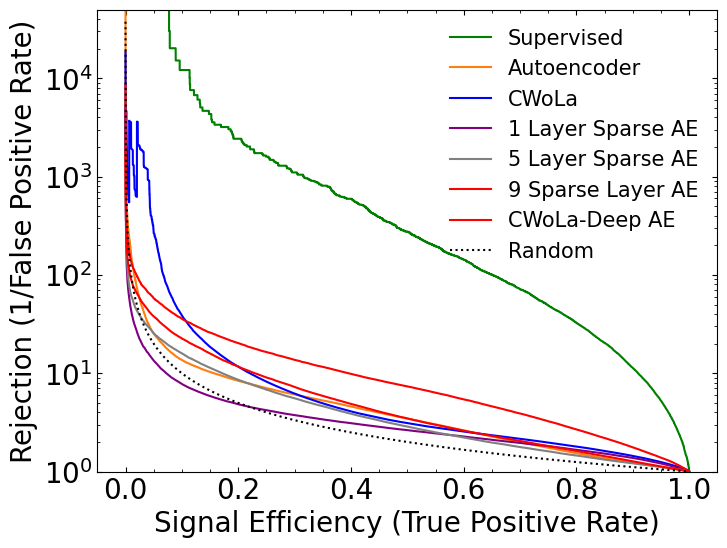

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for i, row in ae_rocs.iterrows():

    fpr, tpr = row

    if (i ==0):
        plt.plot(tpr,1./fpr,label="Autoencoder",color="tab:orange")

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")
plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

## Plot Many models

<ipython-input-45-b1f576a02472>:18: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')
<ipython-input-45-b1f576a02472>:25: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr,1./fpr,label="Autoencoders",color="tab:orange")
<ipython-input-45-b1f576a02472>:35: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")


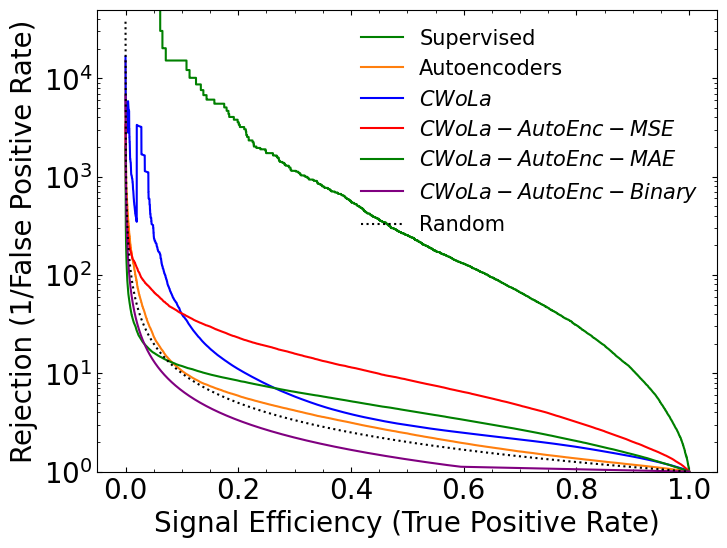

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for i, row in ae_rocs.iterrows():

    fpr, tpr = row

    if (i ==0):
        plt.plot(tpr,1./fpr,label="Autoencoder",color="tab:orange")

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")
plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

<ipython-input-97-8e0f4ae3a0af>:18: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')
<ipython-input-97-8e0f4ae3a0af>:25: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr,1./fpr,label="Autoencoder",color="tab:orange")
<ipython-input-97-8e0f4ae3a0af>:35: RuntimeWarning: divide by zero encountered in divide
  plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")


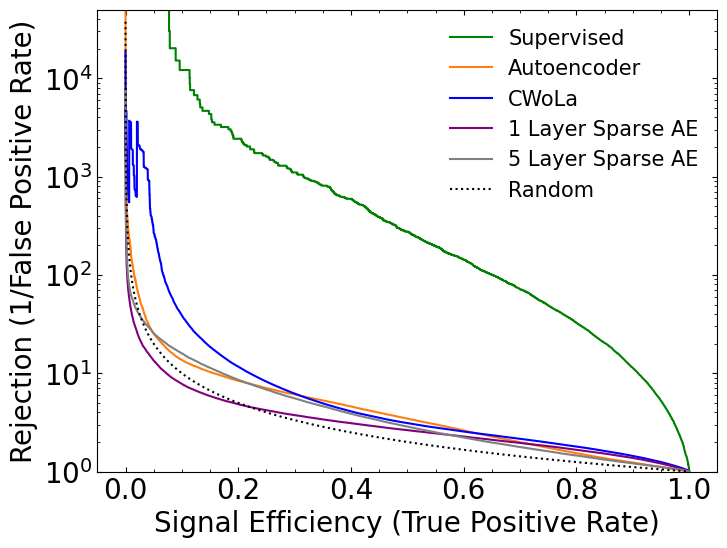

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for i, row in ae_rocs.iterrows():

    fpr, tpr = row

    if (i ==0):
        plt.plot(tpr,1./fpr,label="Autoencoder",color="tab:orange")

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")
plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

## Plotting with binary validation

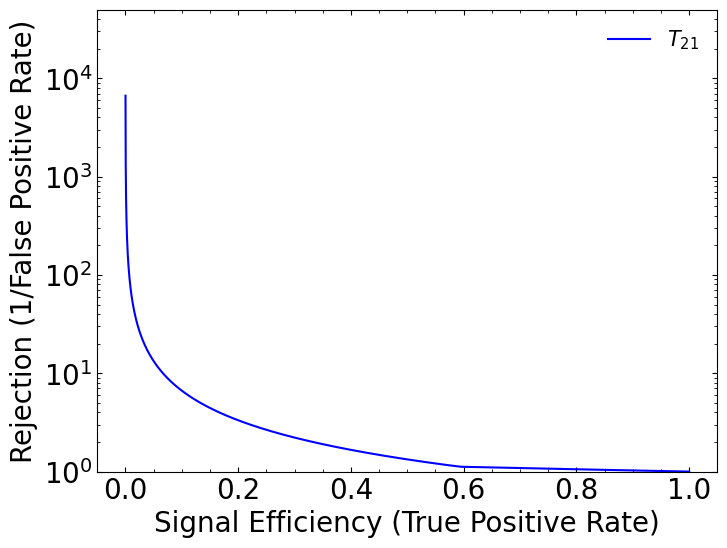

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
#plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
#plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")

plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

## Plotting Sparse Autoencoder

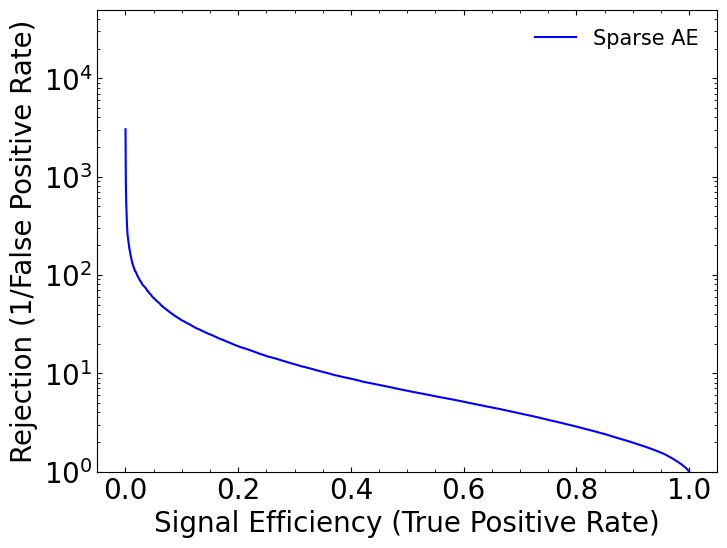

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
#plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
#plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")

plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

## CWoLa vs Autoencoder (using MSE for the roc curve)


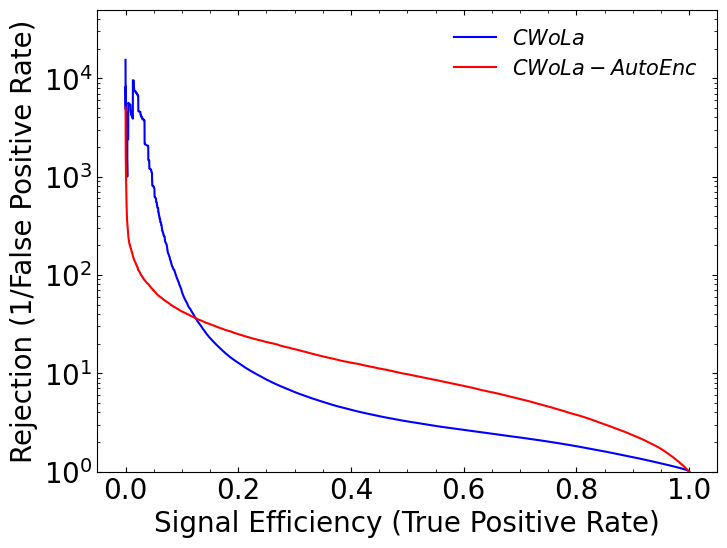

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
#plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
#plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")

plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

## CWoLa Autoencoder Binary ROC Curve with predefined threshold

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
# plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for i, row in ae_rocs.iterrows():

    fpr, tpr = row
    roc_auc = auc(fpr, tpr)
    if (i ==0):
        plt.plot(tpr,1./fpr,label=f"Autoencoder(AUC = {roc_auc:.2f})",color="tab:orange")

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]


    ploting_label = f"{bands[band][-1]['label']})"
    plt.plot(tpr_pts, mu, label = ploting_label, color = bands[band][-1]['color'])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")
plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

NameError: ignored

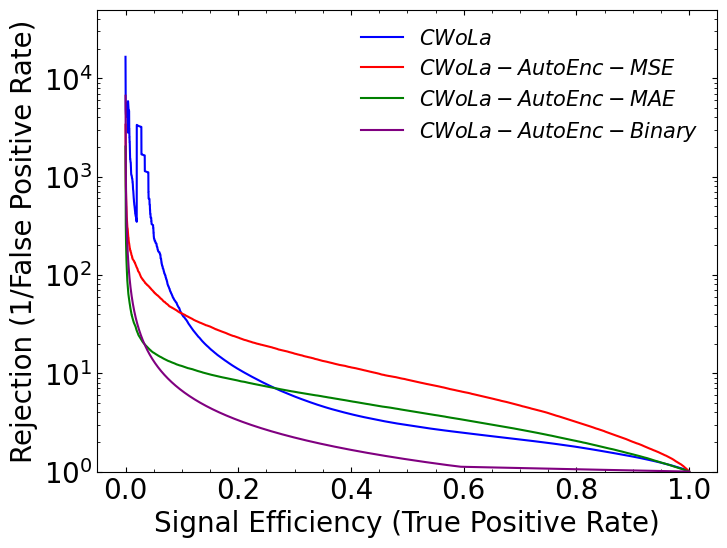

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
#plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
#plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")

plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

## Plotting with MAE with 10 epochs


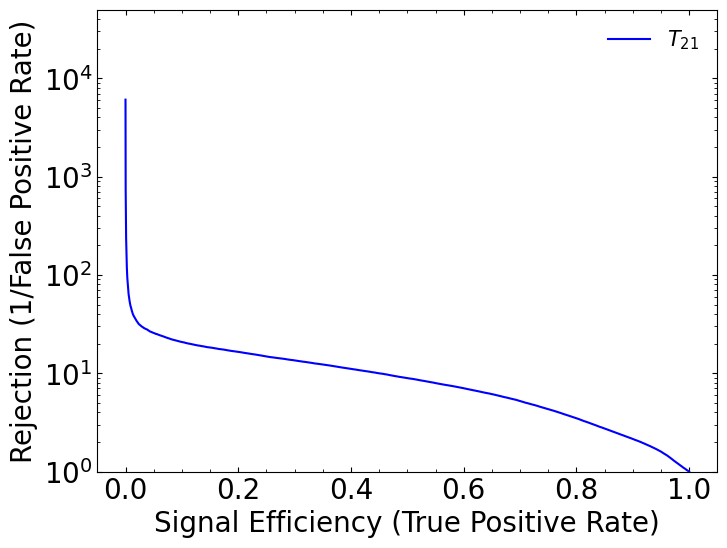

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
#plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for band in bands:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands[band][3:5]

    plt.plot(tpr_pts, mu, **bands[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
#plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")

plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

With T_21 is better

## selu activation

In [ ]:
#CWoLa with T21 and selu
cwola_rocsT21_selu = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21, )

    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    model_cwolaT21_selu = Sequential()
    model_cwolaT21_selu.add(Dense(64, input_dim=N_inputs, activation='selu'))
    model_cwolaT21_selu.add(Dense(64, activation='selu'))
    model_cwolaT21_selu.add(Dense(64, activation='selu'))
    model_cwolaT21_selu.add(Dense(1, activation='sigmoid'))
    model_cwolaT21_selu.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    hist_cwolaT21_selu = model_cwolaT21_selu.fit(X_cwola_trainT21[:,1:], Y_cwola_trainT21, epochs=EPOCHS,
                                 batch_size=batch_size, verbose=0, sample_weight=W_cwola_trainT21)

    scores_cwolaT21_selu = model_cwolaT21_selu.predict(X_cwola_valT21[:,1:],batch_size=batch_size)

    fpr_cwolaT21_selu, tpr_cwolaT21_selu, _ = roc_curve(Y_cwola_valT21, scores_cwolaT21_selu)
    cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)



  0%|          | 0/20 [00:00<?, ?it/s]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
  5%|▌         | 1/20 [01:03<20:14, 63.91s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 10%|█         | 2/20 [02:06<19:00, 63.36s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 15%|█▌        | 3/20 [03:10<17:55, 63.27s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 20%|██        | 4/20 [04:13<16:51, 63.22s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 25%|██▌       | 5/20 [05:16<15:46, 63.12s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 30%|███       | 6/20 [06:19<14:44, 63.14s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 35%|███▌      | 7/20 [07:22<13:42, 63.30s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 40%|████      | 8/20 [08:25<12:37, 63.13s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 45%|████▌     | 9/20 [09:28<11:33, 63.04s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 50%|█████     | 10/20 [10:31<10:31, 63.14s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 55%|█████▌    | 11/20 [11:36<09:31, 63.54s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 60%|██████    | 12/20 [12:40<08:29, 63.65s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 65%|██████▌   | 13/20 [13:44<07:27, 63.88s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 70%|███████   | 14/20 [14:49<06:24, 64.11s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 75%|███████▌  | 15/20 [15:55<05:24, 64.83s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 80%|████████  | 16/20 [17:01<04:20, 65.22s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 85%|████████▌ | 17/20 [18:07<03:16, 65.37s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 90%|█████████ | 18/20 [19:14<02:11, 65.77s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
 95%|█████████▌| 19/20 [20:21<01:06, 66.16s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-16-9f614a7fc484>:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_selu = cwola_rocsT21_selu.append({'fpr': fpr_cwolaT21_selu, 'tpr': tpr_cwolaT21_selu}, ignore_index=True)
100%|██████████| 20/20 [21:28<00:00, 64.40s/it]


## elu activation

In [ ]:
#CWoLa with T21 and elu

cwola_rocsT21_elu = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21, )

    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    model_cwolaT21_elu = Sequential()
    model_cwolaT21_elu.add(Dense(64, input_dim=N_inputs, activation='elu'))
    model_cwolaT21_elu.add(Dense(64, activation='elu'))
    model_cwolaT21_elu.add(Dense(64, activation='elu'))
    model_cwolaT21_elu.add(Dense(1, activation='sigmoid'))
    model_cwolaT21_elu.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    hist_cwolaT21_elu = model_cwolaT21_elu.fit(X_cwola_trainT21[:,1:], Y_cwola_trainT21, epochs=EPOCHS,
                                 batch_size=batch_size, verbose=0, sample_weight=W_cwola_trainT21)

    scores_cwolaT21_elu = model_cwolaT21_elu.predict(X_cwola_valT21[:,1:],batch_size=batch_size)

    fpr_cwolaT21_elu, tpr_cwolaT21_elu, _ = roc_curve(Y_cwola_valT21, scores_cwolaT21_elu)
    cwola_rocsT21_elu = cwola_rocsT21_elu.append({'fpr': fpr_cwolaT21_elu, 'tpr': tpr_cwolaT21_elu}, ignore_index=True)



## leaky relu

In [ ]:
#CWoLa with T21 and leaky relu

cwola_rocsT21_lrelu = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21, )

    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    model_cwolaT21_lrelu = Sequential()
    model_cwolaT21_lrelu.add(Dense(64, input_dim=N_inputs, activation='leaky_relu'))
    model_cwolaT21_lrelu.add(Dense(64, activation='leaky_relu'))
    model_cwolaT21_lrelu.add(Dense(64, activation='leaky_relu'))
    model_cwolaT21_lrelu.add(Dense(1, activation='sigmoid'))
    model_cwolaT21_lrelu.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    hist_cwolaT21_lrelu = model_cwolaT21_lrelu.fit(X_cwola_trainT21[:,1:], Y_cwola_trainT21, epochs=EPOCHS,
                                 batch_size=batch_size, verbose=0, sample_weight=W_cwola_trainT21)

    scores_cwolaT21_lrelu = model_cwolaT21_lrelu.predict(X_cwola_valT21[:,1:],batch_size=batch_size)

    fpr_cwolaT21_lrelu, tpr_cwolaT21_lrelu, _ = roc_curve(Y_cwola_valT21, scores_cwolaT21_lrelu)
    cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)

  0%|          | 0/20 [00:00<?, ?it/s]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
  5%|▌         | 1/20 [01:03<20:09, 63.64s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 10%|█         | 2/20 [02:09<19:27, 64.87s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 15%|█▌        | 3/20 [03:15<18:32, 65.46s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 20%|██        | 4/20 [04:19<17:20, 65.05s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 25%|██▌       | 5/20 [05:25<16:18, 65.21s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 30%|███       | 6/20 [06:30<15:13, 65.25s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 35%|███▌      | 7/20 [07:35<14:05, 65.06s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 40%|████      | 8/20 [08:40<13:01, 65.11s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 45%|████▌     | 9/20 [09:45<11:54, 64.92s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 50%|█████     | 10/20 [10:48<10:45, 64.54s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 55%|█████▌    | 11/20 [11:54<09:42, 64.75s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 60%|██████    | 12/20 [12:58<08:37, 64.70s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 65%|██████▌   | 13/20 [14:02<07:31, 64.49s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 70%|███████   | 14/20 [15:09<06:31, 65.22s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 75%|███████▌  | 15/20 [16:15<05:27, 65.57s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 80%|████████  | 16/20 [17:21<04:22, 65.71s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 85%|████████▌ | 17/20 [18:27<03:16, 65.50s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 90%|█████████ | 18/20 [19:32<02:11, 65.52s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
 95%|█████████▌| 19/20 [20:37<01:05, 65.25s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-18-bc1f22d654c8>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21_lrelu = cwola_rocsT21_lrelu.append({'fpr': fpr_cwolaT21_lrelu, 'tpr': tpr_cwolaT21_lrelu}, ignore_index=True)
100%|██████████| 20/20 [21:41<00:00, 65.07s/it]


In [ ]:
with np.errstate(divide='ignore'):
    tpr_pts = np.linspace(0, 1, 10000)

    # CWoLa T21 selu
    fpr_interp = [None] * len(cwola_rocsT21_selu)

    for i, row in cwola_rocsT21_selu.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21_selu = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21_selu = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21_selu = np.median(fpr_interp, axis=0).data
    cwola_meanT21_selu = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21_selu = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21_selu = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21_selu = np.nanstd(sig_interp, axis=0).data


    # CWoLa T21 elu
    fpr_interp = [None] * len(cwola_rocsT21_elu)

    for i, row in cwola_rocsT21_elu.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21_elu = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21_elu = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21_elu = np.median(fpr_interp, axis=0).data
    cwola_meanT21_elu = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21_elu = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21_elu = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21_elu = np.nanstd(sig_interp, axis=0).data


    # CWoLa T21 leaky relu
    fpr_interp = [None] * len(cwola_rocsT21_lrelu)

    for i, row in cwola_rocsT21_lrelu.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21_lrelu = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21_lrelu = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21_lrelu = np.median(fpr_interp, axis=0).data
    cwola_meanT21_lrelu = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21_lrelu = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21_lrelu = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21_lrelu = np.nanstd(sig_interp, axis=0).data

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


In [ ]:
bands2 = {'cwola_T21relu': (cwola_maxT21, cwola_medT21, cwola_minT21, cwola_meanT21, cwola_stdT21, cwola_smeanT21, cwola_sstdT21, {'label':'ReLU', 'color':'blue'}),
          'cwola_T21selu': (cwola_maxT21_selu, cwola_medT21_selu, cwola_minT21_selu, cwola_meanT21_selu, cwola_stdT21_selu, cwola_smeanT21_selu, cwola_sstdT21_selu, {'label':'SELU', 'color':'red'}),
          'cwola_T21elu': (cwola_maxT21_elu, cwola_medT21_elu, cwola_minT21_elu, cwola_meanT21_elu, cwola_stdT21_elu, cwola_smeanT21_elu, cwola_sstdT21_elu, {'label':'ELU', 'color':'orange'}),
          'cwola_T21lrelu': (cwola_maxT21_lrelu, cwola_medT21_lrelu, cwola_minT21_lrelu, cwola_meanT21_lrelu, cwola_stdT21_lrelu, cwola_smeanT21_lrelu, cwola_sstdT21_lrelu, {'label':'Leaky ReLU', 'color':'green'}),
         }

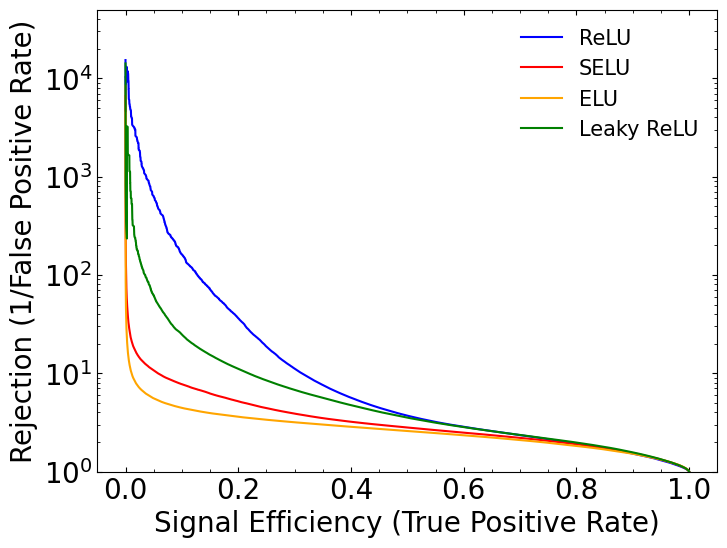

In [ ]:
# Plot without banding
mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.yscale("log")
plt.ylim([1,5*1e4])
ERR=False
#plt.plot(tpr_sup,1./fpr_sup,label="Supervised",color='green')

for band in bands2:
    if band in ['old-sacwola', 'hl-sacwola']:
        continue
    mu,std = bands2[band][3:5]

    plt.plot(tpr_pts, mu, **bands2[band][-1])
    if ERR:
        plt.fill_between(tpr_pts, mu - std, mu + std, alpha=.2, color=bands[band][-1]['color'])
#plt.plot(tpr_sup,1./tpr_sup,color="black",ls=":",label="Random")

plt.xlabel(r'Signal Efficiency (True Positive Rate)',fontsize=20)
plt.ylabel(r"Rejection (1/False Positive Rate)",fontsize=20)
plt.legend(frameon=False,fontsize=15,loc="upper right")

Relu an dLeaky ReLU seem to have the best performances

## Models for AUC

In [ ]:
#initial data

SR_low = 3.3
SR_high = 3.7
SB_low = 3.1
SB_high = 3.9
SB_width = 0.3
test_size = 0.5
EPOCHS=20
batch_size = 200

#mylambda=.5
myklambda = 1 #np.round(len(SR_background_data)/len(SR_background_sim), 3)

## 2 layers

In [ ]:
from tensorflow.keras.callbacks import Callback

class AUCRecordsL2(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_2lay, aucsSB_foravg_2lay, aucs_foravg_2lay, aucsSB_foravg_2lay, aucs_2lay, aucs_std_2lay, aucsSB_2lay, aucsSB_std_2lay, num_epochs
        preds_hold_2lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_2lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_2lay = roc_auc_score(Y_test, preds_hold_2lay)
        print(myauc_scan_2lay)
        myaucSB_scan_2lay = roc_auc_score(Y_testSB, preds_holdSB_2lay)
        print(myaucSB_scan_2lay)

        aucs_foravg_2lay += [myauc_scan_2lay]
        print(aucs_foravg_2lay)
        aucsSB_foravg_2lay += [myaucSB_scan_2lay]
        print(aucsSB_foravg_2lay)

        aucs_2lay+=[np.mean(aucs_foravg_2lay)]
        print(aucs_2lay)
        aucs_std_2lay += [np.std(aucs_foravg_2lay)]
        print(aucs_std_2lay)
        aucsSB_2lay+=[np.mean(aucsSB_foravg_2lay)]
        print(aucsSB_2lay)
        aucsSB_std_2lay += [np.std(aucsSB_foravg_2lay)]
        print(aucsSB_std_2lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_2lay = []
    num_epochs = []
    aucs_2lay = []
    aucs_std_2lay = []
    aucsSB_2lay = []
    aucsSB_std_2lay = []
    aucs_foravg_2lay =[]
    aucsSB_foravg_2lay = []

    for k in range(1):
        model_cwola_scan_2lay = Sequential()
        model_cwola_scan_2lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_2lay.add(Dense(100, activation='relu'))
        model_cwola_scan_2lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_2lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_2lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_2lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_2lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_2lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_2lay = X_kcwola_train_2lay[sb_crit]
        Y_kcwola_train_2lay = Y_kcwola_train_2lay[sb_crit]
        W_kcwola_train_2lay = W_kcwola_train_2lay[sb_crit]


        X_kcwola_train_2lay, Y_kcwola_train_2lay, W_kcwola_train_2lay = shuffle(X_kcwola_train_2lay, Y_kcwola_train_2lay,
                                                                       W_kcwola_train_2lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_2lay.fit(norm_func(X_kcwola_train_2lay)[:,1:],Y_kcwola_train_2lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_2lay, verbose=2, callbacks=[AUCRecordsL2()])

        pass





epoch 0
Epoch 1/20
50/50 [==============================] - 0s 2ms/step
0.9050178262685512
0.44711730498383767
[0.9050178262685512]
[0.44711730498383767]
[0.9050178262685512]
[0.0]
[0.44711730498383767]
[0.0]
epoch 0
1627/1627 - 5s - loss: 0.6542 - accuracy: 0.5098 - auc: 0.5135 - val_loss: 0.6695 - val_accuracy: 0.7878 - val_auc: 0.9021 - 5s/epoch - 3ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 2ms/step
0.9030664341152839
0.3870552788425767
[0.9050178262685512, 0.9030664341152839]
[0.44711730498383767, 0.3870552788425767]
[0.9050178262685512, 0.9040421301919175]
[0.0, 0.0009756960766336698]
[0.44711730498383767, 0.4170862919132072]
[0.0, 0.030031013070630497]
epoch 1
1627/1627 - 4s - loss: 0.6540 - accuracy: 0.5128 - auc: 0.5166 - val_loss: 0.6596 - val_accuracy: 0.7714 - val_auc: 0.9015 - 4s/epoch - 2ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 2ms/step
0.8912158586194993
0.3306109686609241
[0.9050178262685512, 0.9030664341152839, 0

In [ ]:
aucs_2lay = np.asarray(aucs_2lay)
aucs_std_2lay = np.asarray(aucs_std_2lay)

aucsSB_2lay = np.asarray(aucsSB_2lay)
aucsSB_std_2lay = np.asarray(aucsSB_std_2lay)

print(aucs_2lay)
print(aucsSB_2lay)

[0.90501783 0.90404213 0.89976671 0.90074674 0.90320801 0.9041169
 0.90497465 0.90605177 0.90777078 0.90969565 0.91073964 0.91247797
 0.91382157 0.91464347 0.91478242 0.91500345 0.91552245 0.91598304
 0.91697494 0.91716704]
[0.4471173  0.41708629 0.38826118 0.3829152  0.38052323 0.37413392
 0.37151721 0.36902272 0.36549254 0.37009012 0.36496916 0.36496456
 0.36484261 0.36517753 0.36286965 0.36032787 0.35763827 0.35899081
 0.35888484 0.36079395]


(0.0, 1.0)

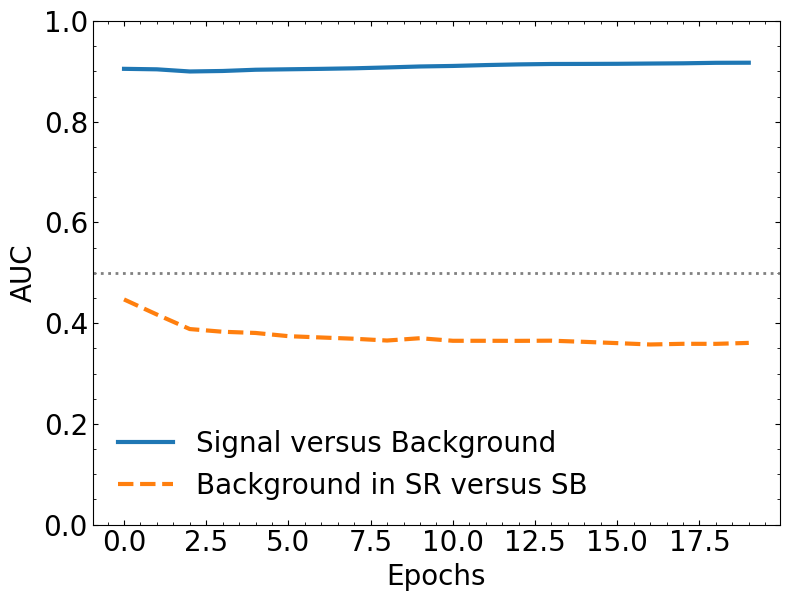

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_2lay,label="Signal versus Background",linewidth=3)
#plt.fill_between(epochs,aucs+aucs_std, aucs-aucs_std, alpha=0.2)
plt.plot(num_epochs, aucsSB_2lay,label="Background in SR versus SB",ls="--",linewidth=3)
#plt.fill_between(epochs,aucsSB+aucsSB_std, aucsSB-aucsSB_std,alpha=0.2)
plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20)
plt.tight_layout()
plt.ylim([0,1])

## 3 layers

In [ ]:
class AUCRecordsL3(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_3lay, aucsSB_foravg_3lay, aucs_foravg_3lay, aucsSB_foravg_3lay, aucs_3lay, aucs_std_3lay, aucsSB_3lay, aucsSB_std_3lay, num_epochs
        preds_hold_3lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_3lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_3lay = roc_auc_score(Y_test, preds_hold_3lay)
        print(myauc_scan_3lay)
        myaucSB_scan_3lay = roc_auc_score(Y_testSB, preds_holdSB_3lay)
        print(myaucSB_scan_3lay)

        aucs_foravg_3lay += [myauc_scan_3lay]
        print(aucs_foravg_3lay)
        aucsSB_foravg_3lay += [myaucSB_scan_3lay]
        print(aucsSB_foravg_3lay)

        aucs_3lay+=[np.mean(aucs_foravg_3lay)]
        print(aucs_3lay)
        aucs_std_3lay += [np.std(aucs_foravg_3lay)]
        print(aucs_std_3lay)
        aucsSB_3lay+=[np.mean(aucsSB_foravg_3lay)]
        print(aucsSB_3lay)
        aucsSB_std_3lay += [np.std(aucsSB_foravg_3lay)]
        print(aucsSB_std_3lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_3lay = []
    num_epochs = []
    aucs_3lay = []
    aucs_std_3lay = []
    aucsSB_3lay = []
    aucsSB_std_3lay = []
    aucs_foravg_3lay =[]
    aucsSB_foravg_3lay = []

    for k in range(1):
        model_cwola_scan_3lay = Sequential()
        model_cwola_scan_3lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_3lay.add(Dense(100, activation='relu'))
        model_cwola_scan_3lay.add(Dense(64, activation='relu'))
        model_cwola_scan_3lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_3lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_3lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_3lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_3lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_3lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_3lay = X_kcwola_train_3lay[sb_crit]
        Y_kcwola_train_3lay = Y_kcwola_train_3lay[sb_crit]
        W_kcwola_train_3lay = W_kcwola_train_3lay[sb_crit]


        X_kcwola_train_3lay, Y_kcwola_train_3lay, W_kcwola_train_3lay = shuffle(X_kcwola_train_3lay, Y_kcwola_train_3lay,
                                                                       W_kcwola_train_3lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_3lay.fit(norm_func(X_kcwola_train_3lay)[:,1:],Y_kcwola_train_3lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_3lay, verbose=2, callbacks=[AUCRecordsL3()])

        pass


epoch 0
Epoch 1/20
50/50 [==============================] - 0s 3ms/step
0.8938150054072853
0.4806772645738607
[0.8938150054072853]
[0.4806772645738607]
[0.8938150054072853]
[0.0]
[0.4806772645738607]
[0.0]
epoch 0
1627/1627 - 6s - loss: 0.6542 - accuracy: 0.5092 - auc: 0.5134 - val_loss: 0.6630 - val_accuracy: 0.8110 - val_auc: 0.8919 - 6s/epoch - 3ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 3ms/step
0.9058390271511654
0.4327028468754091
[0.8938150054072853, 0.9058390271511654]
[0.4806772645738607, 0.4327028468754091]
[0.8938150054072853, 0.8998270162792253]
[0.0, 0.006012010871940032]
[0.4806772645738607, 0.4566900557246349]
[0.0, 0.023987208849225783]
epoch 1
1627/1627 - 4s - loss: 0.6540 - accuracy: 0.5124 - auc: 0.5164 - val_loss: 0.6702 - val_accuracy: 0.8269 - val_auc: 0.9005 - 4s/epoch - 3ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 3ms/step
0.8949147383948532
0.35916534736787575
[0.8938150054072853, 0.9058390271511654, 0.8949

In [ ]:
aucs_3lay = np.asarray(aucs_3lay)
aucs_std_3lay = np.asarray(aucs_std_3lay)

aucsSB_3lay = np.asarray(aucsSB_3lay)
aucsSB_std_3lay = np.asarray(aucsSB_std_3lay)

print(aucs_3lay)
print(aucsSB_3lay)

[0.89381501 0.89982702 0.89818959 0.90086956 0.90244568 0.89881508
 0.90015167 0.90306531 0.90504849 0.90742561 0.9091085  0.91126488
 0.91177833 0.91313118 0.91373739 0.91340664 0.91356954 0.91445619
 0.91295741 0.91228754]
[0.48067726 0.45669006 0.42418182 0.40415251 0.3864394  0.37007135
 0.3657384  0.36810916 0.3668773  0.36751916 0.36485456 0.36557394
 0.3662834  0.36661893 0.36442232 0.36588973 0.36750349 0.36755874
 0.36721078 0.36606197]


(0.0, 1.0)

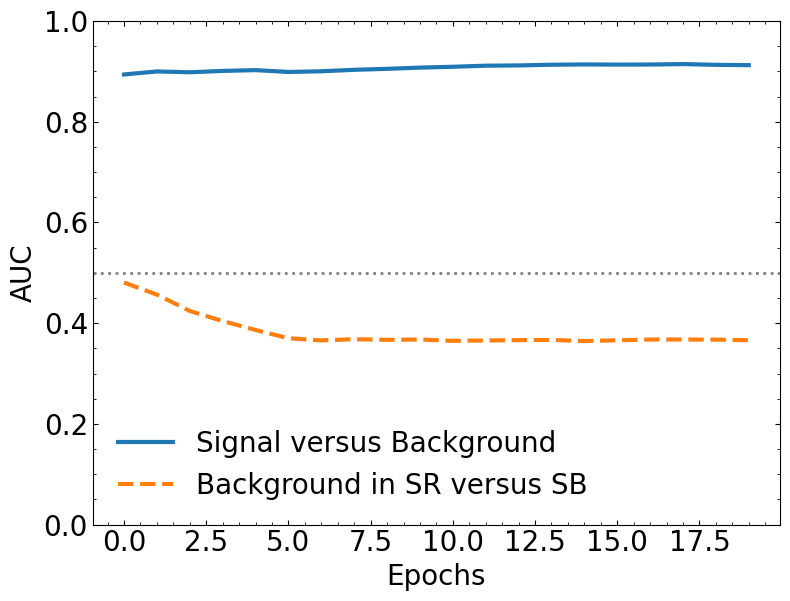

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_3lay,label="Signal versus Background",linewidth=3)
#plt.fill_between(epochs,aucs+aucs_std, aucs-aucs_std, alpha=0.2)
plt.plot(num_epochs, aucsSB_3lay,label="Background in SR versus SB",ls="--",linewidth=3)
#plt.fill_between(epochs,aucsSB+aucsSB_std, aucsSB-aucsSB_std,alpha=0.2)
plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20)
plt.tight_layout()
plt.ylim([0,1])

## 4 layers

In [ ]:
class AUCRecordsL4(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_4lay, aucsSB_foravg_4lay, aucs_foravg_4lay, aucsSB_foravg_4lay, aucs_4lay, aucs_std_4lay, aucsSB_4lay, aucsSB_std_4lay, num_epochs
        preds_hold_4lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_4lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_4lay = roc_auc_score(Y_test, preds_hold_4lay)
        print(myauc_scan_4lay)
        myaucSB_scan_4lay = roc_auc_score(Y_testSB, preds_holdSB_4lay)
        print(myaucSB_scan_4lay)

        aucs_foravg_4lay += [myauc_scan_4lay]
        print(aucs_foravg_4lay)
        aucsSB_foravg_4lay += [myaucSB_scan_4lay]
        print(aucsSB_foravg_4lay)

        aucs_4lay+=[np.mean(aucs_foravg_4lay)]
        print(aucs_4lay)
        aucs_std_4lay += [np.std(aucs_foravg_4lay)]
        print(aucs_std_4lay)
        aucsSB_4lay+=[np.mean(aucsSB_foravg_4lay)]
        print(aucsSB_4lay)
        aucsSB_std_4lay += [np.std(aucsSB_foravg_4lay)]
        print(aucsSB_std_4lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_4lay = []
    num_epochs = []
    aucs_4lay = []
    aucs_std_4lay = []
    aucsSB_4lay = []
    aucsSB_std_4lay = []
    aucs_foravg_4lay =[]
    aucsSB_foravg_4lay = []

    for k in range(1):
        model_cwola_scan_4lay = Sequential()
        model_cwola_scan_4lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_4lay.add(Dense(100, activation='relu'))
        model_cwola_scan_4lay.add(Dense(64, activation='relu'))
        model_cwola_scan_4lay.add(Dense(100, activation='relu'))
        model_cwola_scan_4lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_4lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_4lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_4lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_4lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_4lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_4lay = X_kcwola_train_4lay[sb_crit]
        Y_kcwola_train_4lay = Y_kcwola_train_4lay[sb_crit]
        W_kcwola_train_4lay = W_kcwola_train_4lay[sb_crit]


        X_kcwola_train_4lay, Y_kcwola_train_4lay, W_kcwola_train_4lay = shuffle(X_kcwola_train_4lay, Y_kcwola_train_4lay,
                                                                       W_kcwola_train_4lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_4lay.fit(norm_func(X_kcwola_train_4lay)[:,1:],Y_kcwola_train_4lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_4lay, verbose=2, callbacks=[AUCRecordsL4()])

        pass


epoch 0
Epoch 1/20
50/50 [==============================] - 0s 3ms/step
0.9115666045717352
0.47558544177461276
[0.9115666045717352]
[0.47558544177461276]
[0.9115666045717352]
[0.0]
[0.47558544177461276]
[0.0]
epoch 0
1627/1627 - 6s - loss: 0.6542 - accuracy: 0.5088 - auc: 0.5116 - val_loss: 0.6735 - val_accuracy: 0.7375 - val_auc: 0.9061 - 6s/epoch - 4ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 3ms/step
0.9077854465506826
0.4632846032410714
[0.9115666045717352, 0.9077854465506826]
[0.47558544177461276, 0.4632846032410714]
[0.9115666045717352, 0.9096760255612089]
[0.0, 0.0018905790105263054]
[0.47558544177461276, 0.4694350225078421]
[0.0, 0.006150419266770679]
epoch 1
1627/1627 - 5s - loss: 0.6541 - accuracy: 0.5111 - auc: 0.5154 - val_loss: 0.6799 - val_accuracy: 0.7580 - val_auc: 0.8942 - 5s/epoch - 3ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 3ms/step
0.8994018139469964
0.42868538735341766
[0.9115666045717352, 0.9077854465506826, 

In [ ]:
aucs_4lay = np.asarray(aucs_4lay)
aucs_std_4lay = np.asarray(aucs_std_4lay)

aucsSB_4lay = np.asarray(aucsSB_4lay)
aucsSB_std_4lay = np.asarray(aucsSB_std_4lay)

print(aucs_4lay)
print(aucsSB_4lay)

[0.9115666  0.90967603 0.90625129 0.90582389 0.90662177 0.90708201
 0.90766201 0.90722894 0.90868495 0.90920341 0.90937188 0.90968242
 0.90904208 0.90953228 0.91016552 0.91146856 0.91024679 0.90888469
 0.90827904 0.90672632]
[0.47558544 0.46943502 0.45585181 0.42195067 0.40798408 0.39957399
 0.38934195 0.38632447 0.38188507 0.37612431 0.37328459 0.37467361
 0.37596495 0.37611124 0.37309186 0.37081618 0.37153351 0.37276345
 0.37320783 0.37263941]


(0.0, 1.0)

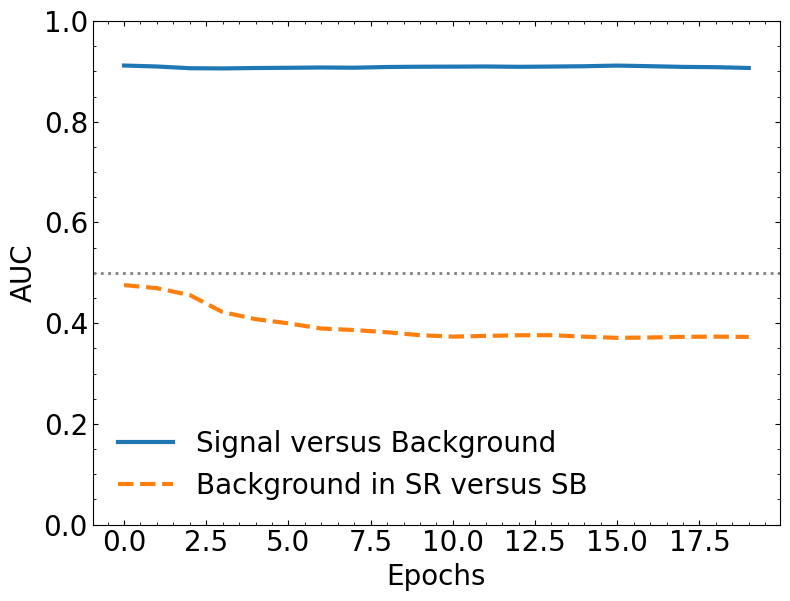

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_4lay,label="Signal versus Background",linewidth=3)
#plt.fill_between(epochs,aucs+aucs_std, aucs-aucs_std, alpha=0.2)
plt.plot(num_epochs, aucsSB_4lay,label="Background in SR versus SB",ls="--",linewidth=3)
#plt.fill_between(epochs,aucsSB+aucsSB_std, aucsSB-aucsSB_std,alpha=0.2)
plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20)
plt.tight_layout()
plt.ylim([0,1])

## 5 layers

In [ ]:
class AUCRecordsL5(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_5lay, aucsSB_foravg_5lay, aucs_foravg_5lay, aucsSB_foravg_5lay, aucs_5lay, aucs_std_5lay, aucsSB_5lay, aucsSB_std_5lay, num_epochs
        preds_hold_5lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_5lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_5lay = roc_auc_score(Y_test, preds_hold_5lay)
        print(myauc_scan_5lay)
        myaucSB_scan_5lay = roc_auc_score(Y_testSB, preds_holdSB_5lay)
        print(myaucSB_scan_5lay)

        aucs_foravg_5lay += [myauc_scan_5lay]
        print(aucs_foravg_5lay)
        aucsSB_foravg_5lay += [myaucSB_scan_5lay]
        print(aucsSB_foravg_5lay)

        aucs_5lay+=[np.mean(aucs_foravg_5lay)]
        print(aucs_5lay)
        aucs_std_5lay += [np.std(aucs_foravg_5lay)]
        print(aucs_std_5lay)
        aucsSB_5lay+=[np.mean(aucsSB_foravg_5lay)]
        print(aucsSB_5lay)
        aucsSB_std_5lay += [np.std(aucsSB_foravg_5lay)]
        print(aucsSB_std_5lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_5lay = []
    num_epochs = []
    aucs_5lay = []
    aucs_std_5lay = []
    aucsSB_5lay = []
    aucsSB_std_5lay = []
    aucs_foravg_5lay =[]
    aucsSB_foravg_5lay = []

    for k in range(1):
        model_cwola_scan_5lay = Sequential()
        model_cwola_scan_5lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_5lay.add(Dense(100, activation='relu'))
        model_cwola_scan_5lay.add(Dense(64, activation='relu'))
        model_cwola_scan_5lay.add(Dense(100, activation='relu'))
        model_cwola_scan_5lay.add(Dense(64, activation='relu'))
        model_cwola_scan_5lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_5lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_5lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_5lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_5lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_5lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_5lay = X_kcwola_train_5lay[sb_crit]
        Y_kcwola_train_5lay = Y_kcwola_train_5lay[sb_crit]
        W_kcwola_train_5lay = W_kcwola_train_5lay[sb_crit]


        X_kcwola_train_5lay, Y_kcwola_train_5lay, W_kcwola_train_5lay = shuffle(X_kcwola_train_5lay, Y_kcwola_train_5lay,
                                                                       W_kcwola_train_5lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_5lay.fit(norm_func(X_kcwola_train_5lay)[:,1:],Y_kcwola_train_5lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_5lay, verbose=2, callbacks=[AUCRecordsL5()])

        pass


epoch 0
Epoch 1/20
50/50 [==============================] - 0s 4ms/step
0.8871668801661932
0.429226906483235
[0.8871668801661932]
[0.429226906483235]
[0.8871668801661932]
[0.0]
[0.429226906483235]
[0.0]
epoch 0
1627/1627 - 7s - loss: 0.6542 - accuracy: 0.5094 - auc: 0.5132 - val_loss: 0.6834 - val_accuracy: 0.8234 - val_auc: 0.8812 - 7s/epoch - 5ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 4ms/step
0.9035439440252535
0.41425351589963566
[0.8871668801661932, 0.9035439440252535]
[0.429226906483235, 0.41425351589963566]
[0.8871668801661932, 0.8953554120957233]
[0.0, 0.008188531929530174]
[0.429226906483235, 0.42174021119143534]
[0.0, 0.007486695291799683]
epoch 1
1627/1627 - 5s - loss: 0.6541 - accuracy: 0.5122 - auc: 0.5163 - val_loss: 0.6702 - val_accuracy: 0.8310 - val_auc: 0.9010 - 5s/epoch - 3ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 4ms/step
0.8874980404337912
0.4038312488253976
[0.8871668801661932, 0.9035439440252535, 0.8874980

In [ ]:
aucs_5lay = np.asarray(aucs_5lay)
aucs_std_5lay = np.asarray(aucs_std_5lay)

aucsSB_5lay = np.asarray(aucsSB_5lay)
aucsSB_std_5lay = np.asarray(aucsSB_std_5lay)

print(aucs_5lay)
print(aucsSB_5lay)

[0.88716688 0.89535541 0.89273629 0.89207156 0.89054786 0.89122406
 0.89416146 0.89784644 0.8994121  0.90228007 0.90479764 0.90682292
 0.90711064 0.9085613  0.90993783 0.91056333 0.91107665 0.91204645
 0.91230791 0.91262698]
[0.42922691 0.42174021 0.41577056 0.39869343 0.37839435 0.36689855
 0.36233006 0.36252712 0.3565067  0.3552757  0.3533644  0.35339658
 0.35532587 0.35652177 0.357701   0.35920718 0.359564   0.3595298
 0.36054976 0.35982708]


(0.0, 1.0)

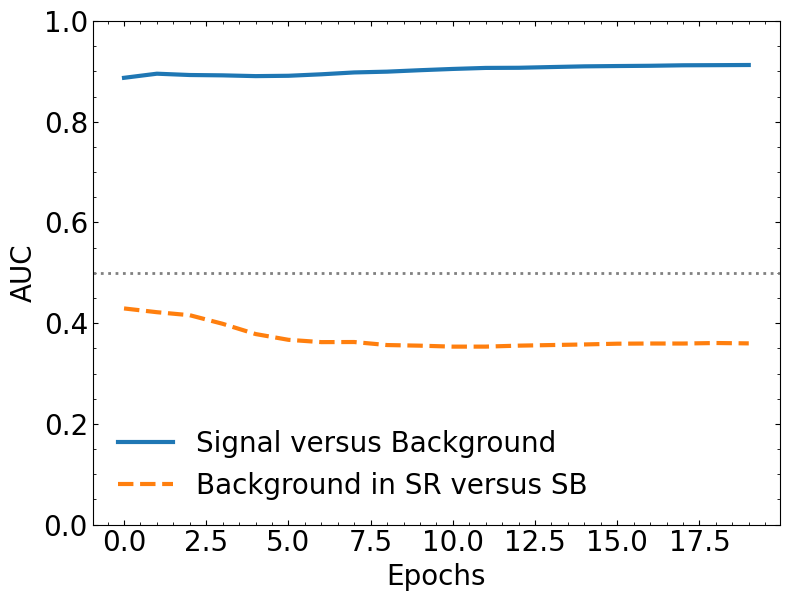

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_5lay,label="Signal versus Background",linewidth=3)
#plt.fill_between(epochs,aucs+aucs_std, aucs-aucs_std, alpha=0.2)
plt.plot(num_epochs, aucsSB_5lay,label="Background in SR versus SB",ls="--",linewidth=3)
#plt.fill_between(epochs,aucsSB+aucsSB_std, aucsSB-aucsSB_std,alpha=0.2)
plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20)
plt.tight_layout()
plt.ylim([0,1])

# AUC all architectures

<ipython-input-39-76e468b365cb>:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


(0.0, 1.0)

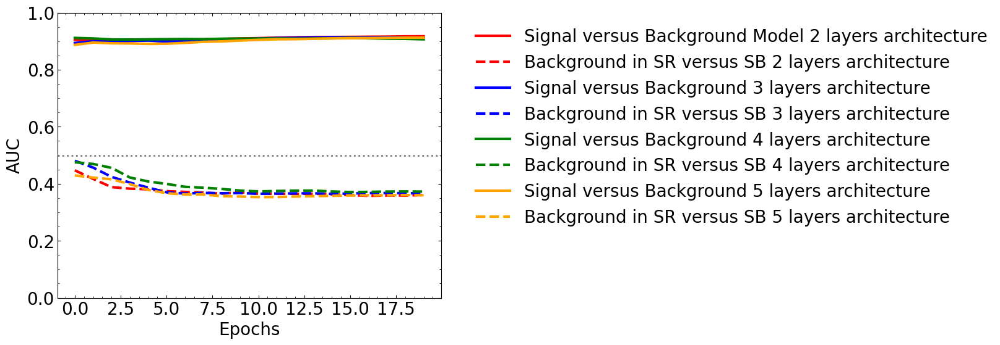

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_2lay,label="Signal versus Background Model 2 layers architecture",linewidth=3,color='red')
plt.plot(num_epochs, aucsSB_2lay,label="Background in SR versus SB 2 layers architecture",ls="--",linewidth=3,color='red')

plt.plot(num_epochs, aucs_3lay,label="Signal versus Background 3 layers architecture",linewidth=3,color='blue')
plt.plot(num_epochs, aucsSB_3lay,label="Background in SR versus SB 3 layers architecture",ls="--",linewidth=3,color='blue')

plt.plot(num_epochs, aucs_4lay,label="Signal versus Background 4 layers architecture",linewidth=3,color='green')
plt.plot(num_epochs, aucsSB_4lay,label="Background in SR versus SB 4 layers architecture",ls="--",linewidth=3,color='green')

plt.plot(num_epochs, aucs_5lay,label="Signal versus Background 5 layers architecture",linewidth=3,color='orange')
plt.plot(num_epochs, aucsSB_5lay,label="Background in SR versus SB 5 layers architecture",ls="--",linewidth=3,color='orange')

plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20, bbox_to_anchor=(1.05, 1.0))
plt.tight_layout()
plt.ylim([0,1])

In [ ]:
class AUCRecordsL15(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_15lay, aucsSB_foravg_15lay, aucs_foravg_15lay, aucsSB_foravg_15lay, aucs_15lay, aucs_std_15lay, aucsSB_15lay, aucsSB_std_15lay, num_epochs
        preds_hold_15lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_15lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_15lay = roc_auc_score(Y_test, preds_hold_15lay)
        print(myauc_scan_15lay)
        myaucSB_scan_15lay = roc_auc_score(Y_testSB, preds_holdSB_15lay)
        print(myaucSB_scan_15lay)

        aucs_foravg_15lay += [myauc_scan_15lay]
        print(aucs_foravg_15lay)
        aucsSB_foravg_15lay += [myaucSB_scan_15lay]
        print(aucsSB_foravg_15lay)

        aucs_15lay+=[np.mean(aucs_foravg_15lay)]
        print(aucs_15lay)
        aucs_std_15lay += [np.std(aucs_foravg_15lay)]
        print(aucs_std_15lay)
        aucsSB_15lay+=[np.mean(aucsSB_foravg_15lay)]
        print(aucsSB_15lay)
        aucsSB_std_15lay += [np.std(aucsSB_foravg_15lay)]
        print(aucsSB_std_15lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_15lay = []
    num_epochs = []
    aucs_15lay = []
    aucs_std_15lay = []
    aucsSB_15lay = []
    aucsSB_std_15lay = []
    aucs_foravg_15lay =[]
    aucsSB_foravg_15lay = []

    for k in range(1):
        model_cwola_scan_15lay = Sequential()
        model_cwola_scan_15lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(100, activation='relu'))
        model_cwola_scan_15lay.add(Dense(64, activation='relu'))
        model_cwola_scan_15lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_15lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_15lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_15lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_15lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_15lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_15lay = X_kcwola_train_15lay[sb_crit]
        Y_kcwola_train_15lay = Y_kcwola_train_15lay[sb_crit]
        W_kcwola_train_15lay = W_kcwola_train_15lay[sb_crit]


        X_kcwola_train_15lay, Y_kcwola_train_15lay, W_kcwola_train_15lay = shuffle(X_kcwola_train_15lay, Y_kcwola_train_15lay,
                                                                       W_kcwola_train_15lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_15lay.fit(norm_func(X_kcwola_train_15lay)[:,1:],Y_kcwola_train_15lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_15lay, verbose=2, callbacks=[AUCRecordsL15()])

        pass


epoch 0
Epoch 1/20
50/50 [==============================] - 0s 9ms/step
0.4991822629427131
0.5000620728632086
[0.4991822629427131]
[0.5000620728632086]
[0.4991822629427131]
[0.0]
[0.5000620728632086]
[0.0]
epoch 0
1627/1627 - 13s - loss: 0.6544 - accuracy: 0.4983 - auc: 0.4983 - val_loss: 0.6930 - val_accuracy: 0.5505 - val_auc: 0.5000 - 13s/epoch - 8ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 9ms/step
0.5
0.5
[0.4991822629427131, 0.5]
[0.5000620728632086, 0.5]
[0.4991822629427131, 0.4995911314713566]
[0.0, 0.00040886852864344125]
[0.5000620728632086, 0.5000310364316043]
[0.0, 3.103643160429215e-05]
epoch 1
1627/1627 - 9s - loss: 0.6544 - accuracy: 0.5000 - auc: 0.4994 - val_loss: 0.6933 - val_accuracy: 0.4495 - val_auc: 0.5000 - 9s/epoch - 6ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 9ms/step
0.5
0.5
[0.4991822629427131, 0.5, 0.5]
[0.5000620728632086, 0.5, 0.5]
[0.4991822629427131, 0.4995911314713566, 0.4997274209809044]
[0.0, 0.00

In [ ]:
aucs_15lay = np.asarray(aucs_15lay)
aucs_std_15lay = np.asarray(aucs_std_15lay)

aucsSB_15lay = np.asarray(aucsSB_15lay)
aucsSB_std_15lay = np.asarray(aucsSB_std_15lay)

print(aucs_15lay)
print(aucsSB_15lay)

[0.49918226 0.49959113 0.49972742 0.49979557 0.49983645 0.49987332
 0.49988318 0.49989778 0.49990914 0.49991823 0.49992566 0.49993186
 0.4999371  0.49994159 0.49994548 0.4999525  0.49995868 0.49996418
 0.49996607 0.49996777]
[0.50006207 0.50003104 0.50002069 0.50001552 0.50001241 0.50001035
 0.50000887 0.50000776 0.5000069  0.50000621 0.50000564 0.50000517
 0.50000477 0.50000443 0.50000414 0.50000388 0.50000365 0.50000345
 0.50000327 0.5000031 ]


<ipython-input-43-a233bfbcd5a0>:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


(0.0, 1.0)

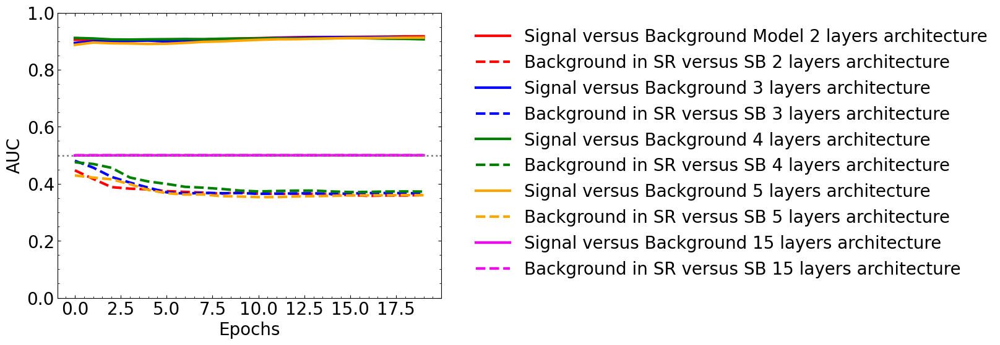

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_2lay,label="Signal versus Background Model 2 layers architecture",linewidth=3,color='red')
plt.plot(num_epochs, aucsSB_2lay,label="Background in SR versus SB 2 layers architecture",ls="--",linewidth=3,color='red')

plt.plot(num_epochs, aucs_3lay,label="Signal versus Background 3 layers architecture",linewidth=3,color='blue')
plt.plot(num_epochs, aucsSB_3lay,label="Background in SR versus SB 3 layers architecture",ls="--",linewidth=3,color='blue')

plt.plot(num_epochs, aucs_4lay,label="Signal versus Background 4 layers architecture",linewidth=3,color='green')
plt.plot(num_epochs, aucsSB_4lay,label="Background in SR versus SB 4 layers architecture",ls="--",linewidth=3,color='green')

plt.plot(num_epochs, aucs_5lay,label="Signal versus Background 5 layers architecture",linewidth=3,color='orange')
plt.plot(num_epochs, aucsSB_5lay,label="Background in SR versus SB 5 layers architecture",ls="--",linewidth=3,color='orange')

plt.plot(num_epochs, aucs_15lay,label="Signal versus Background 15 layers architecture",linewidth=3,color='magenta')
plt.plot(num_epochs, aucsSB_15lay,label="Background in SR versus SB 15 layers architecture",ls="--",linewidth=3,color='magenta')

plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20, bbox_to_anchor=(1.05, 1.0))
plt.tight_layout()
plt.ylim([0,1])

In [ ]:
class AUCRecordsL9(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_9lay, aucsSB_foravg_9lay, aucs_foravg_9lay, aucsSB_foravg_9lay, aucs_9lay, aucs_std_9lay, aucsSB_9lay, aucsSB_std_9lay, num_epochs
        preds_hold_9lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_9lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_9lay = roc_auc_score(Y_test, preds_hold_9lay)
        print(myauc_scan_9lay)
        myaucSB_scan_9lay = roc_auc_score(Y_testSB, preds_holdSB_9lay)
        print(myaucSB_scan_9lay)

        aucs_foravg_9lay += [myauc_scan_9lay]
        print(aucs_foravg_9lay)
        aucsSB_foravg_9lay += [myaucSB_scan_9lay]
        print(aucsSB_foravg_9lay)

        aucs_9lay+=[np.mean(aucs_foravg_9lay)]
        print(aucs_9lay)
        aucs_std_9lay += [np.std(aucs_foravg_9lay)]
        print(aucs_std_9lay)
        aucsSB_9lay+=[np.mean(aucsSB_foravg_9lay)]
        print(aucsSB_9lay)
        aucsSB_std_9lay += [np.std(aucsSB_foravg_9lay)]
        print(aucsSB_std_9lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_9lay = []
    num_epochs = []
    aucs_9lay = []
    aucs_std_9lay = []
    aucsSB_9lay = []
    aucsSB_std_9lay = []
    aucs_foravg_9lay =[]
    aucsSB_foravg_9lay = []

    for k in range(1):
        model_cwola_scan_9lay = Sequential()
        model_cwola_scan_9lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_9lay.add(Dense(100, activation='relu'))
        model_cwola_scan_9lay.add(Dense(64, activation='relu'))
        model_cwola_scan_9lay.add(Dense(100, activation='relu'))
        model_cwola_scan_9lay.add(Dense(64, activation='relu'))
        model_cwola_scan_9lay.add(Dense(100, activation='relu'))
        model_cwola_scan_9lay.add(Dense(64, activation='relu'))
        model_cwola_scan_9lay.add(Dense(100, activation='relu'))
        model_cwola_scan_9lay.add(Dense(64, activation='relu'))
        model_cwola_scan_9lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_9lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_9lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_9lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_9lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_9lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_9lay = X_kcwola_train_9lay[sb_crit]
        Y_kcwola_train_9lay = Y_kcwola_train_9lay[sb_crit]
        W_kcwola_train_9lay = W_kcwola_train_9lay[sb_crit]


        X_kcwola_train_9lay, Y_kcwola_train_9lay, W_kcwola_train_9lay = shuffle(X_kcwola_train_9lay, Y_kcwola_train_9lay,
                                                                       W_kcwola_train_9lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_9lay.fit(norm_func(X_kcwola_train_9lay)[:,1:],Y_kcwola_train_9lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_9lay, verbose=2, callbacks=[AUCRecordsL9()])

        pass


epoch 0
Epoch 1/20
50/50 [==============================] - 0s 6ms/step
0.883314829349443
0.5147983787676553
[0.883314829349443]
[0.5147983787676553]
[0.883314829349443]
[0.0]
[0.5147983787676553]
[0.0]
epoch 0
1627/1627 - 9s - loss: 0.6543 - accuracy: 0.5057 - auc: 0.5068 - val_loss: 0.6863 - val_accuracy: 0.6471 - val_auc: 0.8675 - 9s/epoch - 6ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 5ms/step
0.9087250841734953
0.5036848782340962
[0.883314829349443, 0.9087250841734953]
[0.5147983787676553, 0.5036848782340962]
[0.883314829349443, 0.8960199567614692]
[0.0, 0.012705127412026118]
[0.5147983787676553, 0.5092416285008758]
[0.0, 0.005556750266779542]
epoch 1
1627/1627 - 7s - loss: 0.6542 - accuracy: 0.5091 - auc: 0.5122 - val_loss: 0.6828 - val_accuracy: 0.7912 - val_auc: 0.8929 - 7s/epoch - 4ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 6ms/step
0.9083383111593604
0.4869594887060792
[0.883314829349443, 0.9087250841734953, 0.90833831115

In [ ]:
aucs_9lay = np.asarray(aucs_9lay)
aucs_std_9lay = np.asarray(aucs_std_9lay)

aucsSB_9lay = np.asarray(aucsSB_9lay)
aucsSB_std_9lay = np.asarray(aucsSB_std_9lay)

print(aucs_9lay)
print(aucsSB_9lay)

[0.88331483 0.89601996 0.90012607 0.90191751 0.90377276 0.90202008
 0.90226475 0.9020882  0.90242092 0.90268832 0.90302969 0.90381525
 0.90334076 0.90429619 0.90467677 0.90560633 0.90654373 0.90761799
 0.90840383 0.90908868]
[0.51479838 0.50924163 0.50181425 0.49464232 0.48082059 0.46598129
 0.45223983 0.43410028 0.42028581 0.40958226 0.40042325 0.39427598
 0.38716981 0.38460147 0.38285012 0.38117453 0.37842574 0.37724139
 0.37429653 0.37276731]


<ipython-input-47-e8b06999eb60>:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


(0.0, 1.0)

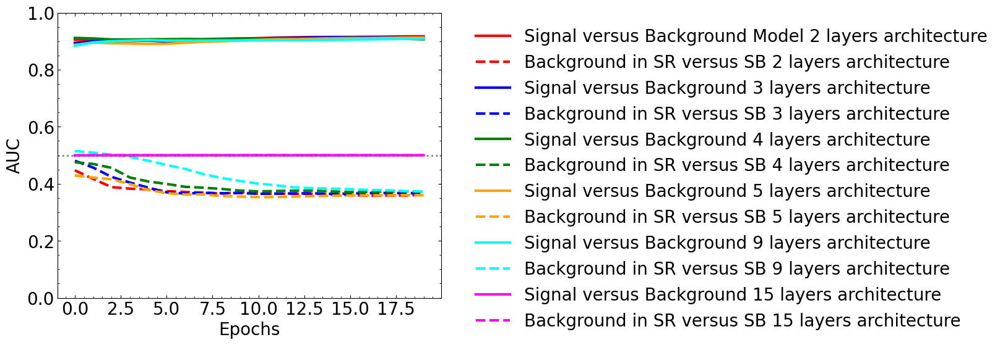

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_2lay,label="Signal versus Background Model 2 layers architecture",linewidth=3,color='red')
plt.plot(num_epochs, aucsSB_2lay,label="Background in SR versus SB 2 layers architecture",ls="--",linewidth=3,color='red')

plt.plot(num_epochs, aucs_3lay,label="Signal versus Background 3 layers architecture",linewidth=3,color='blue')
plt.plot(num_epochs, aucsSB_3lay,label="Background in SR versus SB 3 layers architecture",ls="--",linewidth=3,color='blue')

plt.plot(num_epochs, aucs_4lay,label="Signal versus Background 4 layers architecture",linewidth=3,color='green')
plt.plot(num_epochs, aucsSB_4lay,label="Background in SR versus SB 4 layers architecture",ls="--",linewidth=3,color='green')

plt.plot(num_epochs, aucs_5lay,label="Signal versus Background 5 layers architecture",linewidth=3,color='orange')
plt.plot(num_epochs, aucsSB_5lay,label="Background in SR versus SB 5 layers architecture",ls="--",linewidth=3,color='orange')

plt.plot(num_epochs, aucs_9lay,label="Signal versus Background 9 layers architecture",linewidth=3,color='cyan')
plt.plot(num_epochs, aucsSB_9lay,label="Background in SR versus SB 9 layers architecture",ls="--",linewidth=3,color='cyan')

plt.plot(num_epochs, aucs_15lay,label="Signal versus Background 15 layers architecture",linewidth=3,color='magenta')
plt.plot(num_epochs, aucsSB_15lay,label="Background in SR versus SB 15 layers architecture",ls="--",linewidth=3,color='magenta')

plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20, bbox_to_anchor=(1.05, 1.0))
plt.tight_layout()
plt.ylim([0,1])

In [ ]:
class AUCRecordsL11(Callback, ):
    def on_epoch_begin(self, epoch, logs=None):
        print(f"epoch {epoch}")

    def on_epoch_end(self, epoch, logs=None):
        global aucs_foravg_11lay, aucsSB_foravg_11lay, aucs_foravg_11lay, aucsSB_foravg_11lay, aucs_11lay, aucs_std_11lay, aucsSB_11lay, aucsSB_std_11lay, num_epochs
        preds_hold_11lay = self.model.predict(norm_func(X_test)[:,1:],batch_size=10000)[:,0]
        preds_holdSB_11lay = self.model.predict(norm_func(X_testSB)[:,1:],batch_size=10000)[:,0]
        num_epochs += [epoch]

        myauc_scan_11lay = roc_auc_score(Y_test, preds_hold_11lay)
        print(myauc_scan_11lay)
        myaucSB_scan_11lay = roc_auc_score(Y_testSB, preds_holdSB_11lay)
        print(myaucSB_scan_11lay)

        aucs_foravg_11lay += [myauc_scan_11lay]
        print(aucs_foravg_11lay)
        aucsSB_foravg_11lay += [myaucSB_scan_11lay]
        print(aucsSB_foravg_11lay)

        aucs_11lay+=[np.mean(aucs_foravg_11lay)]
        print(aucs_11lay)
        aucs_std_11lay += [np.std(aucs_foravg_11lay)]
        print(aucs_std_11lay)
        aucsSB_11lay+=[np.mean(aucsSB_foravg_11lay)]
        print(aucsSB_11lay)
        aucsSB_std_11lay += [np.std(aucsSB_foravg_11lay)]
        print(aucsSB_std_11lay)

        print(f"epoch {epoch}")

In [ ]:
    lambdas_11lay = []
    num_epochs = []
    aucs_11lay = []
    aucs_std_11lay = []
    aucsSB_11lay = []
    aucsSB_std_11lay = []
    aucs_foravg_11lay =[]
    aucsSB_foravg_11lay = []

    for k in range(1):
        model_cwola_scan_11lay = Sequential()
        model_cwola_scan_11lay.add(Dense(64, input_dim=4, activation='relu'))
        model_cwola_scan_11lay.add(Dense(100, activation='relu'))
        model_cwola_scan_11lay.add(Dense(64, activation='relu'))
        model_cwola_scan_11lay.add(Dense(100, activation='relu'))
        model_cwola_scan_11lay.add(Dense(64, activation='relu'))
        model_cwola_scan_11lay.add(Dense(100, activation='relu'))
        model_cwola_scan_11lay.add(Dense(64, activation='relu'))
        model_cwola_scan_11lay.add(Dense(100, activation='relu'))
        model_cwola_scan_11lay.add(Dense(64, activation='relu'))
        model_cwola_scan_11lay.add(Dense(100, activation='relu'))
        model_cwola_scan_11lay.add(Dense(64, activation='relu'))
        model_cwola_scan_11lay.add(Dense(1, activation='sigmoid'))
        model_cwola_scan_11lay.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', 'AUC'])

        # Generate training datasets
        SR_signal_to_injectT21 = SR_signals_to_injectT21[k]
        SB_signal_to_injectT21 = SB_signals_to_injectT21[k]

        signal_to_testT21 = signals_to_testT21[k]

        X_kcwola_train_11lay = np.concatenate([
            SR_signal_to_injectT21, SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] < SR_low],
            SB_signal_to_injectT21[SB_signal_to_injectT21[:,0] > SR_high],
            SR_background_dataT21, SB_background_dataT21[SB_background_dataT21[:,0] < SR_low],
            SB_background_dataT21[SB_background_dataT21[:,0] > SR_high],
            SR_background_simT21, SB_background_simT21[SB_background_simT21[:,0] < SR_low],
            SB_background_simT21[SB_background_simT21[:,0] > SR_high]
        ])
        Y_kcwola_train_11lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), np.zeros(len(SB_signal_to_injectT21)),
            np.ones(len(SR_background_dataT21)), np.zeros(len(SB_background_dataT21)),
            np.zeros(len(SR_background_simT21)), np.ones(len(SB_background_simT21))
        ])

        n_low_data = ((SB_background_dataT21[:,0] > (SB_low)) & ((SB_background_dataT21[:,0] <= SR_low))).sum()
        n_low_sim = ((SB_background_simT21[:,0] > (SB_low)) & ((SB_background_simT21[:,0] <= SR_low))).sum()
        n_low_sig = ((SB_signal_to_injectT21[:,0] > (SB_low)) & ((SB_signal_to_injectT21[:,0] <= SR_low))).sum()

        n_hi_data = ((SB_background_dataT21[:,0] < (SB_high)) & ((SB_background_dataT21[:,0] >= SR_high))).sum()
        n_hi_sim = ((SB_background_simT21[:,0] < (SB_high)) & ((SB_background_simT21[:,0] >= SR_high))).sum()
        n_hi_sig = ((SB_signal_to_injectT21[:,0] < (SB_high)) & ((SB_signal_to_injectT21[:,0] >= SR_high))).sum()

        n_sr_data = len(SR_background_dataT21)
        n_sr_sim = len(SR_background_simT21)
        n_sr_sig = len(SR_signal_to_injectT21)

        w_low = 0.5*(n_sr_sig + n_sr_data)/(n_low_sig + n_low_data)
        w_low_sim = 0.5*(n_sr_sim)/(n_low_sim)

        w_high = 0.5*(n_sr_sig + n_sr_data)/(n_hi_sig + n_hi_data)
        w_high_sim = 0.5*(n_sr_sim)/(n_hi_sim)

        W_kcwola_train_11lay = np.concatenate([
            np.ones(len(SR_signal_to_injectT21)), w_low*np.ones((SB_signal_to_injectT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_signal_to_injectT21[:,0] > SR_high).sum()),
            np.ones(len(SR_background_dataT21)), w_low*np.ones((SB_background_dataT21[:,0] <= SR_low).sum()),
            w_high*np.ones((SB_background_dataT21[:,0] > SR_high).sum()),
            myklambda*np.ones(len(SR_background_simT21)),
            w_low_sim*myklambda*np.ones((SB_background_simT21[:,0] <= SR_low).sum()),
            w_high_sim*myklambda*np.ones((SB_background_simT21[:,0] > SR_high).sum())
        ])

        sbmjj = X_kcwola_train_11lay[:,0]
        sb_crit = ((sbmjj > SR_low - SB_width)&(sbmjj <= SR_high + SB_width))

        X_kcwola_train_11lay = X_kcwola_train_11lay[sb_crit]
        Y_kcwola_train_11lay = Y_kcwola_train_11lay[sb_crit]
        W_kcwola_train_11lay = W_kcwola_train_11lay[sb_crit]


        X_kcwola_train_11lay, Y_kcwola_train_11lay, W_kcwola_train_11lay = shuffle(X_kcwola_train_11lay, Y_kcwola_train_11lay,
                                                                       W_kcwola_train_11lay)


        # Generate testing datasets
        X_test = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
        Y_test = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

        X_testSB = np.concatenate([SR_background_data_fortestT21,SB_background_data_fortestT21])
        Y_testSB = np.concatenate([np.ones(len(SR_background_data_fortestT21)),
                                   np.zeros(len(SB_background_data_fortestT21))])

        model_cwola_scan_11lay.fit(norm_func(X_kcwola_train_11lay)[:,1:],Y_kcwola_train_11lay, epochs=EPOCHS,
                               batch_size=batch_size,validation_data=(norm_func(X_test)[:,1:],Y_test),
                               sample_weight=W_kcwola_train_11lay, verbose=2, callbacks=[AUCRecordsL11()])

        pass


epoch 0
Epoch 1/20
50/50 [==============================] - 0s 6ms/step
0.8760972094558952
0.5530763071709272
[0.8760972094558952]
[0.5530763071709272]
[0.8760972094558952]
[0.0]
[0.5530763071709272]
[0.0]
epoch 0
1627/1627 - 11s - loss: 0.6544 - accuracy: 0.4995 - auc: 0.5008 - val_loss: 0.6931 - val_accuracy: 0.5505 - val_auc: 0.5000 - 11s/epoch - 6ms/step
epoch 1
Epoch 2/20
50/50 [==============================] - 0s 7ms/step
0.8300089349147508
0.6107952095013242
[0.8760972094558952, 0.8300089349147508]
[0.5530763071709272, 0.6107952095013242]
[0.8760972094558952, 0.853053072185323]
[0.0, 0.023044137270572196]
[0.5530763071709272, 0.5819357583361257]
[0.0, 0.028859451165198502]
epoch 1
1627/1627 - 8s - loss: 0.6544 - accuracy: 0.4992 - auc: 0.5001 - val_loss: 0.6927 - val_accuracy: 0.5505 - val_auc: 0.5000 - 8s/epoch - 5ms/step
epoch 2
Epoch 3/20
50/50 [==============================] - 0s 7ms/step
0.4999228130706746
0.49973098202284894
[0.8760972094558952, 0.8300089349147508, 0.499

In [ ]:
aucs_11lay = np.asarray(aucs_11lay)
aucs_std_11lay = np.asarray(aucs_std_11lay)

aucsSB_11lay = np.asarray(aucsSB_11lay)
aucsSB_std_11lay = np.asarray(aucsSB_std_11lay)

print(aucs_11lay)
print(aucsSB_11lay)

[0.87609721 0.85305307 0.73534299 0.67650724 0.64120579 0.61767149
 0.60086128 0.58825362 0.57844766 0.5706029  0.56418969 0.55883575
 0.55430992 0.55043476 0.54707244 0.54413042 0.54153451 0.53922704
 0.53716245 0.53530433]
[0.55307631 0.58193576 0.55453417 0.54088213 0.53269114 0.52723047
 0.52334024 0.52042257 0.51815327 0.51633794 0.51485268 0.51361486
 0.51256747 0.5116698  0.51089181 0.51021107 0.50961035 0.50907645
 0.50859874 0.5081688 ]


<ipython-input-51-01994eb5d4ad>:39: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


(0.0, 1.0)

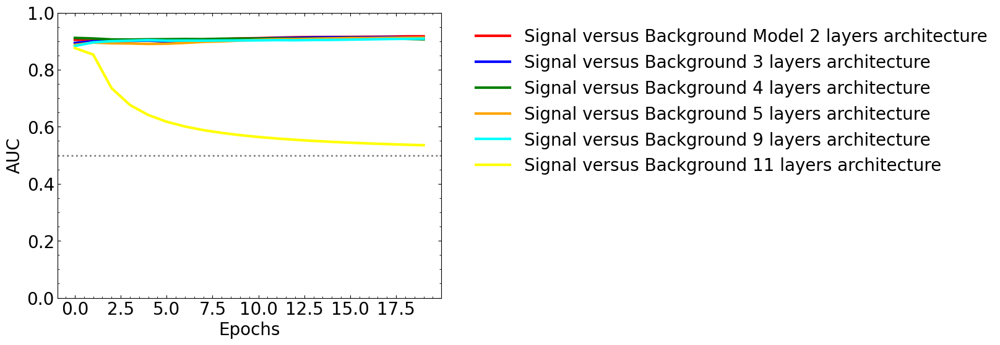

In [ ]:
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(1, 1, height_ratios=[1])
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
ax0.minorticks_on()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(num_epochs, aucs_2lay,label="Signal versus Background Model 2 layers architecture",linewidth=3,color='red')
#plt.plot(num_epochs, aucsSB_2lay,label="Background in SR versus SB 2 layers architecture",ls="--",linewidth=3,color='red')

plt.plot(num_epochs, aucs_3lay,label="Signal versus Background 3 layers architecture",linewidth=3,color='blue')
#plt.plot(num_epochs, aucsSB_3lay,label="Background in SR versus SB 3 layers architecture",ls="--",linewidth=3,color='blue')

plt.plot(num_epochs, aucs_4lay,label="Signal versus Background 4 layers architecture",linewidth=3,color='green')
#plt.plot(num_epochs, aucsSB_4lay,label="Background in SR versus SB 4 layers architecture",ls="--",linewidth=3,color='green')

plt.plot(num_epochs, aucs_5lay,label="Signal versus Background 5 layers architecture",linewidth=3,color='orange')
#plt.plot(num_epochs, aucsSB_5lay,label="Background in SR versus SB 5 layers architecture",ls="--",linewidth=3,color='orange')

plt.plot(num_epochs, aucs_9lay,label="Signal versus Background 9 layers architecture",linewidth=3,color='cyan')
#plt.plot(num_epochs, aucsSB_9lay,label="Background in SR versus SB 9 layers architecture",ls="--",linewidth=3,color='cyan')

plt.plot(num_epochs, aucs_11lay,label="Signal versus Background 11 layers architecture",linewidth=3,color='yellow')
#plt.plot(num_epochs, aucsSB_11lay,label="Background in SR versus SB 11 layers architecture",ls="--",linewidth=3,color='yellow')

#plt.plot(num_epochs, aucs_15lay,label="Signal versus Background 15 layers architecture",linewidth=3,color='magenta')
#plt.plot(num_epochs, aucsSB_15lay,label="Background in SR versus SB 15 layers architecture",ls="--",linewidth=3,color='magenta')



plt.axhline(0.5,linewidth=2, color='gray',ls=":")

plt.xlabel(r'Epochs',fontsize=20)
plt.ylabel(r"AUC",fontsize=20)
plt.legend(frameon=False,fontsize=20, bbox_to_anchor=(1.05, 1.0))
plt.tight_layout()
plt.ylim([0,1])

In [ ]:
from sklearn.model_selection import train_test_split

SR_low = 3.3
SR_high = 3.7
test_size = 0.5
EPOCHS=20
batch_size = 200

def sr_crit(d):
    return (d[:,0] < SR_high) & (d[:,0] >= SR_low)

bg_srsbT21, bg2_srsbT21, sig_srsbT21 = sr_crit(dataset_bgT21), sr_crit(dataset_bg2T21), sr_crit(dataset_sigT21)

SR_background_dataT21 = dataset_bgT21[bg_srsbT21]
SB_background_dataT21 = dataset_bgT21[~bg_srsbT21]

SR_background_simT21 = dataset_bg2T21[bg2_srsbT21]
SB_background_simT21 = dataset_bg2T21[~bg2_srsbT21]

SR_signalT21 = dataset_sigT21[sig_srsbT21]
SB_signalT21 = dataset_sigT21[~sig_srsbT21]

N_inputs = len(SR_background_dataT21.T) - 1


((SR_background_dataT21, SR_background_data_fortestT21),
 (SR_background_simT21, SR_background_sim_fortestT21),
 (SB_background_dataT21, SB_background_data_fortestT21),
 (SB_background_simT21, SB_background_sim_fortestT21),
 ) = [train_test_split(arr, test_size=test_size) for arr in [
    SR_background_dataT21, SR_background_simT21,
    SB_background_dataT21, SB_background_simT21,
]]

mn,mx = np.percentile(np.concatenate([SB_background_dataT21, SB_background_simT21, SR_background_dataT21,
                                      SR_background_simT21]), [1,99], axis=0)

def norm_func(d):
    return (d - mn)/(mx - mn)

Nsig = 1000
Nsig_SB = int(np.round(len(SB_signalT21)*Nsig/len(SR_signalT21)))

fmt = '{:>20}:  {}'
print(fmt.format('# signal events', Nsig))
print(fmt.format('signal significance', len(SR_signalT21[0:Nsig])/len(SR_background_dataT21)**0.5))
print(fmt.format('s/b ratio', len(SR_signalT21[0:Nsig])/len(SR_background_dataT21)))

n_injectionsT21 = 20
SR_signals_to_injectT21 = [None] * n_injectionsT21
SB_signals_to_injectT21 = [None] * n_injectionsT21
signals_to_testT21 = [None] * n_injectionsT21

for i in range(n_injectionsT21):
    idx = np.isin(range(len(SR_signalT21)), np.random.choice(SR_signalT21.shape[0], size=Nsig, replace=False))
    SR_signals_to_injectT21[i] = SR_signalT21[idx, :]
    signals_to_testT21[i] = SR_signalT21[~idx, :]

    idx = np.isin(range(len(SB_signalT21)), np.random.choice(SB_signalT21.shape[0], size=Nsig_SB, replace=False))
    SB_signals_to_injectT21[i] = SB_signalT21[idx, :]

     # signal events:  1000
 signal significance:  4.059677443835412
           s/b ratio:  0.016480980947986026


In [ ]:
#CWoLa with T21 and relu
cwola_rocsT21 = pd.DataFrame(columns=['fpr', 'tpr'])
SB_width = 0.3

for i in tqdm.tqdm(range(n_injectionsT21)):

    SR_signal_to_injectT21 = SR_signals_to_injectT21[i]
    SB_signal_to_injectT21 = SB_signals_to_injectT21[i]

    signal_to_testT21 = signals_to_testT21[i]

    X_cwola_trainT21 = np.concatenate([SR_signal_to_injectT21, SR_background_dataT21, SB_signal_to_injectT21, SB_background_dataT21])
    Y_cwola_trainT21 = np.concatenate([np.ones(len(SR_signal_to_injectT21)), np.ones(len(SR_background_dataT21)),
                                    np.zeros(len(SB_signal_to_injectT21)), np.zeros(len(SB_background_dataT21))])

    X_cwola_trainT21, Y_cwola_trainT21 = shuffle(X_cwola_trainT21, Y_cwola_trainT21, )

    sbmjjT21 = X_cwola_trainT21[:,0]
    sb_critT21 = ((sbmjjT21 > SR_low - SB_width)&(sbmjjT21 <= SR_high + SB_width))

    X_cwola_trainT21 = X_cwola_trainT21[sb_critT21]
    Y_cwola_trainT21 = Y_cwola_trainT21[sb_critT21]

    w_lowT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] <= SR_low).sum())
    w_highT21 = 0.5*(len(SR_signal_to_injectT21) + len(SR_background_dataT21))/((X_cwola_trainT21[:,0] >= SR_high).sum())

    W_cwola_trainT21 = np.ones_like(Y_cwola_trainT21)
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] <= SR_low)] = w_lowT21
    W_cwola_trainT21[(Y_cwola_trainT21 == 0) & (X_cwola_trainT21[:,0] >= SR_high)] = w_highT21

    X_cwola_valT21 = np.concatenate([signal_to_testT21,SR_background_data_fortestT21])
    Y_cwola_valT21 = np.concatenate([np.ones(len(signal_to_testT21)),np.zeros(len(SR_background_data_fortestT21))])

    K.clear_session()
    model_cwolaT21 = Sequential()
    model_cwolaT21.add(Dense(64, input_dim=N_inputs, activation='relu'))
    model_cwolaT21.add(Dense(100, activation='relu'))
    model_cwolaT21.add(Dense(64, activation='relu'))
    model_cwolaT21.add(Dense(100, activation='relu'))
    model_cwolaT21.add(Dense(1, activation='sigmoid'))
    model_cwolaT21.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    hist_cwolaT21 = model_cwolaT21.fit(X_cwola_trainT21[:,1:], Y_cwola_trainT21, epochs=EPOCHS,
                                 batch_size=batch_size, verbose=0, sample_weight=W_cwola_trainT21)

    scores_cwolaT21 = model_cwolaT21.predict(X_cwola_valT21[:,1:],batch_size=batch_size)

    fpr_cwolaT21, tpr_cwolaT21, _ = roc_curve(Y_cwola_valT21, scores_cwolaT21)
    cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)

  0%|          | 0/20 [00:00<?, ?it/s]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
  5%|▌         | 1/20 [01:12<22:54, 72.33s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 10%|█         | 2/20 [02:25<21:51, 72.88s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 15%|█▌        | 3/20 [03:37<20:30, 72.37s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 20%|██        | 4/20 [04:48<19:09, 71.87s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 25%|██▌       | 5/20 [06:00<17:56, 71.78s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 30%|███       | 6/20 [07:10<16:36, 71.17s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 35%|███▌      | 7/20 [08:21<15:25, 71.19s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 40%|████      | 8/20 [09:31<14:10, 70.87s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 45%|████▌     | 9/20 [10:40<12:54, 70.45s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 50%|█████     | 10/20 [11:50<11:41, 70.15s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 55%|█████▌    | 11/20 [13:01<10:32, 70.28s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 60%|██████    | 12/20 [14:11<09:23, 70.40s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 65%|██████▌   | 13/20 [15:21<08:12, 70.36s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 70%|███████   | 14/20 [16:32<07:03, 70.53s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 75%|███████▌  | 15/20 [17:44<05:53, 70.75s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 80%|████████  | 16/20 [18:55<04:43, 70.77s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 85%|████████▌ | 17/20 [20:07<03:33, 71.23s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 90%|█████████ | 18/20 [21:20<02:23, 71.79s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
 95%|█████████▌| 19/20 [22:31<01:11, 71.66s/it]

675/675 [==============================] - 1s 1ms/step


<ipython-input-53-ec4a2f1d9d04>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cwola_rocsT21 = cwola_rocsT21.append({'fpr': fpr_cwolaT21, 'tpr': tpr_cwolaT21}, ignore_index=True)
100%|██████████| 20/20 [23:43<00:00, 71.16s/it]


In [ ]:
 with np.errstate(divide='ignore'):
    tpr_pts = np.linspace(0, 1, 10000)

    # CWoLa T21
    fpr_interp = [None] * len(cwola_rocsT21)

    for i, row in cwola_rocsT21.iterrows():
        fpr, tpr = row
        interp = interpolate.interp1d(tpr, fpr, fill_value=float('nan'), bounds_error=False, assume_sorted=True)

        fpr_pts = interp(tpr_pts)
        fpr_interp[i] = fpr_pts

    fpr_interp = np.ma.masked_invalid(1./np.array(fpr_interp))

    cwola_maxT21 = np.nanmax(fpr_interp, axis=0).data
    cwola_minT21 = np.nanmin(fpr_interp, axis=0).data
    cwola_medT21 = np.median(fpr_interp, axis=0).data
    cwola_meanT21 = np.nanmean(fpr_interp, axis=0).data
    cwola_stdT21 = np.nanstd(fpr_interp, axis=0).data

    sig_interp = np.ma.masked_invalid(np.sqrt(fpr_interp))

    cwola_smeanT21 = np.nanmean(sig_interp, axis=0).data
    cwola_sstdT21 = np.nanstd(sig_interp, axis=0).data




/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


In [ ]:
bands_T21 = {'cwola_T21': (cwola_maxT21, cwola_medT21, cwola_minT21, cwola_meanT21, cwola_stdT21, cwola_smeanT21, cwola_sstdT21, {'label':'$T_{21}$', 'color':'blue'}),}